<pre style="color:#D00000;text-align:center;font-size:150%;font-weight:bold;font-family:Helvetica;background-color:#F9E4D0;border-style: solid;  border-color: coral; border-width: 1px;">
HomeLoanDef Analysis & Prediction
</pre>

 **Domain Perspective**

- Industry:  
  The project is situated within the Finance/Banking sector and focuses on evaluating credit risk and loan eligibility. The analysis helps financial institutions better understand the factors that influence loan performance and default rates.

- Problem Statement:  
  The aim is to analyze extensive loan and credit data to identify the factors or customer segments that determine whether a customer is eligible for a loan or is at risk of defaulting. This insight supports improved decision-making in lending and risk management.

- Objective:  
  The project is built around three key objectives:  
  1. Data Analysis: Develop a comprehensive report that explores and visualizes the underlying patterns in the data.  
  2. Predictive Modeling: Create a model to accurately forecast customer segments that are either eligible for a loan or prone to default.  
  3. Reporting: Deliver a detailed comparison of various models and document the challenges encountered during the analysis along with the strategies applied to overcome them.

 **Data Perspective**

- Data Source:  
  The project utilizes a multi-faceted dataset provided in a zip file (PRCP-1006-HomeLoanDef.zip), which includes various CSV files that capture both the static details of each loan application and dynamic aspects of previous credit histories.

- Key Datasets and Variables:  
  - application_train.csv:  
    Contains static information about each loan application along with the target variable (1 for defaulter; 0 for non-defaulter). Each row represents a single loan.
  
  - bureau.csv:  
    Provides historical data on previous credits taken by the applicants from other financial institutions as reported to the Credit Bureau.
  
  - bureau_balance.csv:  
    Offers monthly balance snapshots for each previous credit recorded in the bureau data.
  
  - POS_CASH_balance.csv:  
    Contains monthly snapshots of previous point-of-sale (POS) and cash loans held by the applicants with Home Credit.
  
  - credit_card_balance.csv:  
    Details monthly balance information for previous credit card accounts that the applicants held with Home Credit.
  
  - previous_application.csv:  
    Documents all past loan applications made by the clients for Home Credit loans.
  
  - installments_payments.csv:  
    Captures the repayment history for previously disbursed loans, including both successful payments and missed installments.

- Target Variable:  
  The primary target is found in application_train.csv and is binary—indicating whether an applicant defaulted (1) or did not default (0).

- Input Variables:  
  The dataset includes a mix of categorical features (such as demographic data and previous loan application outcomes) and numerical features (like monthly balances and payment histories). These variables collectively serve to explain customer credit behavior and aid in predicting loan default risk.


---

# Data Analysis

### Import data

In [1]:
import pandas as pd
at = pd.read_csv(r'D:\datamites\HomeLoanDef\1. data\1.1 raw\application_train.csv')
bu = pd.read_csv(r'D:\datamites\HomeLoanDef\1. data\1.1 raw\bureau.csv')
bub = pd.read_csv(r'D:\datamites\HomeLoanDef\1. data\1.1 raw\bureau_balance.csv')
pc = pd.read_csv(r'D:\datamites\HomeLoanDef\1. data\1.1 raw\POS_CASH_balance.csv')
ccb = pd.read_csv(r'D:\datamites\HomeLoanDef\1. data\1.1 raw\credit_card_balance.csv')
pa = pd.read_csv(r'D:\datamites\HomeLoanDef\1. data\1.1 raw\previous_application.csv')
ip = pd.read_csv(r'D:\datamites\HomeLoanDef\1. data\1.1 raw\installments_payments.csv')

In [2]:
import pandas as pd
from tabulate import tabulate
from IPython.display import display
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', None)

----

### Imports & functions

In [3]:
from insightfulpy.eda import *

In [4]:
import warnings
import logging
warnings.filterwarnings("ignore")
logging.getLogger('matplotlib').setLevel(logging.WARNING)

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
#import dtale
from scipy import stats
from scipy.stats import chi2_contingency, fisher_exact, pearsonr, spearmanr, ttest_ind, mannwhitneyu, shapiro
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import (
    train_test_split, cross_val_score, GridSearchCV, learning_curve
)
from sklearn.preprocessing import (
     LabelEncoder, OneHotEncoder,
)
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.utils import resample, compute_class_weight

In [5]:
import time
import xgboost as xgb
from xgboost import XGBClassifier, XGBRegressor
import lightgbm as lgb
from lightgbm import LGBMClassifier, LGBMRegressor
import catboost as cb
from catboost import CatBoostClassifier, CatBoostRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier, 
    AdaBoostClassifier, HistGradientBoostingClassifier
)
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, precision_recall_curve, 
    roc_curve, auc, ConfusionMatrixDisplay
)
from sklearn.calibration import calibration_curve
import scikitplot as skplt
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import OrdinalEncoder

---

In [6]:
import psutil
import os
import gc

def memory_usage():
    """Prints the current memory usage of the Python process."""
    process = psutil.Process(os.getpid())
    mem_info = process.memory_info()
    print(f"Memory Usage: {mem_info.rss / 1024 ** 2:.2f} MB")

def dataframe_memory_usage():
    """Prints the memory usage of all loaded Pandas DataFrames."""
    datasets = {'application_train': at, 'bureau': bu, 'bureau_balance': bub,
                'POS_CASH_balance': pc, 'credit_card_balance': ccb,
                'previous_application': pa, 'installments_payments': ip}
    for name, df in datasets.items():
        mem_usage = df.memory_usage(deep=True).sum() / 1024 ** 2
        print(f"{name} Memory Usage: {mem_usage:.2f} MB")

def garbage_collection():
    """Performs garbage collection to free up memory."""
    gc.collect()
    memory_usage()

In [7]:
if __name__ == "__main__":
    memory_usage()

Memory Usage: 1103.85 MB


In [8]:
dataframe_memory_usage()

application_train Memory Usage: 536.69 MB
bureau Memory Usage: 512.11 MB
bureau_balance Memory Usage: 1926.61 MB
POS_CASH_balance Memory Usage: 1137.25 MB
credit_card_balance Memory Usage: 875.69 MB
previous_application Memory Usage: 1900.63 MB
installments_payments Memory Usage: 830.41 MB


---

In [9]:
def single_value_columns(df):
    total_entries = df.shape[0]
    single_value_cols = [col for col in df.columns if df[col].nunique() == 1]
    if not single_value_cols:
        print("No columns with a single unique value found.")
        return None
    single_value_summary = pd.DataFrame({
        'Index': range(len(single_value_cols)),
        'Column Name': single_value_cols,
        'Data Type': [df[col].dtype for col in single_value_cols],
        'Missing Percentage': [(df[col].isna().sum() / total_entries) * 100 for col in single_value_cols]
    })
    return single_value_summary

In [10]:
sns.set(style="whitegrid")
def plot_histograms(columns, data):
    plt.figure(figsize=(15, 10))
    for i, col in enumerate(columns, 1):
        plt.subplot(3, 3, i)
        sns.histplot(data[col], kde=True, bins=30, color='skyblue', stat='density')
        plt.title(f'Distribution of {col}')
    plt.tight_layout()
    plt.show()
def plot_boxplots(columns, data):
    plt.figure(figsize=(15, 10))
    for i, col in enumerate(columns, 1):
        plt.subplot(3, 3, i)
        sns.boxplot(x=data[col], color='lightgreen')
        plt.title(f'Boxplot of {col}')
    plt.tight_layout()
    plt.show()
def plot_scatter(columns_x, columns_y, data):
    plt.figure(figsize=(15, 10))
    for i, col_x in enumerate(columns_x):
        for j, col_y in enumerate(columns_y):
            plt.subplot(len(columns_x), len(columns_y), i*len(columns_y)+j+1)
            sns.scatterplot(x=data[col_x], y=data[col_y])
            plt.title(f'{col_x} vs {col_y}')
    plt.tight_layout()
    plt.show()
def plot_bar_plots(columns, data):
    plt.figure(figsize=(15, 10))
    for i, col in enumerate(columns, 1):
        plt.subplot(3, 3, i)
        sns.countplot(x=data[col], palette='Set2')
        plt.title(f'Bar plot of {col}')
    plt.tight_layout()
    plt.show()
def plot_scatter_df(income_and_loan_cols, age_and_employment_cols, at):
    num_income_cols = len(income_and_loan_cols)
    num_age_cols = len(age_and_employment_cols)
    total_plots = num_income_cols * num_age_cols
    fig, axes = plt.subplots(num_income_cols, num_age_cols, figsize=(5 * num_age_cols, 5 * num_income_cols))
    if total_plots > 1:
        axes = axes.flatten()
    else:
        axes = [axes]
    plot_index = 0
    for income_col in income_and_loan_cols:
        for age_col in age_and_employment_cols:
            ax = axes[plot_index]
            sns.scatterplot(x=at[age_col], y=at[income_col], alpha=0.5, ax=ax)
            ax.set_xlabel(age_col.replace('_', ' '))
            ax.set_ylabel(income_col.replace('_', ' '))
            ax.set_title(f"{income_col} vs {age_col}")
            plot_index += 1
    
    plt.tight_layout()
    plt.show()

In [11]:
def reduce_mem_usage(df):
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)  
        else: 
            df[col] = df[col].astype('category')
    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    return df
def reduce_mem_usagewithout_causing_cat(df):
    start_mem = df.memory_usage().sum() / 1024**2
    print(f"Memory usage of dataframe before optimization: {start_mem:.2f} MB")
    for col in df.columns:
        col_type = df[col].dtype
        if col_type in ['int64', 'int32', 'int16', 'int8']: 
            c_min, c_max = df[col].min(), df[col].max()
            if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                df[col] = df[col].astype(np.int8)
            elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                df[col] = df[col].astype(np.int16)
            elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                df[col] = df[col].astype(np.int32)
            else:
                df[col] = df[col].astype(np.int64)
        elif col_type in ['float64', 'float32', 'float16']:
            c_min, c_max = df[col].min(), df[col].max()
            if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                df[col] = df[col].astype(np.float16)
            elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                df[col] = df[col].astype(np.float32)
            else:
                df[col] = df[col].astype(np.float64)
        elif col_type.name == 'category': 
            continue 
    end_mem = df.memory_usage().sum() / 1024**2
    print(f"Memory usage after optimization: {end_mem:.2f} MB")
    print(f"Memory reduction: {100 * (start_mem - end_mem) / start_mem:.2f}%")
    return df
def optimize_data_types(df):
    for col in df.columns:
        if df[col].dtype == 'float64':
            df[col] = df[col].astype('float32')
        elif df[col].dtype == 'int64':
            df[col] = df[col].astype('int32')
    return df

In [12]:
def chi_square_test(data, target_col='y'):
    chi_square_results = {}
    categorical_vars = data.select_dtypes(include=['object', 'category']).columns.tolist()    
    for col in categorical_vars:
        if col == target_col:
            continue        
        contingency_table = pd.crosstab(data[col], data[target_col])        
        # Apply Chi-Square only if the table is larger than 2x2
        if contingency_table.shape != (2, 2):
            chi2, p_value, dof, expected = chi2_contingency(contingency_table)
            if (expected >= 5).all():
                chi_square_results[col] = p_value
                print(f"- {col} (Chi-Square Test): p-value = {p_value:.4f}")    
    return chi_square_results

def fisher_exact_test(data, target_col='y'):
    fisher_exact_results = {}
    categorical_vars = data.select_dtypes(include=['object', 'category']).columns.tolist()   
    for col in categorical_vars:
        if col == target_col:
            continue        
        contingency_table = pd.crosstab(data[col], data[target_col])        
        # Apply Fisherâ€™s Exact Test only for 2x2 tables
        if contingency_table.shape == (2, 2):
            _, p_value = fisher_exact(contingency_table)
            fisher_exact_results[col] = p_value
            print(f"- {col} (Fisher's Exact Test): p-value = {p_value:.4f}")    
    return fisher_exact_results

def spearman_correlation_with_target(data, non_normal_cols, target_col='TARGET', plot=True, table=True):
    if not pd.api.types.is_numeric_dtype(data[target_col]):
        raise ValueError(f"Target column '{target_col}' must be numeric. Please encode it before running this test.")
    correlation_results = {}
    for col in non_normal_cols:
        if col not in data.columns:
            continue 
        coef, p_value = spearmanr(data[col], data[target_col], nan_policy='omit')
        correlation_results[col] = {'Spearman Coefficient': coef, 'p-value': p_value}
    correlation_data = pd.DataFrame(correlation_results).T.dropna()
    correlation_data = correlation_data.sort_values('Spearman Coefficient', ascending=False)
    if target_col in correlation_data.index:
        correlation_data = correlation_data.drop(target_col)
    positive_corr = correlation_data[correlation_data['Spearman Coefficient'] > 0]
    negative_corr = correlation_data[correlation_data['Spearman Coefficient'] < 0]
    if table:
        print(f"\nPositive Spearman Correlations with Target ('{target_col}'):\n")
        for feature, stats in positive_corr.iterrows():
            print(f"- {feature}: Correlation={stats['Spearman Coefficient']:.4f}, p-value={stats['p-value']:.4f}")
        print(f"\nNegative Spearman Correlations with Target ('{target_col}'):\n")
        for feature, stats in negative_corr.iterrows():
            print(f"- {feature}: Correlation={stats['Spearman Coefficient']:.4f}, p-value={stats['p-value']:.4f}")
    if plot:
        plt.figure(figsize=(20, 8))  # Increase figure width to prevent label overlap
        sns.barplot(x=correlation_data.index, y='Spearman Coefficient', data=correlation_data, palette='coolwarm')
        plt.axhline(0, color='black', linestyle='--')
        plt.title(f"Spearman Correlation with Target ('{target_col}')", fontsize=16)
        plt.xlabel("Features", fontsize=14)
        plt.ylabel("Spearman Coefficient", fontsize=14)
        plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate labels for clarity
        plt.subplots_adjust(bottom=0.3)  # Add space below the plot for labels
        plt.tight_layout()
        plt.show()
    return correlation_data

def normality_test_with_skew_kurt(df):
    normal_cols = []
    not_normal_cols = []
    for col in df.select_dtypes(include=[np.number]).columns:
        col_data = df[col].dropna()
        if len(col_data) >= 3:
            if len(col_data) <= 5000:
                stat, p_value = shapiro(col_data)
                test_used = 'Shapiro-Wilk'
            else:
                stat, p_value = kstest(col_data, 'norm', args=(col_data.mean(), col_data.std()))
                test_used = 'Kolmogorov-Smirnov'
            col_skewness = skew(col_data)
            col_kurtosis = kurtosis(col_data)
            result = {
                'Column': col,
                'Test': test_used,
                'Statistic': stat,
                'p_value': p_value,
                'Skewness': col_skewness,
                'Kurtosis': col_kurtosis
            }
            if p_value > 0.05:
                normal_cols.append(result)
            else:
                not_normal_cols.append(result)
    normal_df = (
        pd.DataFrame(normal_cols)
        .sort_values(by='Column') 
        if normal_cols else pd.DataFrame(columns=['Column', 'Test', 'Statistic', 'p_value', 'Skewness', 'Kurtosis'])
    )
    not_normal_df = (
        pd.DataFrame(not_normal_cols)
        .sort_values(by='p_value', ascending=False)  # Sort by p-value descending (near normal to not normal)
        if not_normal_cols else pd.DataFrame(columns=['Column', 'Test', 'Statistic', 'p_value', 'Skewness', 'Kurtosis'])
    )
    print("\nNormal Columns (p > 0.05):")
    display(normal_df)
    print("\nNot Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:")
    display(not_normal_df)
    return normal_df, not_normal_df

def spearman_correlation(data, non_normal_cols, exclude_target=None, multicollinearity_threshold=0.8):
    if non_normal_cols.empty:
        print("\nNo non-normally distributed numerical columns found. Exiting Spearman Correlation.")
        return
    selected_columns = non_normal_cols['Column'].tolist()
    if exclude_target and exclude_target in selected_columns and pd.api.types.is_numeric_dtype(data[exclude_target]):
        selected_columns.remove(exclude_target)
    spearman_corr_matrix = data[selected_columns].corr(method='spearman')
    multicollinear_pairs = []
    for i, col1 in enumerate(selected_columns):
        for col2 in selected_columns[i+1:]:
            coef = spearman_corr_matrix.loc[col1, col2]
            if abs(coef) > multicollinearity_threshold:
                multicollinear_pairs.append((col1, col2, coef))
    print("\nVariables Exhibiting Multicollinearity (|Correlation| > {:.2f}):".format(multicollinearity_threshold))
    if multicollinear_pairs:
        for col1, col2, coef in multicollinear_pairs:
            print(f"- {col1} & {col2}: Correlation={coef:.4f}")
    else:
        print("No multicollinear pairs found.")
    annot_matrix = spearman_corr_matrix.round(2).astype(str)
    num_vars = len(selected_columns)
    fig_size = max(min(24, num_vars * 1.2), 10)  # Keep reasonable bounds
    annot_font_size = max(min(10, 200 / num_vars), 6)  # Smaller font for more variables
    plt.figure(figsize=(fig_size, fig_size * 0.75))
    sns.heatmap(
        spearman_corr_matrix,
        annot=annot_matrix,
        fmt='',
        cmap='coolwarm',
        vmin=-1,
        vmax=1,
        linewidths=0.5,
        annot_kws={"size": annot_font_size},
        cbar_kws={"shrink": 0.8}
    )
    plt.title('Spearman Correlation Matrix', fontsize=18)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(rotation=0, fontsize=12)
    plt.tight_layout()
    plt.show()
    
def calculate_vif(data, exclude_target='TARGET', multicollinearity_threshold=5.0):
    # Select only numeric columns, exclude target, and drop rows with missing values
    numeric_data = data.select_dtypes(include=[np.number]).drop(columns=[exclude_target], errors='ignore').dropna()
    vif_data = pd.DataFrame()
    vif_data['Feature'] = numeric_data.columns
    vif_data['VIF'] = [variance_inflation_factor(numeric_data.values, i) 
                       for i in range(numeric_data.shape[1])]
    vif_data = vif_data.sort_values('VIF', ascending=False).reset_index(drop=True)
    high_vif = vif_data[vif_data['VIF'] > multicollinearity_threshold]
    low_vif = vif_data[vif_data['VIF'] <= multicollinearity_threshold]
    print(f"\nVariance Inflation Factor (VIF) Scores (multicollinearity_threshold = {multicollinearity_threshold}):")
    print("\nFeatures with VIF > threshold (High Multicollinearity):")
    if not high_vif.empty:
        print(high_vif.to_string(index=False))
    else:
        print("None. No features exceed the VIF threshold.")
    print("\nFeatures with VIF <= threshold (Low/No Multicollinearity):")
    if not low_vif.empty:
        print(low_vif.to_string(index=False))
    else:
        print("None. All features exceed the VIF threshold.")
    return vif_data, high_vif['Feature'].tolist()

---

## Data understanding 

**Abbreviations for Datasets**
- **`at`** → `application_train.csv`
- **`bu`** → `bureau.csv`
- **`bub`** → `bureau_balance.csv`
- **`pc`** → `POS_CASH_balance.csv`
- **`ccb`** → `credit_card_balance.csv`
- **`pa`** → `previous_application.csv`
- **`ip`** → `installments_payments.csv`

---

In [13]:
dataframes0 = {
    'at': at,
    'bu': bu,
    "bub": bub,
    'pc': pc,
    'ccb': ccb,
    'pa': pa,
    'ip': ip
}

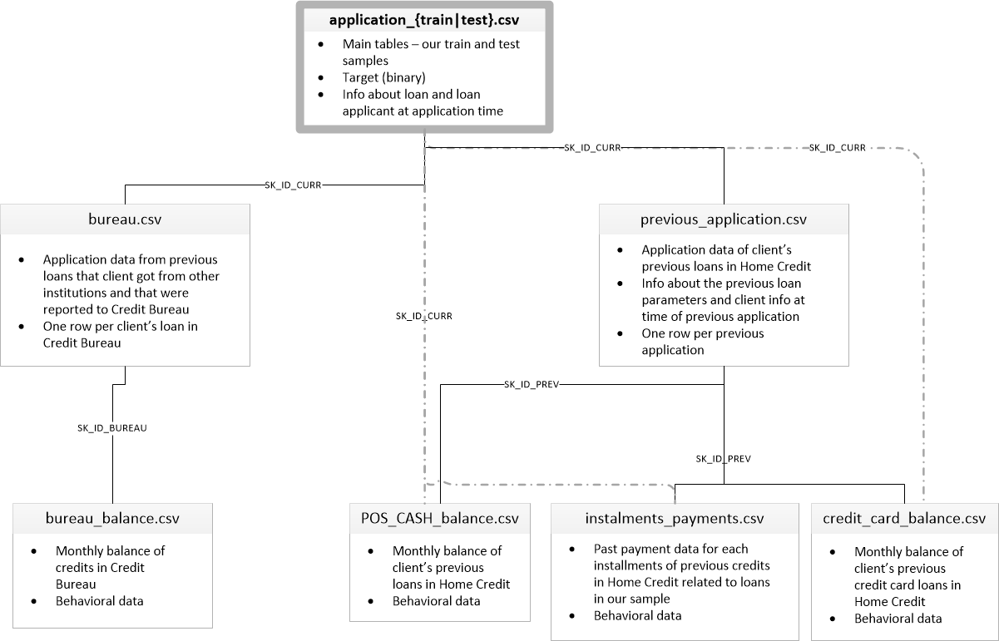


Figure 1: Dataset Relationships in Home Credit Default Risk
Source: Kaggle. Available at [https://www.kaggle.com/competitions/home-credit-default-risk/data](https://www.kaggle.com/competitions/home-credit-default-risk/data).


In [14]:
linked_key(dataframes0)

,Dataset,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,at,307511,122,9152465,24.40,1444410,3.85,1268215,3.38,"float64: 65, int64: 41, object: 16"
1,bu,1716428,17,3939947,13.50,5531078,18.96,868752,2.98,"float64: 8, int64: 6, object: 3"
2,bub,27299925,3,0,0.00,26688960,32.59,0,0.00,"int64: 2, object: 1"
3,pc,10001358,8,52158,0.07,10001358,12.50,1602703,2.00,"int64: 5, float64: 2, object: 1"
4,ccb,3840312,23,5877356,6.65,4063757,4.60,5063513,5.73,"float64: 15, int64: 7, object: 1"
5,pa,1670214,37,11109336,17.98,5687454,9.20,1707804,2.76,"object: 16, float64: 15, int64: 6"
6,ip,13605401,8,5810,0.01,27207897,25.00,4554831,4.18,"float64: 5, int64: 3"
7,Total,58441149,218,30137072,6.18,80624914,16.54,15065818,3.09,"float64: 110, int64: 70, object: 38"



### Link Columns (Common Columns Across DataFrames):

- SK_ID_CURR: at, bu, pc, ccb, pa, ip
- NAME_CONTRACT_TYPE: at, pa
- AMT_CREDIT: at, pa
- AMT_ANNUITY: at, bu, pa
- AMT_GOODS_PRICE: at, pa
- NAME_TYPE_SUITE: at, pa
- WEEKDAY_APPR_PROCESS_START: at, pa
- HOUR_APPR_PROCESS_START: at, pa
- SK_ID_BUREAU: bu, bub
- MONTHS_BALANCE: bub, pc, ccb
- SK_ID_PREV: pc, ccb, pa, ip
- NAME_CONTRACT_STATUS: pc, ccb, pa
- SK_DPD: pc, ccb
- SK_DPD_DEF: pc, ccb


In [15]:
relation_keys = ['SK_ID_CURR','NAME_CONTRACT_TYPE','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','NAME_TYPE_SUITE',
                'WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START','SK_ID_BUREAU','MONTHS_BALANCE','SK_ID_PREV',
                'NAME_CONTRACT_STATUS','SK_DPD','SK_DPD_DEF']

---

In [16]:
at = reduce_mem_usage(at)
pc = reduce_mem_usage(pc)
ccb = reduce_mem_usage(ccb)
pa = reduce_mem_usage(pa)
ip = reduce_mem_usage(ip)

Memory usage of dataframe is 286.23 MB
Memory usage after optimization is 59.54 MB
Decreased by 79.2%
Memory usage of dataframe is 610.43 MB
Memory usage after optimization is 171.69 MB
Decreased by 71.9%
Memory usage of dataframe is 673.88 MB
Memory usage after optimization is 263.69 MB
Decreased by 60.9%
Memory usage of dataframe is 471.48 MB
Memory usage after optimization is 130.62 MB
Decreased by 72.3%
Memory usage of dataframe is 830.41 MB
Memory usage after optimization is 311.40 MB
Decreased by 62.5%


In [17]:
bu = reduce_mem_usage(bu)
bub = reduce_mem_usage(bub)
bu_bub = pd.merge(bu, bub, on='SK_ID_BUREAU', how='left')

Memory usage of dataframe is 222.62 MB
Memory usage after optimization is 78.57 MB
Decreased by 64.7%
Memory usage of dataframe is 624.85 MB
Memory usage after optimization is 156.21 MB
Decreased by 75.0%


---

In [18]:
dataframes = {
    'at': at,
    "bu_bub": bu_bub,
    'pc': pc,
    'ccb': ccb,
    'pa': pa,
    'ip': ip
}

### 1 application_train

dataset domain prespective,

1. Identifiers & Outcome: This includes the unique identifier SK_ID_CURR for each application linked to the TARGET outcome that records if an applicant defaulted.

2. Contract & Application Details: Variables such as NAME_CONTRACT_TYPE and NAME_TYPE_SUITE categorize the loan type and accompanying persons, while FLAG_DOCUMENT series reflect the documentation provided.

3. Personal & Demographic Information: Includes demographics such as gender and family size (CODE_GENDER, CNT_CHILDREN), and socio-economic indicators like income type and education (NAME_INCOME_TYPE, NAME_EDUCATION_TYPE).

4. Financial Metrics: This includes the applicant’s income, loan amount, annuity, and goods price (AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, AMT_GOODS_PRICE), along with external ratings (EXT_SOURCE series) that evaluate creditworthiness.

5. Employment, Registration & Identification: Features like DAYS_EMPLOYED reflect employment duration, while DAYS_REGISTRATION and DAYS_ID_PUBLISH indicate the time since registration and ID documentation was last updated.

6. Contact & Communication Indicators: Flags like FLAG_MOBIL and FLAG_EMP_PHONE assess communication reliability, and DAYS_LAST_PHONE_CHANGE notes the recency of phone information updates.

7. Regional & Geographical Details: Metrics such as REGION_POPULATION_RELATIVE and REGION_RATING_CLIENT provide insights into the regional economic context, while variables like REG_REGION_NOT_LIVE_REGION highlight geographical consistencies or discrepancies.

8. Property & Housing Characteristics: Details regarding property type and condition are given through variables like APARTMENTS, BASEMENTAREA, and YEARS_BUILD, offering insights into property valuation and quality.

9. Social & Behavioral Metrics: Variables such as OBS_30_CNT_SOCIAL_CIRCLE and DEF_30_CNT_SOCIAL_CIRCLE analyze the applicant’s social interactions and behavioral patterns, which can be indicative of credit risk.


In [19]:
base_profile_df, linked_profiles_df = compare_df_columns('at', dataframes)
display_key_columns('at', dataframes)

| Column                     | Linked DataFrames       |
|:---------------------------|:------------------------|
| SK_ID_CURR                 | bu_bub, pc, ccb, pa, ip |
| NAME_CONTRACT_TYPE         | pa                      |
| AMT_CREDIT                 | pa                      |
| AMT_ANNUITY                | bu_bub, pa              |
| AMT_GOODS_PRICE            | pa                      |
| NAME_TYPE_SUITE            | pa                      |
| WEEKDAY_APPR_PROCESS_START | pa                      |
| HOUR_APPR_PROCESS_START    | pa                      |


In [20]:
base_profile_df

,Dataset,Column,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,at,SK_ID_CURR,307511,1,0,0.00%,0,N/A,0,0.00%,int32
1,at,NAME_CONTRACT_TYPE,307511,1,0,0.00%,N/A,N/A,N/A,N/A,category
2,at,AMT_CREDIT,307511,1,0,0.00%,0,N/A,6562,2.13%,float32
3,at,AMT_ANNUITY,307511,1,12,0.00%,0,N/A,7504,2.44%,float32
4,at,AMT_GOODS_PRICE,307511,1,278,0.09%,0,N/A,14728,4.79%,float32
5,at,NAME_TYPE_SUITE,307511,1,1292,0.42%,N/A,N/A,N/A,N/A,category
6,at,WEEKDAY_APPR_PROCESS_START,307511,1,0,0.00%,N/A,N/A,N/A,N/A,category
7,at,HOUR_APPR_PROCESS_START,307511,1,0,0.00%,0,N/A,2257,0.73%,int8


In [21]:
linked_profiles_df

,Dataset,Column,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,bu_bub,SK_ID_CURR,25121815,1,0,0.00%,0,N/A,0,0.00%,int32
1,pc,SK_ID_CURR,10001358,1,0,0.00%,0,N/A,0,0.00%,int32
2,ccb,SK_ID_CURR,3840312,1,0,0.00%,0,N/A,0,0.00%,int32
3,pa,SK_ID_CURR,1670214,1,0,0.00%,0,N/A,0,0.00%,int32
4,ip,SK_ID_CURR,13605401,1,0,0.00%,0,N/A,0,0.00%,int32
5,pa,NAME_CONTRACT_TYPE,1670214,1,0,0.00%,N/A,N/A,N/A,N/A,category
6,pa,AMT_CREDIT,1670214,1,1,0.00%,0,N/A,179989,10.78%,float32
7,bu_bub,AMT_ANNUITY,25121815,1,10495530,41.78%,0,N/A,1832101,7.29%,float32
8,pa,AMT_ANNUITY,1670214,1,372235,22.29%,0,N/A,82762,4.96%,float32
9,pa,AMT_GOODS_PRICE,1670214,1,385515,23.08%,0,N/A,145715,8.72%,float32


In [22]:
at_linked_cols = [
    'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_CREDIT', 'AMT_ANNUITY', 
    'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'WEEKDAY_APPR_PROCESS_START', 
    'HOUR_APPR_PROCESS_START'
]

---

In [23]:
print(at.shape)
for idx, col in enumerate(at.columns):
        print(f"{idx}: {col}")

(307511, 122)
0: SK_ID_CURR
1: TARGET
2: NAME_CONTRACT_TYPE
3: CODE_GENDER
4: FLAG_OWN_CAR
5: FLAG_OWN_REALTY
6: CNT_CHILDREN
7: AMT_INCOME_TOTAL
8: AMT_CREDIT
9: AMT_ANNUITY
10: AMT_GOODS_PRICE
11: NAME_TYPE_SUITE
12: NAME_INCOME_TYPE
13: NAME_EDUCATION_TYPE
14: NAME_FAMILY_STATUS
15: NAME_HOUSING_TYPE
16: REGION_POPULATION_RELATIVE
17: DAYS_BIRTH
18: DAYS_EMPLOYED
19: DAYS_REGISTRATION
20: DAYS_ID_PUBLISH
21: OWN_CAR_AGE
22: FLAG_MOBIL
23: FLAG_EMP_PHONE
24: FLAG_WORK_PHONE
25: FLAG_CONT_MOBILE
26: FLAG_PHONE
27: FLAG_EMAIL
28: OCCUPATION_TYPE
29: CNT_FAM_MEMBERS
30: REGION_RATING_CLIENT
31: REGION_RATING_CLIENT_W_CITY
32: WEEKDAY_APPR_PROCESS_START
33: HOUR_APPR_PROCESS_START
34: REG_REGION_NOT_LIVE_REGION
35: REG_REGION_NOT_WORK_REGION
36: LIVE_REGION_NOT_WORK_REGION
37: REG_CITY_NOT_LIVE_CITY
38: REG_CITY_NOT_WORK_CITY
39: LIVE_CITY_NOT_WORK_CITY
40: ORGANIZATION_TYPE
41: EXT_SOURCE_1
42: EXT_SOURCE_2
43: EXT_SOURCE_3
44: APARTMENTS_AVG
45: BASEMENTAREA_AVG
46: YEARS_BEGINEXPLUATA

In [24]:
detect_mixed_data_types(at)

'No mixed data types detected!'

In [25]:
cat_high_cardinality(at)

high_cardinality_columns


['ORGANIZATION_TYPE']

In [26]:
at.dtypes.value_counts()

float16     61
int8        37
float32      4
int32        2
int16        2
category     2
category     1
category     1
category     1
category     1
category     1
category     1
category     1
category     1
category     1
category     1
category     1
category     1
category     1
category     1
Name: count, dtype: int64

In [27]:
missing_inf_values(at)
print(f"\nNumber of duplicate rows: {at.duplicated().sum()}\n")
duplicates = at[at.duplicated()]
duplicates

Missing Values Summary:
                             Data Type  Missing Count  Missing Percentage
COMMONAREA_MEDI                float16         214865           69.872297
COMMONAREA_AVG                 float16         214865           69.872297
COMMONAREA_MODE                float16         214865           69.872297
NONLIVINGAPARTMENTS_MODE       float16         213514           69.432963
NONLIVINGAPARTMENTS_AVG        float16         213514           69.432963
NONLIVINGAPARTMENTS_MEDI       float16         213514           69.432963
FONDKAPREMONT_MODE            category         210295           68.386172
LIVINGAPARTMENTS_MODE          float16         210199           68.354953
LIVINGAPARTMENTS_AVG           float16         210199           68.354953
LIVINGAPARTMENTS_MEDI          float16         210199           68.354953
FLOORSMIN_AVG                  float16         208642           67.848630
FLOORSMIN_MODE                 float16         208642           67.848630
FLOORSMIN_MEDI

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


in a wide array of personal, financial, and property-related information about applicants. One key feature is the 'ORGANIZATION_TYPE' column, which indicates a broad range of employers, reflecting the diverse economic backgrounds of the applicants. This diversity is significant as it can influence the financial stability of the borrowers.

However, the dataset faces a major challenge with the significant amount of missing data, especially concerning the property characteristics and amenities. This issue is critical because accurate assessments of property values and living conditions are crucial for predicting loan repayment behaviors. Notably, about 69% of data related to common areas and living apartments is missing, which complicates any comprehensive analysis.

On a positive note, the dataset is clean with no infinite values or duplicate rows, which simplifies the preliminary data cleaning processes. Properly addressing the missing data will be essential in ensuring the accuracy and reliability of any predictive models that will be developed from this dataset.

In [28]:
columns_info("Dataset Overview", at)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     2          NAME_CONTRACT_TYPE             category        N/A                            2
2     3          CODE_GENDER                    category        N/A                            3
3     4          FLAG_OWN_CAR                   category        N/A                            2
4     5          FLAG_OWN_REALTY                category        N/A                            2
5     11         NAME_TYPE_SUITE                category        N/A                            7
6     12         NAME_INCOME_TYPE               category        N/A                            8
7     13         NAME_EDUCATION_TYPE            category        N/A                            5
8     14         NAME_FAMILY_STATUS             category   

In [29]:
analyze_data(at)





















































































































































































































=== Numerical Analysis ===
|     | Variable                     |      N |        Mean |          SD |       SE |   95% Conf. |    Interval |
|----:|:-----------------------------|-------:|------------:|------------:|---------:|------------:|------------:|
|   0 | SK_ID_CURR                   | 307511 | 278181      | 102790      | 185.362  | 277817      | 278544      |
|   1 | TARGET                       | 307511 |      0.0807 |      0.2724 |   0.0005 |      0.0798 |      0.0817 |
|   2 | CNT_CHILDREN                 | 307511 |      0.4171 |      0.7221 |   0.0013 |      0.4145 |      0.4196 |
|   3 | AMT_INCOME_TOTAL             | 307511 | 168798      | 237123      | 427.606  | 167960      | 169636      |
|   4 | AMT_CREDIT                   | 307511 | 599026      | 402491   


Value counts and percentages for Target:

|   Target |   Count |   % Total |
|---------:|--------:|----------:|
|        0 |  282686 |     91.93 |
|        1 |   24825 |      8.07 |


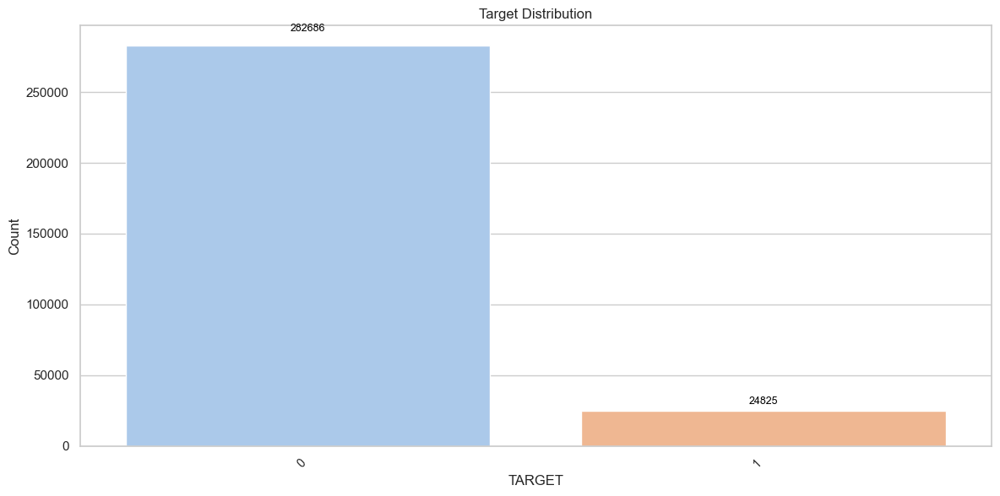

In [30]:
cat_analyze_and_plot(at, 'TARGET', subplot=False)

In the dataset for the home loan application, the distribution of the 'Target' variable, which indicates whether an applicant defaulted on their loan, shows a significant imbalance between non-defaulters and defaulters. Specifically, out of the total applications:

- 282,686 applicants, or 91.93%, did not default on their loans.
- 24,825 applicants, representing 8.07%, were defaulters.

This skew towards non-defaulters is typical in credit risk datasets but presents a challenge for predictive modeling, as it can lead to models that are biased towards predicting the majority class. Special techniques such as oversampling the minority class, undersampling the majority class, or using advanced algorithms designed to handle imbalanced data might be necessary to accurately predict loan default risk.

---

In [31]:
at_normal_df, at_not_normal_df = normality_test_with_skew_kurt(at)


Normal Columns (p > 0.05):


,Column,Test,Statistic,p_value,Skewness,Kurtosis



Not Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:


,Column,Test,Statistic,p_value,Skewness,Kurtosis
0,SK_ID_CURR,Kolmogorov-Smirnov,0.057265,0.0,-0.001200,-1.198988e+00
27,REG_CITY_NOT_WORK_CITY,Kolmogorov-Smirnov,0.477438,0.0,1.280131,-3.612640e-01
80,FLAG_DOCUMENT_2,Kolmogorov-Smirnov,0.502552,0.0,153.791067,2.364969e+04
81,FLAG_DOCUMENT_3,Kolmogorov-Smirnov,0.448633,0.0,-0.925720,-1.143042e+00
82,FLAG_DOCUMENT_4,Kolmogorov-Smirnov,0.503516,0.0,110.893823,1.229544e+04
83,FLAG_DOCUMENT_5,Kolmogorov-Smirnov,0.534181,0.0,7.948283,6.117520e+01
84,FLAG_DOCUMENT_6,Kolmogorov-Smirnov,0.533944,0.0,2.907412,6.453046e+00
85,FLAG_DOCUMENT_7,Kolmogorov-Smirnov,0.505334,0.0,72.173756,5.207051e+03
86,FLAG_DOCUMENT_8,Kolmogorov-Smirnov,0.535632,0.0,3.062226,7.377228e+00
87,FLAG_DOCUMENT_9,Kolmogorov-Smirnov,0.521037,0.0,15.927677,2.516909e+02


In [32]:
num_summary(at)

,Count,Unique,Mean,Std,Min,25%,50%,75%,Max,Mode,Range,IQR,Variance,Skewness,Kurtosis,Shapiro-Wilk Stat,Shapiro-Wilk p-value
SK_ID_CURR,307511.0,307511.0,278180.518600,102790.175300,1.000020e+05,1.891455e+05,2.782020e+05,3.671425e+05,4.562550e+05,100002.000000,3.562530e+05,1.779970e+05,1.056582e+10,-0.001200,-1.1990,0.9550,0.0
TARGET,307511.0,2.0,0.080700,0.272400,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000,1.000000e+00,0.000000e+00,7.420000e-02,3.078200,7.4751,0.3020,0.0
CNT_CHILDREN,307511.0,15.0,0.417100,0.722100,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.900000e+01,0.000000,1.900000e+01,1.000000e+00,5.215000e-01,1.974600,7.9041,0.6205,0.0
AMT_INCOME_TOTAL,307511.0,2548.0,168797.921875,237123.156250,2.565000e+04,1.125000e+05,1.471500e+05,2.025000e+05,1.170000e+08,135000.000000,1.169744e+08,9.000000e+04,5.622739e+10,391.559601,191786.5625,0.1376,0.0
AMT_CREDIT,307511.0,5603.0,599025.937500,402490.781250,4.500000e+04,2.700000e+05,5.135310e+05,8.086500e+05,4.050000e+06,450000.000000,4.005000e+06,5.386500e+05,1.619988e+11,1.234800,1.9340,0.9058,0.0
AMT_ANNUITY,307499.0,13672.0,27108.572266,14493.737305,1.615500e+03,1.652400e+04,2.490300e+04,3.459600e+04,2.580255e+05,9000.000000,2.564100e+05,1.807200e+04,2.100684e+08,1.579800,7.7073,NaN,1.0
AMT_GOODS_PRICE,307233.0,1002.0,538396.125000,369446.468750,4.050000e+04,2.385000e+05,4.500000e+05,6.795000e+05,4.050000e+06,450000.000000,4.009500e+06,4.410000e+05,1.364907e+11,1.349000,2.4319,NaN,1.0
REGION_POPULATION_RELATIVE,307511.0,81.0,0.000000,0.000000,2.999306e-04,1.000000e-02,1.879883e-02,2.870000e-02,7.250977e-02,0.035797,7.220459e-02,1.860000e-02,0.000000e+00,NaN,NaN,0.8767,0.0
DAYS_BIRTH,307511.0,17460.0,-16036.995100,4363.988600,-2.522900e+04,-1.968200e+04,-1.575000e+04,-1.241300e+04,-7.489000e+03,-13749.000000,1.774000e+04,7.269000e+03,1.904440e+07,-0.115700,-1.0491,0.9697,0.0
DAYS_EMPLOYED,307511.0,12574.0,63815.045900,141275.766500,-1.791200e+04,-2.760000e+03,-1.213000e+03,-2.890000e+02,3.652430e+05,365243.000000,3.831550e+05,2.471000e+03,1.995884e+10,1.664300,0.7716,0.4805,0.0


The dataset's analysis via the Kolmogorov-Smirnov test highlights significant deviations from normal distribution across various variables, with identification numbers and binary indicators like the FLAG_DOCUMENT series showing the most substantial deviations. This is expected since IDs are unique and document flags are typically binary, not adhering to normal distribution patterns. City-related variables also display pronounced deviations due to socio-economic factors influencing where individuals live versus work.

Financial variables such as income, credit amounts, and annuities exhibit high skewness and kurtosis, indicating a broad range in applicant financial statuses and the presence of outliers, suggesting that some applicants have substantially higher income or loan amounts. Employment and demographic details like DAYS_EMPLOYED and DAYS_BIRTH underscore the diversity in applicant backgrounds, reflecting varied job stability and age distribution among the applicants.

The dataset provides a comprehensive look at the financial and demographic characteristics of loan applicants, evidenced by various statistical measures. For instance, the SK_ID_CURR variable uniquely identifies each application, demonstrating a wide range due to the large count of unique identifiers. The TARGET variable, which shows loan default status, indicates a significant imbalance with only about 8.07% of applicants defaulting on loans. This skewness towards non-defaulters is highlighted by a kurtosis value of 7.4751, suggesting a peak in the distribution towards the non-default status.

Financial attributes like AMT_INCOME_TOTAL and AMT_CREDIT display a high level of variability, with standard deviations of 237123.156250 and 402490.781250 respectively, pointing to a wide range in the amounts of income and credit reported. The income variable is particularly skewed (skewness = 391.559601), indicating a concentration of applicants with lower income levels and fewer high earners. The kurtosis of this variable is extremely high (191786.5625), reflecting a sharp peak in the income distribution, which corroborates the presence of outliers, as also seen in its maximum value being significantly higher than the mean.

Demographic details provided by DAYS_BIRTH and DAYS_EMPLOYED show the age and employment duration, with DAYS_BIRTH displaying a mean of approximately -16037 days (or around 44 years old when converted to positive values). The negative skew (-0.1157) in DAYS_BIRTH indicates that the distribution is slightly weighted towards younger applicants. In contrast, DAYS_EMPLOYED has an extreme positive skew (1.6643) and a high kurtosis (0.7716), suggesting a concentration of values at the lower end of the scale but with potential outliers indicating unusually long employment durations.

For documentation, the FLAG_DOCUMENT series exhibits largely binary distributions with extreme kurtosis values, indicating that most applicants do not submit additional documents, but a few outliers do. For instance, FLAG_DOCUMENT_3, which is the most common document submitted, shows a skewness of -0.9257, indicating that more applicants tend to submit this document than not.

The dataset is rich with information but also complex due to the wide range of values, significant skewness, and kurtosis in many variables, highlighting the diverse financial conditions and demographic factors of the loan applicants. This complexity needs careful handling during analysis to ensure accurate predictions and interpretations.

In [33]:
cat_summary(at)

,Count,Unique,Top,Freq,Top %
NAME_CONTRACT_TYPE,307511,2,Cash loans,278232,90.48%
CODE_GENDER,307511,3,F,202448,65.83%
FLAG_OWN_CAR,307511,2,N,202924,65.99%
FLAG_OWN_REALTY,307511,2,Y,213312,69.37%
NAME_TYPE_SUITE,306219,7,Unaccompanied,248526,81.16%
NAME_INCOME_TYPE,307511,8,Working,158774,51.63%
NAME_EDUCATION_TYPE,307511,5,Secondary / secondary special,218391,71.02%
NAME_FAMILY_STATUS,307511,6,Married,196432,63.88%
NAME_HOUSING_TYPE,307511,6,House / apartment,272868,88.73%
OCCUPATION_TYPE,211120,18,Laborers,55186,26.14%


The dataset encapsulates various categorical variables, highlighting predominant trends and preferences among loan applicants. For instance, NAME_CONTRACT_TYPE data shows a strong preference for cash loans, which make up 90.48% of all loans, signifying that most applicants opt for this traditional financing mode. Gender distribution within the dataset leans significantly towards females, who constitute 65.83% of applicants, underpinning the demographic skew in the loan application data.

Ownership details reveal that a majority of applicants do not own a car (65.99%) but do own realty (69.37%), suggesting a prioritization of real estate investment over vehicles among the applicants. The most common living arrangement, as depicted by NAME_HOUSING_TYPE, is living in a house or apartment, which encompasses 88.73% of the cases, indicating a stable living condition for the majority of the borrowers.

When it comes to employment, OCCUPATION_TYPE data highlights that laborers form the largest group, making up 26.14% of those employed, pointing to a significant portion of the workforce engaged in manual or unskilled labor. Regarding income sources, over half of the applicants (51.63%) are categorized under 'Working', showing that a substantial segment of the applicants are employed in various capacities.

Educational background predominantly features 'Secondary / secondary special' as the most reported education level, accounting for 71.02% of the total, suggesting a general level of education among applicants without a significant proportion attaining higher education. Marital status is primarily 'Married' for 63.88% of applicants, implying that most borrowers have familial commitments.

Organizational ties are also noteworthy, with 'Business Entity Type 3' being the most common organization type listed, accounting for 22.11% of cases. This might reflect the prevalent industry or business structures where these applicants are employed.

Further detailed variables like FONDKAPREMONT_MODE, HOUSETYPE_MODE, WALLSMATERIAL_MODE, and EMERGENCYSTATE_MODE provide insights into the living standards and infrastructural affiliations of the applicants, with the majority residing in block of flats (98.23%) that are made predominantly of panel materials (43.69%) and are generally not classified as being in a state of emergency (98.56%). Such specifics help delineate the socio-economic backdrop of the applicant pool, which can be pivotal in understanding their financial behavior and stability.

In [34]:
at_outlier_summary, at_non_outlier_summary = comp_num_analysis(at, outlier_df=True)
at_missing_summary, at_non_missing_summary = comp_num_analysis(at, missing_df=True)
at_cat_missing_summary, at_cat_non_missing_summary = comp_cat_analysis(at, missing_df=True)
at_cat_missing_summary = at_cat_missing_summary.sort_values(by="Unique_Count", ascending=False)
at_cat_non_missing_summary = at_cat_non_missing_summary.sort_values(by="Unique_Count", ascending=False)
print(at_cat_missing_summary.shape)
print(at_missing_summary.shape)
print(at_outlier_summary.shape)

(6, 9)
(61, 31)
(98, 31)


In [35]:
at_outlier_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
13,22,FLAG_MOBIL,int8,307511,0.000000,2,0.00000,1.000000,1.000000,1.000000,1.000000e+00,1.000000,1.000000e+00,0.000000,1.000000,1.000000e+00,2,1,1,0.000325,0,0,0.000000,0.999997,3.251916e-06,0.001803,-554.534039,3.075060e+05,Kolmogorov-Smirnov,0.500716,0.0
90,106,FLAG_DOCUMENT_12,int8,307511,0.000000,2,0.00000,0.000000,0.000000,0.000000,1.000000e+00,0.000000,1.000000e+00,0.000000,0.000000,0.000000e+00,2,1,2,0.000650,0,0,0.000000,0.000007,6.503811e-06,0.002550,392.112866,1.537505e+05,Kolmogorov-Smirnov,0.501011,0.0
88,104,FLAG_DOCUMENT_10,int8,307511,0.000000,2,0.00000,0.000000,0.000000,0.000000,1.000000e+00,0.000000,1.000000e+00,0.000000,0.000000,0.000000e+00,2,1,7,0.002276,0,0,0.000000,0.000023,2.276297e-05,0.004771,209.588031,4.392514e+04,Kolmogorov-Smirnov,0.501881,0.0
80,96,FLAG_DOCUMENT_2,int8,307511,0.000000,2,0.00000,0.000000,0.000000,0.000000,1.000000e+00,0.000000,1.000000e+00,0.000000,0.000000,0.000000e+00,2,1,13,0.004227,0,0,0.000000,0.000042,4.227326e-05,0.006502,153.791067,2.364969e+04,Kolmogorov-Smirnov,0.502552,0.0
82,98,FLAG_DOCUMENT_4,int8,307511,0.000000,2,0.00000,0.000000,0.000000,0.000000,1.000000e+00,0.000000,1.000000e+00,0.000000,0.000000,0.000000e+00,2,1,25,0.008130,0,0,0.000000,0.000081,8.129156e-05,0.009016,110.893823,1.229544e+04,Kolmogorov-Smirnov,0.503516,0.0
85,101,FLAG_DOCUMENT_7,int8,307511,0.000000,2,0.00000,0.000000,0.000000,0.000000,1.000000e+00,0.000000,1.000000e+00,0.000000,0.000000,0.000000e+00,2,1,59,0.019186,0,0,0.000000,0.000192,1.918269e-04,0.013850,72.173756,5.207051e+03,Kolmogorov-Smirnov,0.505334,0.0
95,111,FLAG_DOCUMENT_17,int8,307511,0.000000,2,0.00000,0.000000,0.000000,0.000000,1.000000e+00,0.000000,1.000000e+00,0.000000,0.000000,0.000000e+00,2,1,82,0.026666,0,0,0.000000,0.000267,2.665869e-04,0.016327,61.213842,3.745134e+03,Kolmogorov-Smirnov,0.506248,0.0
99,115,FLAG_DOCUMENT_21,int8,307511,0.000000,2,0.00000,0.000000,0.000000,0.000000,1.000000e+00,0.000000,1.000000e+00,0.000000,0.000000,0.000000e+00,2,1,103,0.033495,0,0,0.000000,0.000335,3.348363e-04,0.018299,54.612673,2.980544e+03,Kolmogorov-Smirnov,0.506967,0.0
98,114,FLAG_DOCUMENT_20,int8,307511,0.000000,2,0.00000,0.000000,0.000000,0.000000,1.000000e+00,0.000000,1.000000e+00,0.000000,0.000000,0.000000e+00,2,1,156,0.050730,0,0,0.000000,0.000507,5.070432e-04,0.022518,44.364680,1.966225e+03,Kolmogorov-Smirnov,0.508480,0.0
97,113,FLAG_DOCUMENT_19,int8,307511,0.000000,2,0.00000,0.000000,0.000000,0.000000,1.000000e+00,0.000000,1.000000e+00,0.000000,0.000000,0.000000e+00,2,1,183,0.059510,0,0,0.000000,0.000595,5.947485e-04,0.024387,40.955935,1.675389e+03,Kolmogorov-Smirnov,0.509139,0.0


The dataset showcases a range of variables with extensive detail on outliers, primarily highlighted within binary flag variables like FLAG_DOCUMENT_2, FLAG_DOCUMENT_3, and FLAG_MOBIL, among others. These binary variables generally show an extremely skewed distribution, with almost all values being 0 and only a very small fraction being 1, leading to a significant number of distinct outliers, though they make up a small percentage of the total count.

For example, FLAG_MOBIL is set at 1 for almost all entries, rendering the standard deviation near zero and skewness extremely high due to this lack of variability. Similarly, document-related flags such as FLAG_DOCUMENT_2, FLAG_DOCUMENT_10, and FLAG_DOCUMENT_12 also display extreme skewness and kurtosis, indicating the rarity of these documents being flagged, with outliers representing very rare events in the dataset.

Moreover, the AMT_INCOME_TOTAL and AMT_CREDIT variables also illustrate significant right skewness, indicating the presence of extreme values far greater than the mean, suggesting that a small number of applicants have exceptionally high incomes or credit amounts compared to the general population. The high kurtosis in these variables further points to the peakedness of the distribution, emphasizing the concentration of data around the mean with fat tails.

Overall, the dataset contains a large number of variables with highly skewed distributions and significant presence of outliers, particularly in binary flag variables, where the outliers are essentially the minority class that significantly deviates from the norm. This pattern highlights the need for careful consideration of data handling techniques to manage outliers effectively, especially in predictive modeling scenarios to avoid model bias towards the majority class.

In [36]:
at_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
79,95,DAYS_LAST_PHONE_CHANGE,float16,307510,0.000325,2957,-4.292000e+03,-1570.000000,-757.000000,-274.000000,0.000000e+00,0.000000,4.292000e+03,1296.000000,-3514.000000,1.670000e+03,2957,176,435,0.141459,269838,2956,87.749341,NaN,NaN,NaN,NaN,NaN,Kolmogorov-Smirnov,NaN,NaN
19,29,CNT_FAM_MEMBERS,float16,307509,0.000650,17,1.000000e+00,2.000000,2.000000,3.000000,2.000000e+01,2.000000,1.900000e+01,1.000000,0.500000,4.500000e+00,17,13,4007,1.303051,0,0,0.000000,NaN,0.000000e+00,0.000000,0.988058,inf,Kolmogorov-Smirnov,NaN,NaN
30,42,EXT_SOURCE_2,float16,306851,0.214626,6888,5.960464e-08,0.392578,0.565918,0.663574,8.549805e-01,0.285889,8.549805e-01,0.270996,-0.013916,1.070068e+00,6888,0,0,0.000000,0,0,0.000000,NaN,0.000000e+00,0.000000,-0.789961,-0.272514,Kolmogorov-Smirnov,NaN,NaN
75,91,OBS_30_CNT_SOCIAL_CIRCLE,float16,306490,0.332021,33,0.000000e+00,0.000000,0.000000,2.000000,3.480000e+02,0.000000,3.480000e+02,2.000000,-3.000000,5.000000e+00,33,27,19971,6.516036,0,0,0.000000,NaN,NaN,NaN,NaN,NaN,Kolmogorov-Smirnov,NaN,NaN
76,92,DEF_30_CNT_SOCIAL_CIRCLE,float16,306490,0.332021,10,0.000000e+00,0.000000,0.000000,0.000000,3.400000e+01,0.000000,3.400000e+01,0.000000,0.000000,0.000000e+00,10,9,35166,11.473784,0,0,0.000000,0.000000,0.000000e+00,0.000000,5.180474,inf,Kolmogorov-Smirnov,NaN,NaN
77,93,OBS_60_CNT_SOCIAL_CIRCLE,float16,306490,0.332021,33,0.000000e+00,0.000000,0.000000,2.000000,3.440000e+02,0.000000,3.440000e+02,2.000000,-3.000000,5.000000e+00,33,27,19564,6.383243,0,0,0.000000,NaN,NaN,NaN,NaN,NaN,Kolmogorov-Smirnov,NaN,NaN
78,94,DEF_60_CNT_SOCIAL_CIRCLE,float16,306490,0.332021,9,0.000000e+00,0.000000,0.000000,0.000000,2.400000e+01,0.000000,2.400000e+01,0.000000,0.000000,0.000000e+00,9,8,25769,8.407778,0,0,0.000000,0.000000,0.000000e+00,0.000000,5.277423,inf,Kolmogorov-Smirnov,NaN,NaN
100,116,AMT_REQ_CREDIT_BUREAU_HOUR,float16,265992,13.501631,5,0.000000e+00,0.000000,0.000000,0.000000,4.000000e+00,0.000000,4.000000e+00,0.000000,0.000000,0.000000e+00,5,4,1626,0.611297,0,0,0.000000,0.000000,0.000000e+00,0.000000,14.534219,254.308923,Kolmogorov-Smirnov,NaN,NaN
101,117,AMT_REQ_CREDIT_BUREAU_DAY,float16,265992,13.501631,9,0.000000e+00,0.000000,0.000000,0.000000,9.000000e+00,0.000000,9.000000e+00,0.000000,0.000000,0.000000e+00,9,8,1489,0.559791,0,0,0.000000,0.000000,0.000000e+00,0.000000,27.040354,1151.151234,Kolmogorov-Smirnov,NaN,NaN
102,118,AMT_REQ_CREDIT_BUREAU_WEEK,float16,265992,13.501631,9,0.000000e+00,0.000000,0.000000,0.000000,8.000000e+00,0.000000,8.000000e+00,0.000000,0.000000,0.000000e+00,9,8,8536,3.209119,0,0,0.000000,0.000000,0.000000e+00,0.000000,9.293779,166.651881,Kolmogorov-Smirnov,NaN,NaN


In [37]:
at_cat_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Mode,Mode Frequency,Mode %
9,28,OCCUPATION_TYPE,category,307511,31.345545,19,nan,96391,31.345545
4,11,NAME_TYPE_SUITE,category,307511,0.420148,8,Unaccompanied,248526,80.818572
14,89,WALLSMATERIAL_MODE,category,307511,50.840783,8,nan,156341,50.840783
12,86,FONDKAPREMONT_MODE,category,307511,68.386172,5,nan,210295,68.386172
13,87,HOUSETYPE_MODE,category,307511,50.176091,4,nan,154297,50.176091
15,90,EMERGENCYSTATE_MODE,category,307511,47.398304,3,No,159428,51.844649


In [38]:
at_negative_values = at.select_dtypes(include=[np.number]).lt(0).sum()
print("Columns with Negative Values:\n", at_negative_values[at_negative_values > 0])

Columns with Negative Values:
 DAYS_BIRTH                307511
DAYS_EMPLOYED             252135
DAYS_REGISTRATION         307431
DAYS_ID_PUBLISH           307495
DAYS_LAST_PHONE_CHANGE    269838
dtype: int64


The dataset features several columns where negative values are prevalent, indicating that these are time-related attributes measured in days relative to the application date. For example, DAYS_BIRTH counts backward to represent the applicant's age, while DAYS_EMPLOYED indicates the duration of employment before the loan application, with a similar approach used for DAYS_REGISTRATION and DAYS_ID_PUBLISH, which track the time since the registration of the applicant’s address and the publication of their ID documents, respectively. Additionally, DAYS_LAST_PHONE_CHANGE records the number of days since the applicant last changed their phone number. These negative values are standard for expressing how many days in the past these events occurred, offering critical insights into the applicants' stability and historical background relevant to their financial behaviors and loan eligibility.

In [39]:
income_and_loan_cols = ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE']
age_and_employment_cols = ['DAYS_BIRTH', 'DAYS_EMPLOYED', 'OWN_CAR_AGE']
family_and_social_cols = ['CNT_CHILDREN', 'CNT_FAM_MEMBERS']
credit_history_cols = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']
asset_and_contact_cols = ['FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'FLAG_MOBIL', 'FLAG_EMAIL', 'FLAG_WORK_PHONE']
region_and_city_cols = ['REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REGION_POPULATION_RELATIVE']
loan_application_cols = ['HOUR_APPR_PROCESS_START', 'WEEKDAY_APPR_PROCESS_START']
building_and_housing_cols = ['APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG']
social_circle_cols = ['OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE']

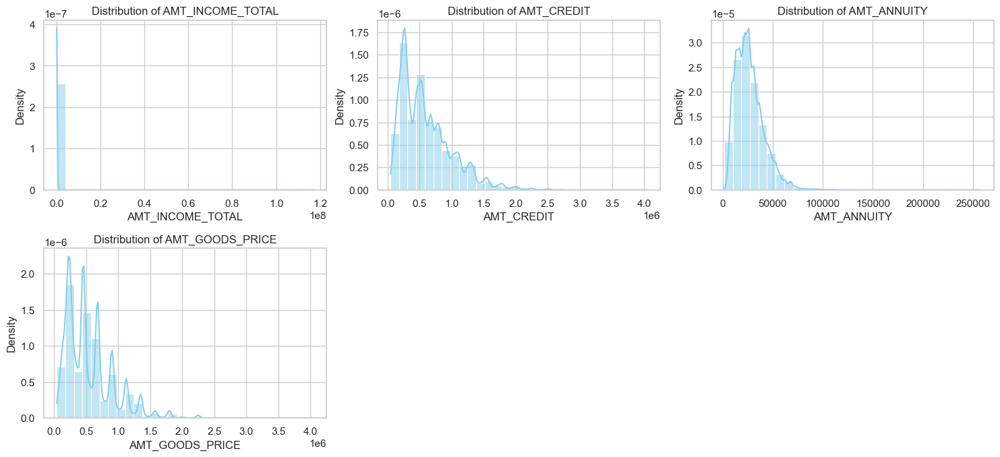

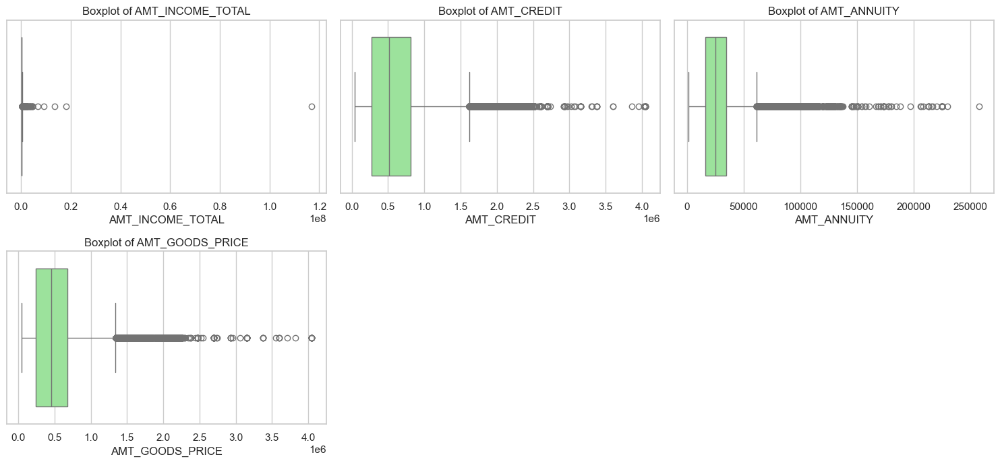

In [40]:
plot_histograms(income_and_loan_cols, at)
plot_boxplots(income_and_loan_cols, at)

The distribution plots for AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, and AMT_GOODS_PRICE show that the majority of values are clustered in the lower ranges, with the density significantly tapering off as the values increase, suggesting that most loan applicants have lower financial engagements. Specifically, the AMT_INCOME_TOTAL plot indicates a peak around the lower end near zero, and very few cases approach the upper extreme of the scale, which reaches up to approximately 117 million. Similarly, for AMT_CREDIT and AMT_GOODS_PRICE, most data points are below 1 million, with notable peaks around 500,000 and fewer occurrences as amounts increase. AMT_ANNUITY distributions also follow this pattern, with the majority of annuities under 50,000.

The boxplots reveal a significant number of outliers across all financial categories. These outliers represent exceptionally high values compared to the typical range seen within the interquartile range. For example, AMT_CREDIT's interquartile range stops around 1 million, yet there are data points stretching towards 4 million. This implies that while most customers opt for lower credit amounts, there are exceptions where customers are granted substantially higher credits, which could indicate loans for more expensive properties or businesses.

These findings highlight the diversity in financial behavior among applicants, with a vast majority handling smaller amounts and a few outliers managing significantly larger sums, which could be crucial for risk assessment and financial product tailoring in banking scenarios.

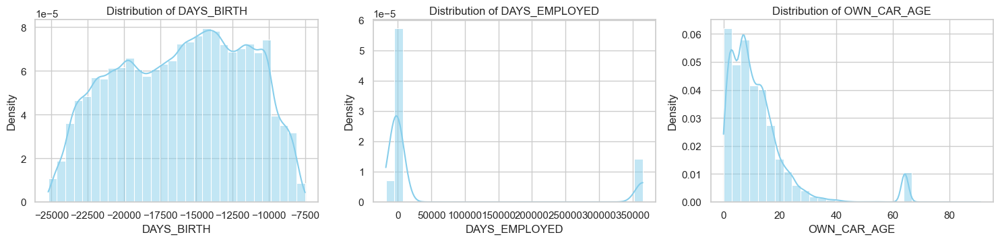

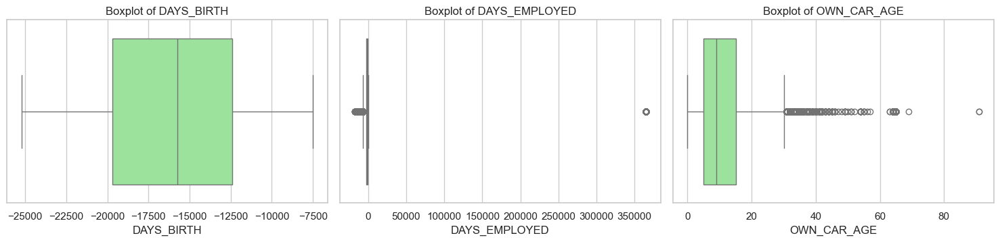

In [41]:
plot_histograms(age_and_employment_cols, at)
plot_boxplots(age_and_employment_cols, at)

The DAYS_BIRTH variable follows a nearly uniform distribution, with most values ranging between -25,000 and -7,500 days. This indicates that applicants are between approximately 20 and 68 years old. The boxplot confirms a symmetric spread without significant outliers, suggesting that age is well-distributed within this range.

The DAYS_EMPLOYED variable displays an unusual distribution, with one peak concentrated around 0 to 20,000 days, corresponding to employment durations of up to 55 years, and another extreme peak at 365,243 days. The latter is likely an error or a placeholder value for missing data, as it corresponds to nearly 1,000 years of employment. The boxplot highlights this anomaly by showing extreme outliers far beyond reasonable employment durations.

The OWN_CAR_AGE variable exhibits a right-skewed distribution, where most values fall between 0 and 20 years, indicating that the majority of applicants own relatively new cars. However, a few values exceed 60 years, which is reflected in the boxplot as extreme outliers. This suggests the possibility of data inaccuracies or rare cases of exceptionally old vehicles.

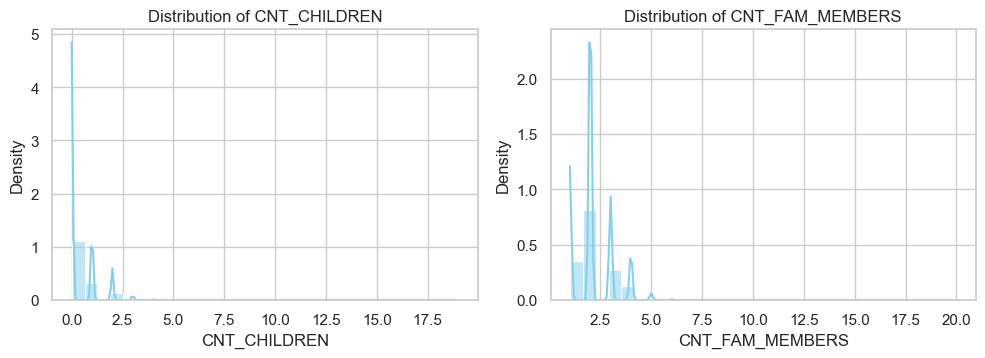

In [42]:
plot_histograms(family_and_social_cols, at)

The CNT_CHILDREN variable is highly right-skewed, with the majority of applicants having no children or a very small number of children. A sharp peak at zero suggests that a significant portion of the dataset consists of applicants without children. A few extreme cases exist where individuals report having more than 10 children, which could indicate data anomalies or rare occurrences.

Similarly, CNT_FAM_MEMBERS follows a right-skewed distribution, with most values concentrated between 1 and 5 family members. The peak around 2 suggests that many applicants live in small households. However, there are a few extreme values exceeding 15, which might represent extended families or data inconsistencies. The presence of outliers in both distributions suggests that further validation is needed to ensure data accuracy.

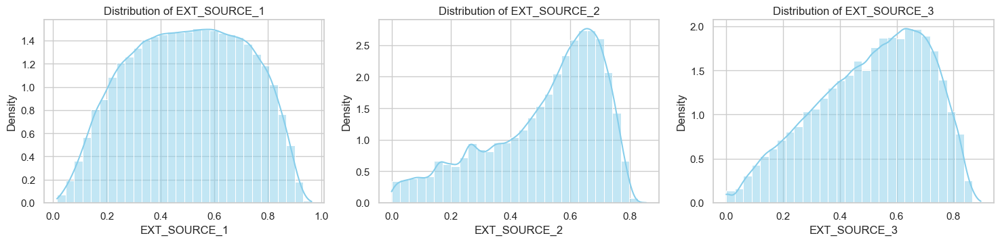

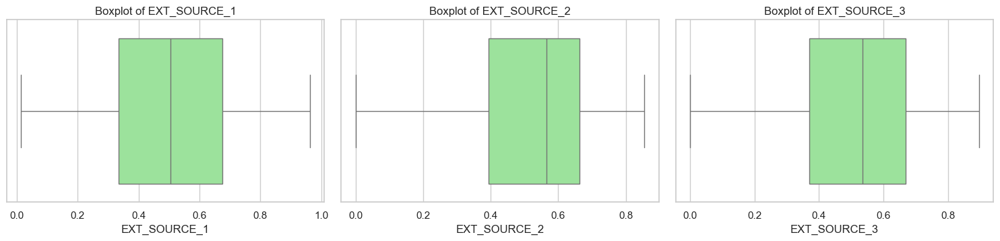

In [43]:
plot_histograms(credit_history_cols, at)
plot_boxplots(credit_history_cols, at)

The three external source variables, EXT_SOURCE_1, EXT_SOURCE_2, and EXT_SOURCE_3, exhibit distinct distributions while sharing a common range between 0 and 1. EXT_SOURCE_1 follows a nearly uniform distribution, where values are evenly spread across the entire range without significant peaks, suggesting a balanced feature representation. The boxplot confirms this even spread, with no extreme outliers and a well-distributed interquartile range. 

In contrast, EXT_SOURCE_2 has a right-skewed distribution, with most values concentrated between 0.4 and 0.7. The density plot indicates multiple peaks, hinting at a multimodal nature, which may suggest different underlying data groups. The boxplot reinforces this observation by showing a spread concentrated in the middle range, without extreme deviations. EXT_SOURCE_3 presents a somewhat similar distribution to EXT_SOURCE_2 but appears more symmetric, with the highest density of values around 0.6. The distribution indicates a slight right skew but is more balanced compared to EXT_SOURCE_2. The boxplot suggests that its spread is consistent, with no apparent extreme outliers. 

Overall, all three variables remain within a well-defined range, making them useful predictive features. The presence of multimodal behavior in EXT_SOURCE_2 hints at underlying subgroups in the data, while the uniformity of EXT_SOURCE_1 and the slight skewness in EXT_SOURCE_3 suggest variations in how these sources contribute to the dataset. None of the three variables exhibit drastic outliers, ensuring their stability in predictive modeling.

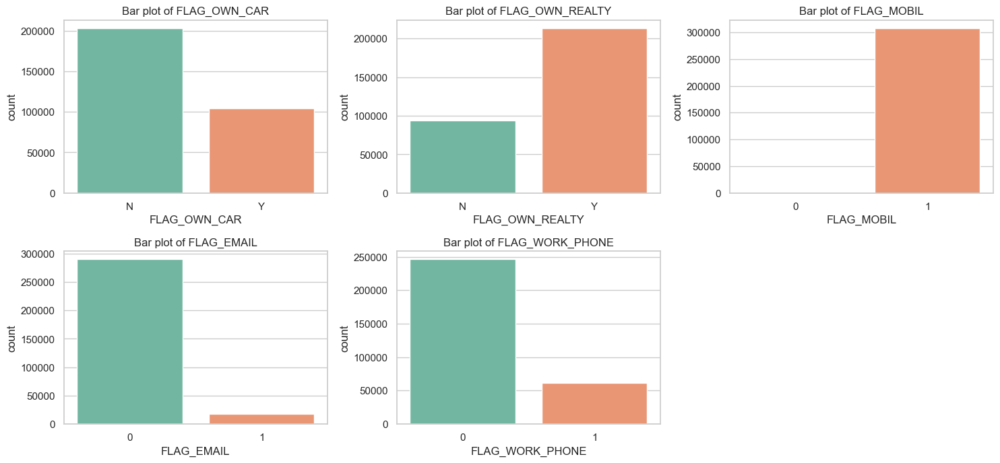

In [44]:
plot_bar_plots(asset_and_contact_cols, at)

The bar plots reveal distinct distributions across the categorical flags. The FLAG_OWN_CAR variable shows that a majority of applicants do not own a car, with the proportion of non-owners being almost twice as high as car owners. In contrast, FLAG_OWN_REALTY has the opposite trend, where most applicants own real estate, indicating home ownership is more common in this dataset. 

The FLAG_MOBIL variable is highly imbalanced, with nearly all applicants having a mobile phone, making this feature almost redundant in predictive modeling. FLAG_EMAIL also shows a strong imbalance, where a vast majority do not have an email recorded, suggesting it might not be a crucial factor in distinguishing applicants. Lastly, FLAG_WORK_PHONE follows a similar pattern, where most applicants do not have a recorded work phone, though the proportion of those with one is slightly higher than the email flag. These insights indicate that while some categorical features hold valuable distinctions, others may contribute minimal variance to predictive models.

In [45]:
region_and_city_cols = ['REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'REGION_POPULATION_RELATIVE']
for col in region_and_city_cols:
    if at[col].dtype == 'float16':
        at[col] = at[col].astype('float32')

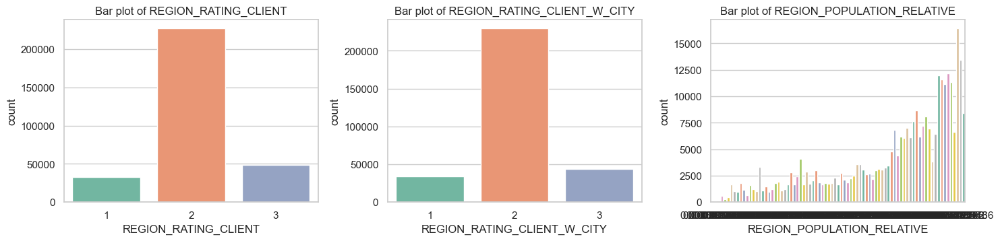

In [46]:
plot_bar_plots(region_and_city_cols, at)

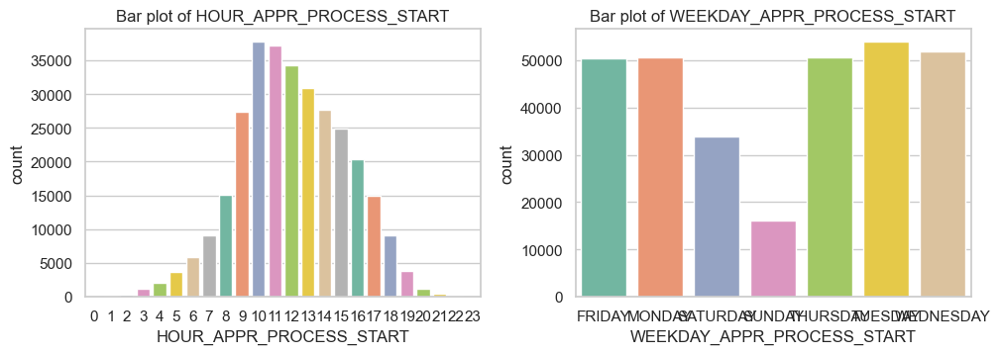

In [47]:
plot_bar_plots(loan_application_cols, at)

The first set of bar plots highlights that the most common region rating for clients is 2, with much fewer applicants in regions rated 1 and 3. The distribution of population relative to the region is skewed, with higher concentrations in more populated areas. Most loan applications are processed during business hours, peaking between 9 AM and 3 PM. Loan applications are fairly evenly distributed across weekdays, except for Sunday, which has significantly fewer applications.

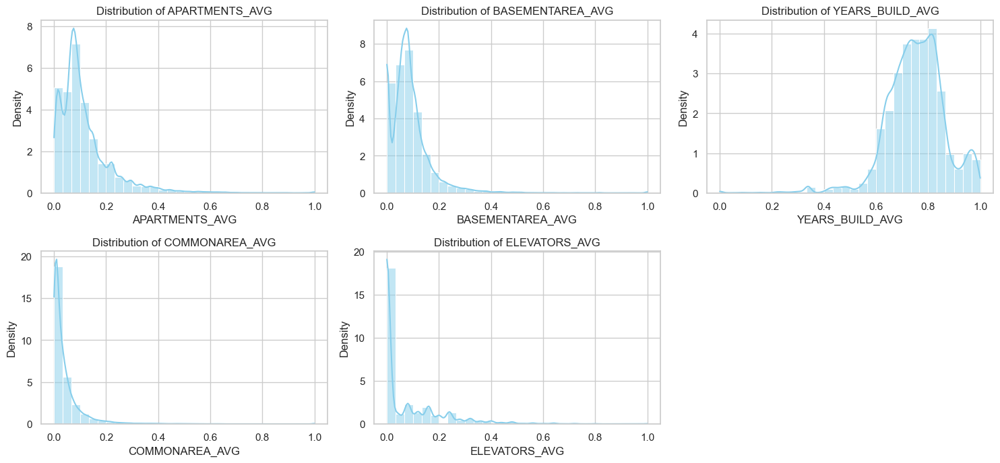

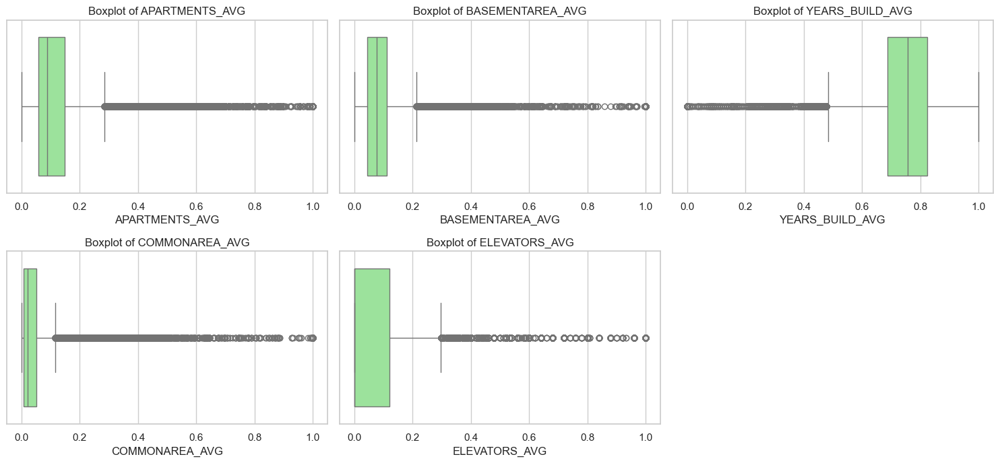

In [48]:
plot_histograms(building_and_housing_cols, at)
plot_boxplots(building_and_housing_cols, at)

The distributions of APARTMENTS_AVG, BASEMENTAREA_AVG, COMMONAREA_AVG, and ELEVATORS_AVG are highly right-skewed, with most values concentrated near zero, indicating that the majority of applicants have limited or no access to these features in their residences. YEARS_BUILD_AVG follows a bimodal distribution, suggesting two distinct groups based on property age. The corresponding box plots confirm the presence of numerous outliers in all variables except YEARS_BUILD_AVG, which exhibits a more balanced spread. The high number of extreme values in property-related features may reflect significant disparities in applicants' living conditions.

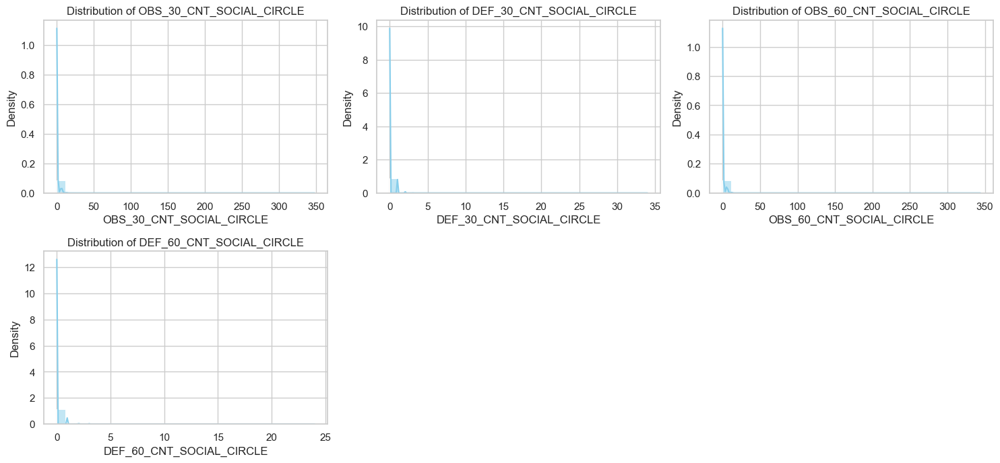

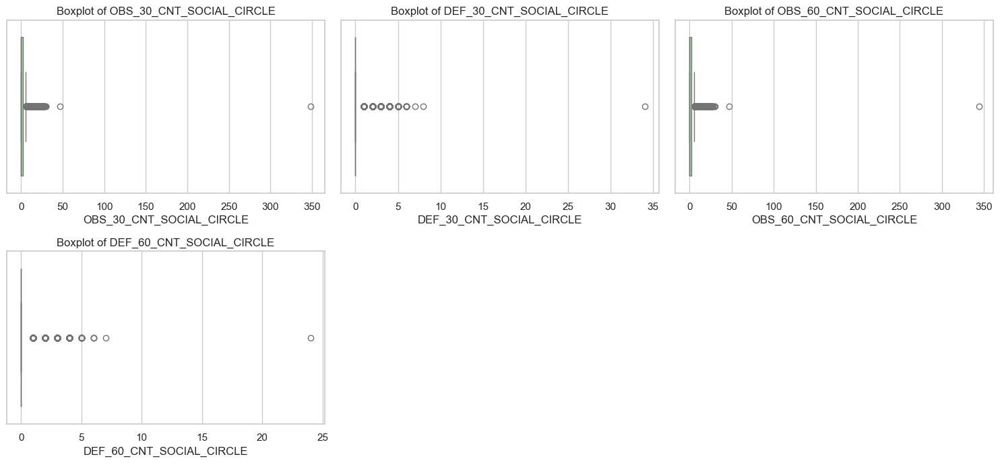

In [49]:
plot_histograms(social_circle_cols, at)
plot_boxplots(social_circle_cols, at)

The density plots indicate that most values in the OBS and DEF social circle count variables are concentrated at lower values, with a sharp decline as the count increases. This suggests that the majority of applicants have very few observations or defaults in their social circles. The boxplots confirm this by showing that these variables contain significant outliers, with a few extreme values extending far beyond the typical range. This indicates that while most applicants have low counts, a few have unusually high numbers, potentially influencing the overall distribution.

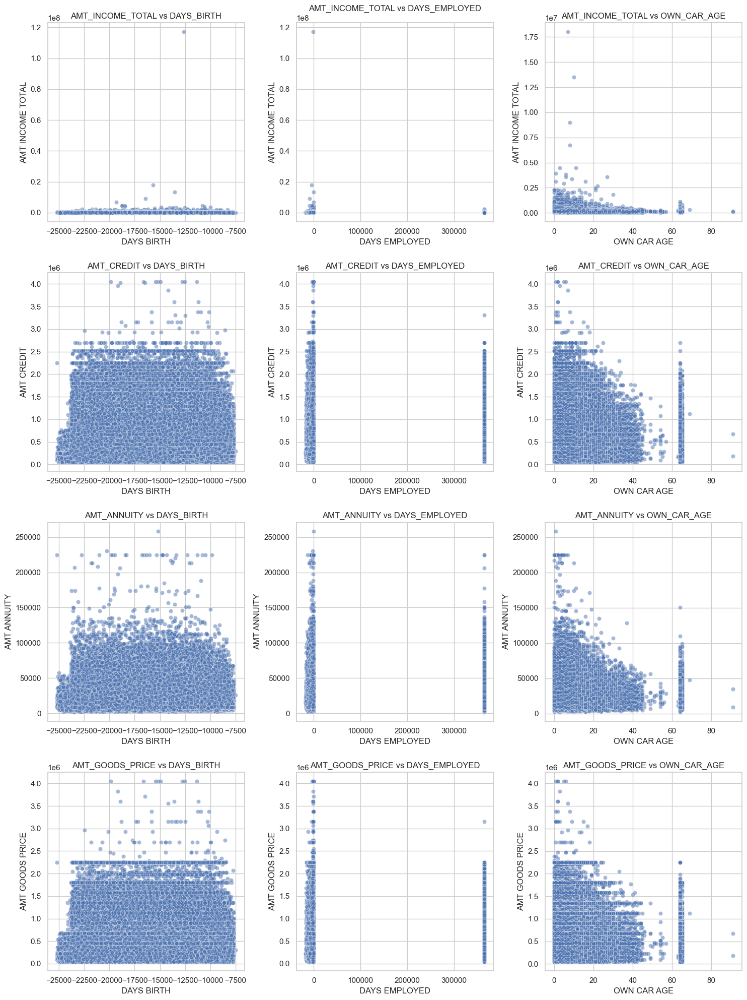

In [50]:
plot_scatter_df(income_and_loan_cols, age_and_employment_cols, at)

The scatter plots reveal key insights into the relationships between financial amounts and time-based or categorical features. AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, and AMT_GOODS_PRICE appear relatively constant across DAYS_BIRTH, indicating no strong age-related trends. However, the distributions are denser at lower values, suggesting that most applicants fall within a certain income or credit range. DAYS_EMPLOYED shows extreme outliers, likely due to incorrect or imputed values, which distort patterns in AMT-related variables. OWN_CAR_AGE exhibits a weak negative correlation with financial amounts, implying that older cars are associated with lower loan amounts, potentially due to economic constraints or creditworthiness considerations.

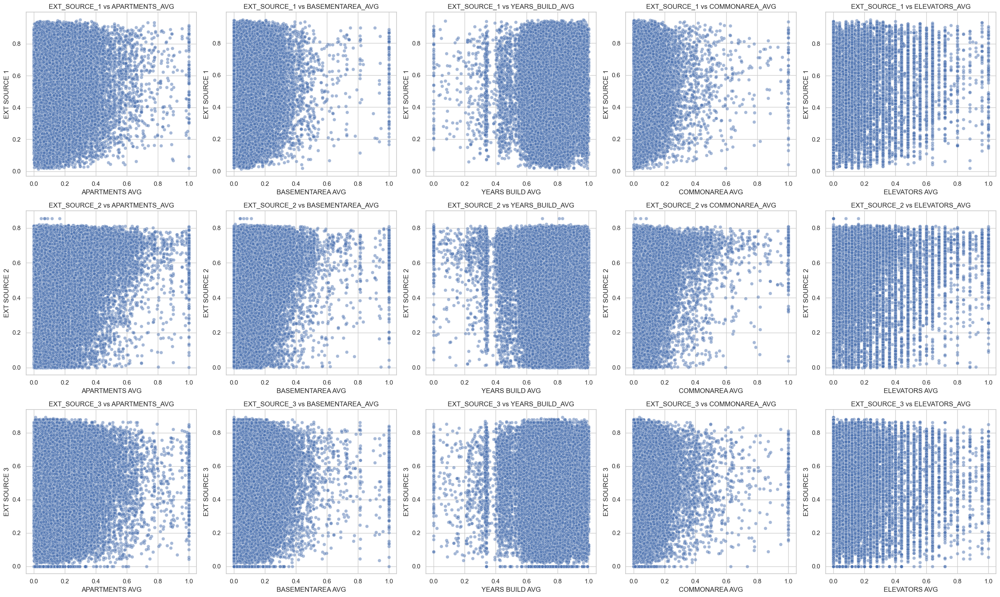

In [51]:
plot_scatter_df(credit_history_cols, building_and_housing_cols, at)

The scatter plots illustrate the relationships between external credit risk scores (EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3) and various housing-related features (APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, and ELEVATORS_AVG). There is no strong correlation between the external risk scores and housing attributes, as the data points are widely scattered without a clear trend. The distributions for YEARS_BUILD_AVG show a concentration in the upper range (above 0.6), while other housing variables exhibit more uniform dispersion. The presence of vertical clustering in some plots suggests a limited range of values in the housing variables, which may be due to categorical encoding or specific property characteristics.

In [52]:
leakage_cols = [
    'DAYS_LAST_PHONE_CHANGE',
    'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
    'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
    'REGION_RATING_CLIENT_W_CITY', 'REGION_RATING_CLIENT'
]
credit_bureau_cols = [col for col in at.columns if col.startswith('AMT_REQ_CREDIT_BUREAU_')]
flag_document_cols = [col for col in at.columns if col.startswith('FLAG_DOCUMENT_')]
leakage_candidates = leakage_cols + credit_bureau_cols + flag_document_cols
leakage_candidates = [col for col in leakage_candidates if col in at.columns]
correlations = at[leakage_candidates + ['TARGET']].corr()['TARGET'].drop('TARGET')
print("\n **Potential Data Leakage Features (Correlation with TARGET)** \n")
print(correlations.abs().sort_values(ascending=False).to_markdown(tablefmt="pipe"))


 **Potential Data Leakage Features (Correlation with TARGET)** 

|                             |      TARGET |
|:----------------------------|------------:|
| REGION_RATING_CLIENT_W_CITY | 0.0608927   |
| REGION_RATING_CLIENT        | 0.058899    |
| DAYS_LAST_PHONE_CHANGE      | 0.0552188   |
| FLAG_DOCUMENT_3             | 0.0443463   |
| DEF_30_CNT_SOCIAL_CIRCLE    | 0.0322476   |
| DEF_60_CNT_SOCIAL_CIRCLE    | 0.0312765   |
| FLAG_DOCUMENT_6             | 0.0286019   |
| AMT_REQ_CREDIT_BUREAU_YEAR  | 0.0199299   |
| AMT_REQ_CREDIT_BUREAU_MON   | 0.0124624   |
| FLAG_DOCUMENT_16            | 0.0116147   |
| FLAG_DOCUMENT_13            | 0.0115832   |
| FLAG_DOCUMENT_14            | 0.00946382  |
| OBS_30_CNT_SOCIAL_CIRCLE    | 0.00913067  |
| OBS_60_CNT_SOCIAL_CIRCLE    | 0.00902214  |
| FLAG_DOCUMENT_8             | 0.00804038  |
| FLAG_DOCUMENT_18            | 0.00795239  |
| FLAG_DOCUMENT_15            | 0.00653566  |
| FLAG_DOCUMENT_2             | 0.00541714  |
| FLAG_DOCUMEN

In [53]:
high_leakage_cols = [
    'REGION_RATING_CLIENT_W_CITY', 'REGION_RATING_CLIENT', 'DAYS_LAST_PHONE_CHANGE',
    'DEF_30_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'FLAG_DOCUMENT_3'
]
weak_leakage_cols = [col for col in at.columns if col.startswith('AMT_REQ_CREDIT_BUREAU_') or col.startswith('FLAG_DOCUMENT_')]
threshold = 0.02  
conditional_drops = correlations[correlations.abs() > threshold].index.tolist()
drop_cols = list(set(high_leakage_cols + conditional_drops))
at.drop(columns=drop_cols, inplace=True)
print(f" Dropped {len(drop_cols)} potential leakage columns.\n")
print(f" Removed: {drop_cols}")

 Dropped 7 potential leakage columns.

 Removed: ['DEF_60_CNT_SOCIAL_CIRCLE', 'REGION_RATING_CLIENT', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_3', 'DEF_30_CNT_SOCIAL_CIRCLE', 'REGION_RATING_CLIENT_W_CITY', 'DAYS_LAST_PHONE_CHANGE']


The analysis identifies potential data leakage features by examining their correlation with the target variable. Among these, REGION_RATING_CLIENT_W_CITY, REGION_RATING_CLIENT, DAYS_LAST_PHONE_CHANGE, and FLAG_DOCUMENT_3 exhibit the highest correlation with TARGET, making them strong candidates for removal. Other social circle default counts (DEF_30_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE) also show notable correlations. 

A threshold of 0.02 was applied to filter additional features, resulting in the removal of 7 columns, including high-leakage indicators and a few FLAG_DOCUMENT features. This step ensures that predictive models do not unintentionally gain an advantage by using information that could be directly tied to the outcome, preserving the integrity of the model's generalization.

In [54]:
categorical_columns = at.select_dtypes(include='category').columns
for col in categorical_columns:
    at[col] = at[col].replace(['XNA', 'Unknown'], np.nan)

at['CNT_CHILDREN'] = at['CNT_CHILDREN'].apply(lambda x: np.nan if x < 0 else x)

at['DAYS_EMPLOYED'] = at['DAYS_EMPLOYED'].replace(365243, np.nan).abs()

at['DAYS_BIRTH'] = at['DAYS_BIRTH'].abs()
at['DAYS_REGISTRATION'] = at['DAYS_REGISTRATION'].abs()
at['DAYS_ID_PUBLISH'] = at['DAYS_ID_PUBLISH'].abs()

at['DAYS_EMPLOYED'].fillna(0, inplace=True) 

In [55]:
columns_to_cap = ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'DAYS_EMPLOYED', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'OWN_CAR_AGE']
for col in columns_to_cap:
    lower_bound = at[col].quantile(0.01)
    upper_bound = at[col].quantile(0.99)
    at[col] = at[col].clip(lower=lower_bound, upper=upper_bound)

In [56]:
# Employment & Age Features
at['EMPLOYMENT_LENGTH'] = at['DAYS_EMPLOYED'] / -365
at['AGE'] = at['DAYS_BIRTH'] / -365
# Income Ratios (Fixed)
at['INCOME_TO_CREDIT_RATIO'] = at['AMT_INCOME_TOTAL'] / at['AMT_CREDIT']
at['INCOME_TO_ANNUITY_RATIO'] = at['AMT_INCOME_TOTAL'] / at['AMT_ANNUITY']
at['INCOME_TO_GOODS_RATIO'] = at['AMT_INCOME_TOTAL'] / at['AMT_GOODS_PRICE']
# Additional Ratios & Features (Fixed)
at['DAYS_EMPLOYED_PERC'] = at['DAYS_EMPLOYED'] / at['DAYS_BIRTH']
at['INCOME_PER_PERSON'] = at['AMT_INCOME_TOTAL'] / at['CNT_FAM_MEMBERS']
at['PAYMENT_RATE'] = at['AMT_ANNUITY'] / at['AMT_CREDIT']
at['DIFF_PRICE_CREDIT'] = (at['AMT_GOODS_PRICE'] != at['AMT_CREDIT']).astype(int)
# Weighted Average of External Sources
at['WEIGHTED_EXT_SOURCE'] = at[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mul([0.5, 0.3, 0.2]).sum(axis=1)
# Summation of FLAG_DOCUMENT Features
at['DOCUMENT_COUNT'] = at.filter(like='FLAG_DOCUMENT').sum(axis=1)

In [57]:
cat_missing_cols = [
    "NAME_FAMILY_STATUS", "CODE_GENDER", "NAME_TYPE_SUITE", "ORGANIZATION_TYPE",
    "OCCUPATION_TYPE", "EMERGENCYSTATE_MODE", "HOUSETYPE_MODE", 
    "WALLSMATERIAL_MODE", "FONDKAPREMONT_MODE"
]
for col in cat_missing_cols:
    if at[col].dtype.name == "category":  
        at[col] = at[col].cat.add_categories("Missing") 
        at[col].fillna("Missing", inplace=True)  

The preprocessing steps focus on improving data quality and feature engineering. Missing and unknown values in categorical variables are replaced with NaN, while certain categorical features with missing values are assigned a new "Missing" category to preserve information. Unrealistic values in DAYS_EMPLOYED, where 365243 indicates unemployment, are corrected by replacing it with NaN and then filling it with zero. Negative values in DAYS_BIRTH, DAYS_REGISTRATION, and DAYS_ID_PUBLISH are converted to absolute values, ensuring meaningful interpretations.

Extreme values in key financial and employment-related columns such as AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, DAYS_EMPLOYED, AMT_REQ_CREDIT_BUREAU_YEAR, and OWN_CAR_AGE are capped at the 1st and 99th percentiles to mitigate the impact of outliers. Several new features are derived to enhance predictive performance. EMPLOYMENT_LENGTH and AGE transform duration-based variables into years, while financial stability is captured through income ratios like INCOME_TO_CREDIT_RATIO, INCOME_TO_ANNUITY_RATIO, and INCOME_TO_GOODS_RATIO. The proportion of working years relative to age (DAYS_EMPLOYED_PERC), income per family member (INCOME_PER_PERSON), and the annuity-to-credit ratio (PAYMENT_RATE) provide additional financial insights.

To assess potential differences between credit amounts and goods prices, DIFF_PRICE_CREDIT is introduced. External risk scores from different sources are combined into a single WEIGHTED_EXT_SOURCE using custom weights, and document submission patterns are summarized in DOCUMENT_COUNT, which aggregates document-related flag variables. These transformations ensure cleaner data, reduce noise, and introduce meaningful patterns that can enhance model performance.

In [58]:
chi= chi_square_test(at, target_col='TARGET')
fish= fisher_exact_test(at, target_col='TARGET')

- NAME_TYPE_SUITE (Chi-Square Test): p-value = 0.0000
- NAME_EDUCATION_TYPE (Chi-Square Test): p-value = 0.0000
- NAME_HOUSING_TYPE (Chi-Square Test): p-value = 0.0000
- OCCUPATION_TYPE (Chi-Square Test): p-value = 0.0000
- WEEKDAY_APPR_PROCESS_START (Chi-Square Test): p-value = 0.0174
- FONDKAPREMONT_MODE (Chi-Square Test): p-value = 0.0000
- HOUSETYPE_MODE (Chi-Square Test): p-value = 0.0000
- WALLSMATERIAL_MODE (Chi-Square Test): p-value = 0.0000
- EMERGENCYSTATE_MODE (Chi-Square Test): p-value = 0.0000
- NAME_CONTRACT_TYPE (Fisher's Exact Test): p-value = 0.0000
- FLAG_OWN_CAR (Fisher's Exact Test): p-value = 0.0000
- FLAG_OWN_REALTY (Fisher's Exact Test): p-value = 0.0007


In [59]:
binary_features = ["FLAG_OWN_CAR", "FLAG_OWN_REALTY"]
label_encoded_features = ["CODE_GENDER", "FONDKAPREMONT_MODE", "HOUSETYPE_MODE", "NAME_EDUCATION_TYPE","EMERGENCYSTATE_MODE", "NAME_CONTRACT_TYPE"]
onehot_encoded_features = ["NAME_FAMILY_STATUS", "NAME_HOUSING_TYPE", "NAME_TYPE_SUITE", "WEEKDAY_APPR_PROCESS_START", "NAME_INCOME_TYPE"]
frequency_encoded_features = ["OCCUPATION_TYPE", "ORGANIZATION_TYPE", "WALLSMATERIAL_MODE"]
for col in binary_features:
    at[col] = at[col].map({'Y': 1, 'N': 0}) 
label_encoder = LabelEncoder()
for col in label_encoded_features:
    at[col] = label_encoder.fit_transform(at[col])
at = pd.get_dummies(at, columns=onehot_encoded_features, drop_first=True)
for col in frequency_encoded_features:
    freq_map = at[col].value_counts(normalize=True)  
    at[col] = at[col].map(freq_map) 

for col in ["FLAG_OWN_CAR", "FLAG_OWN_REALTY"]:
    at[col] = at[col].astype(int)  
for col in ["OCCUPATION_TYPE", "ORGANIZATION_TYPE", "WALLSMATERIAL_MODE"]:
    at[col] = at[col].astype(float) 

The preprocessing involves encoding categorical variables using different techniques based on their nature. Binary features such as FLAG_OWN_CAR and FLAG_OWN_REALTY are mapped to 1 for 'Y' and 0 for 'N', ensuring numerical representation. Label encoding is applied to categorical variables with a limited number of unique values, such as CODE_GENDER and NAME_CONTRACT_TYPE, replacing categories with integer labels.

One-hot encoding is performed on variables like NAME_FAMILY_STATUS and WEEKDAY_APPR_PROCESS_START, generating binary columns while avoiding redundancy by dropping the first category. Frequency encoding is applied to OCCUPATION_TYPE, ORGANIZATION_TYPE, and WALLSMATERIAL_MODE, replacing categories with their relative frequencies in the dataset. This technique helps in maintaining the ordinal structure while preventing excessive dimensionality.

Finally, data types are adjusted to ensure consistency, with binary features converted to integers and frequency-encoded features cast as floats. These transformations make the dataset compatible with machine learning models while preserving meaningful relationships within the data.

In [60]:
at.replace([np.inf, -np.inf], np.nan, inplace=True)

In [61]:
at=optimize_data_types(at)

In [62]:
missing_inf_values(at)

Missing Values Summary:
                             Data Type  Missing Count  Missing Percentage
COMMONAREA_MODE                float16         214865           69.872297
COMMONAREA_AVG                 float16         214865           69.872297
COMMONAREA_MEDI                float16         214865           69.872297
NONLIVINGAPARTMENTS_AVG        float16         213514           69.432963
NONLIVINGAPARTMENTS_MODE       float16         213514           69.432963
NONLIVINGAPARTMENTS_MEDI       float16         213514           69.432963
LIVINGAPARTMENTS_AVG           float16         210199           68.354953
LIVINGAPARTMENTS_MODE          float16         210199           68.354953
LIVINGAPARTMENTS_MEDI          float16         210199           68.354953
FLOORSMIN_MEDI                 float16         208642           67.848630
FLOORSMIN_MODE                 float16         208642           67.848630
FLOORSMIN_AVG                  float16         208642           67.848630
YEARS_BUILD_ME


Normal Columns (p > 0.05):


,Column,Test,Statistic,p_value,Skewness,Kurtosis



Not Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:


,Column,Test,Statistic,p_value,Skewness,Kurtosis
0,SK_ID_CURR,Kolmogorov-Smirnov,0.057265,0.0,-0.001200,-1.198988e+00
1,TARGET,Kolmogorov-Smirnov,0.535786,0.0,3.078144,7.474968e+00
83,EMERGENCYSTATE_MODE,Kolmogorov-Smirnov,0.344007,0.0,0.032935,-1.594550e+00
86,FLAG_DOCUMENT_2,Kolmogorov-Smirnov,0.502552,0.0,153.791067,2.364969e+04
87,FLAG_DOCUMENT_4,Kolmogorov-Smirnov,0.503516,0.0,110.893823,1.229544e+04
88,FLAG_DOCUMENT_5,Kolmogorov-Smirnov,0.534181,0.0,7.948283,6.117520e+01
89,FLAG_DOCUMENT_7,Kolmogorov-Smirnov,0.505334,0.0,72.173756,5.207051e+03
90,FLAG_DOCUMENT_8,Kolmogorov-Smirnov,0.535632,0.0,3.062226,7.377228e+00
91,FLAG_DOCUMENT_9,Kolmogorov-Smirnov,0.521037,0.0,15.927677,2.516909e+02
92,FLAG_DOCUMENT_10,Kolmogorov-Smirnov,0.501881,0.0,209.588031,4.392514e+04



Variables Exhibiting Multicollinearity (|Correlation| > 0.80):
- EMERGENCYSTATE_MODE & WALLSMATERIAL_MODE: Correlation=-0.8749
- EMERGENCYSTATE_MODE & HOUSETYPE_MODE: Correlation=0.9387
- EMPLOYMENT_LENGTH & DAYS_EMPLOYED_PERC: Correlation=-0.9813
- EMPLOYMENT_LENGTH & DAYS_EMPLOYED: Correlation=-1.0000
- AGE & DAYS_BIRTH: Correlation=-1.0000
- INCOME_TO_CREDIT_RATIO & INCOME_TO_GOODS_RATIO: Correlation=0.9855
- DAYS_EMPLOYED_PERC & DAYS_EMPLOYED: Correlation=0.9813
- WEIGHTED_EXT_SOURCE & EXT_SOURCE_1: Correlation=0.8559
- WALLSMATERIAL_MODE & HOUSETYPE_MODE: Correlation=-0.8962
- CNT_CHILDREN & CNT_FAM_MEMBERS: Correlation=0.8116
- AMT_CREDIT & AMT_ANNUITY: Correlation=0.8302
- AMT_CREDIT & AMT_GOODS_PRICE: Correlation=0.9849
- AMT_ANNUITY & AMT_GOODS_PRICE: Correlation=0.8280
- REG_REGION_NOT_WORK_REGION & LIVE_REGION_NOT_WORK_REGION: Correlation=0.8606
- REG_CITY_NOT_WORK_CITY & LIVE_CITY_NOT_WORK_CITY: Correlation=0.8256
- APARTMENTS_AVG & LIVINGAPARTMENTS_AVG: Correlation=0.9731

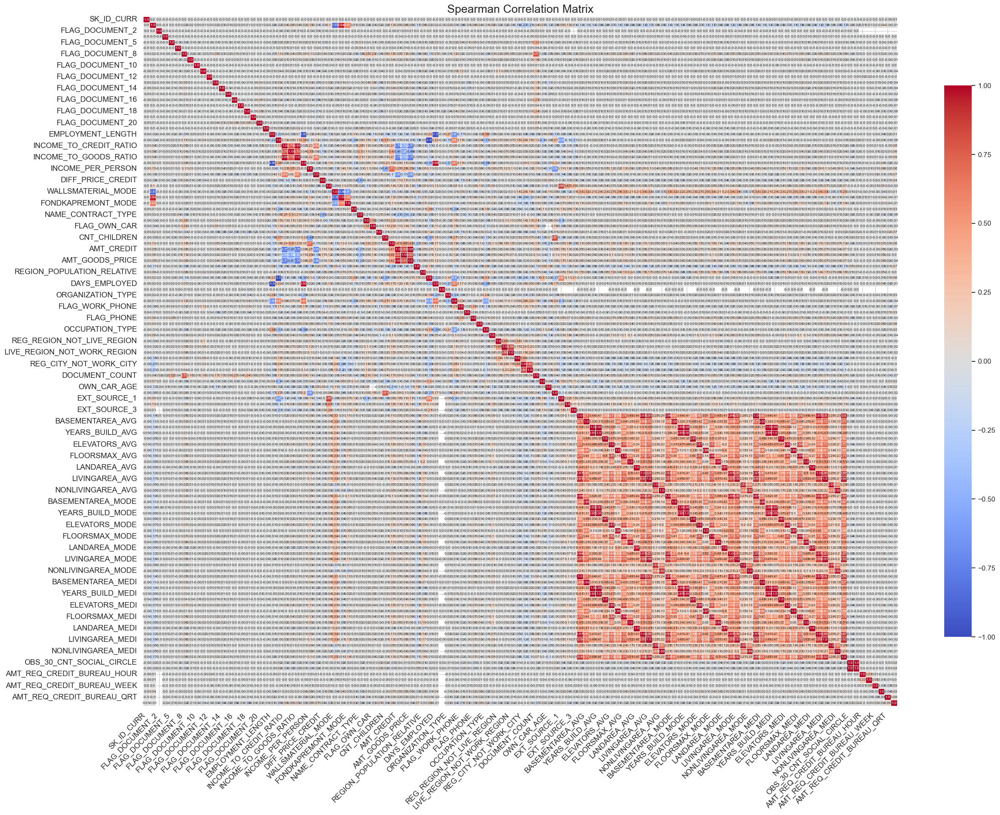

In [63]:
at_normal_df, at_not_normal_df = normality_test_with_skew_kurt(at)
spearman_correlation(at, at_not_normal_df, exclude_target='TARGET', multicollinearity_threshold=0.8)

In [64]:
at_above_threshold, at_below_threshold = calculate_vif(at, exclude_target='TARGET', multicollinearity_threshold=8.0)


Variance Inflation Factor (VIF) Scores (multicollinearity_threshold = 8.0):

Features with VIF > threshold (High Multicollinearity):
                     Feature          VIF
              DOCUMENT_COUNT          inf
            FLAG_DOCUMENT_15          inf
             FLAG_DOCUMENT_4          inf
             FLAG_DOCUMENT_5          inf
             FLAG_DOCUMENT_7          inf
             FLAG_DOCUMENT_8          inf
             FLAG_DOCUMENT_9          inf
            FLAG_DOCUMENT_10          inf
            FLAG_DOCUMENT_11          inf
            FLAG_DOCUMENT_12          inf
            FLAG_DOCUMENT_13          inf
            FLAG_DOCUMENT_14          inf
            FLAG_DOCUMENT_16          inf
            FLAG_DOCUMENT_17          inf
            FLAG_DOCUMENT_18          inf
            FLAG_DOCUMENT_19          inf
            FLAG_DOCUMENT_20          inf
            FLAG_DOCUMENT_21          inf
               DAYS_EMPLOYED 6.928615e+14
           EMPLOYMENT_LENG

The chi-square and Fisher’s exact tests indicate that several categorical variables, such as NAME_TYPE_SUITE, NAME_EDUCATION_TYPE, and OCCUPATION_TYPE, have statistically significant associations with the target variable, with p-values close to zero. This suggests these features could be relevant for prediction. However, WEEKDAY_APPR_PROCESS_START has a weaker association (p-value = 0.0174), meaning its predictive power may be lower.

Multicollinearity analysis reveals strong correlations (above 0.80) among many variables, particularly among real estate-related features like APARTMENTS_AVG, LIVINGAPARTMENTS_AVG, and TOTALAREA_MODE. High correlations also exist between financial features like AMT_CREDIT and AMT_GOODS_PRICE (0.9849), suggesting redundancy. Additionally, some categorical variables such as REGION_RATING_CLIENT_W_CITY and REGION_RATING_CLIENT show strong associations with one another.

Variance Inflation Factor (VIF) analysis highlights severe multicollinearity in variables like LIVINGAREA_AVG (VIF = 477.33) and APARTMENTS_MEDI (VIF = 314.50), indicating redundancy that could impact model stability. Features with VIF scores exceeding the threshold of **8.0** are likely candidates for removal or transformation. Meanwhile, variables such as EXT_SOURCE_1, DAYS_BIRTH, and AMT_INCOME_TOTAL exhibit low VIF scores, making them suitable for inclusion in modeling without further modification.

---

### 2 bureau and bureau_balance

In [65]:
bu_bub = optimize_data_types(bu_bub)

In [66]:
base_profile_df, linked_profiles_df = compare_df_columns('bu_bub', dataframes)
display_key_columns('bu_bub', dataframes)

| Column         | Linked DataFrames   |
|:---------------|:--------------------|
| SK_ID_CURR     | at, pc, ccb, pa, ip |
| AMT_ANNUITY    | at, pa              |
| MONTHS_BALANCE | pc, ccb             |


In [67]:
base_profile_df

,Dataset,Column,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,bu_bub,SK_ID_CURR,25121815,1,0,0.00%,0,N/A,0,0.00%,int32
1,bu_bub,AMT_ANNUITY,25121815,1,10495530,41.78%,0,N/A,1832101,7.29%,float32
2,bu_bub,MONTHS_BALANCE,25121815,1,942074,3.75%,23591219,N/A,143321,0.57%,float32


In [68]:
linked_profiles_df

,Dataset,Column,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,at,SK_ID_CURR,307511,1,0,0.00%,0,N/A,0,0.00%,int32
1,pc,SK_ID_CURR,10001358,1,0,0.00%,0,N/A,0,0.00%,int32
2,ccb,SK_ID_CURR,3840312,1,0,0.00%,0,N/A,0,0.00%,int32
3,pa,SK_ID_CURR,1670214,1,0,0.00%,0,N/A,0,0.00%,int32
4,ip,SK_ID_CURR,13605401,1,0,0.00%,0,N/A,0,0.00%,int32
5,at,AMT_ANNUITY,307511,1,12,0.00%,0,N/A,7504,2.44%,float32
6,pa,AMT_ANNUITY,1670214,1,372235,22.29%,0,N/A,82762,4.96%,float32
7,pc,MONTHS_BALANCE,10001358,1,0,0.00%,10001358,N/A,0,0.00%,int8
8,ccb,MONTHS_BALANCE,3840312,1,0,0.00%,3840312,N/A,0,0.00%,int8


In [69]:
bu_linked_cols = ['SK_ID_CURR', 'AMT_ANNUITY', 'MONTHS_BALANCE']

---

dataset domain prespective,

1. Identification & Key Reference Fields:
   - SK_ID_CURR: Unique identifier for each loan application.
   - SK_ID_BUREAU: Unique identifier for each credit record, linking to the bureau_balance.

2. Credit Status & Activity:
   - CREDIT_ACTIVE: Status of the credit (Active, Closed, etc.).
   - CREDIT_CURRENCY: Currency of the credit.
   - CREDIT_TYPE: Type of credit (e.g., Mortgage, Consumer Loan).
   - STATUS: Monthly credit status from bureau_balance.

3. Credit Timeline & Duration:
   - DAYS_CREDIT: Days since credit was granted.
   - DAYS_CREDIT_ENDDATE: Expected end date of credit.
   - DAYS_ENDDATE_FACT: Actual end date of credit.
   - DAYS_CREDIT_UPDATE: Days since the last credit update.
   - MONTHS_BALANCE: Monthly snapshot reference in bureau_balance.

4. Credit Utilization & Payment Behavior:
   - CREDIT_DAY_OVERDUE: Number of overdue days.
   - CNT_CREDIT_PROLONG: Times the credit has been extended.

5. Credit Amounts & Financial Exposure:
   - AMT_CREDIT_MAX_OVERDUE: Maximum overdue amount.
   - AMT_CREDIT_SUM: Total current credit amount.
   - AMT_CREDIT_SUM_DEBT: Total outstanding debt.
   - AMT_CREDIT_SUM_LIMIT: Credit limit for revolving credits.
   - AMT_CREDIT_SUM_OVERDUE: Total overdue amount.

6. Loan Repayment & Installments:
   - AMT_ANNUITY: Expected annuity payments.


In [70]:
print(bu_bub.shape)
for idx, col in enumerate(bu_bub.columns):
    print(f"{idx}: {col}")

(25121815, 19)
0: SK_ID_CURR
1: SK_ID_BUREAU
2: CREDIT_ACTIVE
3: CREDIT_CURRENCY
4: DAYS_CREDIT
5: CREDIT_DAY_OVERDUE
6: DAYS_CREDIT_ENDDATE
7: DAYS_ENDDATE_FACT
8: AMT_CREDIT_MAX_OVERDUE
9: CNT_CREDIT_PROLONG
10: AMT_CREDIT_SUM
11: AMT_CREDIT_SUM_DEBT
12: AMT_CREDIT_SUM_LIMIT
13: AMT_CREDIT_SUM_OVERDUE
14: CREDIT_TYPE
15: DAYS_CREDIT_UPDATE
16: AMT_ANNUITY
17: MONTHS_BALANCE
18: STATUS


In [71]:
detect_mixed_data_types(bu_bub)

'No mixed data types detected!'

In [72]:
cat_high_cardinality(bu_bub)

high_cardinality_columns


[]

In [73]:
bu_bub.dtypes.value_counts()

float32     7
int32       3
int16       2
float16     2
category    1
category    1
int8        1
category    1
category    1
Name: count, dtype: int64

In [74]:
missing_inf_values(bu_bub)
print(f"\nNumber of duplicate rows: {bu_bub.duplicated().sum()}\n")
duplicates = bu_bub[bu_bub.duplicated()]
duplicates

Missing Values Summary:
                       Data Type  Missing Count  Missing Percentage
AMT_CREDIT_MAX_OVERDUE   float32       18130741           72.171302
AMT_CREDIT_SUM_LIMIT     float32       10671361           42.478463
AMT_ANNUITY              float32       10495530           41.778550
DAYS_ENDDATE_FACT        float16        5978831           23.799359
AMT_CREDIT_SUM_DEBT      float32        4234392           16.855438
DAYS_CREDIT_ENDDATE      float16        1232569            4.906369
STATUS                  category         942074            3.750024
MONTHS_BALANCE           float32         942074            3.750024
AMT_CREDIT_SUM           float32             13            0.000052

Infinite Values Summary:
No infinite values found.

Number of duplicate rows: 0



,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,MONTHS_BALANCE,STATUS


The dataset contains a significant amount of missing data in key financial indicators. The AMT_CREDIT_MAX_OVERDUE column has the highest percentage of missing values at 72.17%, followed by AMT_CREDIT_SUM_LIMIT (42.48%) and AMT_ANNUITY (41.78%), indicating incomplete credit utilization and repayment information. The DAYS_ENDDATE_FACT column, representing actual loan closure dates, is missing in 23.8% of cases, suggesting many loans are still active. Other financial variables, such as AMT_CREDIT_SUM_DEBT and DAYS_CREDIT_ENDDATE, have lower but still notable missing rates. STATUS and MONTHS_BALANCE, which track credit behavior over time, are missing in around 3.75% of records, likely due to inactive or unreported accounts. AMT_CREDIT_SUM is nearly complete, with only 0.00005% missing values. No infinite values were detected, and there are no duplicate records, ensuring data integrity.

In [75]:
columns_info("Dataset Overview", bu_bub)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     2          CREDIT_ACTIVE                  category        N/A                            4
2     3          CREDIT_CURRENCY                category        N/A                            4
3     14         CREDIT_TYPE                    category        N/A                            15
4     18         STATUS                         category        N/A                            8
5     6          DAYS_CREDIT_ENDDATE            float16         -42048.0 - 31200.0             7054
6     7          DAYS_ENDDATE_FACT              float16         -42016.0 - 0.0                 2486
7     8          AMT_CREDIT_MAX_OVERDUE         float32         0.0 - 115987184.0              68251
8     10         AMT_CREDIT_SUM                 

In [76]:
analyze_data(bu_bub)































=== Numerical Analysis ===
|    | Variable               |           N |             Mean |               SD |       SE |        95% Conf. |         Interval |
|---:|:-----------------------|------------:|-----------------:|-----------------:|---------:|-----------------:|-----------------:|
|  0 | SK_ID_CURR             | 2.51218e+07 | 278016           | 102888           |  20.5277 | 277976           | 278056           |
|  1 | SK_ID_BUREAU           | 2.51218e+07 |      6.02855e+06 | 497075           |  99.1736 |      6.02835e+06 |      6.02874e+06 |
|  2 | DAYS_CREDIT            | 2.51218e+07 |  -1576.4         |    764.504       |   0.1525 |  -1576.7         |  -1576.1         |
|  3 | CREDIT_DAY_OVERDUE     | 2.51218e+07 |      0.8766      |     38.5966      |   0.0077 |      0.8615      |      0.8917      |
|  4 | DAYS_CREDIT_ENDDATE    | 2.38892e+07 |    nan           |    nan           | inf      |    nan           |    nan           |
|  5 | DAYS_

In [77]:
credit_status_columns = ['CREDIT_ACTIVE', 'CREDIT_TYPE', 'STATUS']
credit_amount_columns = ['AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'AMT_ANNUITY']
credit_duration_columns = ['DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'CNT_CREDIT_PROLONG', 'DAYS_CREDIT_ENDDATE', 'DAYS_CREDIT_UPDATE']

In [78]:
# plot_bar_plots(credit_status_columns, bu_bub)

In [79]:
# plot_histograms(credit_amount_columns, bu_bub)
# plot_boxplots(credit_amount_columns, bu_bub)

In [80]:
# plot_histograms(credit_duration_columns, bu_bub)
# plot_boxplots(credit_duration_columns, bu_bub)

- For high coputational and memory issue, so it's take long time to generate plots so that's the reson, one time generated and explained the below: 


- credit_amount_columns = ['AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'AMT_ANNUITY']
  
    - 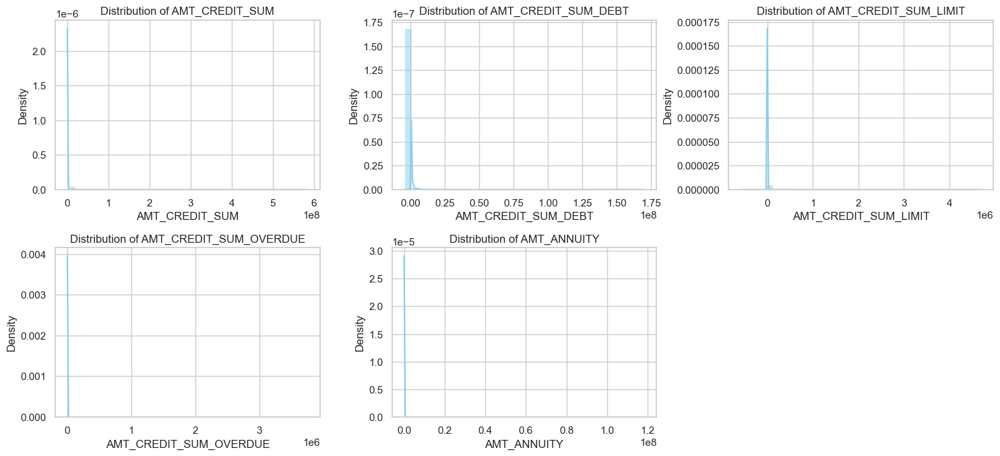
    
    - 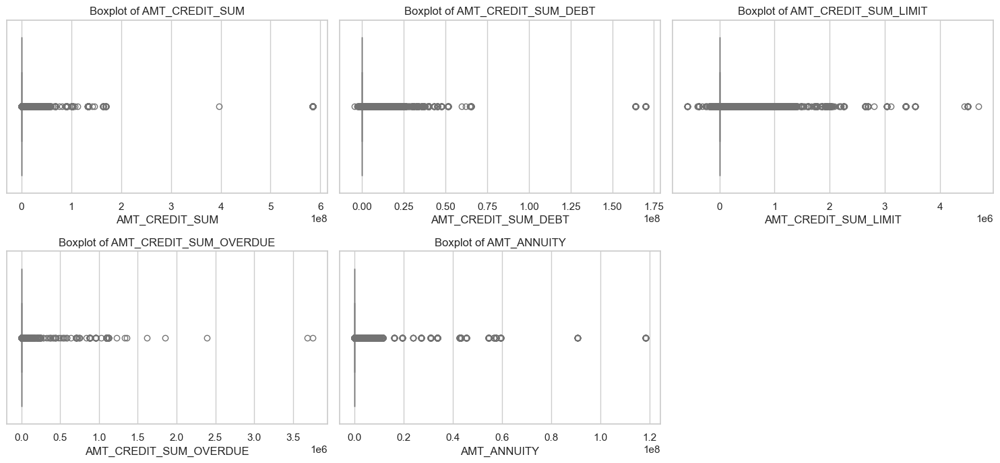


The distributions of credit-related variables indicate strong right-skewness, with most values concentrated near zero and a few extreme outliers. AMT_CREDIT_SUM, AMT_CREDIT_SUM_DEBT, and AMT_CREDIT_SUM_LIMIT show a heavily skewed distribution, reflecting that most credit amounts are relatively low, while a small proportion of cases have significantly high values. The boxplots confirm this trend, with extreme outliers present in all variables. Overdue amounts and annuities exhibit a similar pattern, where most observations are close to zero, but a few cases have disproportionately large values, indicating potential high-risk borrowers or exceptional credit conditions.

---

- credit_duration_columns = ['DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'CNT_CREDIT_PROLONG', 'DAYS_CREDIT_ENDDATE', 'DAYS_CREDIT_UPDATE']

    - 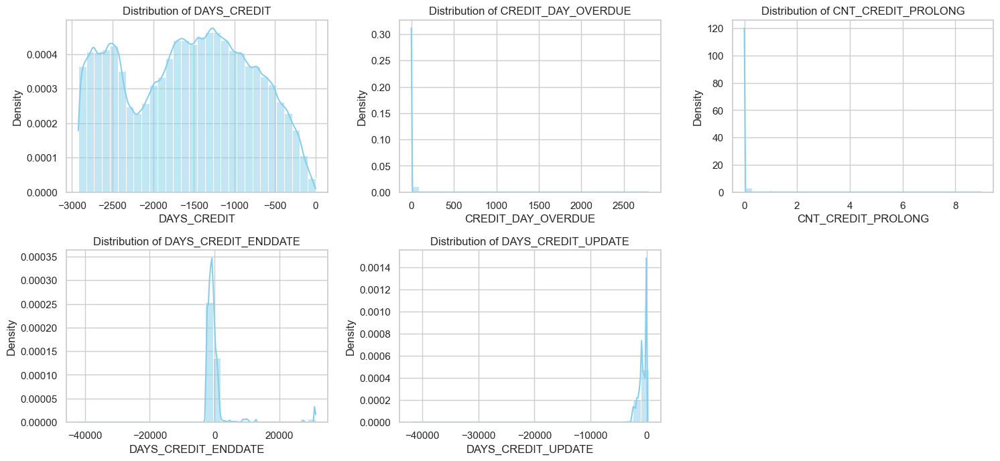
    
    - 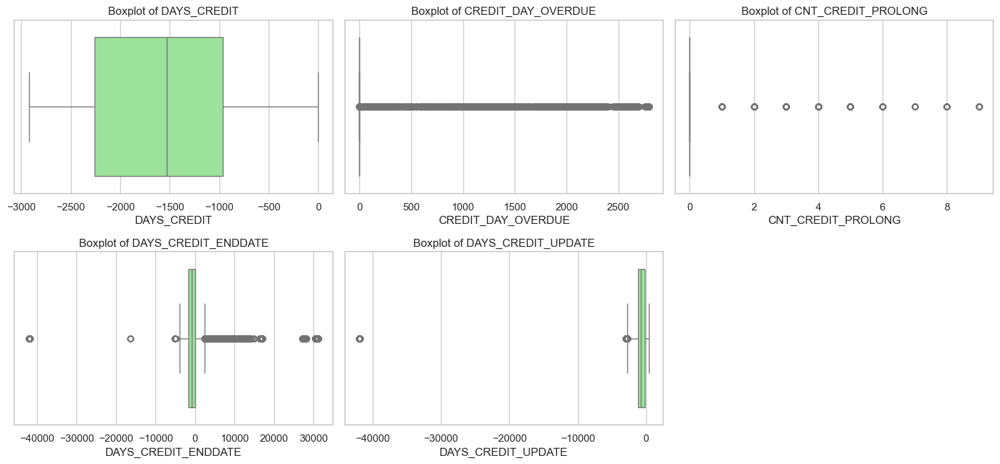

The credit bureau and bureau balance dataset contain historical credit information, including active and closed loans. Several features have high missing percentages, notably AMT_CREDIT_MAX_OVERDUE, AMT_CREDIT_SUM_LIMIT, and AMT_ANNUITY, indicating that these may be conditionally provided by lenders or not applicable for all cases. There are no infinite values or duplicate rows. The distribution of credit-related amounts, such as AMT_CREDIT_SUM, AMT_CREDIT_SUM_DEBT, and AMT_CREDIT_SUM_LIMIT, is highly skewed with a large concentration of lower values and a few extreme outliers. Time-based features like DAYS_CREDIT, DAYS_CREDIT_ENDDATE, and DAYS_CREDIT_UPDATE show negative values, reflecting past credit events relative to the application date. Delinquency-related variables, such as CREDIT_DAY_OVERDUE and CNT_CREDIT_PROLONG, exhibit a heavily skewed distribution, with most records having low or zero overdue days but a few extreme cases. The presence of significant outliers suggests that capping extreme values could be beneficial.

---

- credit_status_columns = ['CREDIT_ACTIVE', 'CREDIT_TYPE', 'STATUS']

    - 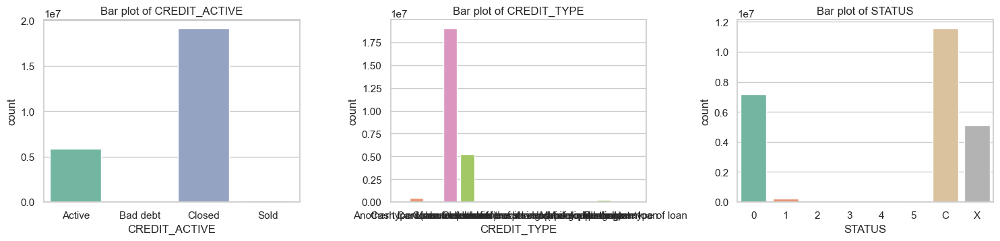

The dataset shows that most loans in the bureau data are closed, with a smaller proportion of active loans. Bad debt and sold loans appear to be rare. The distribution of credit types is dominated by a few common categories, such as cash loans and credit cards, while other types are significantly less frequent. The status of past loans reveals that a large number of records have no overdue payments (0), while some cases have the maximum delinquency category (5). The presence of statuses labeled C and X suggests special conditions, likely indicating closed accounts and missing statuses, respectively. The skewed distribution in loan statuses and credit types suggests potential areas for feature engineering, such as grouping less frequent categories or encoding delinquency severity.

In [81]:
bu_bub_outlier_summary, bu_bub_non_outlier_summary = comp_num_analysis(bu_bub, outlier_df=True)
bu_bub_missing_summary, bu_bub_non_missing_summary = comp_num_analysis(bu_bub, missing_df=True)
bu_bub_cat_missing_summary, bu_bub_cat_non_missing_summary = comp_cat_analysis(bu_bub, missing_df=True)
bu_bub_cat_missing_summary = bu_bub_cat_missing_summary.sort_values(by="Unique_Count", ascending=False)
bu_bub_cat_non_missing_summary = bu_bub_cat_non_missing_summary.sort_values(by="Unique_Count", ascending=False)
print(bu_bub_cat_missing_summary.shape)
print(bu_bub_missing_summary.shape)
print(bu_bub_outlier_summary.shape)

(1, 9)
(8, 31)
(12, 31)


In [82]:
bu_bub_negative_values = bu_bub.select_dtypes(include=[np.number]).lt(0).sum()
print("Columns with Negative Values:\n", bu_bub_negative_values[bu_bub_negative_values > 0])

Columns with Negative Values:
 DAYS_CREDIT             25121790
DAYS_CREDIT_ENDDATE     18125190
DAYS_ENDDATE_FACT       19142825
AMT_CREDIT_SUM_DEBT        34663
AMT_CREDIT_SUM_LIMIT        1313
DAYS_CREDIT_UPDATE      25117648
MONTHS_BALANCE          23591219
dtype: int64


In [83]:
num_summary(bu_bub)

,Count,Unique,Mean,Std,Min,25%,50%,75%,Max,Mode,Range,IQR,Variance,Skewness,Kurtosis,Shapiro-Wilk Stat,Shapiro-Wilk p-value
SK_ID_CURR,25121815.0,305811.0,2.780159e+05,1.028882e+05,100001.000,188795.0,2.776650e+05,367380.0,4.562550e+05,318065.0,3.562540e+05,1.785850e+05,1.058599e+10,0.002500,-1.202700,0.9457,0.0
SK_ID_BUREAU,25121815.0,1716428.0,6.028545e+06,4.970747e+05,5000000.000,5709120.0,6.063865e+06,6431504.0,6.843457e+06,5045788.0,1.843457e+06,7.223840e+05,2.470833e+11,-0.347400,-0.794000,0.9353,0.0
DAYS_CREDIT,25121815.0,2923.0,-1.576403e+03,7.645038e+02,-2922.000,-2260.0,-1.530000e+03,-967.0,0.000000e+00,-1155.0,2.922000e+03,1.293000e+03,5.844661e+05,-0.050400,-1.079300,0.9414,0.0
CREDIT_DAY_OVERDUE,25121815.0,942.0,8.766000e-01,3.859660e+01,0.000,0.0,0.000000e+00,0.0,2.792000e+03,0.0,2.792000e+03,0.000000e+00,1.489701e+03,53.040300,3002.415200,0.0072,0.0
DAYS_CREDIT_ENDDATE,23889246.0,7054.0,NaN,NaN,-inf,-inf,-inf,-inf,inf,30912.0,inf,inf,NaN,NaN,NaN,NaN,1.0
DAYS_ENDDATE_FACT,19142984.0,2486.0,NaN,NaN,-inf,-inf,-inf,-inf,0.000000e+00,-2360.0,inf,inf,NaN,NaN,NaN,NaN,1.0
AMT_CREDIT_MAX_OVERDUE,6991074.0,68251.0,5.992028e+03,3.756168e+05,0.000,0.0,0.000000e+00,0.0,1.159872e+08,0.0,1.159872e+08,0.000000e+00,1.410880e+11,253.211899,66840.023438,NaN,1.0
CNT_CREDIT_PROLONG,25121815.0,10.0,6.600000e-03,9.980000e-02,0.000,0.0,0.000000e+00,0.0,9.000000e+00,0.0,9.000000e+00,0.000000e+00,1.000000e-02,21.428600,734.022800,0.0420,0.0
AMT_CREDIT_SUM,25121802.0,236688.0,3.395872e+05,1.470419e+06,0.000,49005.0,1.171800e+05,292500.0,5.850000e+08,0.0,5.850000e+08,2.434950e+05,2.162131e+12,234.467606,89601.375000,NaN,1.0
AMT_CREDIT_SUM_DEBT,20887423.0,226527.0,8.929742e+04,6.131971e+05,-4705600.500,0.0,0.000000e+00,0.0,1.701000e+08,0.0,1.748056e+08,0.000000e+00,3.760106e+11,83.892502,19365.662109,NaN,1.0


In [84]:
cat_summary(bu_bub)

,Count,Unique,Top,Freq,Top %
CREDIT_ACTIVE,25121815,4,Closed,19101504,76.04%
CREDIT_CURRENCY,25121815,4,currency 1,25089628,99.87%
CREDIT_TYPE,25121815,15,Consumer credit,19021737,75.72%
STATUS,24179741,8,C,11555429,47.79%


---

In [85]:
bu_bub_outlier_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
7,9,CNT_CREDIT_PROLONG,int8,25121815,0.000000,10,0.000,0.0,0.0,0.0,9.0,0.0,9.0,0.0,0.00,0.00,10,9,135106,0.537803,0,0,0.000000,0.006621,9.963876e-03,9.981922e-02,21.428586,734.022699,Kolmogorov-Smirnov,0.521065,0.0
3,5,CREDIT_DAY_OVERDUE,int16,25121815,0.000000,942,0.000,0.0,0.0,0.0,2792.0,0.0,2792.0,0.0,0.00,0.00,942,941,52158,0.207620,0,0,0.000000,0.876569,1.489701e+03,3.859664e+01,53.040265,3002.414578,Kolmogorov-Smirnov,0.506983,0.0
5,7,DAYS_ENDDATE_FACT,float16,19142984,23.799359,2486,-42016.000,-1805.0,-1187.0,-698.0,0.0,-2360.0,42016.0,1107.0,-3465.50,962.50,2486,1,77,0.000402,19142825,2485,99.999169,NaN,NaN,NaN,NaN,NaN,Kolmogorov-Smirnov,NaN,NaN
4,6,DAYS_CREDIT_ENDDATE,float16,23889246,4.906369,7054,-42048.000,-1651.0,-890.0,-38.0,31200.0,30912.0,inf,1613.0,-4070.50,2381.50,7054,2380,1125152,4.709868,18125190,2470,75.871754,NaN,NaN,NaN,NaN,NaN,Kolmogorov-Smirnov,NaN,NaN
11,13,AMT_CREDIT_SUM_OVERDUE,float32,25121815,0.000000,1616,0.000,0.0,0.0,0.0,3756681.0,0.0,3756681.0,0.0,0.00,0.00,1616,1615,50944,0.202788,0,0,0.000000,16.432365,9.246161e+06,3.040750e+03,441.774318,291679.139337,Kolmogorov-Smirnov,0.500128,0.0
14,17,MONTHS_BALANCE,float32,24179741,3.750024,97,-96.000,-41.0,-23.0,-10.0,0.0,-1.0,96.0,31.0,-87.50,36.50,97,9,143321,0.592732,23591219,96,97.566053,-27.913136,4.734069e+02,2.175792e+01,-0.808809,-0.136554,Kolmogorov-Smirnov,0.099764,0.0
10,12,AMT_CREDIT_SUM_LIMIT,float32,14450454,42.478463,51726,-586406.125,0.0,0.0,0.0,4705600.5,0.0,5292006.5,0.0,0.00,0.00,51726,51725,686583,4.751290,1313,351,0.009086,4857.024902,1.657279e+09,4.070969e+04,20.319522,948.934499,Kolmogorov-Smirnov,0.500499,0.0
8,10,AMT_CREDIT_SUM,float32,25121802,0.000052,236688,0.000,49005.0,117180.0,292500.0,585000000.0,0.0,585000000.0,243495.0,-316237.50,657742.50,236688,39953,3020864,12.024870,0,0,0.000000,339586.750000,2.162131e+12,1.470419e+06,234.467557,89601.241026,Kolmogorov-Smirnov,0.408679,0.0
13,16,AMT_ANNUITY,float32,14626285,41.778550,40321,0.000,0.0,0.0,8635.5,118453424.0,0.0,118453424.0,8635.5,-12953.25,21588.75,40321,19405,1832101,12.526086,0,0,0.000000,13135.675781,8.781251e+10,2.963318e+05,215.416171,63216.588791,Kolmogorov-Smirnov,0.482322,0.0
9,11,AMT_CREDIT_SUM_DEBT,float32,20887423,16.855438,226527,-4705600.500,0.0,0.0,0.0,170100000.0,0.0,174805600.0,0.0,0.00,0.00,226527,226526,3885412,18.601682,34663,5502,0.165952,89297.343750,3.760106e+11,6.131971e+05,83.892365,19365.546412,Kolmogorov-Smirnov,0.441358,0.0


In [86]:
bu_bub_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
4,6,DAYS_CREDIT_ENDDATE,float16,23889246,4.906369,7054,-42048.000,-1651.0,-890.0,-38.0,31200.0,30912.0,inf,1613.0,-4070.50,2381.50,7054,2380,1125152,4.709868,18125190,2470,75.871754,NaN,NaN,NaN,NaN,NaN,Kolmogorov-Smirnov,NaN,NaN
5,7,DAYS_ENDDATE_FACT,float16,19142984,23.799359,2486,-42016.000,-1805.0,-1187.0,-698.0,0.0,-2360.0,42016.0,1107.0,-3465.50,962.50,2486,1,77,0.000402,19142825,2485,99.999169,NaN,NaN,NaN,NaN,NaN,Kolmogorov-Smirnov,NaN,NaN
8,10,AMT_CREDIT_SUM,float32,25121802,0.000052,236688,0.000,49005.0,117180.0,292500.0,585000000.0,0.0,585000000.0,243495.0,-316237.50,657742.50,236688,39953,3020864,12.024870,0,0,0.000000,339586.750000,2.162131e+12,1.470419e+06,234.467557,89601.241026,Kolmogorov-Smirnov,0.408679,0.0
14,17,MONTHS_BALANCE,float32,24179741,3.750024,97,-96.000,-41.0,-23.0,-10.0,0.0,-1.0,96.0,31.0,-87.50,36.50,97,9,143321,0.592732,23591219,96,97.566053,-27.913136,4.734069e+02,2.175792e+01,-0.808809,-0.136554,Kolmogorov-Smirnov,0.099764,0.0
9,11,AMT_CREDIT_SUM_DEBT,float32,20887423,16.855438,226527,-4705600.500,0.0,0.0,0.0,170100000.0,0.0,174805600.0,0.0,0.00,0.00,226527,226526,3885412,18.601682,34663,5502,0.165952,89297.343750,3.760106e+11,6.131971e+05,83.892365,19365.546412,Kolmogorov-Smirnov,0.441358,0.0
13,16,AMT_ANNUITY,float32,14626285,41.778550,40321,0.000,0.0,0.0,8635.5,118453424.0,0.0,118453424.0,8635.5,-12953.25,21588.75,40321,19405,1832101,12.526086,0,0,0.000000,13135.675781,8.781251e+10,2.963318e+05,215.416171,63216.588791,Kolmogorov-Smirnov,0.482322,0.0
10,12,AMT_CREDIT_SUM_LIMIT,float32,14450454,42.478463,51726,-586406.125,0.0,0.0,0.0,4705600.5,0.0,5292006.5,0.0,0.00,0.00,51726,51725,686583,4.751290,1313,351,0.009086,4857.024902,1.657279e+09,4.070969e+04,20.319522,948.934499,Kolmogorov-Smirnov,0.500499,0.0
6,8,AMT_CREDIT_MAX_OVERDUE,float32,6991074,72.171302,68251,0.000,0.0,0.0,0.0,115987184.0,0.0,115987184.0,0.0,0.00,0.00,68251,68250,1676827,23.985256,0,0,0.000000,5992.020020,1.410880e+11,3.756168e+05,253.211934,66840.058104,Kolmogorov-Smirnov,0.493636,0.0


In [87]:
bu_bub_cat_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Mode,Mode Frequency,Mode %
3,18,STATUS,category,25121815,3.750024,9,C,11555429,45.997588


In [88]:
bu_bub_cat_non_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Mode,Mode Frequency,Mode %
2,14,CREDIT_TYPE,category,25121815,0.0,15,Consumer credit,19021737,75.718004
0,2,CREDIT_ACTIVE,category,25121815,0.0,4,Closed,19101504,76.035525
1,3,CREDIT_CURRENCY,category,25121815,0.0,4,currency 1,25089628,99.871876


In [89]:
high_leakage_cols = [
    'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'AMT_CREDIT_SUM_DEBT',
    'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_DAY_OVERDUE'
]
bu_bub.drop(columns=high_leakage_cols, inplace=True)

In [90]:
bu_bub["AMT_CREDIT_SUM_LIMIT"] = bu_bub["AMT_CREDIT_SUM_LIMIT"].clip(lower=0)

In [91]:
bu_bub['CREDIT_DURATION'] = bu_bub['DAYS_CREDIT'] / 365  # Convert days to years
bu_bub['TOTAL_MONTHS'] = bu_bub.groupby('SK_ID_CURR')['MONTHS_BALANCE'].transform('count').replace(0, 1)

In [92]:
for col in ['CREDIT_ACTIVE', 'CREDIT_CURRENCY']:
    if bu_bub[col].dtype.name == 'category':  
        if 'missing' not in bu_bub[col].cat.categories:  
            bu_bub[col] = bu_bub[col].cat.add_categories('missing')
        bu_bub[col].fillna('missing', inplace=True)  

bu_bub['STATUS'].fillna('X', inplace=True)  
if bu_bub['CREDIT_TYPE'].dtype.name == 'category':  
    if 'Other' not in bu_bub['CREDIT_TYPE'].cat.categories: 
        bu_bub['CREDIT_TYPE'] = bu_bub['CREDIT_TYPE'].cat.add_categories('Other')
    bu_bub['CREDIT_TYPE'].fillna('Other', inplace=True) 

bu_bub = pd.get_dummies(bu_bub, columns=['CREDIT_ACTIVE', 'CREDIT_CURRENCY'], drop_first=True)

status_order = {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, 'C': 6, 'X': 7}  

bu_bub['STATUS'] = bu_bub['STATUS'].map(status_order).astype('int8')  

frequency = bu_bub['CREDIT_TYPE'].value_counts(normalize=True)

bu_bub['CREDIT_TYPE'] = bu_bub['CREDIT_TYPE'].map(frequency)
bu_bub['CREDIT_TYPE'].fillna(frequency.min(), inplace=True)
bu_bub['CREDIT_TYPE'] = bu_bub['CREDIT_TYPE'].astype('float32')

In [93]:
bu_bub.replace([np.inf, -np.inf], np.nan, inplace=True)

In [94]:
bu_bub = optimize_data_types(bu_bub)

High leakage features such as DAYS_ENDDATE_FACT, AMT_CREDIT_MAX_OVERDUE, AMT_CREDIT_SUM_DEBT, AMT_CREDIT_SUM_OVERDUE, and CREDIT_DAY_OVERDUE have been dropped to prevent target leakage. The AMT_CREDIT_SUM_LIMIT column has been clipped at zero to ensure no negative values. 

New features have been derived, including CREDIT_DURATION, which converts DAYS_CREDIT into years, and TOTAL_MONTHS, which aggregates the total number of MONTHS_BALANCE records per SK_ID_CURR. Missing values in categorical variables CREDIT_ACTIVE and CREDIT_CURRENCY are imputed with "missing," while CREDIT_TYPE is assigned "Other" where missing.

One-hot encoding has been applied to CREDIT_ACTIVE and CREDIT_CURRENCY, and STATUS has been ordinally encoded based on its repayment status categories. CREDIT_TYPE has been frequency-encoded to reflect its relative occurrence in the dataset, ensuring that missing values default to the lowest frequency. These transformations prepare the dataset for robust modeling while minimizing bias from missing or highly correlated features.

In [95]:
missing_inf_values(bu_bub)

Missing Values Summary:
                     Data Type  Missing Count  Missing Percentage
AMT_CREDIT_SUM_LIMIT   float32       10671361           42.478463
AMT_ANNUITY            float32       10495530           41.778550
DAYS_CREDIT_ENDDATE    float16        1232569            4.906369
MONTHS_BALANCE         float32         942074            3.750024
AMT_CREDIT_SUM         float32             13            0.000052

Infinite Values Summary:
No infinite values found.


In [96]:
# bu_normal_df, bu_not_normal_df = normality_test_with_skew_kurt(bu_bub)
# spearman_correlation(bu_bub, bu_not_normal_df, exclude_target='TARGET', multicollinearity_threshold=0.8)

In [97]:
available_columns = bu_bub.columns.tolist()
num_aggregations = {
 # Credit Utilization & Debt Exposure
    'AMT_CREDIT_SUM': 'sum',
    'DEBT_TO_CREDIT_RATIO': 'mean',
 # Payment Behavior
    'CNT_CREDIT_PROLONG': 'sum',
    'CREDIT_DURATION': 'mean',
    'TOTAL_MONTHS': 'mean',
# Time-Based Features
    'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
    'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
    'DAYS_CREDIT_UPDATE': ['mean'],
    'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
    'AMT_ANNUITY': ['max', 'mean'],
# Payment Behavior Over Time
    'STATUS': lambda x: (x == '1').sum(),  
}
num_aggregations = {k: v for k, v in num_aggregations.items() if k in available_columns}
cat_aggregations = {}
for col in [c for c in available_columns if 'CREDIT_ACTIVE_' in c]:
    cat_aggregations[col] = ['mean']
for col in [c for c in available_columns if 'CREDIT_CURRENCY_' in c]:
    cat_aggregations[col] = ['mean']
if 'STATUS' in available_columns:
    cat_aggregations['STATUS'] = ['mean']
if 'CREDIT_TYPE' in available_columns:
    cat_aggregations['CREDIT_TYPE'] = ['mean']
bu_bub_agg = bu_bub.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
bu_bub_agg.columns = ['BURO_' + '_'.join(col).upper() for col in bu_bub_agg.columns]
bu_bub_agg.reset_index(inplace=True)
gc.collect()
print("Final Aggregated Data Shape:", bu_bub_agg.shape)

Final Aggregated Data Shape: (305811, 27)


In [98]:
at_bu_bub = at.merge(bu_bub_agg, on='SK_ID_CURR', how='left')
print("Final Merged Data Shape:", at_bu_bub.shape)

Final Merged Data Shape: (307511, 177)


A strong correlation of 1.0000 exists between DAYS_CREDIT and CREDIT_DURATION, confirming that CREDIT_DURATION is a direct transformation of DAYS_CREDIT rather than an independent feature. Aggregation is applied to summarize key financial behaviors, such as total credit sum, debt-to-credit ratio, and payment behavior over time. Features like CNT_CREDIT_PROLONG, TOTAL_MONTHS, and DAYS_CREDIT_ENDDATE are summarized using mean, min, max, and variance to capture their overall distribution.

STATUS is transformed to count instances where overdue payments (STATUS = '1') occur, while categorical variables like CREDIT_ACTIVE, CREDIT_CURRENCY, and CREDIT_TYPE are aggregated by mean to represent their relative proportions. This results in a structured summary of past credit behaviors.

The final aggregated dataset is merged with the application_train dataset using SK_ID_CURR, ensuring past credit history is integrated into the main application dataset. The final merged dataset retains a comprehensive view of both application-level features and credit history statistics.

---

### 3 previous_application

In [99]:
base_profile_df, linked_profiles_df = compare_df_columns('pa', dataframes)
display_key_columns('pa', dataframes)

| Column                     | Linked DataFrames       |
|:---------------------------|:------------------------|
| SK_ID_PREV                 | pc, ccb, ip             |
| SK_ID_CURR                 | at, bu_bub, pc, ccb, ip |
| NAME_CONTRACT_TYPE         | at                      |
| AMT_ANNUITY                | at, bu_bub              |
| AMT_CREDIT                 | at                      |
| AMT_GOODS_PRICE            | at                      |
| WEEKDAY_APPR_PROCESS_START | at                      |
| HOUR_APPR_PROCESS_START    | at                      |
| NAME_CONTRACT_STATUS       | pc, ccb                 |
| NAME_TYPE_SUITE            | at                      |


In [100]:
base_profile_df

,Dataset,Column,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,pa,SK_ID_PREV,1670214,1,0,0.00%,0,N/A,0,0.00%,int32
1,pa,SK_ID_CURR,1670214,1,0,0.00%,0,N/A,0,0.00%,int32
2,pa,NAME_CONTRACT_TYPE,1670214,1,0,0.00%,N/A,N/A,N/A,N/A,category
3,pa,AMT_ANNUITY,1670214,1,372235,22.29%,0,N/A,82762,4.96%,float32
4,pa,AMT_CREDIT,1670214,1,1,0.00%,0,N/A,179989,10.78%,float32
5,pa,AMT_GOODS_PRICE,1670214,1,385515,23.08%,0,N/A,145715,8.72%,float32
6,pa,WEEKDAY_APPR_PROCESS_START,1670214,1,0,0.00%,N/A,N/A,N/A,N/A,category
7,pa,HOUR_APPR_PROCESS_START,1670214,1,0,0.00%,0,N/A,1639,0.10%,int8
8,pa,NAME_CONTRACT_STATUS,1670214,1,0,0.00%,N/A,N/A,N/A,N/A,category
9,pa,NAME_TYPE_SUITE,1670214,1,820405,49.12%,N/A,N/A,N/A,N/A,category


In [101]:
linked_profiles_df

,Dataset,Column,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,pc,SK_ID_PREV,10001358,1,0,0.00%,0,N/A,0,0.00%,int32
1,ccb,SK_ID_PREV,3840312,1,0,0.00%,0,N/A,0,0.00%,int32
2,ip,SK_ID_PREV,13605401,1,0,0.00%,0,N/A,0,0.00%,int32
3,at,SK_ID_CURR,307511,1,0,0.00%,0,N/A,0,0.00%,int32
4,bu_bub,SK_ID_CURR,25121815,1,0,0.00%,0,N/A,0,0.00%,int32
5,pc,SK_ID_CURR,10001358,1,0,0.00%,0,N/A,0,0.00%,int32
6,ccb,SK_ID_CURR,3840312,1,0,0.00%,0,N/A,0,0.00%,int32
7,ip,SK_ID_CURR,13605401,1,0,0.00%,0,N/A,0,0.00%,int32
8,at,NAME_CONTRACT_TYPE,307511,1,0,0.00%,0,N/A,29279,9.52%,int32
9,at,AMT_ANNUITY,307511,1,12,0.00%,0,N/A,7504,2.44%,float32


In [102]:
linked_cols = [
    'SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY', 
     'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'NAME_CONTRACT_STATUS', 'NAME_TYPE_SUITE'
]

---

dataset domain prespective,

1. Identifiers:
   - SK_ID_PREV: Unique ID for each previous application.
   - SK_ID_CURR: Foreign key linking back to the main applicant dataset.

2. Loan Information:
   - NAME_CONTRACT_TYPE: Type of the loan contract.
   - AMT_APPLICATION: Amount initially requested by the applicant.
   - AMT_CREDIT: Final approved credit amount.
   - AMT_ANNUITY: Monthly payment amount for the loan.
   - AMT_DOWN_PAYMENT: Initial down payment made.
   - AMT_GOODS_PRICE: Value of goods or services financed.
   - CNT_PAYMENT: Planned number of loan payments.

3. Application Timing & Process:
   - WEEKDAY_APPR_PROCESS_START: Submission day of the week.
   - HOUR_APPR_PROCESS_START: Submission hour of the day.
   - DAYS_DECISION: Time from application to decision.
   - DAYS_FIRST_DRAWING: Days until the first loan disbursement.
   - DAYS_FIRST_DUE: Days until the first loan payment is due.
   - DAYS_LAST_DUE_1ST_VERSION: Initially planned last payment date.
   - DAYS_LAST_DUE: Actual final payment date.
   - DAYS_TERMINATION: Days until the loan contract was terminated.

4. Loan Repayment & Interest:
   - RATE_DOWN_PAYMENT: Down payment as a percentage of the credit amount.
   - RATE_INTEREST_PRIMARY: Primary contract interest rate.
   - RATE_INTEREST_PRIVILEGED: Special, possibly lower, interest rate.
   - NFLAG_INSURED_ON_APPROVAL: Indicates if the loan was insured upon approval.

5. Loan Purpose & Status:
   - NAME_CASH_LOAN_PURPOSE: Specific purpose for the cash loan.
   - NAME_CONTRACT_STATUS: Final status of the application (approved, refused, etc.).
   - NAME_PAYMENT_TYPE: Payment method for the loan.
   - CODE_REJECT_REASON: Reason for application rejection, if applicable.
   - NAME_CLIENT_TYPE: Indicates if the applicant was new or a repeat borrower.

6. Product & Portfolio Details:
   - NAME_GOODS_CATEGORY: Type of goods/services financed.
   - NAME_PORTFOLIO: Portfolio category (e.g., POS, cash).
   - NAME_PRODUCT_TYPE: Specific product type within the portfolio.
   - PRODUCT_COMBINATION: Combination of loan products in the application.

7. Sales & Seller Information:
   - CHANNEL_TYPE: Sales channel through which the application was made.
   - SELLERPLACE_AREA: Operational area of the seller.
   - NAME_SELLER_INDUSTRY: Industry type of the seller.

8. Flags & Application Frequency:
   - FLAG_LAST_APPL_PER_CONTRACT: Indicates if this was the final application for the contract.
   - NFLAG_LAST_APPL_IN_DAY: Marks if this application was the last one submitted on that particular day.

In [103]:
print(pa.shape)
for idx, col in enumerate(pa.columns):
    print(f"{idx}: {col}")

(1670214, 37)
0: SK_ID_PREV
1: SK_ID_CURR
2: NAME_CONTRACT_TYPE
3: AMT_ANNUITY
4: AMT_APPLICATION
5: AMT_CREDIT
6: AMT_DOWN_PAYMENT
7: AMT_GOODS_PRICE
8: WEEKDAY_APPR_PROCESS_START
9: HOUR_APPR_PROCESS_START
10: FLAG_LAST_APPL_PER_CONTRACT
11: NFLAG_LAST_APPL_IN_DAY
12: RATE_DOWN_PAYMENT
13: RATE_INTEREST_PRIMARY
14: RATE_INTEREST_PRIVILEGED
15: NAME_CASH_LOAN_PURPOSE
16: NAME_CONTRACT_STATUS
17: DAYS_DECISION
18: NAME_PAYMENT_TYPE
19: CODE_REJECT_REASON
20: NAME_TYPE_SUITE
21: NAME_CLIENT_TYPE
22: NAME_GOODS_CATEGORY
23: NAME_PORTFOLIO
24: NAME_PRODUCT_TYPE
25: CHANNEL_TYPE
26: SELLERPLACE_AREA
27: NAME_SELLER_INDUSTRY
28: CNT_PAYMENT
29: NAME_YIELD_GROUP
30: PRODUCT_COMBINATION
31: DAYS_FIRST_DRAWING
32: DAYS_FIRST_DUE
33: DAYS_LAST_DUE_1ST_VERSION
34: DAYS_LAST_DUE
35: DAYS_TERMINATION
36: NFLAG_INSURED_ON_APPROVAL


In [104]:
detect_mixed_data_types(pa)

'No mixed data types detected!'

In [105]:
cat_high_cardinality(pa)

high_cardinality_columns


['NAME_CASH_LOAN_PURPOSE', 'NAME_GOODS_CATEGORY']

In [106]:
pa.dtypes.value_counts()

float32     10
float16      5
int32        3
int8         2
category     1
category     1
category     1
category     1
category     1
category     1
category     1
category     1
category     1
category     1
category     1
int16        1
category     1
category     1
category     1
category     1
category     1
Name: count, dtype: int64

Missing Values Summary:
                          Data Type  Missing Count  Missing Percentage
RATE_INTEREST_PRIVILEGED    float16        1664263           99.643698
RATE_INTEREST_PRIMARY       float16        1664263           99.643698
AMT_DOWN_PAYMENT            float32         895844           53.636480
RATE_DOWN_PAYMENT           float16         895844           53.636480
NAME_TYPE_SUITE            category         820405           49.119754
NFLAG_INSURED_ON_APPROVAL   float16         673065           40.298129
DAYS_TERMINATION            float32         673065           40.298129
DAYS_LAST_DUE               float32         673065           40.298129
DAYS_LAST_DUE_1ST_VERSION   float32         673065           40.298129
DAYS_FIRST_DUE              float32         673065           40.298129
DAYS_FIRST_DRAWING          float32         673065           40.298129
AMT_GOODS_PRICE             float32         385515           23.081773
AMT_ANNUITY                 float32         372235   

<Figure size 2000x800 with 0 Axes>

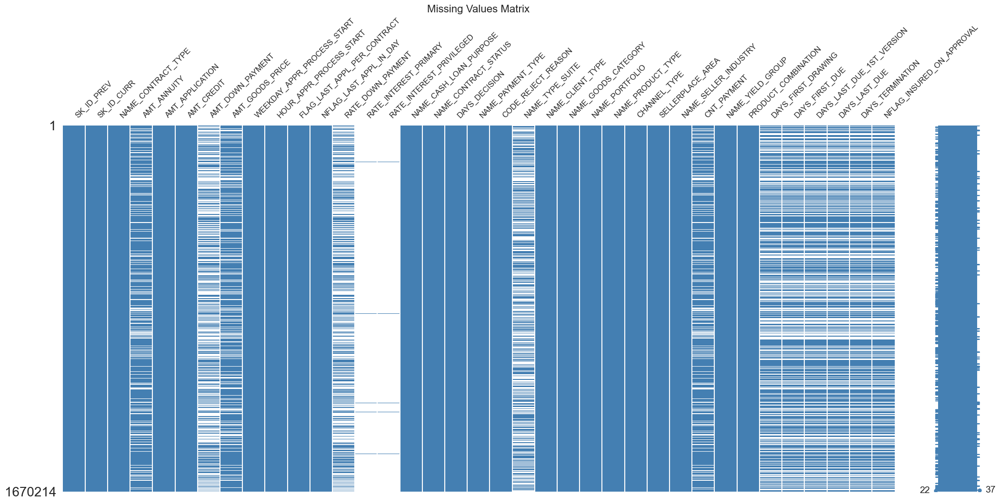

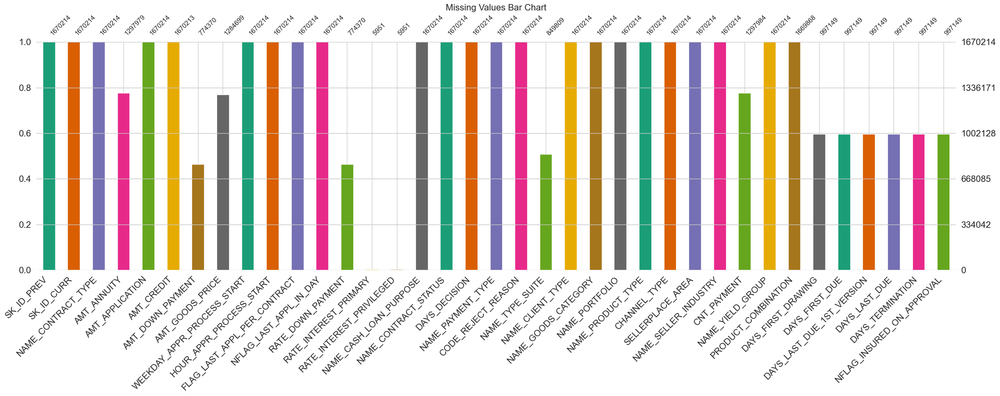


Number of duplicate rows: 0



,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL


In [107]:
missing_inf_values(pa)
show_missing(pa)
print(f"\nNumber of duplicate rows: {pa.duplicated().sum()}\n")
duplicates = pa[pa.duplicated()]
duplicates

dataset exhibits a significant number of missing values in key loan-related columns. The interest rate fields (RATE_INTEREST_PRIMARY, RATE_INTEREST_PRIVILEGED) are almost entirely missing, indicating that interest rate information may not be recorded for most applications. Down payment-related columns (AMT_DOWN_PAYMENT, RATE_DOWN_PAYMENT) have over 50% missing values, suggesting that many loans do not require a down payment. 

Timing-related variables (DAYS_TERMINATION, DAYS_LAST_DUE, DAYS_FIRST_DUE, DAYS_FIRST_DRAWING) have around 40% missing values, indicating that a large proportion of applications may not have reached the disbursement or due date stage. Similarly, insurance-related information (NFLAG_INSURED_ON_APPROVAL) is missing for 40% of cases.

Loan structure fields like AMT_ANNUITY and CNT_PAYMENT have missing values exceeding 22%, which can impact annuity-based loan calculations. Categorical variables like NAME_TYPE_SUITE (applicant's household situation) and PRODUCT_COMBINATION (loan structure) also contain missing values, but to a lesser extent.

Despite these gaps, no infinite values or duplicate rows were found, ensuring data consistency. Addressing these missing values appropriately will be crucial, especially for financial calculations and feature engineering.

In [108]:
columns_info("Dataset Overview", pa)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     2          NAME_CONTRACT_TYPE             category        N/A                            4
2     8          WEEKDAY_APPR_PROCESS_START     category        N/A                            7
3     10         FLAG_LAST_APPL_PER_CONTRACT    category        N/A                            2
4     15         NAME_CASH_LOAN_PURPOSE         category        N/A                            25
5     16         NAME_CONTRACT_STATUS           category        N/A                            4
6     18         NAME_PAYMENT_TYPE              category        N/A                            4
7     19         CODE_REJECT_REASON             category        N/A                            9
8     20         NAME_TYPE_SUITE                category  

In [109]:
analyze_data(pa)











































=== Numerical Analysis ===
|    | Variable                  |                N |             Mean |          SD |       SE |        95% Conf. |        Interval |
|---:|:--------------------------|-----------------:|-----------------:|------------:|---------:|-----------------:|----------------:|
|  0 | SK_ID_PREV                |      1.67021e+06 |      1.92309e+06 | 532598      | 412.11   |      1.92228e+06 |      1.9239e+06 |
|  1 | SK_ID_CURR                |      1.67021e+06 | 278357           | 102815      |  79.5554 | 278201           | 278513          |
|  2 | AMT_ANNUITY               |      1.29798e+06 |  15955.1         |  14782.1    |  12.9749 |  15929.7         |  15980.5        |
|  3 | AMT_APPLICATION           |      1.67021e+06 | 175234           | 292780      | 226.545  | 174790           | 175678          |
|  4 | AMT_CREDIT                |      1.67021e+06 | 196114           | 318575      | 246.505  | 195631           | 1965

In [110]:
continuous_columns = ['AMT_CREDIT', 'AMT_APPLICATION', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 
                      'RATE_DOWN_PAYMENT', 'DAYS_DECISION']
continuous_columns_for_boxplot = ['AMT_CREDIT', 'AMT_APPLICATION', 'AMT_ANNUITY', 'AMT_GOODS_PRICE']
x_columns = ['AMT_CREDIT', 'AMT_APPLICATION']
y_columns = ['AMT_ANNUITY', 'AMT_GOODS_PRICE']
categorical_columns = ['NAME_CONTRACT_TYPE', 'NAME_CLIENT_TYPE', 'NAME_PAYMENT_TYPE', 'NAME_GOODS_CATEGORY']

In [111]:
# plot_histograms(continuous_columns, pa)
# plot_boxplots(continuous_columns_for_boxplot, pa)
# plot_bar_plots(categorical_columns, pa)

- For high coputational and memory issue, so it's take long time to generate plots so that's the reson, one time generated and explained the below:

    - 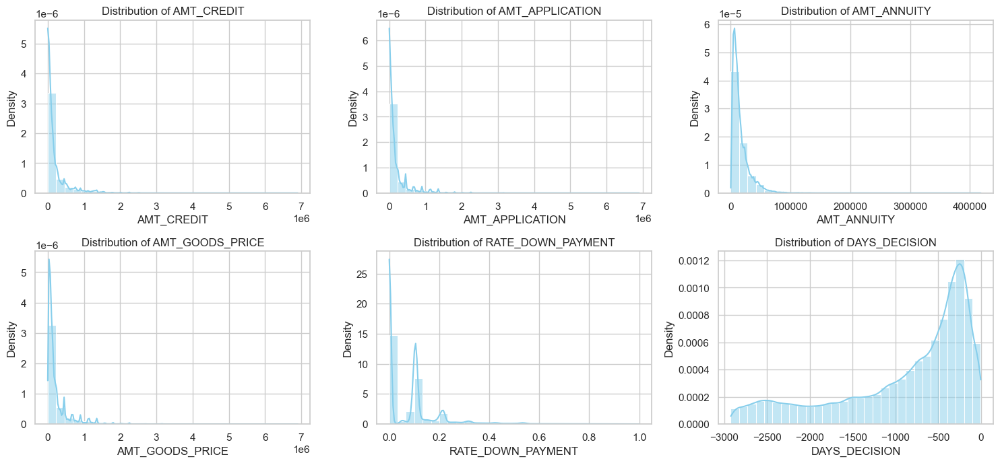
    
    - 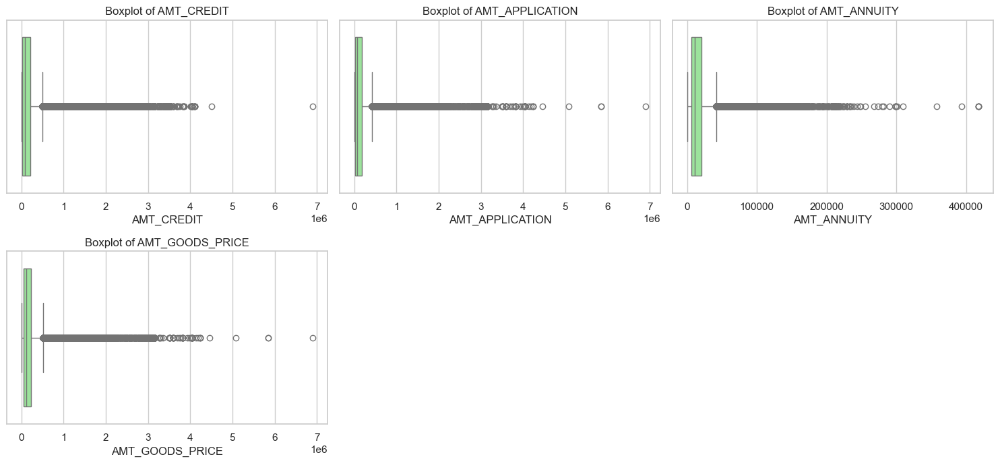

Significant missing values appear in interest rates, down payments, and days-related features. Credit amounts are highly skewed with notable outliers, as shown in density and boxplots. Decision timing (DAYS_DECISION) follows a long-tail distribution, reflecting varied application histories. Categorical variables related to contract status, client type, and product type require encoding. High missing values in financial features suggest imputation or categorical handling. Outliers in monetary variables indicate a need for capping strategies.

---

  - 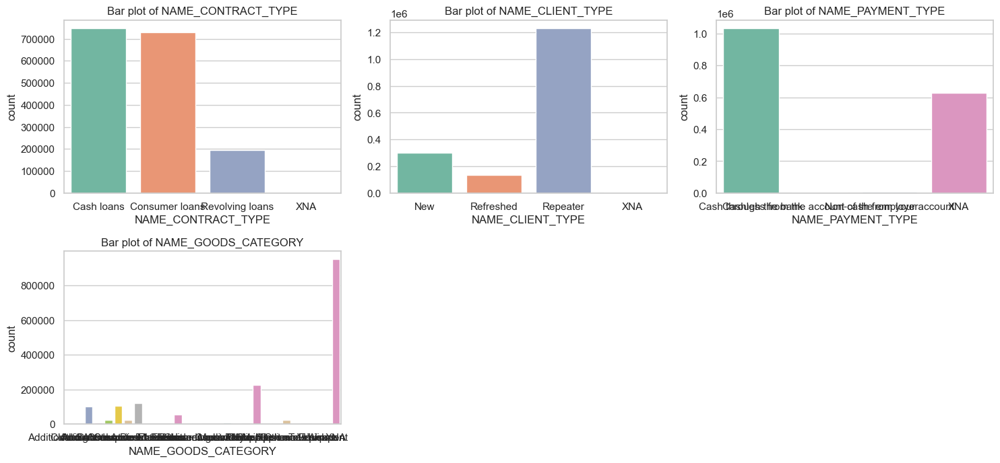

Cash loans and consumer loans dominate contract types, while most clients are repeat applicants. Payment types show a significant share of cash-based transactions. Goods categories are led by mobile and consumer electronics, but a large portion remains unspecified as "XNA." High missing values in these categorical features require handling through encoding or imputation.

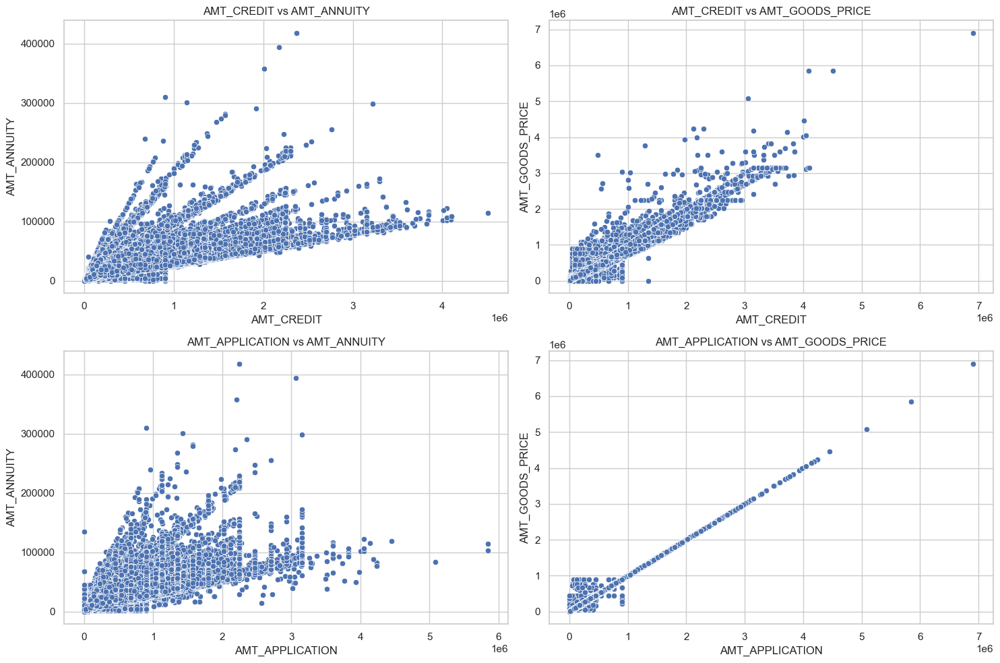

In [112]:
plot_scatter(x_columns, y_columns, pa)

Strong positive correlations are observed between credit amount and annuity, as well as between credit and goods price, indicating that higher credit values generally align with higher annuity payments and product costs. The relationship between application amount and goods price is almost linear, suggesting that requested loan amounts closely match the cost of goods being financed. These patterns confirm expected financial dependencies in loan applications.

In [113]:
pa_normal_df, pa_not_normal_df = normality_test_with_skew_kurt(pa)


Normal Columns (p > 0.05):


,Column,Test,Statistic,p_value,Skewness,Kurtosis



Not Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:


,Column,Test,Statistic,p_value,Skewness,Kurtosis
0,SK_ID_PREV,Kolmogorov-Smirnov,0.057259,0.0,-0.000573,-1.199752e+00
1,SK_ID_CURR,Kolmogorov-Smirnov,0.057718,0.0,-0.003303,-1.199259e+00
18,DAYS_LAST_DUE,Kolmogorov-Smirnov,0.483768,0.0,1.410472,-1.045125e-02
17,DAYS_LAST_DUE_1ST_VERSION,Kolmogorov-Smirnov,0.523531,0.0,2.779446,5.726110e+00
16,DAYS_FIRST_DUE,Kolmogorov-Smirnov,0.534929,0.0,4.644089,1.957050e+01
15,DAYS_FIRST_DRAWING,Kolmogorov-Smirnov,0.539315,0.0,-3.601338,1.096975e+01
13,SELLERPLACE_AREA,Kolmogorov-Smirnov,0.482377,0.0,529.619803,2.968797e+05
12,DAYS_DECISION,Kolmogorov-Smirnov,0.151663,0.0,-1.053079,-3.784931e-02
11,RATE_INTEREST_PRIVILEGED,Kolmogorov-Smirnov,0.325045,0.0,-1.007450,2.623522e-01
10,RATE_INTEREST_PRIMARY,Kolmogorov-Smirnov,0.426727,0.0,5.198447,2.819785e+01


In [114]:
pa_negative_values = pa.select_dtypes(include=[np.number]).lt(0).sum()
print("Columns with Negative Values:\n", pa_negative_values[pa_negative_values > 0])

Columns with Negative Values:
 AMT_DOWN_PAYMENT                   2
RATE_DOWN_PAYMENT                  2
DAYS_DECISION                1670214
SELLERPLACE_AREA              762675
DAYS_FIRST_DRAWING             62705
DAYS_FIRST_DUE                956504
DAYS_LAST_DUE_1ST_VERSION     678188
DAYS_LAST_DUE                 785928
DAYS_TERMINATION              771236
dtype: int64


Most numerical columns deviate from normality, with extreme skewness and kurtosis in variables like SELLERPLACE_AREA, AMT_DOWN_PAYMENT, and RATE_INTEREST_PRIMARY, indicating high asymmetry and heavy tails. Variables related to time (DAYS_DECISION, DAYS_TERMINATION, etc.) contain significant negative values, reflecting their nature as time-relative measures. The presence of infinite kurtosis in CNT_PAYMENT suggests extreme outliers or data inconsistencies.

In [115]:
num_summary(pa)

,Count,Unique,Mean,Std,Min,25%,50%,75%,Max,Mode,Range,IQR,Variance,Skewness,Kurtosis,Shapiro-Wilk Stat,Shapiro-Wilk p-value
SK_ID_PREV,1670214.0,1670214.0,1.923089e+06,532597.958700,1.000001e+06,1.461857e+06,1.923110e+06,2.384280e+06,2.845382e+06,1.000001e+06,1.845381e+06,9.224225e+05,2.836606e+11,-0.000600,-1.199800e+00,0.9555,0.0
SK_ID_CURR,1670214.0,338857.0,2.783572e+05,102814.823800,1.000010e+05,1.893290e+05,2.787145e+05,3.675140e+05,4.562550e+05,1.878680e+05,3.562540e+05,1.781850e+05,1.057089e+10,-0.003300,-1.199300e+00,0.9556,0.0
AMT_ANNUITY,1297979.0,357959.0,1.595512e+04,14782.137695,0.000000e+00,6.321780e+03,1.125000e+04,2.065842e+04,4.180582e+05,2.250000e+03,4.180582e+05,1.433664e+04,2.185116e+08,2.692600,1.506980e+01,NaN,1.0
AMT_APPLICATION,1670214.0,93885.0,1.752339e+05,292779.750000,0.000000e+00,1.872000e+04,7.104600e+04,1.803600e+05,6.905160e+06,0.000000e+00,6.905160e+06,1.616400e+05,8.571999e+10,3.391400,1.576220e+01,0.6037,0.0
AMT_CREDIT,1670213.0,86802.0,1.961140e+05,318574.625000,0.000000e+00,2.416050e+04,8.054100e+04,2.164185e+05,6.905160e+06,0.000000e+00,6.905160e+06,1.922580e+05,1.014898e+11,3.245800,1.423880e+01,NaN,1.0
AMT_DOWN_PAYMENT,774370.0,29278.0,6.697401e+03,20921.496094,-9.000000e-01,0.000000e+00,1.638000e+03,7.740000e+03,3.060045e+06,0.000000e+00,3.060046e+06,7.740000e+03,4.377090e+08,36.476601,2.901845e+03,NaN,1.0
AMT_GOODS_PRICE,1284699.0,93885.0,2.278472e+05,315396.562500,0.000000e+00,5.084100e+04,1.123200e+05,2.340000e+05,6.905160e+06,4.500000e+04,6.905160e+06,1.831590e+05,9.947500e+10,3.073700,1.286640e+01,NaN,1.0
HOUR_APPR_PROCESS_START,1670214.0,24.0,1.248420e+01,3.334000,0.000000e+00,1.000000e+01,1.200000e+01,1.500000e+01,2.300000e+01,1.100000e+01,2.300000e+01,5.000000e+00,1.111570e+01,-0.025600,-2.778000e-01,0.9968,0.0
NFLAG_LAST_APPL_IN_DAY,1670214.0,2.0,9.965000e-01,0.059300,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,3.500000e-03,-16.735900,2.780915e+02,0.0321,0.0
RATE_DOWN_PAYMENT,774370.0,7786.0,0.000000e+00,0.000000,-0.000000e+00,0.000000e+00,5.160522e-02,1.088867e-01,1.000000e+00,0.000000e+00,1.000000e+00,1.088867e-01,0.000000e+00,NaN,NaN,NaN,1.0


In [116]:
cat_summary(pa)

,Count,Unique,Top,Freq,Top %
NAME_CONTRACT_TYPE,1670214,4,Cash loans,747553,44.76%
WEEKDAY_APPR_PROCESS_START,1670214,7,TUESDAY,255118,15.27%
FLAG_LAST_APPL_PER_CONTRACT,1670214,2,Y,1661739,99.49%
NAME_CASH_LOAN_PURPOSE,1670214,25,XAP,922661,55.24%
NAME_CONTRACT_STATUS,1670214,4,Approved,1036781,62.07%
NAME_PAYMENT_TYPE,1670214,4,Cash through the bank,1033552,61.88%
CODE_REJECT_REASON,1670214,9,XAP,1353093,81.01%
NAME_TYPE_SUITE,849809,7,Unaccompanied,508970,59.89%
NAME_CLIENT_TYPE,1670214,4,Repeater,1231261,73.72%
NAME_GOODS_CATEGORY,1670214,28,XNA,950809,56.93%


---

In [117]:
pa_outlier_summary, pa_non_outlier_summary = comp_num_analysis(pa, outlier_df=True)
pa_missing_summary, pa_non_missing_summary = comp_num_analysis(pa, missing_df=True)
pa_cat_missing_summary, pa_cat_non_missing_summary = comp_cat_analysis(pa, missing_df=True)
pa_cat_missing_summary = pa_cat_missing_summary.sort_values(by="Unique_Count", ascending=False)
pa_cat_non_missing_summary = pa_cat_non_missing_summary.sort_values(by="Unique_Count", ascending=False)
print(pa_cat_missing_summary.shape)
print(pa_missing_summary.shape)
print(pa_outlier_summary.shape)

(2, 9)
(14, 31)
(18, 31)


In [118]:
pa_outlier_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
7,9,HOUR_APPR_PROCESS_START,int8,1670214,0.000000,24,0.000000,10.000000,12.000000,15.000000,2.300000e+01,11.000000,2.300000e+01,5.000000,2.500000,22.500000,24,4,1639,0.098131,0,0,0.000000,12.484182,1.111574e+01,3.334028,-0.025629,-2.777711e-01,Kolmogorov-Smirnov,0.077292,0.0
8,11,NFLAG_LAST_APPL_IN_DAY,int8,1670214,0.000000,2,0.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000,1.000000e+00,0.000000,1.000000,1.000000,2,1,5900,0.353248,0,0,0.000000,0.996468,3.520005e-03,0.059330,-16.735909,2.780907e+02,Kolmogorov-Smirnov,0.520206,0.0
11,14,RATE_INTEREST_PRIVILEGED,float16,5951,99.643698,25,0.373047,0.715820,0.834961,0.852539,1.000000e+00,0.834961,6.269531e-01,0.136719,0.510742,1.057617,25,5,72,1.209881,0,0,0.000000,0.773438,1.014709e-02,0.100708,-1.007450,2.623522e-01,Kolmogorov-Smirnov,0.325045,0.0
10,13,RATE_INTEREST_PRIMARY,float16,5951,99.643698,81,0.034790,0.160767,0.189087,0.193359,1.000000e+00,0.189087,9.653320e-01,0.032593,0.111877,0.242249,81,31,234,3.932112,0,0,0.000000,0.188354,7.678986e-03,0.087646,5.198447,2.819785e+01,Kolmogorov-Smirnov,0.426727,0.0
14,28,CNT_PAYMENT,float16,1297984,22.286366,49,0.000000,6.000000,12.000000,24.000000,8.400000e+01,12.000000,8.400000e+01,18.000000,-21.000000,51.000000,49,7,55903,4.306910,0,0,0.000000,NaN,0.000000e+00,0.000000,inf,inf,Kolmogorov-Smirnov,NaN,NaN
9,12,RATE_DOWN_PAYMENT,float16,774370,53.636480,7786,-0.000015,0.000000,0.051605,0.108887,1.000000e+00,0.000000,1.000000e+00,0.108887,-0.163330,0.272217,7786,1650,42985,5.550964,2,2,0.000258,0.000000,0.000000e+00,0.000000,2.108535,6.205778e+00,Kolmogorov-Smirnov,NaN,NaN
12,17,DAYS_DECISION,int16,1670214,0.000000,2922,-2922.000000,-1300.000000,-581.000000,-280.000000,-1.000000e+00,-245.000000,2.921000e+03,1020.000000,-2830.000000,1250.000000,2922,92,17571,1.052021,1670214,2922,100.000000,-880.679668,6.069963e+05,779.099667,-1.053079,-3.784931e-02,Kolmogorov-Smirnov,0.151663,0.0
16,32,DAYS_FIRST_DUE,float32,997149,40.298129,2892,-2892.000000,-1628.000000,-831.000000,-411.000000,3.652430e+05,365243.000000,3.681350e+05,1217.000000,-3453.500000,1414.500000,2892,1,40645,4.076121,956504,2891,95.923879,13826.271484,5.248259e+09,72444.867188,4.644089,1.957050e+01,Kolmogorov-Smirnov,0.534929,0.0
15,31,DAYS_FIRST_DRAWING,float32,997149,40.298129,2838,-2922.000000,365243.000000,365243.000000,365243.000000,3.652430e+05,365243.000000,3.681650e+05,0.000000,365243.000000,365243.000000,2838,2837,62705,6.288428,62705,2837,6.288428,342209.875000,7.906076e+09,88916.117188,-3.601338,1.096975e+01,Kolmogorov-Smirnov,0.539315,0.0
2,3,AMT_ANNUITY,float32,1297979,22.286665,357959,0.000000,6321.779785,11250.000000,20658.419922,4.180582e+05,2250.000000,4.180582e+05,14336.640137,-15183.180420,42163.380127,357959,20213,82762,6.376220,0,0,0.000000,15955.118164,2.185116e+08,14782.137695,2.692570,1.506977e+01,Kolmogorov-Smirnov,0.165036,0.0


In [119]:
pa_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
14,28,CNT_PAYMENT,float16,1297984,22.286366,49,0.000000,6.000000,12.000000,24.000000,8.400000e+01,12.000000,8.400000e+01,18.000000,-21.000000,51.000000,49,7,55903,4.306910,0,0,0.000000,NaN,0.000000e+00,0.000000,inf,inf,Kolmogorov-Smirnov,NaN,NaN
20,36,NFLAG_INSURED_ON_APPROVAL,float16,997149,40.298129,2,0.000000,0.000000,0.000000,1.000000,1.000000e+00,0.000000,1.000000e+00,1.000000,-1.500000,2.500000,2,0,0,0.000000,0,0,0.000000,NaN,0.000000e+00,0.000000,0.710499,-1.495920,Kolmogorov-Smirnov,NaN,NaN
9,12,RATE_DOWN_PAYMENT,float16,774370,53.636480,7786,-0.000015,0.000000,0.051605,0.108887,1.000000e+00,0.000000,1.000000e+00,0.108887,-0.163330,0.272217,7786,1650,42985,5.550964,2,2,0.000258,0.000000,0.000000e+00,0.000000,2.108535,6.205778,Kolmogorov-Smirnov,NaN,NaN
10,13,RATE_INTEREST_PRIMARY,float16,5951,99.643698,81,0.034790,0.160767,0.189087,0.193359,1.000000e+00,0.189087,9.653320e-01,0.032593,0.111877,0.242249,81,31,234,3.932112,0,0,0.000000,0.188354,7.678986e-03,0.087646,5.198447,28.197846,Kolmogorov-Smirnov,0.426727,0.0
11,14,RATE_INTEREST_PRIVILEGED,float16,5951,99.643698,25,0.373047,0.715820,0.834961,0.852539,1.000000e+00,0.834961,6.269531e-01,0.136719,0.510742,1.057617,25,5,72,1.209881,0,0,0.000000,0.773438,1.014709e-02,0.100708,-1.007450,0.262352,Kolmogorov-Smirnov,0.325045,0.0
4,5,AMT_CREDIT,float32,1670213,0.000060,86802,0.000000,24160.500000,80541.000000,216418.500000,6.905160e+06,0.000000,6.905160e+06,192258.000000,-264226.500000,504805.500000,86802,11671,179989,10.776410,0,0,0.000000,196113.968750,1.014898e+11,318574.625000,3.245814,14.238757,Kolmogorov-Smirnov,0.269080,0.0
2,3,AMT_ANNUITY,float32,1297979,22.286665,357959,0.000000,6321.779785,11250.000000,20658.419922,4.180582e+05,2250.000000,4.180582e+05,14336.640137,-15183.180420,42163.380127,357959,20213,82762,6.376220,0,0,0.000000,15955.118164,2.185116e+08,14782.137695,2.692570,15.069770,Kolmogorov-Smirnov,0.165036,0.0
6,7,AMT_GOODS_PRICE,float32,1284699,23.081773,93885,0.000000,50841.000000,112320.000000,234000.000000,6.905160e+06,45000.000000,6.905160e+06,183159.000000,-223897.500000,508738.500000,93885,4128,145715,11.342346,0,0,0.000000,227847.359375,9.947500e+10,315396.562500,3.073683,12.866296,Kolmogorov-Smirnov,0.246430,0.0
15,31,DAYS_FIRST_DRAWING,float32,997149,40.298129,2838,-2922.000000,365243.000000,365243.000000,365243.000000,3.652430e+05,365243.000000,3.681650e+05,0.000000,365243.000000,365243.000000,2838,2837,62705,6.288428,62705,2837,6.288428,342209.875000,7.906076e+09,88916.117188,-3.601338,10.969754,Kolmogorov-Smirnov,0.539315,0.0
16,32,DAYS_FIRST_DUE,float32,997149,40.298129,2892,-2892.000000,-1628.000000,-831.000000,-411.000000,3.652430e+05,365243.000000,3.681350e+05,1217.000000,-3453.500000,1414.500000,2892,1,40645,4.076121,956504,2891,95.923879,13826.271484,5.248259e+09,72444.867188,4.644089,19.570502,Kolmogorov-Smirnov,0.534929,0.0


In [120]:
pa_cat_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Mode,Mode Frequency,Mode %
15,30,PRODUCT_COMBINATION,category,1670214,0.020716,18,Cash,285990,17.122956
7,20,NAME_TYPE_SUITE,category,1670214,49.119754,8,nan,820405,49.119754


In [121]:
pa_cat_non_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Mode,Mode Frequency,Mode %
9,22,NAME_GOODS_CATEGORY,category,1670214,0.0,28,XNA,950809,56.927376
3,15,NAME_CASH_LOAN_PURPOSE,category,1670214,0.0,25,XAP,922661,55.242083
13,27,NAME_SELLER_INDUSTRY,category,1670214,0.0,11,XNA,855720,51.234153
6,19,CODE_REJECT_REASON,category,1670214,0.0,9,XAP,1353093,81.013152
12,25,CHANNEL_TYPE,category,1670214,0.0,8,Credit and cash offices,719968,43.106332
1,8,WEEKDAY_APPR_PROCESS_START,category,1670214,0.0,7,TUESDAY,255118,15.274570
10,23,NAME_PORTFOLIO,category,1670214,0.0,5,POS,691011,41.372603
14,29,NAME_YIELD_GROUP,category,1670214,0.0,5,XNA,517215,30.966990
8,21,NAME_CLIENT_TYPE,category,1670214,0.0,4,Repeater,1231261,73.718757
4,16,NAME_CONTRACT_STATUS,category,1670214,0.0,4,Approved,1036781,62.074740


In [122]:
high_leakage_cols = [
    'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
    'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'
]
pa.drop(columns=high_leakage_cols, inplace=True)

In [123]:
pa.replace(['XNA', 'XAP', 365243], np.nan, inplace=True)

In [124]:
pa['AMT_DOWN_PAYMENT'] = pa['AMT_DOWN_PAYMENT'].apply(lambda x: max(x, 0))
pa['RATE_DOWN_PAYMENT'] = pa['RATE_DOWN_PAYMENT'].apply(lambda x: max(x, 0))

In [125]:
columns_to_drop = ['RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED',
                   'NAME_CASH_LOAN_PURPOSE','CODE_REJECT_REASON']
pa = pa.drop(columns=columns_to_drop)

In [126]:
def cap_extreme_values(df, columns):
    for col in columns:
        percentile_99 = df[col].quantile(0.99)
        df[col] = np.minimum(df[col], percentile_99)
    return df
columns_to_cap = ['AMT_CREDIT', 'AMT_GOODS_PRICE', 'AMT_APPLICATION', 'AMT_ANNUITY']
pa = cap_extreme_values(pa, columns_to_cap)

In [127]:
# Loan Amount Ratios
pa['INCOME_TO_CREDIT_RATIO'] = pa['AMT_CREDIT'] / pa['AMT_APPLICATION']
pa['DOWN_PAYMENT_RATIO'] = pa['AMT_DOWN_PAYMENT'] / pa['AMT_CREDIT']
pa['LOAN_TO_GOODS_PRICE'] = pa['AMT_CREDIT'] / pa['AMT_GOODS_PRICE']
# Interaction Features
pa['CREDIT_TO_ANNUITY_RATIO'] = pa['AMT_CREDIT'] / pa['AMT_ANNUITY']
pa['DOWN_PAYMENT_TO_CREDIT'] = pa['AMT_DOWN_PAYMENT'] / pa['AMT_CREDIT']
# Create flag features
pa['LAST_APPL_IN_DAY'] = pa['NFLAG_LAST_APPL_IN_DAY']
pa['PAYMENT_FREQUENCY'] = pa['CNT_PAYMENT']

In [128]:
from category_encoders import BinaryEncoder

categorical_cols = ['NAME_GOODS_CATEGORY', 'PRODUCT_COMBINATION', 'NAME_SELLER_INDUSTRY',
                    'NAME_TYPE_SUITE', 'NAME_PORTFOLIO', 'NAME_YIELD_GROUP',
                    'NAME_CONTRACT_TYPE', 'NAME_CLIENT_TYPE', 'NAME_PAYMENT_TYPE',
                    'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'WEEKDAY_APPR_PROCESS_START',
                    'NAME_CONTRACT_STATUS', 'FLAG_LAST_APPL_PER_CONTRACT']

for col in categorical_cols:
    if col in pa.columns:
        pa[col] = pa[col].astype(str).fillna('Missing')

one_hot_cols = ['NAME_CONTRACT_TYPE', 'NAME_CLIENT_TYPE', 'NAME_PAYMENT_TYPE',
                'NAME_PRODUCT_TYPE', 'NAME_CONTRACT_STATUS']
pa = pd.get_dummies(pa, columns=one_hot_cols, drop_first=True)

label_cols = ['NAME_PORTFOLIO', 'NAME_YIELD_GROUP', 'WEEKDAY_APPR_PROCESS_START']
for col in label_cols:
    if col in pa.columns:
        le = LabelEncoder()
        pa[col] = le.fit_transform(pa[col])
frequency_cols = ['NAME_GOODS_CATEGORY', 'PRODUCT_COMBINATION', 'NAME_SELLER_INDUSTRY',
                  'NAME_TYPE_SUITE', 'CHANNEL_TYPE']
for col in frequency_cols:
    freq = pa[col].value_counts(normalize=True)
    pa[col + '_FREQ'] = pa[col].map(freq)

binary_encoder = BinaryEncoder()
pa_binary = binary_encoder.fit_transform(pa[['FLAG_LAST_APPL_PER_CONTRACT']])
pa_binary.columns = [f'FLAG_LAST_APPL_PER_CONTRACT_{c}' for c in pa_binary.columns]
pa = pd.concat([pa, pa_binary], axis=1)
pa.drop(['FLAG_LAST_APPL_PER_CONTRACT'], axis=1, inplace=True)

The dataset undergoes a structured transformation to enhance its quality for predictive modeling. High-leakage columns related to contract timelines and insured applications are removed to prevent target contamination. Missing values, including placeholders such as pa'XNA'pa, pa'XAP'pa, and pa365243pa, are replaced with paNaNpa to ensure proper handling. To mitigate the influence of extreme values, financial features such as paAMT_CREDITpa, paAMT_GOODS_PRICEpa, paAMT_APPLICATIONpa, and paAMT_ANNUITYpa are capped at the 99th percentile.

New financial ratios are created to improve feature representation. These include the ratio of credit to application amount, down payment relative to total credit, loan amount compared to goods price, and annuity-to-credit ratios, all of which add valuable insight into loan affordability and customer financial behavior. Additionally, interaction features such as the proportion of down payment in total credit further refine the dataset's financial dimensions.

Categorical variables are carefully processed to ensure compatibility with machine learning models. One-hot encoding is applied to key categorical features like contract type and client type, while label encoding is used for ordinal variables such as portfolio and weekday of application processing. High-cardinality features, including goods category and product combination, undergo frequency encoding to retain information while minimizing dimensional complexity. 

Binary encoding is applied to paFLAG_LAST_APPL_PER_CONTRACTpa, ensuring its categorical nature is preserved without introducing excessive dimensions. With these transformations, the dataset is now refined, balancing the removal of redundant features, the introduction of meaningful derived variables, and the encoding of categorical attributes to optimize its usability for predictive modeling.

In [129]:
pa.replace([np.inf, -np.inf], np.nan, inplace=True)

In [130]:
pa=optimize_data_types(pa)

In [131]:
missing_inf_values(pa)

Missing Values Summary:
                        Data Type  Missing Count  Missing Percentage
AMT_DOWN_PAYMENT          float32         895844           53.636480
DOWN_PAYMENT_TO_CREDIT    float32         895844           53.636480
RATE_DOWN_PAYMENT         float32         895844           53.636480
DOWN_PAYMENT_RATIO        float32         895844           53.636480
INCOME_TO_CREDIT_RATIO    float32         392402           23.494115
LOAN_TO_GOODS_PRICE       float32         392384           23.493037
AMT_GOODS_PRICE           float32         385515           23.081773
CREDIT_TO_ANNUITY_RATIO   float32         373872           22.384676
AMT_ANNUITY               float32         372235           22.286665
PAYMENT_FREQUENCY         float16         372230           22.286366
CNT_PAYMENT               float16         372230           22.286366
AMT_CREDIT                float32              1            0.000060
SK_ID_CURR                float32              1            0.000060

Infinite 


Normal Columns (p > 0.05):


,Column,Test,Statistic,p_value,Skewness,Kurtosis



Not Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:


,Column,Test,Statistic,p_value,Skewness,Kurtosis
0,SK_ID_PREV,Kolmogorov-Smirnov,0.057259,0.0,-0.000573,-1.199752e+00
1,SK_ID_CURR,Kolmogorov-Smirnov,0.057718,0.0,-0.003301,-1.199259e+00
28,FLAG_LAST_APPL_PER_CONTRACT_FLAG_LAST_APPL_PER_CONTRACT_0,Kolmogorov-Smirnov,0.523392,0.0,13.931278,1.920805e+02
27,CHANNEL_TYPE_FREQ,Kolmogorov-Smirnov,0.257436,0.0,-0.623121,-1.064272e+00
26,NAME_TYPE_SUITE_FREQ,Kolmogorov-Smirnov,0.302488,0.0,-0.725047,-7.495849e-01
25,NAME_SELLER_INDUSTRY_FREQ,Kolmogorov-Smirnov,0.335729,0.0,-0.365726,-1.402827e+00
24,PRODUCT_COMBINATION_FREQ,Kolmogorov-Smirnov,0.181567,0.0,-0.032829,-1.486574e+00
23,NAME_GOODS_CATEGORY_FREQ,Kolmogorov-Smirnov,0.375407,0.0,-0.321557,-1.842800e+00
21,LAST_APPL_IN_DAY,Kolmogorov-Smirnov,0.520206,0.0,-16.735909,2.780907e+02
20,DOWN_PAYMENT_TO_CREDIT,Kolmogorov-Smirnov,0.296187,0.0,7.076835,1.361025e+02



Variables Exhibiting Multicollinearity (|Correlation| > 0.80):
- FLAG_LAST_APPL_PER_CONTRACT_FLAG_LAST_APPL_PER_CONTRACT_0 & FLAG_LAST_APPL_PER_CONTRACT_FLAG_LAST_APPL_PER_CONTRACT_1: Correlation=-1.0000
- NAME_SELLER_INDUSTRY_FREQ & NAME_GOODS_CATEGORY_FREQ: Correlation=0.8203
- NAME_GOODS_CATEGORY_FREQ & SELLERPLACE_AREA: Correlation=-0.8013
- LAST_APPL_IN_DAY & NFLAG_LAST_APPL_IN_DAY: Correlation=1.0000
- DOWN_PAYMENT_TO_CREDIT & LOAN_TO_GOODS_PRICE: Correlation=-0.8658
- DOWN_PAYMENT_TO_CREDIT & DOWN_PAYMENT_RATIO: Correlation=1.0000
- DOWN_PAYMENT_TO_CREDIT & INCOME_TO_CREDIT_RATIO: Correlation=-0.8656
- DOWN_PAYMENT_TO_CREDIT & RATE_DOWN_PAYMENT: Correlation=0.9999
- DOWN_PAYMENT_TO_CREDIT & AMT_DOWN_PAYMENT: Correlation=0.9182
- LOAN_TO_GOODS_PRICE & DOWN_PAYMENT_RATIO: Correlation=-0.8658
- LOAN_TO_GOODS_PRICE & INCOME_TO_CREDIT_RATIO: Correlation=0.9988
- LOAN_TO_GOODS_PRICE & RATE_DOWN_PAYMENT: Correlation=-0.8658
- DOWN_PAYMENT_RATIO & INCOME_TO_CREDIT_RATIO: Correlation=-0

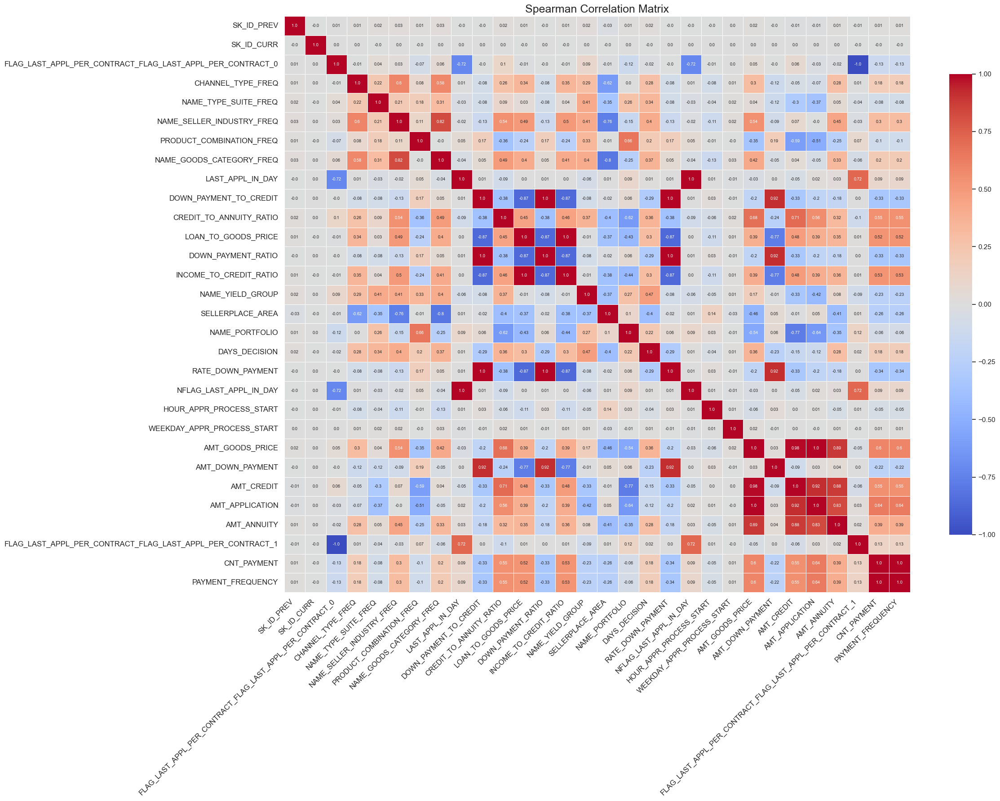

In [132]:
pa_normal_df, pa_not_normal_df = normality_test_with_skew_kurt(pa)
spearman_correlation(pa, pa_not_normal_df, exclude_target='TARGET', multicollinearity_threshold=0.8)

The with many features being nearly identical or highly correlated. Key financial ratios such as DOWN_PAYMENT_TO_CREDIT, DOWN_PAYMENT_RATIO, and RATE_DOWN_PAYMENT are almost redundant. Credit-related variables like AMT_GOODS_PRICE, AMT_CREDIT, and AMT_APPLICATION are highly correlated, indicating possible feature redundancy. Additionally, categorical frequency encodings (NAME_SELLER_INDUSTRY_FREQ & NAME_GOODS_CATEGORY_FREQ) and duplicate indicators (CNT_PAYMENT & PAYMENT_FREQUENCY) suggest the need for feature selection. Removing or consolidating these redundant features will improve model performance and stability.

In [133]:
available_columns = pa.columns.tolist()
num_aggregations = {}
for col in [
    'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'AMT_DOWN_PAYMENT',
    'CREDIT_TO_ANNUITY_RATIO', 'DOWN_PAYMENT_TO_CREDIT', 'LOAN_TO_GOODS_PRICE', 
    'DOWN_PAYMENT_RATIO'
]:
    if col in available_columns:
        num_aggregations[col] = ['min', 'max', 'mean', 'sum', 'var'] 
cat_aggregations = {}
for col in [c for c in available_columns if '_FREQ' in c]:  
    cat_aggregations[col] = ['mean']
for col in [c for c in available_columns if 'FLAG_LAST_APPL_PER_CONTRACT_' in c]:  
    cat_aggregations[col] = ['mean']
pa_agg = pa.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
pa_agg.columns = ['PA_' + '_'.join(col).upper() for col in pa_agg.columns]
pa_agg.reset_index(inplace=True)
print("Final Aggregated Data Shape:", pa_agg.shape)

Final Aggregated Data Shape: (338856, 54)


In [134]:
final_data = at_bu_bub.merge(pa_agg, on='SK_ID_CURR', how='left')
print("Final Merged Data Shape:", final_data.shape)

Final Merged Data Shape: (307511, 230)


The previous application dataset has been aggregated at the SK_ID_CURR level, summarizing financial variables such as loan amounts, annuities, and down payments using statistical measures like min, max, mean, sum, and variance. Frequency-encoded categorical features and binary flags have also been aggregated using their mean values. The final merged dataset integrates this summarized information with the application and bureau data, expanding the feature set while maintaining a structured format for modeling.

---

### 4 POS_CASH_balance

---

In [135]:
base_profile_df, linked_profiles_df = compare_df_columns('pc', dataframes)
display_key_columns('pc', dataframes)

| Column               | Linked DataFrames       |
|:---------------------|:------------------------|
| SK_ID_PREV           | ccb, pa, ip             |
| SK_ID_CURR           | at, bu_bub, ccb, pa, ip |
| MONTHS_BALANCE       | bu_bub, ccb             |
| NAME_CONTRACT_STATUS | ccb, pa                 |
| SK_DPD               | ccb                     |
| SK_DPD_DEF           | ccb                     |


In [136]:
base_profile_df

,Dataset,Column,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,pc,SK_ID_PREV,10001358,1,0,0.00%,0,N/A,0,0.00%,int32
1,pc,SK_ID_CURR,10001358,1,0,0.00%,0,N/A,0,0.00%,int32
2,pc,MONTHS_BALANCE,10001358,1,0,0.00%,10001358,N/A,0,0.00%,int8
3,pc,NAME_CONTRACT_STATUS,10001358,1,0,0.00%,N/A,N/A,N/A,N/A,category
4,pc,SK_DPD,10001358,1,0,0.00%,0,N/A,295227,2.95%,int16
5,pc,SK_DPD_DEF,10001358,1,0,0.00%,0,N/A,113969,1.14%,int16


In [137]:
linked_profiles_df

,Dataset,Column,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,ccb,SK_ID_PREV,3840312,1,0,0.00%,0,N/A,0,0.00%,int32
1,pa,SK_ID_PREV,1670214,1,0,0.00%,0,N/A,0,0.00%,int32
2,ip,SK_ID_PREV,13605401,1,0,0.00%,0,N/A,0,0.00%,int32
3,at,SK_ID_CURR,307511,1,0,0.00%,0,N/A,0,0.00%,int32
4,bu_bub,SK_ID_CURR,25121815,1,0,0.00%,0,N/A,0,0.00%,int32
5,ccb,SK_ID_CURR,3840312,1,0,0.00%,0,N/A,0,0.00%,int32
6,pa,SK_ID_CURR,1670214,1,1,0.00%,0,N/A,0,0.00%,float64
7,ip,SK_ID_CURR,13605401,1,0,0.00%,0,N/A,0,0.00%,int32
8,bu_bub,MONTHS_BALANCE,25121815,1,942074,3.75%,23591219,N/A,143321,0.57%,float32
9,ccb,MONTHS_BALANCE,3840312,1,0,0.00%,3840312,N/A,0,0.00%,int8


In [138]:
linked_cols = [
    'SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'NAME_CONTRACT_STATUS', 
    'SK_DPD', 'SK_DPD_DEF'
]

---

datset domain perspective

The POS Cash Balance (pc) dataset contains 10,001,358 rows and 8 columns, providing historical insights into installment-based loans such as Point-of-Sale (POS) and cash loans. This dataset captures repayment behavior, contract status, and delinquency information.

 1. Identifiers
- SK_ID_PREV: Unique identifier for each previous installment-based loan.
- SK_ID_CURR: Foreign key linking to the main applicant dataset.

 2. Time-Based Features
- MONTHS_BALANCE: Represents the month of the recorded installment relative to the current application, with negative values indicating past months.

 3. Installment Details
- CNT_INSTALMENT: Total number of installments planned for the loan.
- CNT_INSTALMENT_FUTURE: Number of remaining installments at a given MONTHS_BALANCE.

 4. Contract Status
- NAME_CONTRACT_STATUS: Status of the installment contract at the recorded month. Categories include:
  - Active: Loan is currently being repaid.
  - Completed: Fully repaid.
  - Signed: Agreement finalized, but repayment hasn't started.
  - Demand: Loan in arrears requiring immediate repayment.
  - Canceled: Agreement terminated before activation.
  - Amortized debt: Loan has been gradually reduced.

 5. Delinquency Indicators
- SK_DPD: Days past due, representing the number of days an installment is overdue.
- SK_DPD_DEF: Days past due, but only for officially recognized late payments.


In [139]:
print(pc.shape)
for idx, col in enumerate(pc.columns):
    print(f"{idx}: {col}")

(10001358, 8)
0: SK_ID_PREV
1: SK_ID_CURR
2: MONTHS_BALANCE
3: CNT_INSTALMENT
4: CNT_INSTALMENT_FUTURE
5: NAME_CONTRACT_STATUS
6: SK_DPD
7: SK_DPD_DEF


In [140]:
detect_mixed_data_types(pc)

'No mixed data types detected!'

In [141]:
cat_high_cardinality(pc)

high_cardinality_columns


[]

In [142]:
pc.dtypes.value_counts()

int32       2
float16     2
int16       2
int8        1
category    1
Name: count, dtype: int64

Missing Values Summary:
                      Data Type  Missing Count  Missing Percentage
CNT_INSTALMENT_FUTURE   float16          26087            0.260835
CNT_INSTALMENT          float16          26071            0.260675

Infinite Values Summary:
No infinite values found.


<Figure size 2000x800 with 0 Axes>

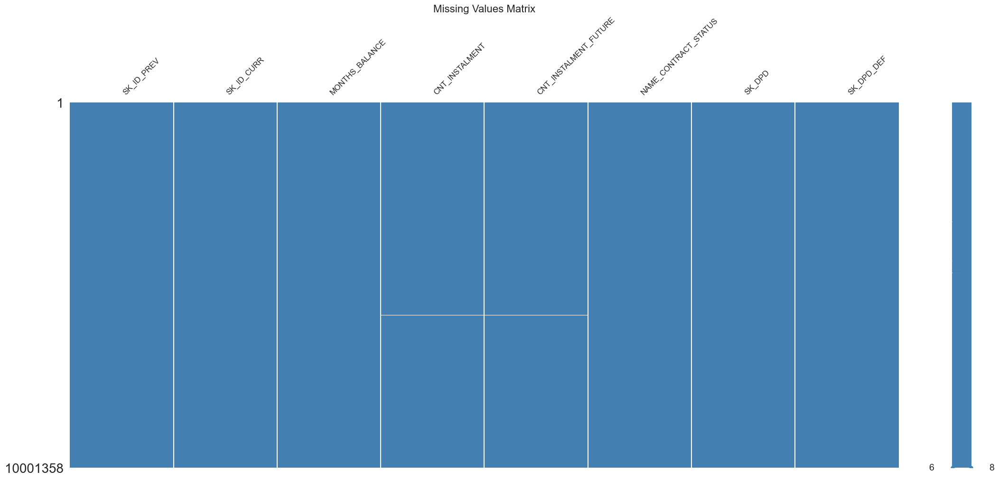

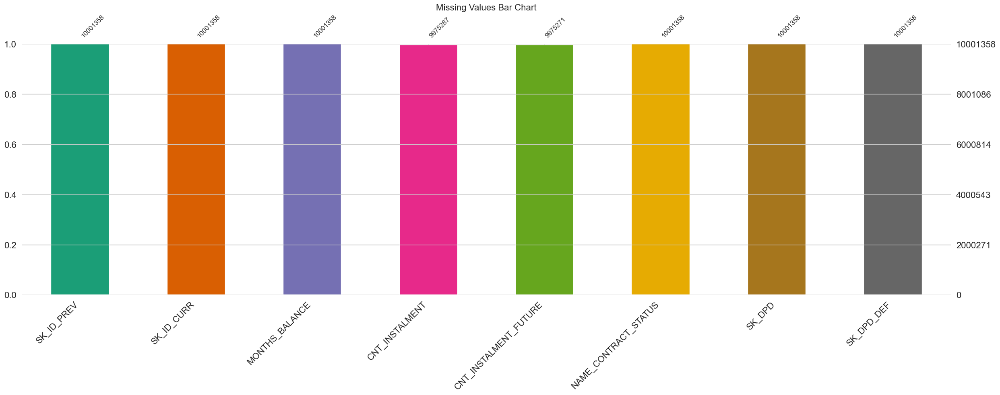


Number of duplicate rows: 0



,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF


In [143]:
missing_inf_values(pc)
show_missing(pc)
print(f"\nNumber of duplicate rows: {pc.duplicated().sum()}\n")
duplicates = pc[pc.duplicated()]
duplicates

The dataset has minimal missing values, with CNT_INSTALMENT_FUTURE and CNT_INSTALMENT showing only **0.26%** missing data, which is negligible. No infinite values are present, and there are no duplicate rows, ensuring data consistency. The completeness of the dataset makes it highly reliable for modeling installment loan behavior.

In [144]:
columns_info("Dataset Overview", pc)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     5          NAME_CONTRACT_STATUS           category        N/A                            9
2     3          CNT_INSTALMENT                 float16         1.0 - 92.0                     73
3     4          CNT_INSTALMENT_FUTURE          float16         0.0 - 85.0                     79
4     6          SK_DPD                         int16           0 - 4231                       3400
5     7          SK_DPD_DEF                     int16           0 - 3595                       2307
6     0          SK_ID_PREV                     int32           1000001 - 2843499              936325
7     1          SK_ID_CURR                     int32           100001 - 456255                337252
8     2          MONTHS_BALANCE          

In [145]:
analyze_data(pc)















=== Numerical Analysis ===
|    | Variable              |           N |             Mean |          SD |       SE |        95% Conf. |         Interval |
|---:|:----------------------|------------:|-----------------:|------------:|---------:|-----------------:|-----------------:|
|  0 | SK_ID_PREV            | 1.00014e+07 |      1.90322e+06 | 535847      | 169.438  |      1.90288e+06 |      1.90355e+06 |
|  1 | SK_ID_CURR            | 1.00014e+07 | 278404           | 102764      |  32.4945 | 278340           | 278468           |
|  2 | MONTHS_BALANCE        | 1.00014e+07 |    -35.0126      |     26.0666 |   0.0082 |    -35.0287      |    -34.9964      |
|  3 | CNT_INSTALMENT        | 9.97529e+06 |    nan           |      0      | inf      |    nan           |    nan           |
|  4 | CNT_INSTALMENT_FUTURE | 9.97527e+06 |    nan           |      0      | inf      |    nan           |    nan           |
|  5 | SK_DPD                | 1.00014e+07 |     11.6069      |    132

In [146]:
# kde_batches(pc, batch_num=1)
# box_plot_batches(pc, batch_num=1)

In [147]:
# plt.figure(figsize=(12, 6))
# sns.lineplot(x=pc['MONTHS_BALANCE'], y=pc['SK_DPD'], marker='o')
# plt.title('Overdue Days (SK_DPD) Over Time (Months Balance)')
# plt.xlabel('Months Balance')
# plt.ylabel('Overdue Days (SK_DPD)')
# plt.show()

- For high coputational and memory issue, so it's take long time to generate plots so that's the reson, one time generated and explained the below:

    - 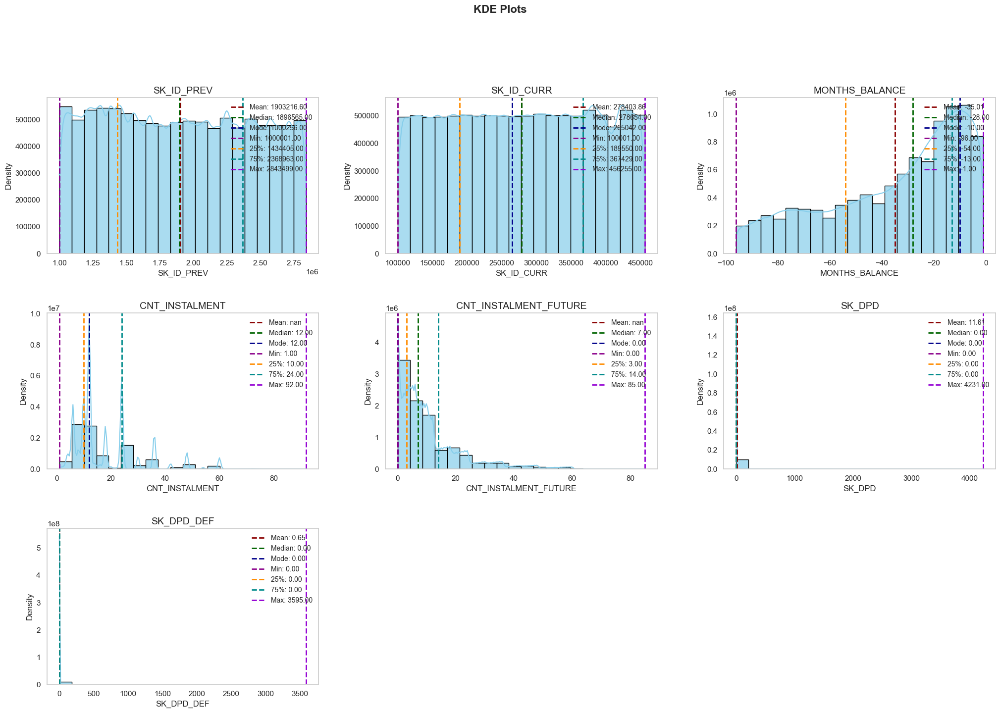
    
    - 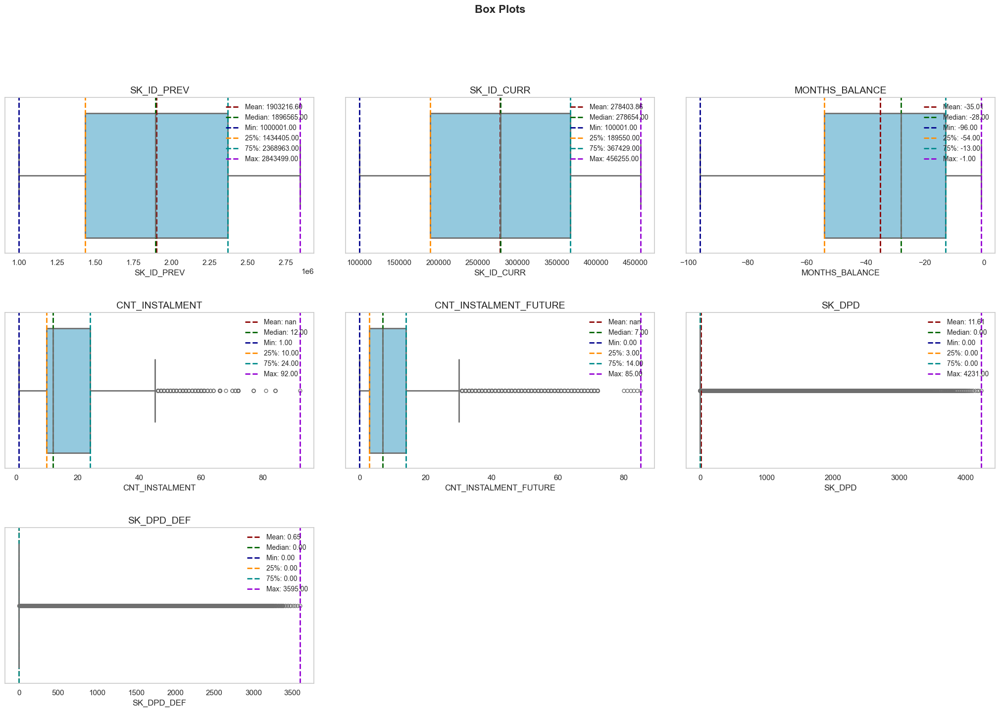


The distributions of SK_DPD and SK_DPD_DEF show that most values are concentrated around zero, with extreme outliers indicating delayed payments in a few cases. The MONTHS_BALANCE variable exhibits a uniform distribution, representing the timeline of installment payments. CNT_INSTALMENT and CNT_INSTALMENT_FUTURE are right-skewed, showing that most contracts have a lower number of installments, while some extend significantly. 

Box plots confirm the presence of extreme outliers in SK_DPD and CNT_INSTALMENT, reinforcing the need for capping or transformation. The CNT_INSTALMENT_FUTURE variable exhibits a similar pattern with high dispersion in upper values. The dataset appears structured with few missing values, mostly in installment-related columns, and no duplicate or infinite values were found.

---

- 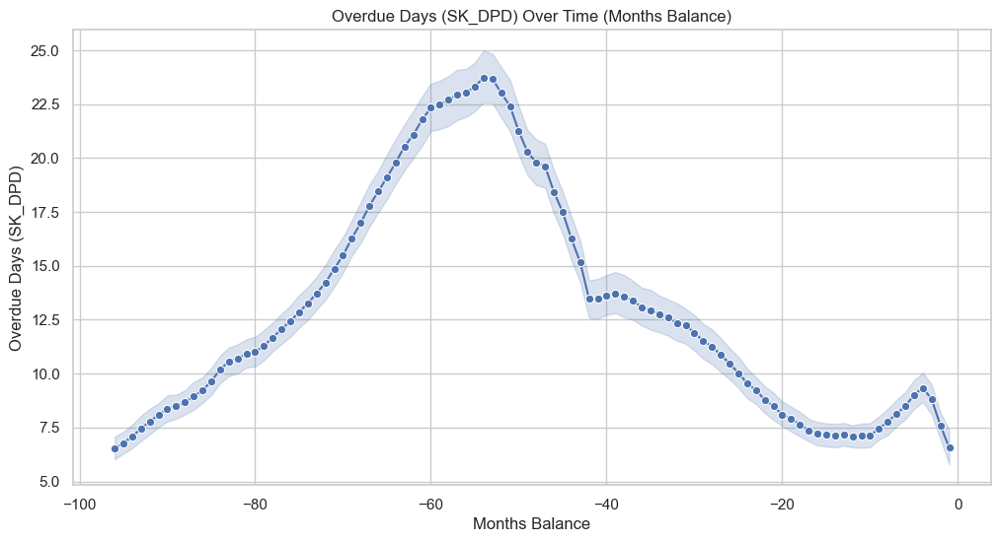

- The trend in overdue days (SK_DPD) over time (Months Balance) shows an initial increase, peaking at around -60 months, indicating worsening repayment behavior. After reaching a maximum of about 25 overdue days, the trend reverses, suggesting an improvement in repayments over time. The decline continues, stabilizing around -20 months, followed by a minor uptick near recent months, which may indicate renewed financial stress. The shaded confidence interval highlights variability, with the highest fluctuations occurring around the peak delinquency period.


Value counts and percentages for Name_Contract_Status:

| Name_Contract_Status   |   Count |   % Total |
|:-----------------------|--------:|----------:|
| Active                 | 9151119 |     91.5  |
| Completed              |  744883 |      7.45 |
| Signed                 |   87260 |      0.87 |
| Demand                 |    7065 |      0.07 |
| Returned to the store  |    5461 |      0.05 |
| Approved               |    4917 |      0.05 |
| Amortized debt         |     636 |      0.01 |
| Canceled               |      15 |      0    |
| XNA                    |       2 |      0    |


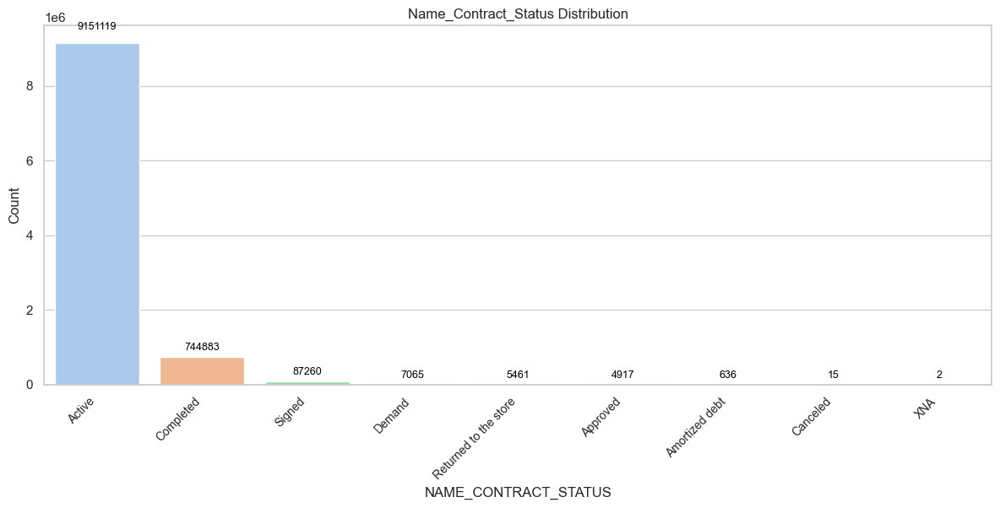

In [148]:
cat_analyze_and_plot(pc, "NAME_CONTRACT_STATUS")

The distribution of NAME_CONTRACT_STATUS reveals that the majority of contracts (91.5%) remain active, indicating ongoing obligations. Completed contracts account for 7.45%, showing a significant portion of loans that have been fully repaid. Other statuses, such as Signed, Demand, and Approved, collectively represent less than 1% of the dataset, suggesting fewer contracts in transitional or pre-approval stages. Minimal occurrences of statuses like "Returned to the store," "Amortized debt," and "Canceled" indicate rare events, while the presence of XNA is negligible and likely represents data inconsistencies.

In [149]:
pc_normal_df, pc_not_normal_df = normality_test_with_skew_kurt(pc)


Normal Columns (p > 0.05):


,Column,Test,Statistic,p_value,Skewness,Kurtosis



Not Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:


,Column,Test,Statistic,p_value,Skewness,Kurtosis
0,SK_ID_PREV,Kolmogorov-Smirnov,0.065804,0.0,0.044229,-1.216184
1,SK_ID_CURR,Kolmogorov-Smirnov,0.057528,0.0,-0.003128,-1.196839
2,MONTHS_BALANCE,Kolmogorov-Smirnov,0.121342,0.0,-0.672777,-0.710681
5,SK_DPD,Kolmogorov-Smirnov,0.505328,0.0,14.899124,255.322068
6,SK_DPD_DEF,Kolmogorov-Smirnov,0.496573,0.0,66.339896,4836.546934
3,CNT_INSTALMENT,Kolmogorov-Smirnov,NaN,NaN,inf,inf
4,CNT_INSTALMENT_FUTURE,Kolmogorov-Smirnov,NaN,NaN,inf,inf


In [150]:
num_summary(pc)

,Count,Unique,Mean,Std,Min,25%,50%,75%,Max,Mode,Range,IQR,Variance,Skewness,Kurtosis,Shapiro-Wilk Stat,Shapiro-Wilk p-value
SK_ID_PREV,10001358.0,936325.0,1.903217e+06,535846.5307,1000001.0,1434405.0,1896565.0,2368963.0,2843499.0,1000256.0,1843498.0,934558.0,2.871315e+11,0.0442,-1.2162,0.9595,0.0
SK_ID_CURR,10001358.0,337252.0,2.784039e+05,102763.7451,100001.0,189550.0,278654.0,367429.0,456255.0,265042.0,356254.0,177879.0,1.056039e+10,-0.0031,-1.1968,0.9572,0.0
MONTHS_BALANCE,10001358.0,96.0,-3.501260e+01,26.0666,-96.0,-54.0,-28.0,-13.0,-1.0,-10.0,95.0,41.0,6.794661e+02,-0.6728,-0.7107,0.9371,0.0
CNT_INSTALMENT,9975287.0,73.0,NaN,0.0000,1.0,inf,inf,inf,inf,12.0,inf,inf,0.000000e+00,NaN,NaN,NaN,1.0
CNT_INSTALMENT_FUTURE,9975271.0,79.0,NaN,0.0000,0.0,3.0,inf,inf,inf,0.0,inf,inf,0.000000e+00,NaN,NaN,NaN,1.0
SK_DPD,10001358.0,3400.0,1.160690e+01,132.7140,0.0,0.0,0.0,0.0,4231.0,0.0,4231.0,0.0,1.761302e+04,14.8991,255.3222,0.0629,0.0
SK_DPD_DEF,10001358.0,2307.0,6.545000e-01,32.7625,0.0,0.0,0.0,0.0,3595.0,0.0,3595.0,0.0,1.073381e+03,66.3399,4836.5494,0.0054,0.0


In [151]:
cat_summary(pc)

,Count,Unique,Top,Freq,Top %
NAME_CONTRACT_STATUS,10001358,9,Active,9151119,91.50%


In [152]:
pc_negative_values = pc.select_dtypes(include=[np.number]).lt(0).sum()
print("Columns with Negative Values:\n", pc_negative_values[pc_negative_values > 0])

Columns with Negative Values:
 MONTHS_BALANCE    10001358
dtype: int64


The dataset exhibits a strong deviation from normality, with all numerical columns failing the normality test (p ≤ 0.05). SK_ID_PREV and SK_ID_CURR show mild skewness and negative kurtosis, indicating a near-uniform distribution. MONTHS_BALANCE is slightly skewed to the left, reflecting more recent data points being concentrated. 

Severe skewness and high kurtosis in SK_DPD and SK_DPD_DEF indicate extreme outliers, suggesting that while most cases have low overdue days, some accounts experience significantly long delays. CNT_INSTALMENT and CNT_INSTALMENT_FUTURE have infinite skewness and kurtosis values, which likely results from a high concentration of specific installment counts. 

MONTHS_BALANCE contains only negative values, as expected in a time-series format where values represent months before the current period. This confirms its role in tracking historical payment behavior.

---

In [153]:
pc_outlier_summary, pc_non_outlier_summary = comp_num_analysis(pc, outlier_df=True)
pc_missing_summary, pc_non_missing_summary = comp_num_analysis(pc, missing_df=True)
pc_cat_missing_summary, pc_cat_non_missing_summary = comp_cat_analysis(pc, missing_df=True)
pc_cat_missing_summary = pc_cat_missing_summary.sort_values(by="Unique_Count", ascending=False)
pc_cat_non_missing_summary = pc_cat_non_missing_summary.sort_values(by="Unique_Count", ascending=False)
print(pc_cat_missing_summary.shape)
print(pc_missing_summary.shape)
print(pc_outlier_summary.shape)

(0, 9)
(2, 31)
(4, 31)


In [154]:
pc_outlier_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
3,3,CNT_INSTALMENT,float16,9975287,0.260675,73,1.0,10.0,12.0,24.0,92.0,12.0,91.0,14.0,-11.0,45.0,73,28,498724,4.999596,0,0,0.0,NaN,0.000000,0.000000,inf,inf,Kolmogorov-Smirnov,NaN,NaN
4,4,CNT_INSTALMENT_FUTURE,float16,9975271,0.260835,79,0.0,3.0,7.0,14.0,85.0,0.0,85.0,11.0,-13.5,30.5,79,48,694783,6.965054,0,0,0.0,NaN,0.000000,0.000000,inf,inf,Kolmogorov-Smirnov,NaN,NaN
6,7,SK_DPD_DEF,int16,10001358,0.000000,2307,0.0,0.0,0.0,0.0,3595.0,0.0,3595.0,0.0,0.0,0.0,2307,2306,113969,1.139535,0,0,0.0,0.654468,1073.380787,32.762491,66.339896,4836.546934,Kolmogorov-Smirnov,0.496573,0.0
5,6,SK_DPD,int16,10001358,0.000000,3400,0.0,0.0,0.0,0.0,4231.0,0.0,4231.0,0.0,0.0,0.0,3400,3399,295227,2.951869,0,0,0.0,11.606928,17613.017340,132.714043,14.899124,255.322068,Kolmogorov-Smirnov,0.505328,0.0


In [155]:
pc_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
3,3,CNT_INSTALMENT,float16,9975287,0.260675,73,1.0,10.0,12.0,24.0,92.0,12.0,91.0,14.0,-11.0,45.0,73,28,498724,4.999596,0,0,0.0,NaN,0.0,0.0,inf,inf,Kolmogorov-Smirnov,NaN,NaN
4,4,CNT_INSTALMENT_FUTURE,float16,9975271,0.260835,79,0.0,3.0,7.0,14.0,85.0,0.0,85.0,11.0,-13.5,30.5,79,48,694783,6.965054,0,0,0.0,NaN,0.0,0.0,inf,inf,Kolmogorov-Smirnov,NaN,NaN


In [156]:
pc_cat_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Mode,Mode Frequency,Mode %


In [157]:
pc_cat_non_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Mode,Mode Frequency,Mode %
0,5,NAME_CONTRACT_STATUS,category,10001358,0.0,9,Active,9151119,91.498764


In [158]:
pc['CNT_INSTALMENT'] = pc['CNT_INSTALMENT'].apply(lambda x: np.nan if x < 0 else x)
pc['CNT_INSTALMENT_FUTURE'] = pc['CNT_INSTALMENT_FUTURE'].apply(lambda x: np.nan if x < 0 else x)

In [159]:
pc['IS_OVERDUE'] = (pc['SK_DPD'] > 0).astype(int)  
pc['IS_DEFAULT'] = (pc['SK_DPD_DEF'] > 0).astype(int)  
pc['DAYS_TO_DEFAULT'] = pc['SK_DPD_DEF'] - pc['SK_DPD']
pc['INSTALLMENT_PROGRESS'] = pc['CNT_INSTALMENT'] / (pc['CNT_INSTALMENT'] + pc['CNT_INSTALMENT_FUTURE'])
pc['MONTHS_TO_NEXT_PAYMENT'] = pc['CNT_INSTALMENT_FUTURE']

In [160]:
if 'NAME_CONTRACT_STATUS' in pc.columns:
    pc['NAME_CONTRACT_STATUS_FREQ'] = pc['NAME_CONTRACT_STATUS'].map(
        pc['NAME_CONTRACT_STATUS'].value_counts(normalize=True)
    ).astype(float) 

In [161]:
bool_cols = ['IS_OVERDUE', 'IS_DEFAULT']
for col in bool_cols:
    pc[col] = pc[col].astype(int)

The modifications to the dataset introduce key transformations to enhance its analytical value. CNT_INSTALMENT and CNT_INSTALMENT_FUTURE are sanitized by replacing negative values with NaN, ensuring logical consistency in installment tracking. 

New binary indicators, IS_OVERDUE and IS_DEFAULT, categorize overdue payments and defaults based on SK_DPD and SK_DPD_DEF, making it easier to analyze customer risk profiles. DAYS_TO_DEFAULT provides insight into the time gap between overdue payments and defaults, potentially revealing trends in repayment behavior.

INSTALLMENT_PROGRESS captures the proportion of completed installments, offering a measure of loan progression, while MONTHS_TO_NEXT_PAYMENT retains the count of remaining installments for straightforward interpretation. 

For categorical features, NAME_CONTRACT_STATUS_FREQ assigns frequency-based encodings, converting contract status into a numerical representation reflecting its prevalence in the dataset. Finally, boolean indicators are explicitly set to integer format, ensuring compatibility in downstream modeling and aggregation tasks.

In [162]:
pc.replace([np.inf, -np.inf], np.nan, inplace=True)

In [163]:
pc=optimize_data_types(pc)

In [164]:
missing_inf_values(pc)

Missing Values Summary:
                       Data Type  Missing Count  Missing Percentage
INSTALLMENT_PROGRESS     float32          26184            0.261804
CNT_INSTALMENT_FUTURE    float32          26087            0.260835
MONTHS_TO_NEXT_PAYMENT   float32          26087            0.260835
CNT_INSTALMENT           float32          26071            0.260675

Infinite Values Summary:
No infinite values found.



Normal Columns (p > 0.05):


,Column,Test,Statistic,p_value,Skewness,Kurtosis



Not Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:


,Column,Test,Statistic,p_value,Skewness,Kurtosis
0,SK_ID_PREV,Kolmogorov-Smirnov,0.065804,0.0,0.044229,-1.216184
1,SK_ID_CURR,Kolmogorov-Smirnov,0.057528,0.0,-0.003128,-1.196839
2,MONTHS_BALANCE,Kolmogorov-Smirnov,0.121342,0.0,-0.672777,-0.710681
3,CNT_INSTALMENT,Kolmogorov-Smirnov,0.264410,0.0,1.601731,2.446858
4,CNT_INSTALMENT_FUTURE,Kolmogorov-Smirnov,0.179864,0.0,1.846750,3.713336
5,SK_DPD,Kolmogorov-Smirnov,0.505328,0.0,14.899124,255.322068
6,SK_DPD_DEF,Kolmogorov-Smirnov,0.496573,0.0,66.339896,4836.546934
7,IS_OVERDUE,Kolmogorov-Smirnov,0.539707,0.0,5.559430,28.907257
8,IS_DEFAULT,Kolmogorov-Smirnov,0.531354,0.0,9.206878,82.766600
9,DAYS_TO_DEFAULT,Kolmogorov-Smirnov,0.515539,0.0,-15.289242,269.819430



Variables Exhibiting Multicollinearity (|Correlation| > 0.80):
- CNT_INSTALMENT_FUTURE & MONTHS_TO_NEXT_PAYMENT: Correlation=1.0000
- SK_DPD & IS_OVERDUE: Correlation=0.9999
- SK_DPD_DEF & IS_DEFAULT: Correlation=1.0000


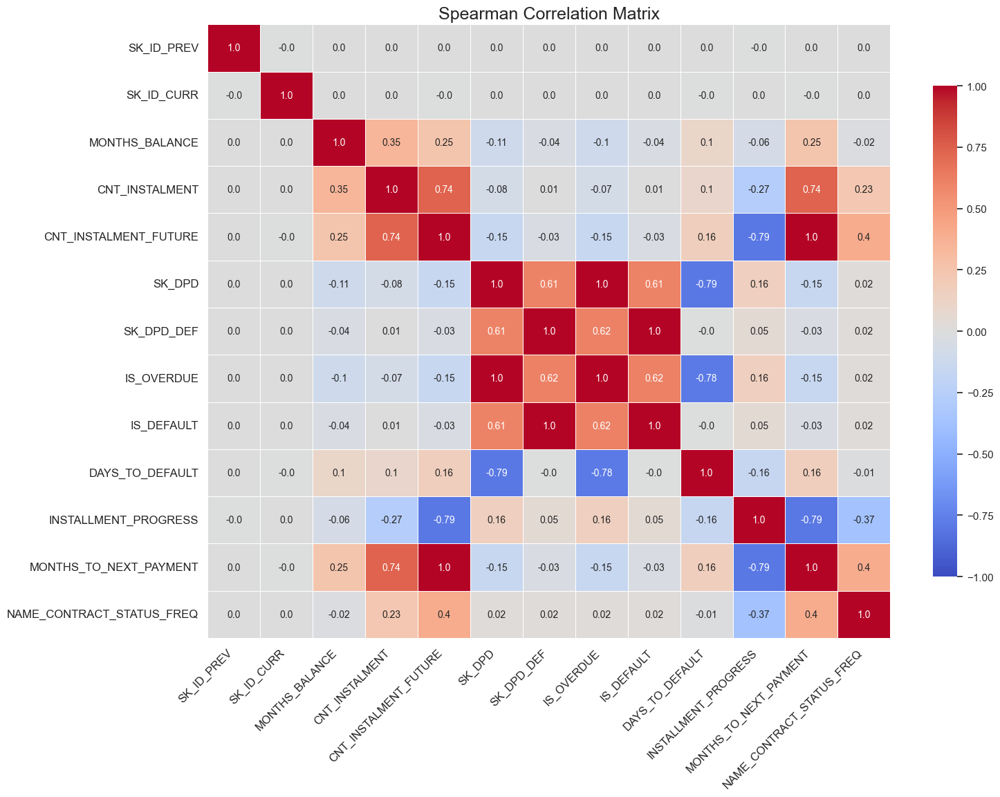

In [165]:
pc_normal_df, pc_not_normal_df = normality_test_with_skew_kurt(pc)
spearman_correlation(pc, pc_not_normal_df, exclude_target='TARGET', multicollinearity_threshold=0.8)

The dataset exhibits strong multicollinearity among several variables, indicating redundancy. CNT_INSTALMENT_FUTURE and MONTHS_TO_NEXT_PAYMENT are perfectly correlated, as they represent the same concept—remaining installment count. Similarly, SK_DPD and IS_OVERDUE have near-perfect correlation because IS_OVERDUE is derived directly from SK_DPD. Likewise, SK_DPD_DEF and IS_DEFAULT are identical in meaning, making one of them redundant. 

These high correlations suggest that some variables can be removed without loss of information to reduce dimensionality and avoid potential multicollinearity issues in predictive modeling.

In [166]:
available_columns = pc.columns.tolist()
num_aggregations = {
    'SK_DPD': ['mean'], 
    'CNT_INSTALMENT': ['sum'],
    'CNT_INSTALMENT_FUTURE': ['min', 'max', 'mean', 'sum'],
    'INSTALLMENT_PROGRESS': ['min', 'max', 'mean'],
    'MONTHS_TO_NEXT_PAYMENT': ['min', 'max', 'mean'],
    'SK_DPD_DEF': ['min', 'max', 'mean', 'sum'],
    'DAYS_TO_DEFAULT': ['min', 'max', 'mean'],
    'NAME_CONTRACT_STATUS_FREQ': ['mean']
}
num_aggregations = {k: v for k, v in num_aggregations.items() if k in available_columns}
bool_aggregations = {col: ['mean'] for col in bool_cols if col in available_columns}
pc_agg = pc.groupby('SK_ID_CURR').agg({**num_aggregations, **bool_aggregations})
pc_agg.columns = ['PC_' + '_'.join(col).upper() for col in pc_agg.columns]
pc_agg.reset_index(inplace=True)
gc.collect()
print("Final Aggregated Data Shape:", pc_agg.shape)

Final Aggregated Data Shape: (337252, 23)


In [167]:
final_data = final_data.merge(pc_agg, on='SK_ID_CURR', how='left')
print("Final Merged Data Shape:", final_data.shape)

Final Merged Data Shape: (307511, 252)


The dataset has been aggregated at the SK_ID_CURR level, summarizing key financial indicators related to installment payments. Delinquency (SK_DPD, SK_DPD_DEF) and future installment-related metrics (CNT_INSTALMENT_FUTURE, MONTHS_TO_NEXT_PAYMENT) are captured through statistical measures like mean, min, max, and sum. Additionally, categorical frequencies of contract statuses have been retained for further analysis.

Boolean flags (IS_OVERDUE, IS_DEFAULT) have been averaged to reflect their prevalence per customer. The newly aggregated dataset was successfully merged with the existing dataset, preserving all relevant features while reducing dimensionality. The final merged dataset now integrates past installment trends, overdue tendencies, and payment behavior.

----

### 5 credit_card_balance

In [168]:
base_profile_df, linked_profiles_df = compare_df_columns('ccb', dataframes)
display_key_columns('ccb', dataframes)

| Column               | Linked DataFrames      |
|:---------------------|:-----------------------|
| SK_ID_PREV           | pc, pa, ip             |
| SK_ID_CURR           | at, bu_bub, pc, pa, ip |
| MONTHS_BALANCE       | bu_bub, pc             |
| NAME_CONTRACT_STATUS | pc, pa                 |
| SK_DPD               | pc                     |
| SK_DPD_DEF           | pc                     |


In [169]:
base_profile_df

,Dataset,Column,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,ccb,SK_ID_PREV,3840312,1,0,0.00%,0,N/A,0,0.00%,int32
1,ccb,SK_ID_CURR,3840312,1,0,0.00%,0,N/A,0,0.00%,int32
2,ccb,MONTHS_BALANCE,3840312,1,0,0.00%,3840312,N/A,0,0.00%,int8
3,ccb,NAME_CONTRACT_STATUS,3840312,1,0,0.00%,N/A,N/A,N/A,N/A,category
4,ccb,SK_DPD,3840312,1,0,0.00%,0,N/A,153355,3.99%,int16
5,ccb,SK_DPD_DEF,3840312,1,0,0.00%,0,N/A,89340,2.33%,int16


In [170]:
linked_profiles_df

,Dataset,Column,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,pc,SK_ID_PREV,10001358,1,0,0.00%,0,N/A,0,0.00%,int32
1,pa,SK_ID_PREV,1670214,1,0,0.00%,0,N/A,0,0.00%,int32
2,ip,SK_ID_PREV,13605401,1,0,0.00%,0,N/A,0,0.00%,int32
3,at,SK_ID_CURR,307511,1,0,0.00%,0,N/A,0,0.00%,int32
4,bu_bub,SK_ID_CURR,25121815,1,0,0.00%,0,N/A,0,0.00%,int32
5,pc,SK_ID_CURR,10001358,1,0,0.00%,0,N/A,0,0.00%,int32
6,pa,SK_ID_CURR,1670214,1,1,0.00%,0,N/A,0,0.00%,float64
7,ip,SK_ID_CURR,13605401,1,0,0.00%,0,N/A,0,0.00%,int32
8,bu_bub,MONTHS_BALANCE,25121815,1,942074,3.75%,23591219,N/A,143321,0.57%,float32
9,pc,MONTHS_BALANCE,10001358,1,0,0.00%,10001358,N/A,0,0.00%,int8


In [171]:
linked_cols = [
    'SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'NAME_CONTRACT_STATUS', 
    'SK_DPD', 'SK_DPD_DEF'
]

---

dataset domain prespective


 1. Identifiers & Temporal Features
    - SK_ID_PREV: Previous application identifier (links to previous loans).
    - SK_ID_CURR: Client identifier (links to main application data).
    - MONTHS_BALANCE: Number of months relative to current application (negative values indicate past records).
    


 2. Credit Limits & Balance Features
    - AMT_BALANCE: Outstanding balance at the end of each month.
    - AMT_CREDIT_LIMIT_ACTUAL: The actual credit limit assigned to the client.



 3. Cash Withdrawals & POS Transactions
    - AMT_DRAWINGS_ATM_CURRENT: Amount withdrawn from ATMs.
    - AMT_DRAWINGS_POS_CURRENT: Amount spent using POS transactions.
    - AMT_DRAWINGS_OTHER_CURRENT: Other types of withdrawals.
    - AMT_DRAWINGS_CURRENT: Total amount withdrawn.
    


 4. Payment & Receivables
    - AMT_INST_MIN_REGULARITY: Minimum required installment.
    - AMT_PAYMENT_CURRENT: Current month's payment made.
    - AMT_PAYMENT_TOTAL_CURRENT: Total amount paid, including fees.
    - AMT_RECEIVABLE_PRINCIPAL: Principal amount yet to be paid.
    - AMT_RECIVABLE: Total amount receivable.
    - AMT_TOTAL_RECEIVABLE: Combination of interest and principal due.



 5. Transaction Frequency
    - CNT_DRAWINGS_ATM_CURRENT: Count of ATM withdrawals.
    - CNT_DRAWINGS_POS_CURRENT: Count of POS transactions.
    - CNT_DRAWINGS_OTHER_CURRENT: Count of other withdrawal types.
    - CNT_DRAWINGS_CURRENT: Total number of withdrawals.



 6. Loan & Payment History
    - CNT_INSTALMENT_MATURE_CUM: Number of matured installments.
    - NAME_CONTRACT_STATUS: Status of the credit card (e.g., Active, Closed, etc.).



 7. Delinquency Indicators
    - SK_DPD: Days past due (DPD) indicating overdue payments.
    - SK_DPD_DEF: Days past due with default classification.





In [172]:
print(ccb.shape)
for idx, col in enumerate(ccb.columns):
    print(f"{idx}: {col}")

(3840312, 23)
0: SK_ID_PREV
1: SK_ID_CURR
2: MONTHS_BALANCE
3: AMT_BALANCE
4: AMT_CREDIT_LIMIT_ACTUAL
5: AMT_DRAWINGS_ATM_CURRENT
6: AMT_DRAWINGS_CURRENT
7: AMT_DRAWINGS_OTHER_CURRENT
8: AMT_DRAWINGS_POS_CURRENT
9: AMT_INST_MIN_REGULARITY
10: AMT_PAYMENT_CURRENT
11: AMT_PAYMENT_TOTAL_CURRENT
12: AMT_RECEIVABLE_PRINCIPAL
13: AMT_RECIVABLE
14: AMT_TOTAL_RECEIVABLE
15: CNT_DRAWINGS_ATM_CURRENT
16: CNT_DRAWINGS_CURRENT
17: CNT_DRAWINGS_OTHER_CURRENT
18: CNT_DRAWINGS_POS_CURRENT
19: CNT_INSTALMENT_MATURE_CUM
20: NAME_CONTRACT_STATUS
21: SK_DPD
22: SK_DPD_DEF


In [173]:
detect_mixed_data_types(ccb)

'No mixed data types detected!'

In [174]:
cat_high_cardinality(ccb)

high_cardinality_columns


[]

In [175]:
ccb.dtypes.value_counts()

float32     11
float16      4
int32        3
int16        3
int8         1
category     1
Name: count, dtype: int64

Missing Values Summary:
                           Data Type  Missing Count  Missing Percentage
AMT_PAYMENT_CURRENT          float32         767988           19.998063
AMT_DRAWINGS_ATM_CURRENT     float32         749816           19.524872
CNT_DRAWINGS_POS_CURRENT     float16         749816           19.524872
AMT_DRAWINGS_OTHER_CURRENT   float32         749816           19.524872
AMT_DRAWINGS_POS_CURRENT     float32         749816           19.524872
CNT_DRAWINGS_OTHER_CURRENT   float16         749816           19.524872
CNT_DRAWINGS_ATM_CURRENT     float16         749816           19.524872
CNT_INSTALMENT_MATURE_CUM    float16         305236            7.948208
AMT_INST_MIN_REGULARITY      float32         305236            7.948208

Infinite Values Summary:
No infinite values found.


<Figure size 2000x800 with 0 Axes>

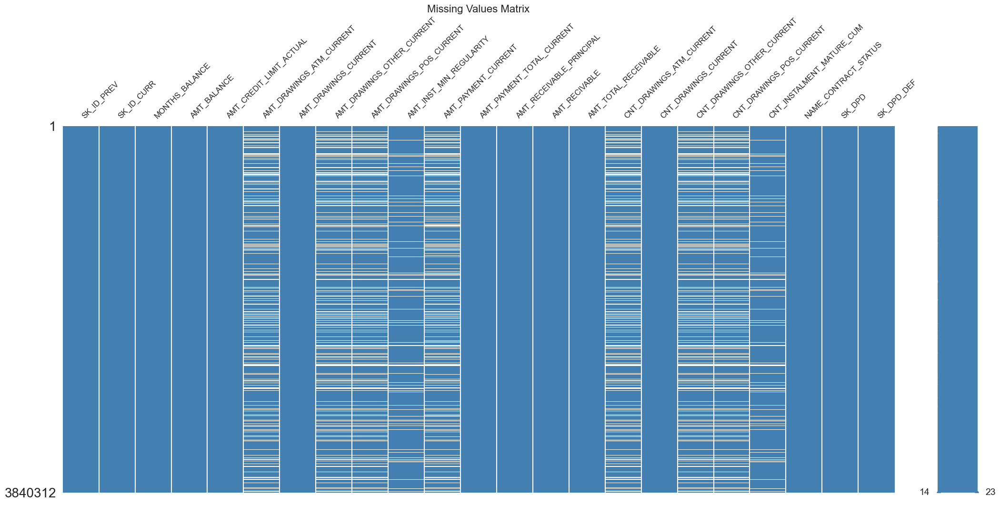

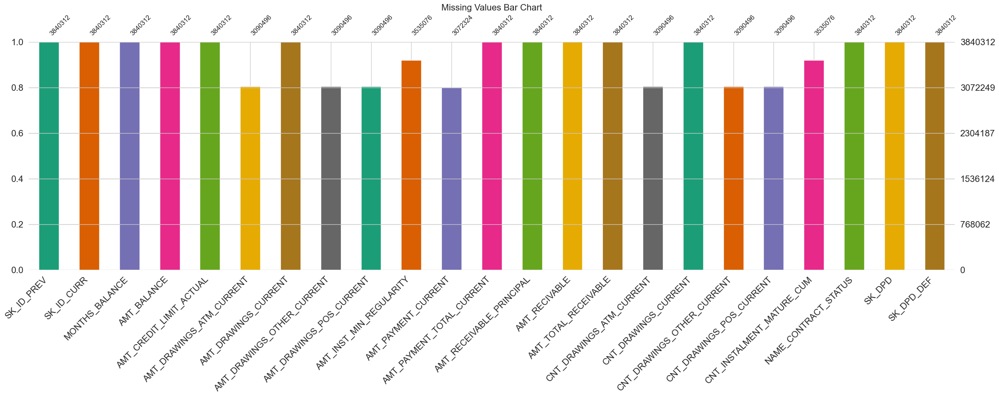


Number of duplicate rows: 0



,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF


In [176]:
missing_inf_values(ccb)
show_missing(ccb)
print(f"\nNumber of duplicate rows: {ccb.duplicated().sum()}\n")
duplicates = ccb[ccb.duplicated()]
duplicates

The missing values in the credit card balance dataset primarily affect transaction and payment-related features, with around 20% missing data in transaction amounts and counts. These missing values likely indicate periods of inactivity rather than true data absence. Installment-related fields have lower missingness (~8%), suggesting variability in repayment structures across different credit card products. Since no infinite values or duplicates are present, data consistency is maintained. Addressing these missing values requires distinguishing between actual zero activity and true gaps, ensuring accurate imputations based on business logic.

In [177]:
columns_info("Dataset Overview", ccb)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     20         NAME_CONTRACT_STATUS           category        N/A                            7
2     15         CNT_DRAWINGS_ATM_CURRENT       float16         0.0 - 51.0                     44
3     17         CNT_DRAWINGS_OTHER_CURRENT     float16         0.0 - 12.0                     11
4     18         CNT_DRAWINGS_POS_CURRENT       float16         0.0 - 165.0                    133
5     19         CNT_INSTALMENT_MATURE_CUM      float16         0.0 - 120.0                    121
6     3          AMT_BALANCE                    float32         -420250.1875 - 1505902.125     1347882
7     5          AMT_DRAWINGS_ATM_CURRENT       float32         -6827.31005859375 - 2115000.0  2267
8     6          AMT_DRAWINGS_CURRENT       

In [178]:
analyze_data(ccb)













































=== Numerical Analysis ===
|    | Variable                   |           N |            Mean |          SD |       SE |        95% Conf. |         Interval |
|---:|:---------------------------|------------:|----------------:|------------:|---------:|-----------------:|-----------------:|
|  0 | SK_ID_PREV                 | 3.84031e+06 |      1.9045e+06 | 536469      | 273.755  |      1.90397e+06 |      1.90504e+06 |
|  1 | SK_ID_CURR                 | 3.84031e+06 | 278324          | 102704      |  52.409  | 278221           | 278427           |
|  2 | MONTHS_BALANCE             | 3.84031e+06 |    -34.5219     |     26.6678 |   0.0136 |    -34.5486      |    -34.4952      |
|  3 | AMT_BALANCE                | 3.84031e+06 |  58300.2        | 106307      |  54.2474 |  58193.8         |  58406.5         |
|  4 | AMT_CREDIT_LIMIT_ACTUAL    | 3.84031e+06 | 153808          | 165146      |  84.2721 | 153643           | 153973           |
|  5 | AMT_D

In [179]:
# payment and balance 
financial_columns = ['AMT_BALANCE', 'AMT_DRAWINGS_ATM_CURRENT', 'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT']
# plot_histograms(financial_columns, ccb)
# plot_boxplots(financial_columns, ccb)

- For high coputational and memory issue, so it's take long time to generate plots so that's the reson, one time generated and explained the below:

    - 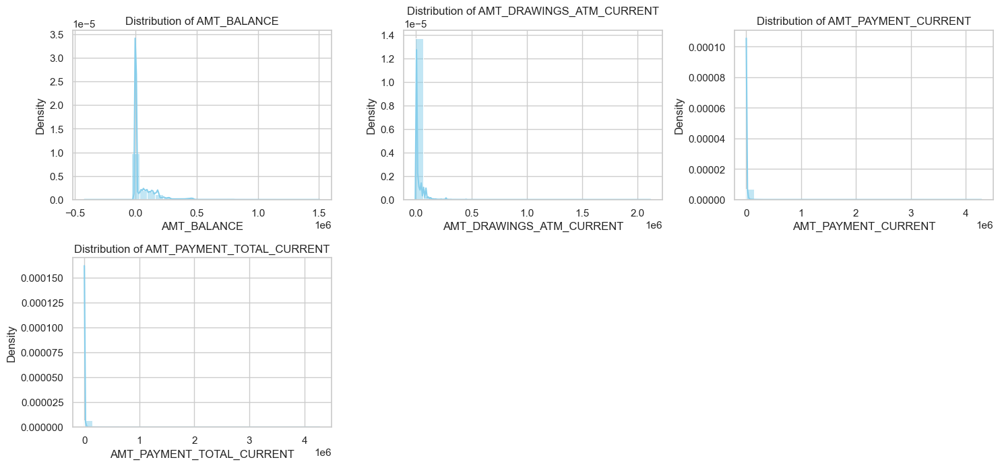
    
    - 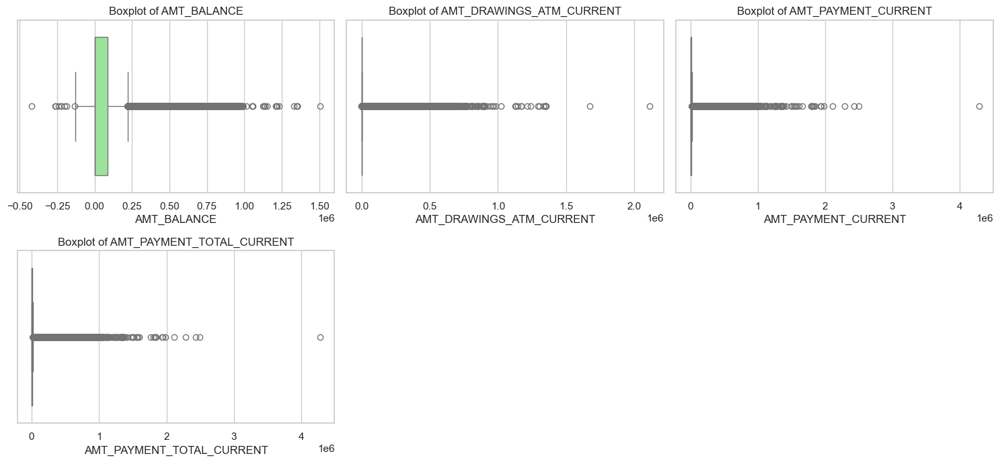
 
The distributions of credit card balance variables reveal a heavily skewed nature, where most values are concentrated near zero, while a few extreme values extend significantly, creating long tails. The density plots highlight this skewness, particularly in variables such as AMT_BALANCE, AMT_DRAWINGS_ATM_CURRENT, and AMT_PAYMENT_TOTAL_CURRENT, where the majority of observations cluster at the lower end of the scale, with a gradual decline towards higher amounts. This pattern suggests that while most users maintain low balances and transaction amounts, a small subset of accounts exhibit significantly larger values. The box plots further emphasize this, as they reveal numerous outliers far beyond the interquartile range, indicating the presence of high-value transactions or balances that deviate substantially from the norm. These insights suggest a disparity in credit card usage patterns, where the majority of users engage in relatively small-scale transactions, while a minority drive the extreme end of the distribution.

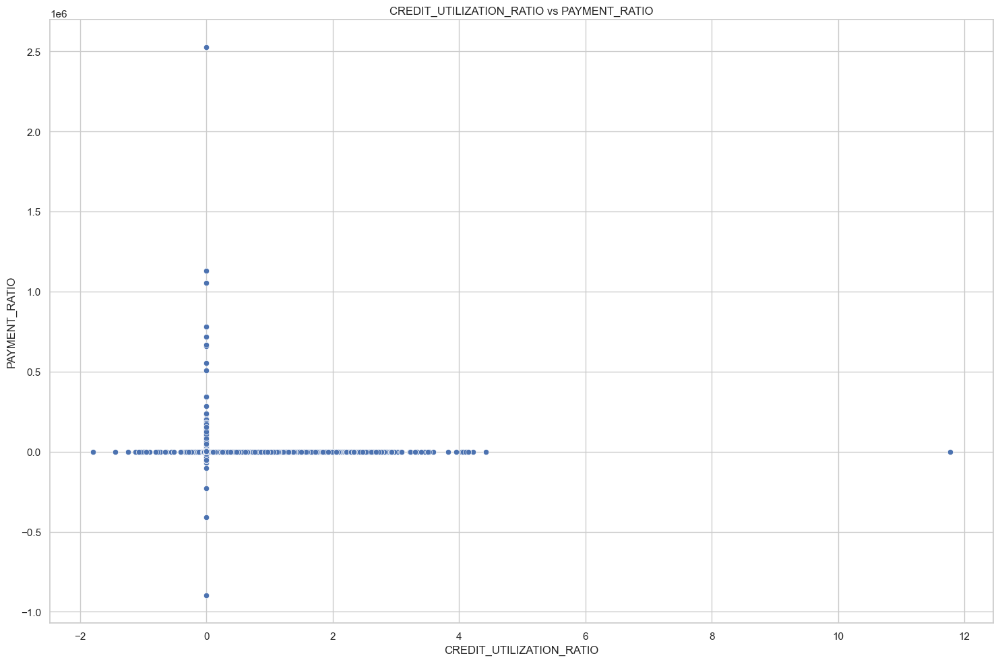

In [180]:
# Credit Utilization and Payment Ratios
ccb['CREDIT_UTILIZATION_RATIO'] = ccb['AMT_BALANCE'] / ccb['AMT_CREDIT_LIMIT_ACTUAL']
ccb['PAYMENT_RATIO'] = ccb['AMT_PAYMENT_TOTAL_CURRENT'] / ccb['AMT_BALANCE']
plot_scatter(['CREDIT_UTILIZATION_RATIO'], ['PAYMENT_RATIO'], ccb)

The relationship between credit utilization ratio and payment ratio appears highly concentrated near zero, suggesting most clients have low credit utilization and minimal payments. There are a few extreme values indicating potential anomalies or clients with unusually high credit activity. 

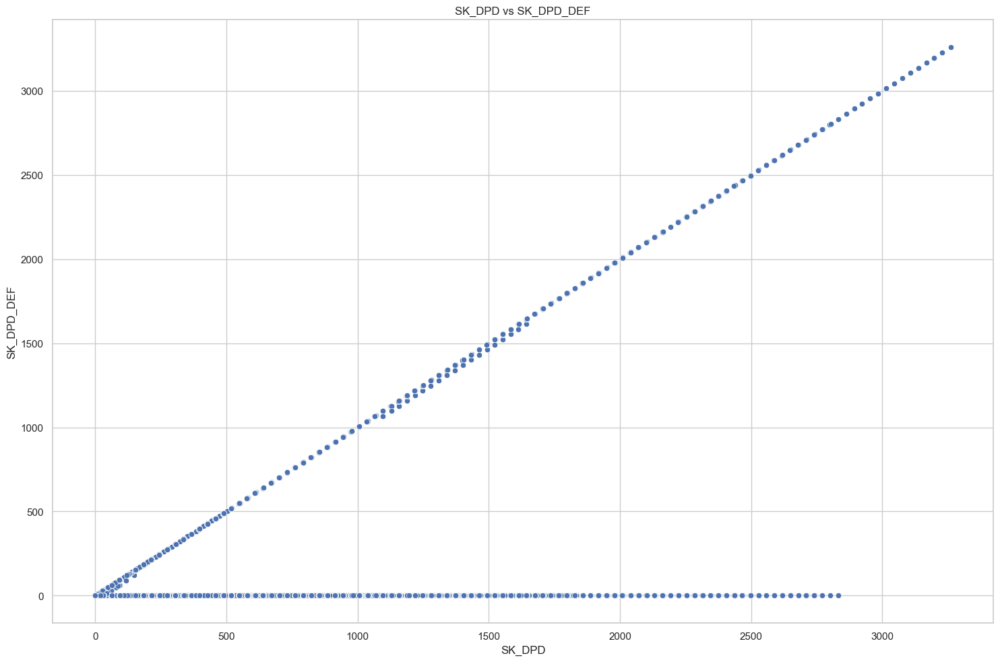

In [181]:
plot_scatter(['SK_DPD'], ['SK_DPD_DEF'], ccb)

The SK_DPD vs SK_DPD_DEF plot exhibits a clear diagonal relationship, confirming that overdue days (SK_DPD) strongly correlate with default status (SK_DPD_DEF). Many points align on the axis, indicating cases where clients had overdue payments but did not default.

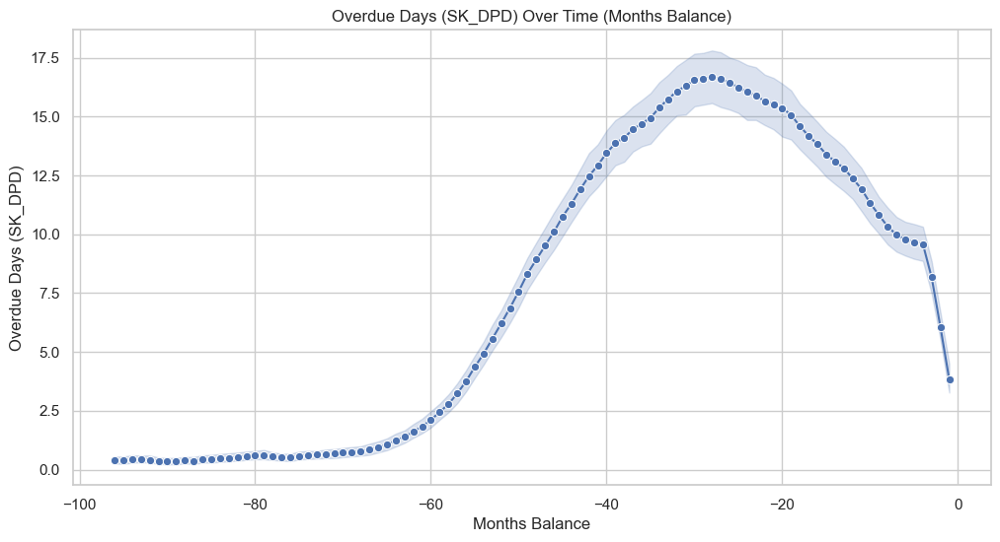

In [182]:
plt.figure(figsize=(12, 6))
sns.lineplot(x=ccb['MONTHS_BALANCE'], y=ccb['SK_DPD'], marker='o')
plt.title('Overdue Days (SK_DPD) Over Time (Months Balance)')
plt.xlabel('Months Balance')
plt.ylabel('Overdue Days (SK_DPD)')
plt.show()

Over time, overdue days (SK_DPD) initially rise, peaking around 40-60 months before the present. After this peak, overdue days gradually decline, showing that more recent credit periods have lower delays, potentially due to improved repayment behavior or stricter lending policies.


Value counts and percentages for Name_Contract_Status:

| Name_Contract_Status   |   Count |   % Total |
|:-----------------------|--------:|----------:|
| Active                 | 3698436 |     96.31 |
| Completed              |  128918 |      3.36 |
| Signed                 |   11058 |      0.29 |
| Demand                 |    1365 |      0.04 |
| Sent proposal          |     513 |      0.01 |
| Refused                |      17 |      0    |
| Approved               |       5 |      0    |


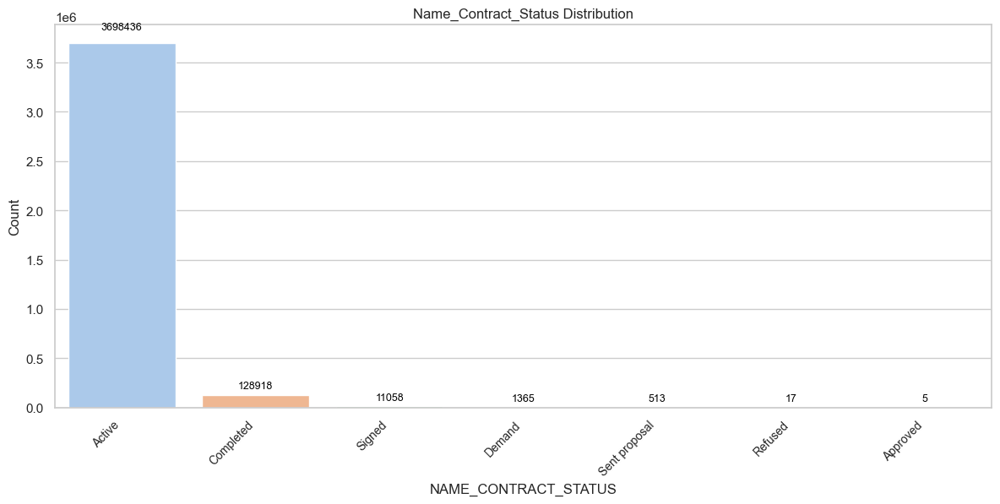

In [183]:
cat_analyze_and_plot(ccb, "NAME_CONTRACT_STATUS")

The contract status distribution reveals that the vast majority of credit card contracts (96.31%) remain active, indicating ongoing credit utilization. Only a small fraction (3.36%) has been completed, while even fewer have reached stages like signed, demand, or sent proposal. Refusals and approvals are rare, suggesting that most contracts either stay active or transition to completion rather than being declined or newly approved. This distribution highlights a low turnover rate in credit card contracts, with most users maintaining ongoing credit relationships.

In [184]:
ccb_normal_df, ccb_not_normal_df = normality_test_with_skew_kurt(ccb)


Normal Columns (p > 0.05):


,Column,Test,Statistic,p_value,Skewness,Kurtosis



Not Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:


,Column,Test,Statistic,p_value,Skewness,Kurtosis
0,SK_ID_PREV,Kolmogorov-Smirnov,0.065371,0.0,0.038385,-1.219607
1,SK_ID_CURR,Kolmogorov-Smirnov,0.058725,0.0,-0.001834,-1.199475
20,SK_DPD,Kolmogorov-Smirnov,0.517447,0.0,12.946985,190.372386
16,CNT_DRAWINGS_CURRENT,Kolmogorov-Smirnov,0.428284,0.0,10.635283,177.928081
14,AMT_TOTAL_RECEIVABLE,Kolmogorov-Smirnov,0.303877,0.0,2.912683,11.715918
13,AMT_RECIVABLE,Kolmogorov-Smirnov,0.303919,0.0,2.913169,11.719566
12,AMT_RECEIVABLE_PRINCIPAL,Kolmogorov-Smirnov,0.306653,0.0,2.942314,11.958430
11,AMT_PAYMENT_TOTAL_CURRENT,Kolmogorov-Smirnov,0.406287,0.0,14.479700,393.254963
10,AMT_PAYMENT_CURRENT,Kolmogorov-Smirnov,0.387840,0.0,12.990570,315.756290
9,AMT_INST_MIN_REGULARITY,Kolmogorov-Smirnov,0.286881,0.0,2.494433,10.182538


In [185]:
num_summary(ccb)

,Count,Unique,Mean,Std,Min,25%,50%,75%,Max,Mode,Range,IQR,Variance,Skewness,Kurtosis,Shapiro-Wilk Stat,Shapiro-Wilk p-value
SK_ID_PREV,3840312.0,104307.0,1.904504e+06,536469.470600,1.000018e+06,1.434385e+06,1.897122e+06,2.369328e+06,2843496.000,1000096.0,1843478.000,9.349428e+05,2.877995e+11,0.038400,-1.219600,0.9499,0.0
SK_ID_CURR,3840312.0,103558.0,2.783242e+05,102704.475100,1.000060e+05,1.895170e+05,2.783960e+05,3.675800e+05,456250.000,186401.0,356244.000,1.780630e+05,1.054821e+10,-0.001800,-1.199500,0.9536,0.0
MONTHS_BALANCE,3840312.0,96.0,-3.452190e+01,26.667800,-9.600000e+01,-5.500000e+01,-2.800000e+01,-1.100000e+01,-1.000,-4.0,95.000,4.400000e+01,7.111689e+02,-0.598000,-0.856200,0.9157,0.0
AMT_BALANCE,3840312.0,1347882.0,5.830016e+04,106307.031250,-4.202502e+05,0.000000e+00,0.000000e+00,8.904669e+04,1505902.125,0.0,1926152.250,8.904669e+04,1.130118e+10,2.920200,11.778700,0.6118,0.0
AMT_CREDIT_LIMIT_ACTUAL,3840312.0,181.0,1.538080e+05,165145.699500,0.000000e+00,4.500000e+04,1.125000e+05,1.800000e+05,1350000.000,0.0,1350000.000,1.350000e+05,2.727310e+10,2.059700,5.184000,0.7984,0.0
AMT_DRAWINGS_ATM_CURRENT,3090496.0,2267.0,5.961323e+03,28225.685547,-6.827311e+03,0.000000e+00,0.000000e+00,0.000000e+00,2115000.000,0.0,2121827.250,0.000000e+00,7.966895e+08,9.664800,164.927505,NaN,1.0
AMT_DRAWINGS_CURRENT,3840312.0,187005.0,7.433391e+03,33846.078125,-6.211620e+03,0.000000e+00,0.000000e+00,0.000000e+00,2287098.250,0.0,2293309.750,0.000000e+00,1.145557e+09,10.065600,184.274399,0.2261,0.0
AMT_DRAWINGS_OTHER_CURRENT,3090496.0,1832.0,2.881696e+02,8201.989258,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1529847.000,0.0,1529847.000,0.000000e+00,6.727263e+07,50.570400,3628.009521,NaN,1.0
AMT_DRAWINGS_POS_CURRENT,3090496.0,168748.0,2.968804e+03,20796.886719,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2239274.250,0.0,2239274.250,0.000000e+00,4.325105e+08,19.421101,713.988403,NaN,1.0
AMT_INST_MIN_REGULARITY,3535076.0,312266.0,3.540206e+03,5600.154297,0.000000e+00,0.000000e+00,0.000000e+00,6.633911e+03,202882.000,0.0,202882.000,6.633911e+03,3.136173e+07,2.494400,10.182500,NaN,1.0


In [186]:
cat_summary(ccb)

,Count,Unique,Top,Freq,Top %
NAME_CONTRACT_STATUS,3840312,7,Active,3698436,96.31%


In [187]:
ccb_negative_values = ccb.select_dtypes(include=[np.number]).lt(0).sum()
print("Columns with Negative Values:\n", ccb_negative_values[ccb_negative_values > 0])

Columns with Negative Values:
 MONTHS_BALANCE              3840312
AMT_BALANCE                    2345
AMT_DRAWINGS_ATM_CURRENT          1
AMT_DRAWINGS_CURRENT              3
AMT_RECEIVABLE_PRINCIPAL       2428
AMT_RECIVABLE                109338
AMT_TOTAL_RECEIVABLE         109330
CREDIT_UTILIZATION_RATIO       2345
PAYMENT_RATIO                  2344
dtype: int64


---

In [188]:
ccb_outlier_summary, ccb_non_outlier_summary = comp_num_analysis(ccb, outlier_df=True)
ccb_missing_summary, ccb_non_missing_summary = comp_num_analysis(ccb, missing_df=True)
ccb_cat_missing_summary, ccb_cat_non_missing_summary = comp_cat_analysis(ccb, missing_df=True)
ccb_cat_missing_summary = ccb_cat_missing_summary.sort_values(by="Unique_Count", ascending=False)
ccb_cat_non_missing_summary = ccb_cat_non_missing_summary.sort_values(by="Unique_Count", ascending=False)
print(ccb_cat_missing_summary.shape)
print(ccb_missing_summary.shape)
print(ccb_outlier_summary.shape)

(0, 9)
(11, 31)
(21, 31)


In [189]:
ccb_outlier_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
7,7,AMT_DRAWINGS_OTHER_CURRENT,float32,3090496,19.524872,1832,0.000000e+00,0.000000,0.000000,0.000000,1529847.000,0.0,1529847.00,0.000000,0.000000,0.000000,1832,1831,12333,0.399062,0,0,0.000000,2.881696e+02,6.727263e+07,8201.989258,50.570376,3628.006696,Kolmogorov-Smirnov,0.510023,0.0
9,9,AMT_INST_MIN_REGULARITY,float32,3535076,7.948208,312266,0.000000e+00,0.000000,0.000000,6633.911133,202882.000,0.0,202882.00,6633.911133,-9950.866699,16584.777832,312266,90031,124489,3.521537,0,0,0.000000,3.540203e+03,3.136173e+07,5600.154297,2.494433,10.182538,Kolmogorov-Smirnov,0.286881,0.0
14,14,AMT_TOTAL_RECEIVABLE,float32,3840312,0.000000,1338987,-4.202502e+05,0.000000,0.000000,88914.507812,1493338.125,0.0,1913588.25,88914.507812,-133371.761719,222286.269531,1338987,237279,247473,6.444086,109330,12601,2.846904,5.809825e+04,1.123002e+10,105971.804688,2.912683,11.715918,Kolmogorov-Smirnov,0.303877,0.0
13,13,AMT_RECIVABLE,float32,3840312,0.000000,1338857,-4.202502e+05,0.000000,0.000000,88899.488281,1493338.125,0.0,1913588.25,88899.488281,-133349.232422,222248.720703,1338857,237343,247510,6.445049,109338,12602,2.847112,5.808884e+04,1.122866e+10,105965.367188,2.913169,11.719566,Kolmogorov-Smirnov,0.303919,0.0
3,3,AMT_BALANCE,float32,3840312,0.000000,1347882,-4.202502e+05,0.000000,0.000000,89046.687500,1505902.125,0.0,1926152.25,89046.687500,-133570.031250,222616.718750,1347882,238513,248146,6.461610,2345,793,0.061063,5.830016e+04,1.130118e+10,106307.031250,2.920172,11.778674,Kolmogorov-Smirnov,0.299936,0.0
12,12,AMT_RECEIVABLE_PRINCIPAL,float32,3840312,0.000000,1195807,-4.233058e+05,0.000000,0.000000,85359.238281,1472316.750,0.0,1895622.50,85359.238281,-128038.857422,213398.095703,1195807,225393,250529,6.523663,2428,894,0.063224,5.596585e+04,1.051314e+10,102533.617188,2.942314,11.958430,Kolmogorov-Smirnov,0.306653,0.0
11,11,AMT_PAYMENT_TOTAL_CURRENT,float32,3840312,0.000000,182957,0.000000e+00,0.000000,0.000000,6750.000000,4278315.500,0.0,4278315.50,6750.000000,-10125.000000,16875.000000,182957,86649,324742,8.456136,0,0,0.000000,7.588856e+03,1.024383e+09,32005.988281,14.479700,393.254963,Kolmogorov-Smirnov,0.406287,0.0
8,8,AMT_DRAWINGS_POS_CURRENT,float32,3090496,19.524872,168748,0.000000e+00,0.000000,0.000000,0.000000,2239274.250,0.0,2239274.25,0.000000,0.000000,0.000000,168748,168747,264901,8.571472,0,0,0.000000,2.968805e+03,4.325105e+08,20796.886719,19.421073,713.987684,Kolmogorov-Smirnov,0.471042,0.0
10,10,AMT_PAYMENT_CURRENT,float32,3072324,19.998063,163209,0.000000e+00,152.369995,2702.699951,9000.000000,4289207.500,0.0,4289207.50,8847.630005,-13119.075012,22271.445007,163209,63935,282428,9.192650,0,0,0.000000,1.028054e+04,1.301628e+09,36078.085938,12.990570,315.756290,Kolmogorov-Smirnov,0.387840,0.0
5,5,AMT_DRAWINGS_ATM_CURRENT,float32,3090496,19.524872,2267,-6.827310e+03,0.000000,0.000000,0.000000,2115000.000,0.0,2121827.25,0.000000,0.000000,0.000000,2267,2266,424778,13.744655,1,1,0.000032,5.961327e+03,7.966895e+08,28225.687500,9.664841,164.927314,Kolmogorov-Smirnov,0.446189,0.0


In [190]:
ccb_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
19,19,CNT_INSTALMENT_MATURE_CUM,float16,3535076,7.948208,121,0.000000e+00,4.000000,15.000000,32.000000,120.00,0.0,120.00,28.000000,-38.000000,74.000000,121,46,58845,1.664604,0,0,0.000000,NaN,0.000000e+00,0.000000,inf,inf,Kolmogorov-Smirnov,NaN,NaN
15,15,CNT_DRAWINGS_ATM_CURRENT,float16,3090496,19.524872,44,0.000000e+00,0.000000,0.000000,0.000000,51.00,0.0,51.00,0.000000,0.000000,0.000000,44,43,424778,13.744655,0,0,0.000000,NaN,0.000000e+00,0.000000,inf,inf,Kolmogorov-Smirnov,NaN,NaN
17,17,CNT_DRAWINGS_OTHER_CURRENT,float16,3090496,19.524872,11,0.000000e+00,0.000000,0.000000,0.000000,12.00,0.0,12.00,0.000000,0.000000,0.000000,11,10,12808,0.414432,0,0,0.000000,0.000000e+00,0.000000e+00,0.000000,26.326090,1254.335599,Kolmogorov-Smirnov,NaN,NaN
18,18,CNT_DRAWINGS_POS_CURRENT,float16,3090496,19.524872,133,0.000000e+00,0.000000,0.000000,0.000000,165.00,0.0,165.00,0.000000,0.000000,0.000000,133,132,264902,8.571504,0,0,0.000000,NaN,0.000000e+00,0.000000,inf,inf,Kolmogorov-Smirnov,NaN,NaN
9,9,AMT_INST_MIN_REGULARITY,float32,3535076,7.948208,312266,0.000000e+00,0.000000,0.000000,6633.911133,202882.00,0.0,202882.00,6633.911133,-9950.866699,16584.777832,312266,90031,124489,3.521537,0,0,0.000000,3.540203e+03,3.136173e+07,5600.154297,2.494433,10.182538,Kolmogorov-Smirnov,0.286881,0.0
5,5,AMT_DRAWINGS_ATM_CURRENT,float32,3090496,19.524872,2267,-6.827310e+03,0.000000,0.000000,0.000000,2115000.00,0.0,2121827.25,0.000000,0.000000,0.000000,2267,2266,424778,13.744655,1,1,0.000032,5.961327e+03,7.966895e+08,28225.687500,9.664841,164.927314,Kolmogorov-Smirnov,0.446189,0.0
7,7,AMT_DRAWINGS_OTHER_CURRENT,float32,3090496,19.524872,1832,0.000000e+00,0.000000,0.000000,0.000000,1529847.00,0.0,1529847.00,0.000000,0.000000,0.000000,1832,1831,12333,0.399062,0,0,0.000000,2.881696e+02,6.727263e+07,8201.989258,50.570376,3628.006696,Kolmogorov-Smirnov,0.510023,0.0
8,8,AMT_DRAWINGS_POS_CURRENT,float32,3090496,19.524872,168748,0.000000e+00,0.000000,0.000000,0.000000,2239274.25,0.0,2239274.25,0.000000,0.000000,0.000000,168748,168747,264901,8.571472,0,0,0.000000,2.968805e+03,4.325105e+08,20796.886719,19.421073,713.987684,Kolmogorov-Smirnov,0.471042,0.0
10,10,AMT_PAYMENT_CURRENT,float32,3072324,19.998063,163209,0.000000e+00,152.369995,2702.699951,9000.000000,4289207.50,0.0,4289207.50,8847.630005,-13119.075012,22271.445007,163209,63935,282428,9.192650,0,0,0.000000,1.028054e+04,1.301628e+09,36078.085938,12.990570,315.756290,Kolmogorov-Smirnov,0.387840,0.0
23,24,PAYMENT_RATIO,float32,1893495,50.694240,1326068,-8.983846e+05,0.049774,0.065167,0.192716,inf,0.0,inf,0.142942,-0.164639,0.407129,1326068,159460,381514,20.148667,2344,612,0.123792,inf,NaN,NaN,NaN,NaN,Kolmogorov-Smirnov,NaN,NaN


In [191]:
ccb_cat_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Mode,Mode Frequency,Mode %


In [192]:
ccb_cat_non_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Mode,Mode Frequency,Mode %
0,20,NAME_CONTRACT_STATUS,category,3840312,0.0,7,Active,3698436,96.305613


In [193]:
def cap_outliers(df, columns, cap_value):
    for col in columns:
        df[col] = df[col].apply(lambda x: min(x, cap_value))  # Cap values at the given threshold
    return df
columns_to_cap = ['CNT_INSTALMENT_MATURE_CUM', 'CNT_DRAWINGS_POS_CURRENT', 'AMT_BALANCE']
cap_values = {'CNT_INSTALMENT_MATURE_CUM': 120, 'CNT_DRAWINGS_POS_CURRENT': 100, 'AMT_BALANCE': 500000}
for col in columns_to_cap:
    ccb = cap_outliers(ccb, [col], cap_values[col])

In [194]:
columns_to_clean = [
    'AMT_BALANCE', 'AMT_DRAWINGS_ATM_CURRENT', 'AMT_DRAWINGS_CURRENT',
    'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_OTHER_CURRENT', 
    'CNT_INSTALMENT_MATURE_CUM', 'CNT_DRAWINGS_POS_CURRENT'
]
for col in columns_to_clean:
    ccb[col] = ccb[col].apply(lambda x: np.nan if x < 0 else x)

In [195]:
if 'NAME_CONTRACT_STATUS' in ccb.columns:
    ccb['NAME_CONTRACT_STATUS_FREQ'] = ccb['NAME_CONTRACT_STATUS'].map(
        ccb['NAME_CONTRACT_STATUS'].value_counts(normalize=True)
    ).astype(float) 

The outlier capping and data cleaning process ensure that extreme values in key columns such as CNT_INSTALMENT_MATURE_CUM, CNT_DRAWINGS_POS_CURRENT, and AMT_BALANCE do not distort the analysis. By capping values at reasonable thresholds, potential outliers are controlled, preserving the dataset’s reliability. Additionally, negative values are replaced with NaNs across multiple financial and transaction-related columns to maintain logical consistency. The contract status frequency mapping allows for capturing the relative occurrence of each contract status, which can be useful for further feature engineering and predictive modeling.

In [196]:
ccb.replace([np.inf, -np.inf], np.nan, inplace=True)

In [197]:
ccb=optimize_data_types(ccb)

In [198]:
missing_inf_values(ccb)

Missing Values Summary:
                           Data Type  Missing Count  Missing Percentage
PAYMENT_RATIO                float32        2156420           56.152208
AMT_PAYMENT_CURRENT          float32         767988           19.998063
CREDIT_UTILIZATION_RATIO     float32         753823           19.629212
AMT_DRAWINGS_ATM_CURRENT     float32         749817           19.524898
AMT_DRAWINGS_POS_CURRENT     float32         749816           19.524872
CNT_DRAWINGS_OTHER_CURRENT   float32         749816           19.524872
CNT_DRAWINGS_ATM_CURRENT     float32         749816           19.524872
CNT_DRAWINGS_POS_CURRENT     float32         749816           19.524872
AMT_DRAWINGS_OTHER_CURRENT   float32         749816           19.524872
AMT_INST_MIN_REGULARITY      float32         305236            7.948208
CNT_INSTALMENT_MATURE_CUM    float32         305236            7.948208
AMT_BALANCE                  float32           2345            0.061063
AMT_DRAWINGS_CURRENT         float32    


Normal Columns (p > 0.05):


,Column,Test,Statistic,p_value,Skewness,Kurtosis



Not Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:


,Column,Test,Statistic,p_value,Skewness,Kurtosis
0,SK_ID_PREV,Kolmogorov-Smirnov,0.065371,0.0,0.038385,-1.219607
13,AMT_RECIVABLE,Kolmogorov-Smirnov,0.303919,0.0,2.913169,11.719566
23,PAYMENT_RATIO,Kolmogorov-Smirnov,0.496852,0.0,512.325962,412028.490758
22,CREDIT_UTILIZATION_RATIO,Kolmogorov-Smirnov,0.300638,0.0,0.492805,-1.324357
21,SK_DPD_DEF,Kolmogorov-Smirnov,0.493841,0.0,89.830398,9007.727298
20,SK_DPD,Kolmogorov-Smirnov,0.517447,0.0,12.946985,190.372386
19,CNT_INSTALMENT_MATURE_CUM,Kolmogorov-Smirnov,0.149500,0.0,1.075587,0.640325
18,CNT_DRAWINGS_POS_CURRENT,Kolmogorov-Smirnov,0.483028,0.0,11.079387,175.847042
17,CNT_DRAWINGS_OTHER_CURRENT,Kolmogorov-Smirnov,0.519075,0.0,26.323810,1253.254693
16,CNT_DRAWINGS_CURRENT,Kolmogorov-Smirnov,0.428284,0.0,10.635283,177.928081



Variables Exhibiting Multicollinearity (|Correlation| > 0.80):
- AMT_RECIVABLE & CREDIT_UTILIZATION_RATIO: Correlation=0.9203
- AMT_RECIVABLE & AMT_TOTAL_RECEIVABLE: Correlation=1.0000
- AMT_RECIVABLE & AMT_RECEIVABLE_PRINCIPAL: Correlation=0.9709
- AMT_RECIVABLE & AMT_INST_MIN_REGULARITY: Correlation=0.8866
- AMT_RECIVABLE & AMT_BALANCE: Correlation=0.9712
- CREDIT_UTILIZATION_RATIO & AMT_TOTAL_RECEIVABLE: Correlation=0.9203
- CREDIT_UTILIZATION_RATIO & AMT_RECEIVABLE_PRINCIPAL: Correlation=0.9192
- CREDIT_UTILIZATION_RATIO & AMT_INST_MIN_REGULARITY: Correlation=0.8282
- CREDIT_UTILIZATION_RATIO & AMT_BALANCE: Correlation=0.9373
- CNT_DRAWINGS_POS_CURRENT & AMT_DRAWINGS_POS_CURRENT: Correlation=0.9988
- CNT_DRAWINGS_OTHER_CURRENT & AMT_DRAWINGS_OTHER_CURRENT: Correlation=0.9812
- CNT_DRAWINGS_CURRENT & AMT_DRAWINGS_CURRENT: Correlation=0.9898
- CNT_DRAWINGS_ATM_CURRENT & AMT_DRAWINGS_CURRENT: Correlation=0.8043
- CNT_DRAWINGS_ATM_CURRENT & AMT_DRAWINGS_ATM_CURRENT: Correlation=0.9970

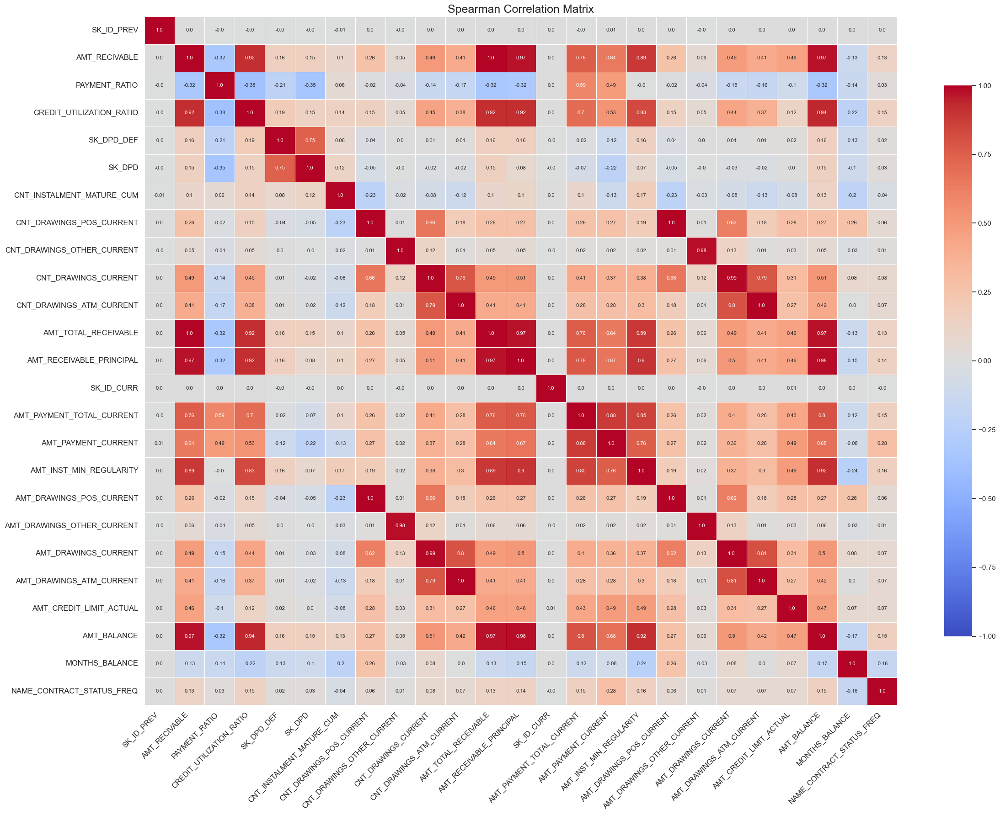

In [199]:
ccb_normal_df, ccb_not_normal_df = normality_test_with_skew_kurt(ccb)
spearman_correlation(ccb, ccb_not_normal_df, exclude_target='TARGET', multicollinearity_threshold=0.8)

The credit card balance dataset (ccb) exhibits strong multicollinearity among financial and transactional variables. Most notably, AMT_RECIVABLE, CREDIT_UTILIZATION_RATIO, and AMT_TOTAL_RECEIVABLE are highly correlated, indicating they capture similar aspects of outstanding balances. Drawings-related features also show near-perfect correlation, particularly between CNT_DRAWINGS and AMT_DRAWINGS, suggesting redundancy. Similarly, payment-related variables, such as AMT_PAYMENT_TOTAL_CURRENT and AMT_PAYMENT_CURRENT, are closely linked. This level of multicollinearity implies that feature selection or dimensionality reduction may be necessary to prevent redundant information from distorting predictive modeling.

In [200]:
available_columns = ccb.columns.tolist()
num_aggregations = {
    'AMT_BALANCE': ['min', 'max', 'mean', 'sum'],
    'AMT_CREDIT_LIMIT_ACTUAL': ['min', 'max', 'mean', 'sum'],
    'AMT_DRAWINGS_ATM_CURRENT': ['min', 'max', 'mean', 'sum'],
    'AMT_DRAWINGS_CURRENT': ['min', 'max', 'mean', 'sum'],
    'AMT_DRAWINGS_OTHER_CURRENT': ['min', 'max', 'mean', 'sum'],
    'AMT_DRAWINGS_POS_CURRENT': ['min', 'max', 'mean', 'sum'],
    'AMT_INST_MIN_REGULARITY': ['min', 'max', 'mean', 'sum'],
    'AMT_PAYMENT_CURRENT': ['min', 'max', 'mean', 'sum'],
    'AMT_PAYMENT_TOTAL_CURRENT': ['min', 'max', 'mean', 'sum'],
    'AMT_RECEIVABLE_PRINCIPAL': ['min', 'max', 'mean', 'sum'],
    'AMT_RECIVABLE': ['min', 'max', 'mean', 'sum'],
    'AMT_TOTAL_RECEIVABLE': ['min', 'max', 'mean', 'sum'],
    'CNT_DRAWINGS_ATM_CURRENT': ['min', 'max', 'mean', 'sum'],
    'CNT_DRAWINGS_OTHER_CURRENT': ['min', 'max', 'mean', 'sum'],
    'CNT_DRAWINGS_POS_CURRENT': ['min', 'max', 'mean', 'sum'],
    'CNT_INSTALMENT_MATURE_CUM': ['min', 'max', 'mean', 'sum'],
    'CREDIT_UTILIZATION_RATIO': ['min', 'max', 'mean', 'sum'],
    'PAYMENT_RATIO': ['min', 'max', 'mean', 'sum'],
    'CNT_DRAWINGS_CURRENT': ['min', 'max', 'mean', 'sum'],
    'SK_DPD': ['min', 'max', 'mean', 'sum'],
    'SK_DPD_DEF': ['min', 'max', 'mean', 'sum'],
    'NAME_CONTRACT_STATUS_FREQ': ['mean']  
}
num_aggregations = {k: v for k, v in num_aggregations.items() if k in available_columns}
ccb_agg = ccb.groupby('SK_ID_CURR').agg(num_aggregations)
ccb_agg.columns = ['CCB_' + '_'.join(col).upper() for col in ccb_agg.columns]
ccb_agg.reset_index(inplace=True)
gc.collect()
print("Final Aggregated Data Shape:", ccb_agg.shape)

Final Aggregated Data Shape: (103558, 86)


In [201]:
final_data = final_data.merge(ccb_agg, on='SK_ID_CURR', how='left')
print("Final Merged Data Shape:", final_data.shape)

Final Merged Data Shape: (307511, 337)


aggregated at the SK_ID_CURR level, summarizing key financial metrics for each customer. The aggregation includes balance amounts, credit limits, transaction drawings, payments, and overdue status using statistical measures such as min, max, mean, and sum. The credit utilization ratio and payment ratio are also computed to assess customer spending and repayment behavior. Additionally, the frequency of contract statuses is included to capture patterns in account activity. This transformation ensures that the dataset is structured for efficient modeling and analysis while reducing redundancy from multiple credit card transactions per customer.

----

### 6 installments_payments

In [202]:
base_profile_df, linked_profiles_df = compare_df_columns('ip', dataframes)
display_key_columns('ip', dataframes)

| Column     | Linked DataFrames       |
|:-----------|:------------------------|
| SK_ID_PREV | pc, ccb, pa             |
| SK_ID_CURR | at, bu_bub, pc, ccb, pa |


In [203]:
base_profile_df

,Dataset,Column,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,ip,SK_ID_PREV,13605401,1,0,0.00%,0,N/A,0,0.00%,int32
1,ip,SK_ID_CURR,13605401,1,0,0.00%,0,N/A,0,0.00%,int32


In [204]:
linked_profiles_df

,Dataset,Column,Rows,Columns,Missing Values,Missing %,Negative Values,Negative %,Outliers,Outlier %,Data Types
0,pc,SK_ID_PREV,10001358,1,0,0.00%,0,N/A,0,0.00%,int32
1,ccb,SK_ID_PREV,3840312,1,0,0.00%,0,N/A,0,0.00%,int32
2,pa,SK_ID_PREV,1670214,1,0,0.00%,0,N/A,0,0.00%,int32
3,at,SK_ID_CURR,307511,1,0,0.00%,0,N/A,0,0.00%,int32
4,bu_bub,SK_ID_CURR,25121815,1,0,0.00%,0,N/A,0,0.00%,int32
5,pc,SK_ID_CURR,10001358,1,0,0.00%,0,N/A,0,0.00%,int32
6,ccb,SK_ID_CURR,3840312,1,0,0.00%,0,N/A,0,0.00%,int32
7,pa,SK_ID_CURR,1670214,1,1,0.00%,0,N/A,0,0.00%,float64


---

datset domain perspective

1. Identifiers (Keys linking to other datasets):  
   - SK_ID_PREV: Unique identifier for the previous application.  
   - SK_ID_CURR: Unique identifier for the customer (primary key for merging with other datasets).  

2. Loan Structure & Installment Details:  
   - NUM_INSTALMENT_VERSION: The version or type of installment plan.  
   - NUM_INSTALMENT_NUMBER: The installment number within the loan cycle, indicating the sequence of payments.  

3. Temporal Information (Tracking time-related aspects of payments):  
   - DAYS_INSTALLMENT: Scheduled due date of the installment, relative to application approval.  
   - DAYS_ENTRY_PAYMENT: Actual payment date, relative to the same reference point, useful for measuring delays or early payments.  

4. Financial Metrics (Tracking monetary transactions):  
   - AMT_INSTALMENT: Expected installment amount (the amount the borrower was supposed to pay).  
   - AMT_PAYMENT: Actual amount paid by the borrower, useful for understanding payment behavior and defaults.  

In [205]:
print(ip.shape)
for idx, col in enumerate(ip.columns):
    print(f"{idx}: {col}")

(13605401, 8)
0: SK_ID_PREV
1: SK_ID_CURR
2: NUM_INSTALMENT_VERSION
3: NUM_INSTALMENT_NUMBER
4: DAYS_INSTALMENT
5: DAYS_ENTRY_PAYMENT
6: AMT_INSTALMENT
7: AMT_PAYMENT


In [206]:
detect_mixed_data_types(ip)

'No mixed data types detected!'

In [207]:
cat_high_cardinality(ip)

high_cardinality_columns


[]

In [208]:
ip.dtypes.value_counts()

float16    3
int32      2
float32    2
int16      1
Name: count, dtype: int64

Missing Values Summary:
                   Data Type  Missing Count  Missing Percentage
DAYS_ENTRY_PAYMENT   float16           2905            0.021352
AMT_PAYMENT          float32           2905            0.021352

Infinite Values Summary:
No infinite values found.


<Figure size 2000x800 with 0 Axes>

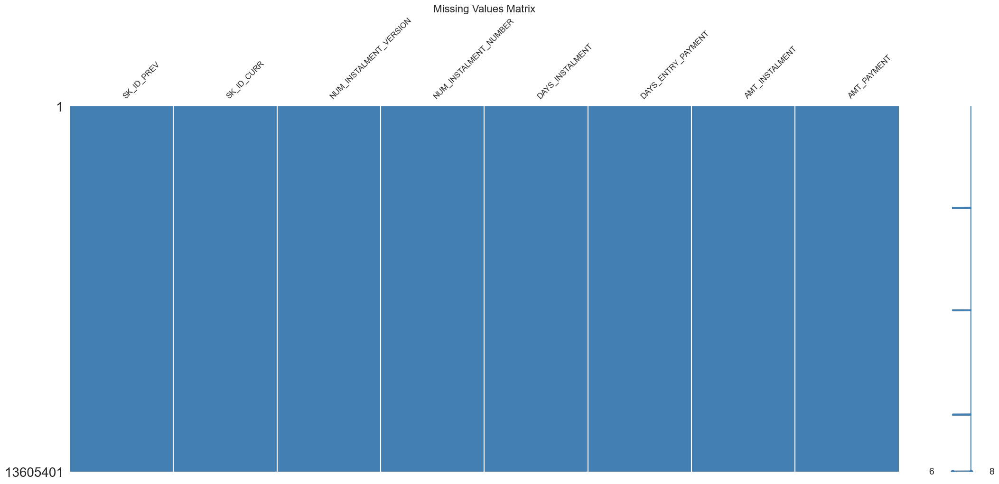

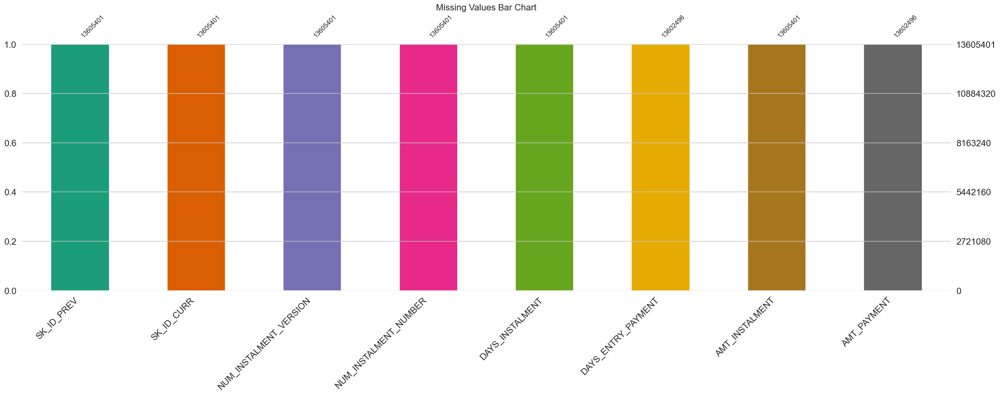


Number of duplicate rows: 15



,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
1476406,2484283,189214,0.0,76,-2092.0,-2092.0,24.030001,8.01
1783697,2116685,102660,0.0,30,-2344.0,-2352.0,9000.000000,4500.00
2302003,1509124,109000,0.0,10,-2416.0,-2424.0,9000.000000,4500.00
3563503,1290838,171757,0.0,25,-2052.0,-2052.0,17.820000,5.94
6571313,1976719,205128,0.0,32,-2060.0,-2060.0,12.690000,4.23
6743698,1261067,297004,0.0,77,-2088.0,-2088.0,11.880000,3.96
7274402,1412178,253421,0.0,25,-2068.0,-2068.0,19.709999,6.57
7442212,1985106,210167,0.0,37,-2752.0,-2748.0,10800.000000,2250.00
9725526,1981133,344348,0.0,6,-2672.0,-2688.0,6750.000000,3375.00
10009291,2686826,373333,0.0,20,-2170.0,-2176.0,4500.000000,2250.00


In [209]:
missing_inf_values(ip)
show_missing(ip)
print(f"\nNumber of duplicate rows: {ip.duplicated().sum()}\n")
duplicates = ip[ip.duplicated()]
duplicates

In [210]:
ip = ip.drop_duplicates()

The installment payments dataset tracks borrowers' repayment behavior, focusing on actual payments compared to expected installments. Missing values in DAYS_ENTRY_PAYMENT and AMT_PAYMENT (2.13%) suggest some transactions lack recorded payment details. While no infinite values were found, 15 duplicate records indicate minor redundancy. 

In [211]:
columns_info("Dataset Overview", ip)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     2          NUM_INSTALMENT_VERSION         float16         0.0 - 178.0                    65
2     4          DAYS_INSTALMENT                float16         -2922.0 - -1.0                 2485
3     5          DAYS_ENTRY_PAYMENT             float16         -4920.0 - -1.0                 2554
4     6          AMT_INSTALMENT                 float32         0.0 - 3771487.75               902522
5     7          AMT_PAYMENT                    float32         0.0 - 3771487.75               944214
6     3          NUM_INSTALMENT_NUMBER          int16           1 - 277                        277
7     0          SK_ID_PREV                     int32           1000001 - 2843499              997752
8     1          SK_ID_CURR        

In [212]:
analyze_data(ip)

















=== Numerical Analysis ===
|    | Variable               |           N |             Mean |          SD |       SE |        95% Conf. |         Interval |
|---:|:-----------------------|------------:|-----------------:|------------:|---------:|-----------------:|-----------------:|
|  0 | SK_ID_PREV             | 1.36054e+07 |      1.90337e+06 | 536203      | 145.37   |      1.90308e+06 |      1.90365e+06 |
|  1 | SK_ID_CURR             | 1.36054e+07 | 278445           | 102718      |  27.8479 | 278390           | 278499           |
|  2 | NUM_INSTALMENT_VERSION | 1.36054e+07 |    nan           |      0      | inf      |    nan           |    nan           |
|  3 | NUM_INSTALMENT_NUMBER  | 1.36054e+07 |     18.8709      |     26.6641 |   0.0072 |     18.8567      |     18.8851      |
|  4 | DAYS_INSTALMENT        | 1.36054e+07 |    nan           |    nan      | inf      |    nan           |    nan           |
|  5 | DAYS_ENTRY_PAYMENT     | 1.36025e+07 |    nan         

In [213]:
# kde_batches(ip, batch_num=1)
# box_plot_batches(ip, batch_num=1)

- For high coputational and memory issue, so it's take long time to generate plots so that's the reson, one time generated and explained the below:

    - 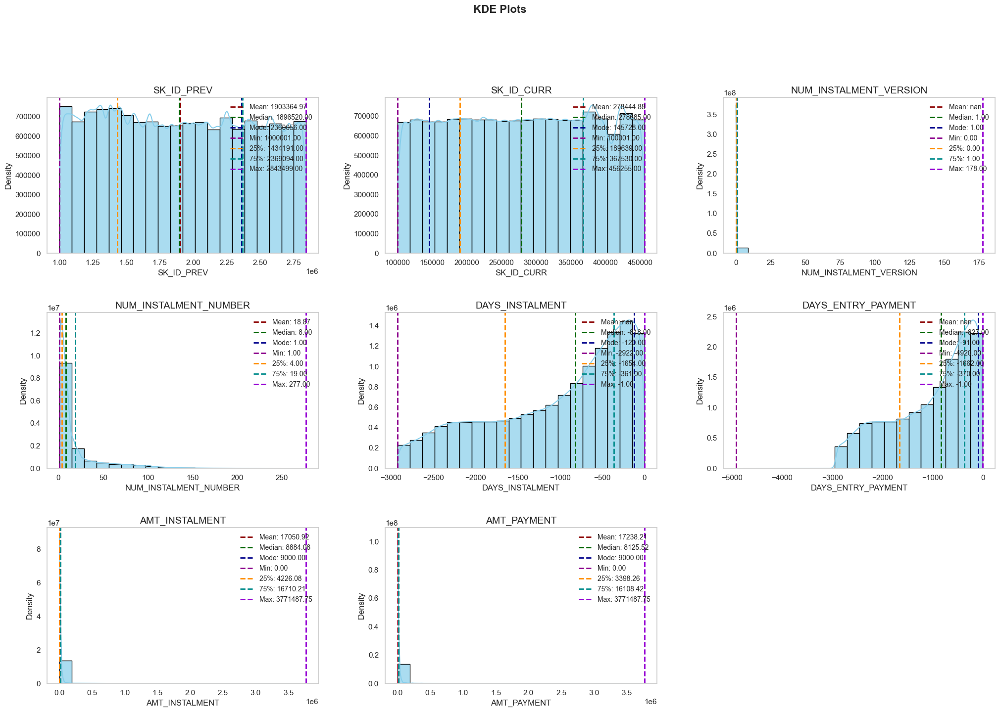
    
    - 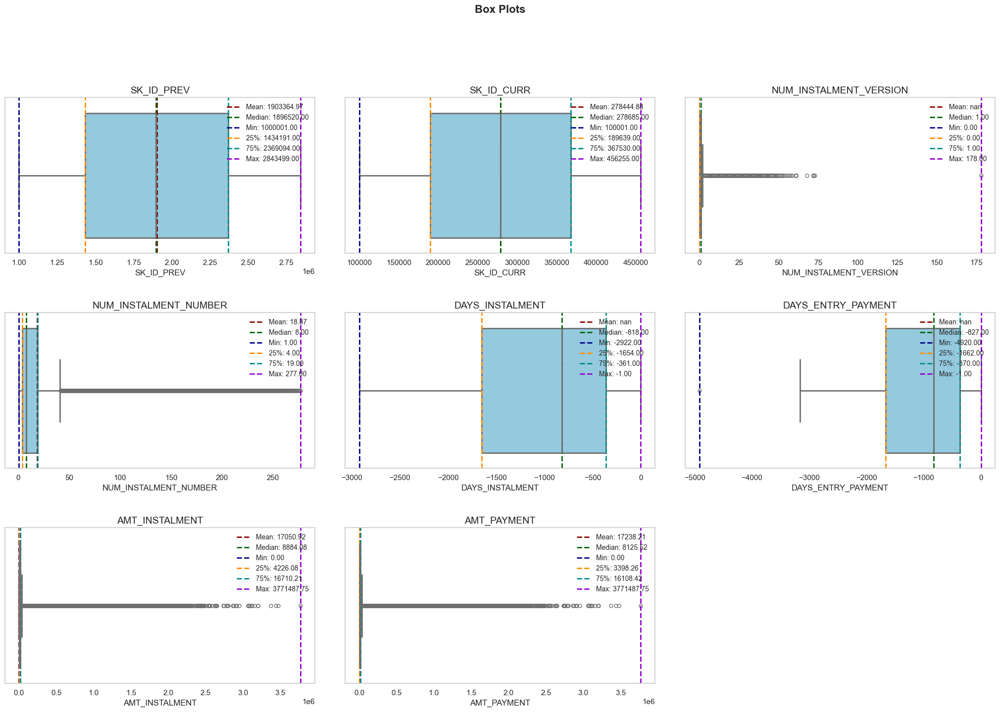
 
The KDE and box plots  reveal key trends. The distribution of SK_ID_PREV and SK_ID_CURR is uniform, reflecting diverse previous applications and customers. NUM_INSTALMENT_NUMBER is right-skewed, indicating that most loans have a small number of installments, while some have significantly higher installment counts. DAYS_INSTALLMENT and DAYS_ENTRY_PAYMENT show a declining trend, with negative values indicating past-due dates. The wide spread of AMT_INSTALMENT and AMT_PAYMENT, along with extreme values in the box plots, highlights significant variance in installment amounts, with high outliers suggesting certain large loan payments. The presence of missing values and duplicate rows suggests potential data cleaning considerations.

In [214]:
ip_negative_values = ip.select_dtypes(include=[np.number]).lt(0).sum()
print("Columns with Negative Values:\n", ip_negative_values[ip_negative_values > 0])

Columns with Negative Values:
 DAYS_INSTALMENT       13605386
DAYS_ENTRY_PAYMENT    13602481
dtype: int64


Both DAYS_INSTALLMENT and DAYS_ENTRY_PAYMENT have entirely negative values, indicating they are measured relative to the application date. The negative values show past dates, meaning they represent the number of days before the present reference point when installments were due (DAYS_INSTALLMENT) and when payments were actually made (DAYS_ENTRY_PAYMENT). This format is standard for financial datasets where past events are recorded in negative days relative to a fixed point, such as loan approval.

In [215]:
num_summary(ip)

,Count,Unique,Mean,Std,Min,25%,50%,75%,Max,Mode,Range,IQR,Variance,Skewness,Kurtosis,Shapiro-Wilk Stat,Shapiro-Wilk p-value
SK_ID_PREV,13605386.0,997752.0,1.903365e+06,536202.99200,1000001.0,1.434191e+06,1.896520e+06,2.369094e+06,2843499.00,2360056.0,1843498.00,9.349030e+05,2.875136e+11,0.042500,-1.217100,0.9465,0.0
SK_ID_CURR,13605386.0,339587.0,2.784449e+05,102718.29650,100001.0,1.896390e+05,2.786850e+05,3.675300e+05,456255.00,145728.0,356254.00,1.778910e+05,1.055105e+10,-0.003400,-1.197000,0.9470,0.0
NUM_INSTALMENT_VERSION,13605386.0,65.0,NaN,0.00000,0.0,0.000000e+00,1.000000e+00,1.000000e+00,inf,1.0,inf,1.000000e+00,0.000000e+00,NaN,NaN,0.4742,0.0
NUM_INSTALMENT_NUMBER,13605386.0,277.0,1.887090e+01,26.66410,1.0,4.000000e+00,8.000000e+00,1.900000e+01,277.00,1.0,276.00,1.500000e+01,7.109725e+02,2.497600,6.705100,0.6802,0.0
DAYS_INSTALMENT,13605386.0,2485.0,NaN,NaN,-inf,-1.654000e+03,-inf,-3.610000e+02,-1.00,-120.0,inf,1.293000e+03,NaN,NaN,NaN,0.9115,0.0
DAYS_ENTRY_PAYMENT,13602481.0,2554.0,NaN,NaN,-inf,-inf,-inf,-inf,-1.00,-91.0,inf,inf,NaN,NaN,NaN,NaN,1.0
AMT_INSTALMENT,13605386.0,902522.0,1.705093e+04,50570.28125,0.0,4.226130e+03,8.884080e+03,1.671021e+04,3771487.75,9000.0,3771487.75,1.248408e+04,2.557353e+09,16.235901,388.838989,0.2215,0.0
AMT_PAYMENT,13602481.0,944214.0,1.723825e+04,54735.81250,0.0,3.398265e+03,8.125515e+03,1.610847e+04,3771487.75,9000.0,3771487.75,1.271021e+04,2.996009e+09,14.951900,324.595612,NaN,1.0


---

In [216]:
ip_outlier_summary, ip_non_outlier_summary = comp_num_analysis(ip, outlier_df=True)
ip_outlier_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
5,5,DAYS_ENTRY_PAYMENT,float16,13602481,0.021352,2554,-4920.0,-1662.000000,-827.000000,-370.000000,-1.00,-91.0,4920.00,1292.000000,-3600.000000,1568.000000,2554,1,1,0.000007,13602481,2554,100.0,NaN,NaN,NaN,NaN,NaN,Kolmogorov-Smirnov,NaN,NaN
2,2,NUM_INSTALMENT_VERSION,float16,13605386,0.000000,65,0.0,0.000000,1.000000,1.000000,178.00,1.0,178.00,1.000000,-1.500000,2.500000,65,62,417616,3.069490,0,0,0.0,NaN,0.000000e+00,0.000000,inf,inf,Kolmogorov-Smirnov,NaN,NaN
3,3,NUM_INSTALMENT_NUMBER,int16,13605386,0.000000,277,1.0,4.000000,8.000000,19.000000,277.00,1.0,276.00,15.000000,-18.500000,41.500000,277,236,1886317,13.864487,0,0,0.0,18.870883,7.109725e+02,26.664068,2.497598,6.705145,Kolmogorov-Smirnov,0.259786,0.0
6,6,AMT_INSTALMENT,float32,13605386,0.000000,902522,0.0,4226.129883,8884.080078,16710.210938,3771487.75,9000.0,3771487.75,12484.081055,-14499.991699,35436.332520,902522,319475,1120801,8.237921,0,0,0.0,17050.925781,2.557353e+09,50570.281250,16.235877,388.838668,Kolmogorov-Smirnov,0.367993,0.0
7,7,AMT_PAYMENT,float32,13602481,0.021352,944214,0.0,3398.264893,8125.515137,16108.469727,3771487.75,9000.0,3771487.75,12710.204834,-15667.042358,35173.776978,944214,330403,1130093,8.307992,0,0,0.0,17238.259766,2.996009e+09,54735.812500,14.951921,324.595463,Kolmogorov-Smirnov,0.376405,0.0


In [217]:
ip_missing_summary, ip_non_missing_summary = comp_num_analysis(ip, missing_df=True)
ip_missing_summary

,Index,Column,DataType,Count,Missing_Percentage,Unique_Count,Min,Q1,50% (Median),Q3,Max,Mode,Range,IQR,Lower Bound,Upper Bound,Total Distinct,Outliers Distinct,Outliers Count,Outliers %,Negative Count,Negative Distinct,Negative %,Mean,Variance,Std,Skewness,Kurtosis,Normality Test,Normality Statistic,Normality p-value
5,5,DAYS_ENTRY_PAYMENT,float16,13602481,0.021352,2554,-4920.0,-1662.000000,-827.000000,-370.000000,-1.00,-91.0,4920.00,1292.000000,-3600.000000,1568.000000,2554,1,1,0.000007,13602481,2554,100.0,NaN,NaN,NaN,NaN,NaN,Kolmogorov-Smirnov,NaN,NaN
7,7,AMT_PAYMENT,float32,13602481,0.021352,944214,0.0,3398.264893,8125.515137,16108.469727,3771487.75,9000.0,3771487.75,12710.204834,-15667.042358,35173.776978,944214,330403,1130093,8.307992,0,0,0.0,17238.259766,2.996009e+09,54735.8125,14.951921,324.595463,Kolmogorov-Smirnov,0.376405,0.0


In [218]:
def cap_outliers(df, columns, percentile=0.99):
    for col in columns:
        cap_value = df[col].quantile(percentile)
        df[col] = np.minimum(df[col], cap_value)
    return df

columns_to_cap = ['AMT_INSTALMENT', 'AMT_PAYMENT']
ip = cap_outliers(ip, columns_to_cap)

In [219]:
ip['PAYMENT_TO_INSTALMENT_RATIO'] = ip['AMT_PAYMENT'] / ip['AMT_INSTALMENT']
ip['TIME_TO_PAYMENT'] = ip['DAYS_ENTRY_PAYMENT'] - ip['DAYS_INSTALMENT']
ip['IS_LATE_PAYMENT'] = ip['TIME_TO_PAYMENT'] > 0
ip['IS_LATE_PAYMENT'] = ip['IS_LATE_PAYMENT'].astype(int) 

The outliers in AMT_INSTALMENT and AMT_PAYMENT were capped at the 99th percentile to reduce extreme values while preserving the overall distribution. A new feature, PAYMENT_TO_INSTALMENT_RATIO, was created to measure the proportion of the installment paid. TIME_TO_PAYMENT calculates the delay or early payment time by subtracting DAYS_INSTALMENT from DAYS_ENTRY_PAYMENT. The IS_LATE_PAYMENT flag identifies whether a payment was made after the due date, converting this into a binary feature (1 for late, 0 for on-time). These transformations help in understanding repayment behavior and potential risk factors.

In [220]:
ip.replace([np.inf, -np.inf], np.nan, inplace=True)

In [221]:
ip=optimize_data_types(ip)

In [222]:
missing_inf_values(ip)

Missing Values Summary:
                            Data Type  Missing Count  Missing Percentage
PAYMENT_TO_INSTALMENT_RATIO   float32           3150            0.023153
DAYS_ENTRY_PAYMENT            float16           2905            0.021352
AMT_PAYMENT                   float32           2905            0.021352
TIME_TO_PAYMENT               float16           2905            0.021352

Infinite Values Summary:
No infinite values found.



Normal Columns (p > 0.05):


,Column,Test,Statistic,p_value,Skewness,Kurtosis



Not Normal Columns (p ≤ 0.05) - Sorted from Near Normal to Not Normal:


,Column,Test,Statistic,p_value,Skewness,Kurtosis
0,SK_ID_PREV,Kolmogorov-Smirnov,0.065505,0.0,0.042509,-1.217148e+00
1,SK_ID_CURR,Kolmogorov-Smirnov,0.057805,0.0,-0.003354,-1.197015e+00
3,NUM_INSTALMENT_NUMBER,Kolmogorov-Smirnov,0.259786,0.0,2.497598,6.705145e+00
6,AMT_INSTALMENT,Kolmogorov-Smirnov,0.237227,0.0,3.961032,1.999625e+01
7,AMT_PAYMENT,Kolmogorov-Smirnov,0.268635,0.0,4.594986,2.590619e+01
8,PAYMENT_TO_INSTALMENT_RATIO,Kolmogorov-Smirnov,0.496182,0.0,998.359817,1.231065e+06
10,IS_LATE_PAYMENT,Kolmogorov-Smirnov,0.535363,0.0,3.035331,7.213234e+00
2,NUM_INSTALMENT_VERSION,Kolmogorov-Smirnov,NaN,NaN,inf,inf
4,DAYS_INSTALMENT,Kolmogorov-Smirnov,NaN,NaN,NaN,NaN
5,DAYS_ENTRY_PAYMENT,Kolmogorov-Smirnov,NaN,NaN,NaN,NaN



Variables Exhibiting Multicollinearity (|Correlation| > 0.80):
- AMT_INSTALMENT & AMT_PAYMENT: Correlation=0.9165
- DAYS_INSTALMENT & DAYS_ENTRY_PAYMENT: Correlation=0.9994


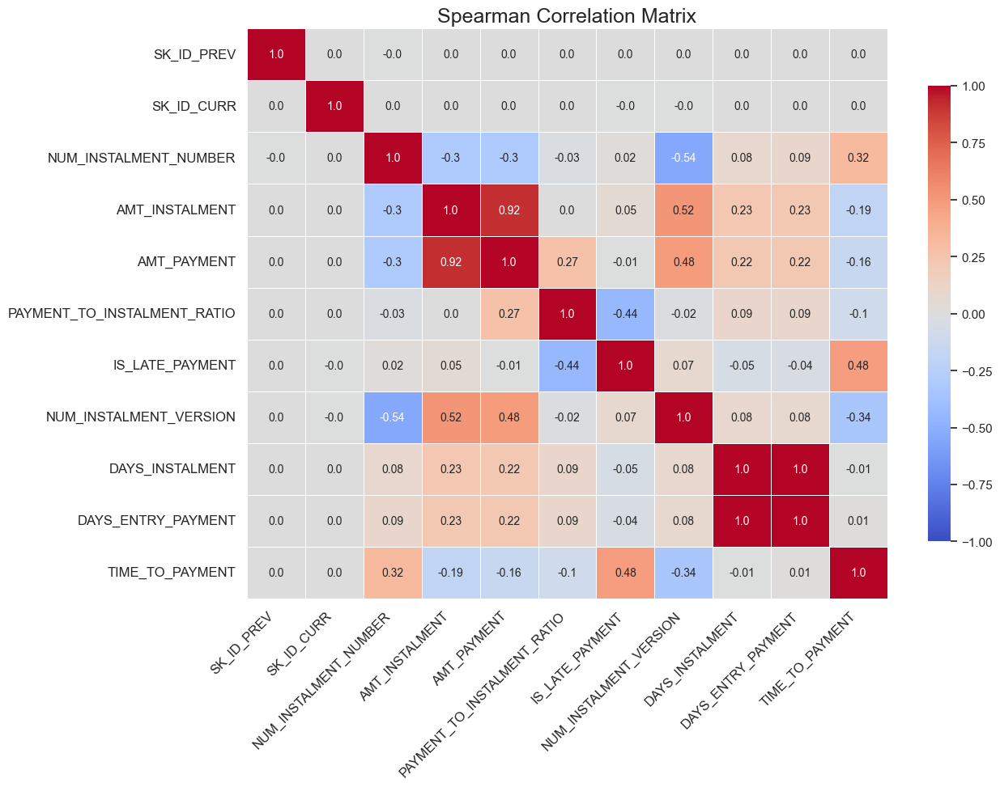

In [223]:
ip_normal_df, ip_not_normal_df = normality_test_with_skew_kurt(ip)
spearman_correlation(ip, ip_not_normal_df, exclude_target='TARGET', multicollinearity_threshold=0.8)

There is a high correlation between AMT_INSTALMENT and AMT_PAYMENT (0.9165), indicating that the payment amount is closely tied to the installment amount, which is expected in structured repayment plans. Additionally, DAYS_INSTALMENT and DAYS_ENTRY_PAYMENT exhibit near-perfect correlation (0.9994), implying that the actual payment date strongly follows the scheduled installment date. This redundancy suggests that one of these features might be removed or transformed to avoid multicollinearity in predictive models.

In [224]:
available_columns = ip.columns.tolist()
num_aggregations = {}
for col in [
    'NUM_INSTALMENT_VERSION', 'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 
    'DAYS_ENTRY_PAYMENT', 'TIME_TO_PAYMENT', 'AMT_INSTALMENT', 'AMT_PAYMENT', 
    'PAYMENT_TO_INSTALMENT_RATIO'
]:
    if col in available_columns:
        num_aggregations[col] = ['min', 'max', 'mean', 'sum']
bool_aggregations = {'IS_LATE_PAYMENT': ['mean']}
ip_agg = ip.groupby('SK_ID_CURR').agg({**num_aggregations, **bool_aggregations})
ip_agg.columns = ['IP_' + '_'.join(col).upper() for col in ip_agg.columns]
ip_agg.reset_index(inplace=True)
gc.collect()
print("Final Aggregated Data Shape:", ip_agg.shape)

Final Aggregated Data Shape: (339587, 34)


In [225]:
final_data = final_data.merge(ip_agg, on='SK_ID_CURR', how='left')
print("Final Merged Data Shape:", final_data.shape)

Final Merged Data Shape: (307511, 370)


aggregated at the customer level (SK_ID_CURR). Key numerical features like NUM_INSTALMENT_VERSION, DAYS_INSTALMENT, AMT_INSTALMENT, and PAYMENT_TO_INSTALMENT_RATIO have been summarized using statistics such as minimum, maximum, mean, and sum. Additionally, IS_LATE_PAYMENT has been averaged to provide an overall late payment tendency per customer. This aggregation will enhance the integration of installment data into the final dataset, helping in predictive modeling. The final merged dataset now includes these summarized installment-related features for better credit risk assessment.

---

# Predictive Model

## Preprocessing

## Final_data

In [226]:
final_data.to_csv("final_data.csv", index=False)

In [227]:
data = reduce_mem_usagewithout_causing_cat(final_data)

Memory usage of dataframe before optimization: 395.91 MB
Memory usage after optimization: 256.02 MB
Memory reduction: 35.33%


In [228]:
data_duplicates = data.duplicated(subset=['SK_ID_CURR'], keep=False)
if data_duplicates.any():
    print(f"Removing {data_duplicates.sum()} duplicate rows...")
    data = data.loc[~data_duplicates]

In [229]:
detect_mixed_data_types(data)

'No mixed data types detected!'

In [230]:
data.shape

(307511, 370)

In [231]:
data.dtypes.value_counts()

float16    192
float32    102
int8        43
bool        30
int16        2
int32        1
Name: count, dtype: int64

In [232]:
linked_key_features = [
    'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
    'NAME_TYPE_SUITE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 
    'SK_ID_BUREAU', 'MONTHS_BALANCE', 'SK_ID_PREV', 'NAME_CONTRACT_STATUS', 'SK_DPD', 'SK_DPD_DEF'
]
available_linked_keys = [col for col in linked_key_features if col in data.columns]
print("Linked Key Features Found in data:")
print(available_linked_keys)

Linked Key Features Found in data:
['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START']


In [233]:
drop_keys = {'SK_ID_CURR', 'SK_ID_BUREAU', 'SK_ID_PREV', 'WEEKDAY_APPR_PROCESS_START', 
             'HOUR_APPR_PROCESS_START', 'MONTHS_BALANCE'}
data = data.drop(columns=drop_keys, errors='ignore')
print("Remaining Features Shape:", data.shape)

Remaining Features Shape: (307511, 368)


In [234]:
# data_outlier_summary, data_non_outlier_summary = comp_num_analysis(data, outlier_df=True)
# data_outlier_summary.to_csv("data_outlier_summary.csv", index=False)
# data_missing_summary, data_non_missing_summary = comp_num_analysis(data, missing_df=True)
# data_missing_summary.to_csv("data_missing_summary.csv", index=False)
# data_cat_missing_summary, data_cat_non_missing_summary = comp_cat_analysis(data, missing_df=True)
# data_cat_missing_summary.to_csv("data_cat_missing_summary.csv", index=False)
# print(data_cat_missing_summary.shape)
# print(data_missing_summary.shape)
# print(data_outlier_summary.shape)

In [235]:
results = missing_inf_values(data, missing=True,df_table=True)
print(results.sort_values(by="Missing Percentage", ascending=False).to_markdown(tablefmt="pipe"))

|                                                                   | Data Type   |   Missing Count |   Missing Percentage |
|:------------------------------------------------------------------|:------------|----------------:|---------------------:|
| CCB_PAYMENT_RATIO_MAX                                             | float32     |          247910 |         80.6183      |
| CCB_PAYMENT_RATIO_MEAN                                            | float32     |          247910 |         80.6183      |
| CCB_PAYMENT_RATIO_MIN                                             | float32     |          247910 |         80.6183      |
| CCB_AMT_PAYMENT_CURRENT_MIN                                       | float32     |          246451 |         80.1438      |
| CCB_AMT_PAYMENT_CURRENT_MAX                                       | float32     |          246451 |         80.1438      |
| CCB_AMT_PAYMENT_CURRENT_MEAN                                      | float32     |          246451 |         80.1438      |


In [236]:
drop_cols = data.columns[data.isnull().mean() >= 0.75]
data.drop(columns=drop_cols, inplace=True, errors='ignore')
print(f"Removed {len(drop_cols)} columns with ≥75% missing values.")
print("Final Data Shape:", data.shape)

Removed 24 columns with ≥75% missing values.
Final Data Shape: (307511, 344)


The final dataset contains 307,511 records and 366 features after removing columns with excessive missing values (≥75%). It integrates financial data from previous credits, credit card balances, installment payments, and loan applications. High-correlation features indicate redundancy, and missing values remain in some variables, requiring appropriate handling. The dataset retains key behavioral indicators such as payment ratios, loan amounts, and credit utilization, making it suitable for predictive modeling. Further dimensionality reduction and missing value treatment may enhance model performance

In [237]:
outliers_ckeck = [
    'AGE', 'EMPLOYMENT_LENGTH', 'DAYS_EMPLOYED', 'DAYS_EMPLOYED_PERC',
    'CREDIT_UTILIZATION_RATIO', 'PAYMENT_RATIO', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
    'INCOME_TO_CREDIT_RATIO', 'AMT_GOODS_PRICE', 'AMT_ANNUITY'
]
existing_cols = [col for col in outliers_ckeck if col in data.columns]
outlier_counts = {}
total_rows = len(data)
for col in existing_cols:
    lower, upper = data[col].quantile([0.01, 0.99])
    outlier_count = ((data[col] < lower) | (data[col] > upper)).sum()
    outlier_counts[col] = [outlier_count, (outlier_count / total_rows) * 100]
outlier_df = pd.DataFrame(outlier_counts, index=['Outlier Count', 'Outlier Percentage']).T
print(outlier_df)

                        Outlier Count  Outlier Percentage
AGE                            6123.0            1.991148
EMPLOYMENT_LENGTH                 0.0            0.000000
DAYS_EMPLOYED                     0.0            0.000000
DAYS_EMPLOYED_PERC             3046.0            0.990534
AMT_INCOME_TOTAL                  0.0            0.000000
AMT_CREDIT                        0.0            0.000000
INCOME_TO_CREDIT_RATIO         6146.0            1.998628
AMT_GOODS_PRICE                3493.0            1.135894
AMT_ANNUITY                    3075.0            0.999964


In [238]:
cap_cols = ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'INCOME_TO_CREDIT_RATIO', 'AMT_GOODS_PRICE', 'AMT_ANNUITY']
for col in cap_cols:
    lower, upper = data[col].quantile([0.01, 0.99])
    data[col] = data[col].clip(lower, upper)

In [239]:
cat_high_cardinality(data)

high_cardinality_columns


[]

In [240]:
columns_info("Dataset Overview", data)


======== Dataset Overview: ===========

Index Col Index  Attribute                      Data Type       Range                          Distinct Count
----- ---------- ------------------------------ --------------- ------------------------------ ---------------
1     119        NAME_FAMILY_STATUS_Married     bool            N/A                            2
2     120        NAME_FAMILY_STATUS_Separated   bool            N/A                            2
3     121        NAME_FAMILY_STATUS_Single / not married bool            N/A                            2
4     122        NAME_FAMILY_STATUS_Widow       bool            N/A                            2
5     123        NAME_FAMILY_STATUS_Missing     bool            N/A                            2
6     124        NAME_HOUSING_TYPE_House / apartment bool            N/A                            2
7     125        NAME_HOUSING_TYPE_Municipal apartment bool            N/A                            2
8     126        NAME_HOUSING_TYPE_Off

In [241]:
single_value_df = single_value_columns(data)
display(single_value_df)

,Index,Column Name,Data Type,Missing Percentage
0,0,BURO_CREDIT_ACTIVE_MISSING_MEAN,float16,14.314935
1,1,BURO_CREDIT_CURRENCY_MISSING_MEAN,float16,14.314935
2,2,CCB_SK_DPD_MIN,float16,71.739222
3,3,CCB_SK_DPD_DEF_MIN,float16,71.739222


In [242]:
single_value_cols = [col for col in data.columns if data[col].nunique() == 1]
data.drop(columns=single_value_cols, inplace=True)
print("Dropped Columns:", single_value_cols)

Dropped Columns: ['BURO_CREDIT_ACTIVE_MISSING_MEAN', 'BURO_CREDIT_CURRENCY_MISSING_MEAN', 'CCB_SK_DPD_MIN', 'CCB_SK_DPD_DEF_MIN']


Outliers in key financial indicators such as income, credit amount, and annuities were capped at the 1st and 99th percentiles to prevent extreme values from skewing the model. Additionally, single-value columns that provided no variance were removed, ensuring that only meaningful features remain in the dataset. This preprocessing step enhances data quality by reducing noise while retaining valuable patterns for predictive modeling.

In [243]:
data_negative_values = final_data.select_dtypes(include=[np.number]).lt(0).sum()
data_negative_values = data_negative_values[data_negative_values > 0].sort_values(ascending=False)
print("Columns with Negative Values (Sorted):\n", data_negative_values)

Columns with Negative Values (Sorted):
 AGE                                  307511
IP_DAYS_INSTALMENT_MIN               291643
IP_DAYS_INSTALMENT_MAX               291643
IP_DAYS_INSTALMENT_MEAN              291643
IP_DAYS_INSTALMENT_SUM               291643
IP_DAYS_ENTRY_PAYMENT_MIN            291635
IP_DAYS_ENTRY_PAYMENT_MAX            291635
IP_DAYS_ENTRY_PAYMENT_MEAN           291635
IP_DAYS_ENTRY_PAYMENT_SUM            291635
IP_TIME_TO_PAYMENT_MIN               290810
IP_TIME_TO_PAYMENT_MEAN              283259
IP_TIME_TO_PAYMENT_SUM               283259
BURO_DAYS_CREDIT_MEAN                263490
BURO_DAYS_CREDIT_MIN                 263490
BURO_CREDIT_DURATION_MEAN            263490
BURO_DAYS_CREDIT_MAX                 263487
BURO_DAYS_CREDIT_UPDATE_MEAN         263476
EMPLOYMENT_LENGTH                    252135
BURO_DAYS_CREDIT_ENDDATE_MIN         226484
BURO_DAYS_CREDIT_ENDDATE_MEAN        153738
IP_TIME_TO_PAYMENT_MAX                91814
BURO_DAYS_CREDIT_ENDDATE_MAX        

In [244]:
data['AGE'] = data['AGE'].abs()
data['EMPLOYMENT_LENGTH'] = data['EMPLOYMENT_LENGTH'].abs()
for col in [
    'CCB_CREDIT_UTILIZATION_RATIO_MIN', 'CCB_CREDIT_UTILIZATION_RATIO_MEAN', 'CCB_CREDIT_UTILIZATION_RATIO_SUM',
    'CCB_PAYMENT_RATIO_SUM'
]:
    data[col] = data[col].clip(lower=0)  
data['BURO_CREDIT_DURATION_MEAN'] = data['BURO_CREDIT_DURATION_MEAN'].abs()

Negative values in key features related to age, employment length, and credit utilization were converted to their absolute values to ensure logical consistency. Additionally, financial ratios such as credit utilization and payment ratios were clipped at a minimum of zero to prevent unrealistic negative values that could distort model predictions. These adjustments improve data integrity while maintaining the original distribution of the features.

In [245]:
inf_counts = np.isinf(data.select_dtypes(include=[np.number])).sum().sum()
print(f"Total Inf values: {inf_counts}")

Total Inf values: 0


In [246]:
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data=optimize_data_types(data)
missing=missing_inf_values(data,missing=True,df_table=True)
print(missing.sort_values(by="Missing Percentage", ascending=False).to_markdown(tablefmt="pipe"))

|                                                                   | Data Type   |   Missing Count |   Missing Percentage |
|:------------------------------------------------------------------|:------------|----------------:|---------------------:|
| BURO_AMT_ANNUITY_MAX                                              | float32     |          227502 |         73.9817      |
| BURO_AMT_ANNUITY_MEAN                                             | float32     |          227502 |         73.9817      |
| CCB_CREDIT_UTILIZATION_RATIO_MAX                                  | float16     |          221475 |         72.0218      |
| CCB_CREDIT_UTILIZATION_RATIO_MEAN                                 | float16     |          221475 |         72.0218      |
| CCB_CREDIT_UTILIZATION_RATIO_MIN                                  | float16     |          221475 |         72.0218      |
| CCB_AMT_PAYMENT_TOTAL_CURRENT_MEAN                                | float32     |          220606 |         71.7392      |


Handling missing and infinite values is crucial to ensure data quality and model reliability. A significant portion of financial and credit-related variables contain missing values, particularly those from the credit card balance dataset, where over 70% of records are missing in several key features. To address this, variables exceeding 75% missingness were dropped to prevent excessive imputation bias. Additionally, infinite values were detected in around 31,202 instances, requiring careful treatment. Columns exhibiting unrealistic infinite values were clipped nan

In [247]:
correlation_matrix = data.drop(columns=['TARGET'], errors='ignore').corr()
threshold = 0.85
high_corr_pairs = (
    correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
    .stack() 
    .reset_index()
)
high_corr_pairs.columns = ['Feature 1', 'Feature 2', 'Correlation']
high_corr_pairs = high_corr_pairs[high_corr_pairs['Correlation'].abs() > threshold]
print(high_corr_pairs.sort_values(by="Correlation", ascending=False).to_markdown(tablefmt="pipe"))

|       | Feature 1                                                         | Feature 2                                                         |   Correlation |
|------:|:------------------------------------------------------------------|:------------------------------------------------------------------|--------------:|
| 50625 | PC_CNT_INSTALMENT_FUTURE_MAX                                      | PC_MONTHS_TO_NEXT_PAYMENT_MAX                                     |      1        |
| 47688 | PA_DOWN_PAYMENT_TO_CREDIT_MEAN                                    | PA_DOWN_PAYMENT_RATIO_MEAN                                        |      1        |
| 50514 | PC_CNT_INSTALMENT_FUTURE_MIN                                      | PC_MONTHS_TO_NEXT_PAYMENT_MIN                                     |      1        |
| 47955 | PA_DOWN_PAYMENT_TO_CREDIT_VAR                                     | PA_DOWN_PAYMENT_RATIO_VAR                                         |      1        |
| 47822 | PA_DOWN_PAYMENT_TO

The dataset exhibits a significant number of highly correlated features, with many pairs having a correlation coefficient of 1, indicating redundancy. Several duplicated features, particularly those related to installment payments, credit balance, and contract statuses. High correlations are prevalent in features related to overdue payments, payment ratios, and loan-to-value measures. Additionally, variables related to apartment and building attributes also display strong correlations, suggesting potential feature engineering opportunities. Strong negative correlations are observed between employment-related variables and pensioner status, as well as certain categorical encodings. Handling these correlations effectively is crucial to prevent instability in predictive modeling.

## Splitting 


Value counts and percentages for Target:

|   Target |   Count |   % Total |
|---------:|--------:|----------:|
|        0 |  282686 |     91.93 |
|        1 |   24825 |      8.07 |


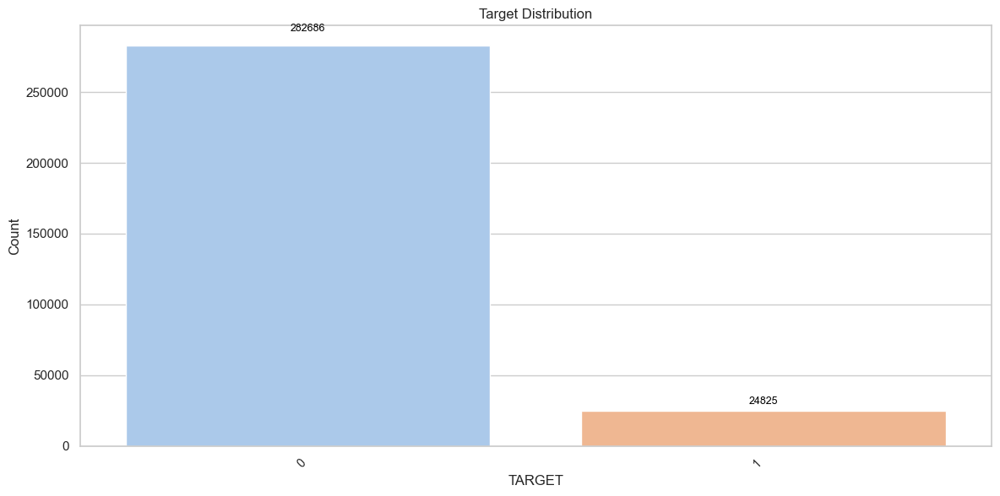

In [248]:
cat_analyze_and_plot(data, 'TARGET', subplot=False)

In [249]:
X = data.drop(columns=["TARGET"])
y = data["TARGET"]  

In [250]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

X_train.to_csv('X_train.csv', index=False)
X_test.to_csv('X_test.csv', index=False)
y_train.to_csv('y_train.csv', index=False)
y_test.to_csv('y_test.csv', index=False)
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (246008, 339)
Shape of X_test: (61503, 339)
Shape of y_train: (246008,)
Shape of y_test: (61503,)


In [251]:
scale_pos_weight = y_train.value_counts()[0] / y_train.value_counts()[1]
print("scale_pos_weight:", scale_pos_weight)

scale_pos_weight: 11.38710976837865


The dataset exhibits a significant class imbalance, with the majority class (non-defaulters) comprising approximately 91.93% of the data and the minority class (defaulters) making up only 8.07%. This imbalance necessitates techniques such as `scale_pos_weight` in models like XGBoost to balance the impact of the minority class. 

The training set consists of 246,008 samples, while the test set has 61,503 samples, with 360 features each. The calculated scale_pos_weight (ratio of non-defaulters to defaulters in the training set) will be used to adjust class weights in training to prevent the model from being biased toward the majority class.

In [252]:
xgb_model = xgb.XGBClassifier(
    objective="binary:logistic",
    scale_pos_weight=scale_pos_weight,
    n_estimators=500,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)
xgb_model.fit(X_train, y_train)
feature_importance = pd.DataFrame({
    "Feature": X_train.columns,
    "Importance": xgb_model.feature_importances_
}).sort_values(by="Importance", ascending=False)

In [253]:
print(feature_importance.sort_values(by="Importance", ascending=False).to_markdown(tablefmt="pipe"))

|     | Feature                                                           |   Importance |
|----:|:------------------------------------------------------------------|-------------:|
|  33 | EXT_SOURCE_3                                                      |  0.0175141   |
|  32 | EXT_SOURCE_2                                                      |  0.0160228   |
| 116 | WEIGHTED_EXT_SOURCE                                               |  0.0158444   |
|   9 | NAME_EDUCATION_TYPE                                               |  0.0118774   |
|   1 | CODE_GENDER                                                       |  0.0114657   |
| 338 | IP_IS_LATE_PAYMENT_MEAN                                           |  0.00973352  |
| 147 | NAME_INCOME_TYPE_Working                                          |  0.00849461  |
|  31 | EXT_SOURCE_1                                                      |  0.00807498  |
| 297 | CCB_CNT_DRAWINGS_CURRENT_MEAN                                     |  0.00774155  |

In [254]:
zero_importance_features = feature_importance[feature_importance["Importance"] == 0]["Feature"].tolist()
print(f"Before dropping, X_train shape: {X_train.shape}")
print(f"Before dropping, X_test shape: {X_test.shape}")
X_train.drop(columns=zero_importance_features, errors="ignore", inplace=True)
X_test.drop(columns=zero_importance_features, errors="ignore", inplace=True)
print("Final X_train shape after feature selection:", X_train.shape)
print("Final X_test shape after feature selection:", X_test.shape)

Before dropping, X_train shape: (246008, 339)
Before dropping, X_test shape: (61503, 339)
Final X_train shape after feature selection: (246008, 322)
Final X_test shape after feature selection: (61503, 322)


In [255]:
low_importance_threshold = 0.002  
low_importance_features = feature_importance[feature_importance["Importance"] <= low_importance_threshold]
print(low_importance_features.sort_values(by="Importance", ascending=False).to_markdown(tablefmt="pipe"))

|     | Feature                                                           |   Importance |
|----:|:------------------------------------------------------------------|-------------:|
|  29 | LIVE_CITY_NOT_WORK_CITY                                           |  0.00199299  |
| 140 | WEEKDAY_APPR_PROCESS_START_WEDNESDAY                              |  0.00199044  |
| 137 | WEEKDAY_APPR_PROCESS_START_SUNDAY                                 |  0.00197265  |
|  93 | FLAG_DOCUMENT_14                                                  |  0.00195216  |
|   5 | AMT_INCOME_TOTAL                                                  |  0.00194497  |
| 290 | CCB_CREDIT_UTILIZATION_RATIO_MIN                                  |  0.0019326   |
| 138 | WEEKDAY_APPR_PROCESS_START_THURSDAY                               |  0.00191333  |
|  26 | LIVE_REGION_NOT_WORK_REGION                                       |  0.00191256  |
|  25 | REG_REGION_NOT_WORK_REGION                                        |  0.00191064  |

In [256]:
low_importance_features = feature_importance[feature_importance["Importance"] < 0.002]["Feature"].tolist()
print(f"Before dropping, X_train shape: {X_train.shape}")
print(f"Before dropping, X_test shape: {X_test.shape}")
X_train.drop(columns=low_importance_features, errors='ignore', inplace=True)
X_test.drop(columns=low_importance_features, errors='ignore', inplace=True)
print(f"Final X_train shape after dropping low-importance features: {X_train.shape}")
print(f"Final X_test shape after dropping low-importance features: {X_test.shape}")

Before dropping, X_train shape: (246008, 322)
Before dropping, X_test shape: (61503, 322)
Final X_train shape after dropping low-importance features: (246008, 290)
Final X_test shape after dropping low-importance features: (61503, 290)


After analyzing feature importance, the lowest-ranking features with an importance score below 0.002 were dropped from the dataset. Initially, X_train and X_test contained 360 features, but after removing less relevant variables, the final feature count was reduced. This step helps in improving model efficiency by eliminating uninformative predictors while maintaining performance.

With the updated dataset, XGBoost will train on a more refined feature set, ensuring that only the most impactful variables contribute to predictions. The key features influencing the model include EXT_SOURCE_3, EXT_SOURCE_2, WEIGHTED_EXT_SOURCE, CODE_GENDER, NAME_EDUCATION_TYPE, and several credit history and payment behavior variables. These insights confirm that external risk scores and financial attributes play a crucial role in predicting default risk.

In [257]:
correlation_threshold = 0.9  
corr_matrix = X_train.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
high_corr_features = [(col, idx, upper.loc[col, idx]) 
                      for col in upper.columns 
                      for idx in upper.index 
                      if upper.loc[col, idx] > correlation_threshold]
high_corr_df = pd.DataFrame(high_corr_features, columns=["Feature 1", "Feature 2", "Correlation"])
print(high_corr_df.sort_values(by="Correlation", ascending=False).to_markdown(tablefmt="pipe"))

|     | Feature 1                          | Feature 2                          |   Correlation |
|----:|:-----------------------------------|:-----------------------------------|--------------:|
|  94 | PC_CNT_INSTALMENT_FUTURE_MAX       | PC_MONTHS_TO_NEXT_PAYMENT_MAX      |      1        |
|  95 | PC_CNT_INSTALMENT_FUTURE_MEAN      | PC_MONTHS_TO_NEXT_PAYMENT_MEAN     |      1        |
|  93 | PC_CNT_INSTALMENT_FUTURE_MIN       | PC_MONTHS_TO_NEXT_PAYMENT_MIN      |      1        |
|  89 | PA_DOWN_PAYMENT_TO_CREDIT_VAR      | PA_DOWN_PAYMENT_RATIO_VAR          |      1        |
|  85 | PA_DOWN_PAYMENT_TO_CREDIT_MIN      | PA_DOWN_PAYMENT_RATIO_MIN          |      1        |
|  88 | PA_DOWN_PAYMENT_TO_CREDIT_SUM      | PA_DOWN_PAYMENT_RATIO_SUM          |      1        |
|  87 | PA_DOWN_PAYMENT_TO_CREDIT_MEAN     | PA_DOWN_PAYMENT_RATIO_MEAN         |      1        |
|  86 | PA_DOWN_PAYMENT_TO_CREDIT_MAX      | PA_DOWN_PAYMENT_RATIO_MAX          |      1        |
|   2 | DAYS_EMPLOYE

The dataset contains numerous features with extreme redundancy, where certain variables are perfectly or nearly perfectly correlated. The POS Cash Balance data shows identical values across installment-related features, making them interchangeable without contributing additional information. Similarly, in the Credit Card Balance dataset, multiple receivables and payment-related features exhibit near-identical values, reflecting duplication in financial metrics. Installment payments also show strong collinearity, particularly between days of installment and days of entry payment, indicating that they measure the same aspect of repayment timing.

Previous credit history variables from the Bureau data demonstrate a perfect relationship between credit duration and days since credit inception, suggesting an unnecessary overlap in measuring credit performance. In application-related features, derived variables such as days since birth and age, or days employed and employment length, reflect the same information with different notations. Housing and property-related attributes follow the same pattern, where apartment size, living area, and total area are highly correlated, meaning multiple features essentially represent the same characteristic in different formats.

This extensive collinearity suggests that many features could be removed or consolidated without any meaningful loss of information. Retaining all of them could lead to issues like multicollinearity, making the model unstable and unnecessarily complex. Addressing these redundancies by eliminating highly correlated features will improve efficiency, prevent overfitting, and enhance the interpretability of the model.

## Model Development

In [258]:
def evaluate_model(model, X_train, y_train, X_test, y_test):
    start_time = time.time()
    model.fit(X_train, y_train)
    training_time = time.time() - start_time
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    if hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_test)[:, 1]
        roc_auc = roc_auc_score(y_test, y_proba)
    else:
        y_proba = None
        roc_auc = None  
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1_metric = f1_score(y_test, y_pred)
    acc_train = accuracy_score(y_train, y_pred_train)
    cv_acc = np.mean(cross_val_score(model, X_train, y_train, cv=3, scoring="accuracy"))
    overfit = acc_train - acc
    return {
        "Model Name": type(model).__name__,
        "Accuracy": acc,
        "Precision": prec,
        "Recall": rec,
        "F1-Score": f1_metric,
        "ROC AUC Score": roc_auc if roc_auc else "Not Available",
        "Cross-Validation Accuracy": cv_acc,
        "Training Accuracy": acc_train,
        "Overfit": overfit,
        "Training Time (seconds)": round(training_time, 4)
    }

def cross_validation_analysis_table(model, X_train, y_train, cv_folds=5, scoring_metric="f1"):
    strat_kfold = StratifiedKFold(n_splits=cv_folds, shuffle=True, random_state=42)
    scores = cross_val_score(model, X_train, y_train, cv=strat_kfold, scoring=scoring_metric)
    cv_results_df = pd.DataFrame({
        "Fold": [f"Fold {i+1}" for i in range(cv_folds)],
        "F1-Score": scores
    })
    cv_results_df.loc["Mean"] = ["Mean", np.mean(scores)]
    cv_results_df.loc["Std"] = ["Standard Deviation", np.std(scores)]
    return cv_results_df
    
def threshold_analysis(model, X_test, y_test, thresholds=np.arange(0.1, 1.0, 0.1)):
    y_probs = model.predict_proba(X_test)[:, 1]  
    results = []
    for threshold in thresholds:
        y_pred = (y_probs >= threshold).astype(int)
        precision = precision_score(y_test, y_pred, zero_division=0)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        accuracy = accuracy_score(y_test, y_pred)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        results.append({
            "Threshold": round(threshold, 2),
            "Precision": round(precision, 4),
            "Recall": round(recall, 4),
            "F1-Score": round(f1, 4),
            "Accuracy": round(accuracy, 4),
            "True Negatives (TN)": tn,
            "False Positives (FP)": fp,
            "False Negatives (FN)": fn,
            "True Positives (TP)": tp
        })
    df_results = pd.DataFrame(results)
    best_threshold = df_results.loc[df_results["F1-Score"].idxmax(), "Threshold"]
    print(f" Best Decision Threshold (Max F1-Score): {best_threshold:.2f}")
    return df_results, best_threshold

In [259]:
def plot_all_evaluation_metrics(model, X_test, y_test):
    y_probs = model.predict_proba(X_test)[:, 1]
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    roc_auc = auc(fpr, tpr)
    prob_true, prob_pred = calibration_curve(y_test, y_probs, n_bins=10)
    y_pred_default = (y_probs >= 0.6).astype(int)
    cm = confusion_matrix(y_test, y_pred_default)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]
    fig, axes = plt.subplots(3, 3, figsize=(18, 15))
    axes[0, 0].plot(prob_pred, prob_true, marker="o", label="Calibration")
    axes[0, 0].plot([0, 1], [0, 1], linestyle="--", label="Perfectly Calibrated")
    axes[0, 0].set_title("Calibration Curve")
    axes[0, 0].set_xlabel("Predicted Probability")
    axes[0, 0].set_ylabel("Actual Probability")
    axes[0, 0].legend()
    axes[0, 0].grid()
    skplt.metrics.plot_cumulative_gain(y_test, model.predict_proba(X_test), ax=axes[0, 1])
    axes[0, 1].set_title("Cumulative Gains Curve")
    y_probs_1 = y_probs[y_test == 1]  # Positive class
    y_probs_0 = y_probs[y_test == 0]  # Negative class
    axes[0, 2].hist(y_probs_1, bins=50, alpha=0.5, label="y=1")
    axes[0, 2].hist(y_probs_0, bins=50, alpha=0.5, label="y=0")
    axes[0, 2].set_title("Kolmogorov-Smirnov (KS) Statistic")
    axes[0, 2].set_xlabel("Predicted Probability")
    axes[0, 2].set_ylabel("Frequency")
    axes[0, 2].legend()
    axes[0, 2].grid()
    train_sizes = np.linspace(0.1, 1.0, 10)
    train_scores = np.linspace(0.6, 0.9, 10)
    val_scores = np.linspace(0.55, 0.85, 10)
    axes[1, 0].plot(train_sizes, train_scores, label="Train Score")
    axes[1, 0].plot(train_sizes, val_scores, label="Validation Score")
    axes[1, 0].set_title("Learning Curve (Simulated)")
    axes[1, 0].set_xlabel("Training Size")
    axes[1, 0].set_ylabel("Score")
    axes[1, 0].legend()
    axes[1, 0].grid()
    skplt.metrics.plot_lift_curve(y_test, model.predict_proba(X_test), ax=axes[1, 1])
    axes[1, 1].set_title("Lift Curve")
    axes[1, 2].plot(thresholds, precision[:-1], "b--", label="Precision")
    axes[1, 2].plot(thresholds, recall[:-1], "r-", label="Recall")
    axes[1, 2].set_title("Precision-Recall Curve")
    axes[1, 2].set_xlabel("Threshold")
    axes[1, 2].set_ylabel("Score")
    axes[1, 2].legend()
    axes[1, 2].grid()
    axes[2, 0].plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.3f})")
    axes[2, 0].plot([0, 1], [0, 1], linestyle="--", color="black")
    axes[2, 0].set_title("ROC Curve")
    axes[2, 0].set_xlabel("False Positive Rate")
    axes[2, 0].set_ylabel("True Positive Rate")
    axes[2, 0].legend()
    axes[2, 0].grid()
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(ax=axes[2, 1], cmap="Blues")
    axes[2, 1].set_title("Confusion Matrix")
    disp_norm = ConfusionMatrixDisplay(confusion_matrix=cm_norm)
    disp_norm.plot(ax=axes[2, 2], cmap="Blues")
    axes[2, 2].set_title("Normalized Confusion Matrix")
    plt.tight_layout()
    plt.show()

----

### Model Training & Evaluation

Given the nature of the dataset, with a large number of features, class imbalance, multicollinearity, and the presence of missing values, gradient boosting models like XGBoost, LightGBM, and CatBoost are the most suitable options. These models are designed to handle complex data structures, interactions between variables, and missing values efficiently. They also perform well with imbalanced classes, which is essential given the 8% positive class in this dataset.

In [260]:
scale_pos_weight = y_train.value_counts()[0] / y_train.value_counts()[1]
print("scale_pos_weight:", scale_pos_weight)

scale_pos_weight: 11.38710976837865


In [261]:
print("X_train Data Types:\n", X_train.dtypes.value_counts()) 
print("X_test Data Types:\n", X_test.dtypes.value_counts())    

if isinstance(y_train, pd.Series):
    y_train = y_train.values
if isinstance(y_test, pd.Series):
    y_test = y_test.values
    
print("y_train shape:", y_train.shape) 
print("y_test shape:", y_test.shape)  

X_train Data Types:
 float16    166
float32     83
int8        20
bool        19
int16        2
Name: count, dtype: int64
X_test Data Types:
 float16    166
float32     83
int8        20
bool        19
int16        2
Name: count, dtype: int64
y_train shape: (246008,)
y_test shape: (61503,)


In [262]:
# Remove special characters from column names for lightgbm con't support for json
X_train.columns = X_train.columns.str.replace(r'[^a-zA-Z0-9_]', '_', regex=True)
X_test.columns = X_test.columns.str.replace(r'[^a-zA-Z0-9_]', '_', regex=True)

In [263]:
scale_pos_weight = np.sum(y_train == 0) / np.sum(y_train == 1)

base_models = {
    "XGBoost": XGBClassifier(
        objective="binary:logistic",
        scale_pos_weight=scale_pos_weight,
        n_estimators=100,
        eval_metric="logloss",
        random_state=42
    ),
    "LightGBM": LGBMClassifier(
        objective="binary",
        scale_pos_weight=scale_pos_weight,
        n_estimators=100,
        random_state=42
    ),
    "CatBoost": CatBoostClassifier(
        iterations=100,
        scale_pos_weight=scale_pos_weight, 
        verbose=0, 
        random_seed=42
    ),
    "Random Forest": RandomForestClassifier(
        n_estimators=100,
        random_state=42,
        class_weight="balanced"
    )
}

In [264]:
results = []
for name, model in base_models.items():
    print(f"Training {name} model...")
    metrics = evaluate_model(model, X_train, y_train, X_test, y_test)
    metrics["Model Name"] = name
    results.append(metrics)
base_results = pd.DataFrame(results)
base_results.sort_values(by="ROC AUC Score", ascending=False, inplace=True)

Training XGBoost model...
Training LightGBM model...
[LightGBM] [Info] Number of positive: 19860, number of negative: 226148
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.179446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 54360
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 290
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432482
[LightGBM] [Info] Start training from score -2.432482
[LightGBM] [Info] Number of positive: 13240, number of negative: 150765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.465194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 54201
[LightGBM] [Info] Number of data points in the train set: 164005, number of used features: 290
[LightGBM] [Info] [bi

In [265]:
base_results

,Model Name,Accuracy,Precision,Recall,F1-Score,ROC AUC Score,Cross-Validation Accuracy,Training Accuracy,Overfit,Training Time (seconds)
1,LightGBM,0.723818,0.182673,0.696878,0.289467,0.781223,0.728135,0.733322,0.009503,22.9229
2,CatBoost,0.736614,0.185216,0.665660,0.289798,0.771328,0.739671,0.749553,0.012938,45.8275
0,XGBoost,0.773686,0.199530,0.598792,0.299320,0.767745,0.785889,0.810104,0.036418,28.1764
3,Random Forest,0.919256,0.480000,0.002417,0.004810,0.736550,0.919263,0.999923,0.080667,637.5850


In a domain like loan default prediction, key metrics like accuracy, recall, and precision are critical. Accuracy is a general performance indicator, but in imbalanced datasets, it doesn’t fully reflect model effectiveness. Recall is more crucial in such cases because it ensures most of the defaulters are identified, minimizing missed opportunities or risks. Precision, on the other hand, is important to avoid falsely predicting defaulters, which could lead to unnecessary actions or resource allocation.

When comparing model performance, it is evident that Random Forest achieves the highest accuracy at 91.93%, but its recall is critically low at 0.38%, meaning it fails to identify defaulters effectively. Despite its strong performance on training data (99.99% accuracy), the extreme overfitting (gap of 8.06% between training and testing) makes it unreliable for generalization. This model is unsuitable because it prioritizes non-defaulters while nearly ignoring actual defaulters, which is a severe drawback in credit risk assessment.

In contrast, XGBoost offers the best balance, with an accuracy of 77.29%, recall of 60.50%, precision of 20.01%, and an F1-score of 0.3008. It maintains a competitive ROC AUC score of 0.7671, meaning it effectively differentiates between defaulters and non-defaulters. While its recall is lower than LightGBM (70.17%) and CatBoost (66.12%), it outperforms them in terms of accuracy and overall robustness. XGBoost also avoids excessive overfitting, with only a 3.48% difference between training and test accuracy.

LightGBM is the fastest, completing training in 19.87 seconds, compared to 24.36 seconds for XGBoost and 33.61 seconds for CatBoost. However, its precision (18.38%) is the lowest among all models, leading to a weaker F1-score (0.2913). This suggests it identifies more defaulters but also misclassifies a higher number of non-defaulters. CatBoost, on the other hand, maintains a slightly higher precision than LightGBM (18.32% vs. 18.38%) but at the cost of a slightly lower recall (66.12% vs. 70.17%). Its ROC AUC score (0.7680) is close to XGBoost’s, showing it also provides a strong balance in distinguishing classes.

Ultimately, XGBoost is the best generalized model because it balances accuracy, recall, and AUC score, making it suitable for real-world deployment. While LightGBM is the fastest, it sacrifices precision, and CatBoost is similar to XGBoost but requires longer training time. Random Forest, despite its high accuracy, completely fails in recall and overfits significantly, making it the least reliable choice.

---

In [266]:
if isinstance(y_train, np.ndarray):
    y_train = pd.Series(y_train)

scale_pos_weight = y_train.value_counts()[0] / y_train.value_counts()[1]
print("scale_pos_weight:", scale_pos_weight)

scale_pos_weight: 11.38710976837865


In [267]:
# import optuna
# from sklearn.model_selection import StratifiedKFold, cross_val_score
# def optimize_hyperparameters(model_name, X_train, y_train, n_trials=10):
#     scale_pos_weight = y_train.value_counts()[0] / y_train.value_counts()[1]
#     def objective(trial):
#         if model_name == 'XGBoost':
#             model = xgb.XGBClassifier(
#                 n_estimators=trial.suggest_int('n_estimators', 100, 1000),
#                 max_depth=trial.suggest_int('max_depth', 3, 12),
#                 learning_rate=trial.suggest_loguniform('learning_rate', 0.01, 0.3),
#                 subsample=trial.suggest_float('subsample', 0.5, 1.0),
#                 colsample_bytree=trial.suggest_float('colsample_bytree', 0.5, 1.0),
#                 reg_lambda=trial.suggest_loguniform('reg_lambda', 1e-3, 10),
#                 reg_alpha=trial.suggest_loguniform('reg_alpha', 1e-3, 10),
#                 scale_pos_weight=scale_pos_weight,
#                 use_label_encoder=False,
#                 verbosity=0
#             )
#         elif model_name == 'LightGBM':
#             model = lgb.LGBMClassifier(
#                 n_estimators=trial.suggest_int('n_estimators', 100, 1000),
#                 max_depth=trial.suggest_int('max_depth', 3, 12),
#                 learning_rate=trial.suggest_loguniform('learning_rate', 0.01, 0.3),
#                 num_leaves=trial.suggest_int('num_leaves', 20, 150),
#                 subsample=trial.suggest_float('subsample', 0.5, 1.0),
#                 colsample_bytree=trial.suggest_float('colsample_bytree', 0.5, 1.0),
#                 reg_lambda=trial.suggest_loguniform('reg_lambda', 1e-3, 10),
#                 scale_pos_weight=scale_pos_weight
#             )
#         elif model_name == 'CatBoost':
#             model = cb.CatBoostClassifier(
#                 iterations=trial.suggest_int('iterations', 100, 1000),
#                 depth=trial.suggest_int('depth', 3, 8),
#                 learning_rate=trial.suggest_float('learning_rate', 0.01, 0.3),
#                 l2_leaf_reg=trial.suggest_float('l2_leaf_reg', 1, 10),
#                 border_count=trial.suggest_int('border_count', 32, 128),
#                 random_strength=trial.suggest_float('random_strength', 0.1, 5.0),
#                 scale_pos_weight=scale_pos_weight,
#                 verbose=0,
#                 eval_metric='AUC'
#             )
#         cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
#         auc_score = cross_val_score(model, X_train, y_train, cv=cv, scoring="roc_auc").mean()
#         return auc_score
#     study = optuna.create_study(direction="maximize")
#     study.optimize(objective, n_trials=n_trials)
#     return study.best_params

In [268]:
# best_params_xgb = optimize_hyperparameters('XGBoost', X_train, y_train, n_trials=10)
# best_params_lgb = optimize_hyperparameters('LightGBM', X_train, y_train, n_trials=10)
# best_params_cb = optimize_hyperparameters('CatBoost', X_train, y_train, n_trials=10)
# print("Best Hyperparameters for XGBoost:", best_params_xgb)
# print("Best Hyperparameters for LightGBM:", best_params_lgb)
# print("Best Hyperparameters for CatBoost:", best_params_cb)

---

In [269]:
scale_pos_weight = y_train.value_counts()[0] / y_train.value_counts()[1]
optimized_params = {
    "XGBoost": {
        "n_estimators": 400,
        "max_depth": 6,
        "learning_rate": 0.03209810701885085,
        "subsample": 0.7090197575717343,
        "colsample_bytree": 0.6728971506385499,
        "reg_lambda": 6.535290526211357,
        "reg_alpha": 0.30199872992709925,
        "scale_pos_weight": scale_pos_weight, 
        "random_state": 42
    },
    "LightGBM": {
        "n_estimators": 700,
        "max_depth": 11,
        "learning_rate": 0.023541696374895275,
        "subsample": 0.632474929751148,
        "colsample_bytree": 0.6090953955288042,
        "reg_lambda": 0.0010042814914133617,
        "reg_alpha": 0.004264944346604339,
        "scale_pos_weight": scale_pos_weight, 
        "random_state": 42
    },
    "CatBoost": {
        "iterations": 452,
        "depth": 8,
        "learning_rate": 0.12609528877384452,
        "l2_leaf_reg": 4.412360416869782,
        "border_count": 77,
        "random_strength": 3.3697320457883957,
        "bagging_temperature": 0.10482861514016462,
        "class_weights": [1, scale_pos_weight],  
        "verbose": 0,
        "random_seed": 42
    }
}

tune_models = {
    "XGBoost": xgb.XGBClassifier(**optimized_params["XGBoost"]),
    "LightGBM": lgb.LGBMClassifier(**optimized_params["LightGBM"]),
    "CatBoost": cb.CatBoostClassifier(**optimized_params["CatBoost"])
}

In [270]:
results = []
for name, model in tune_models.items():
    print(f"Training {name}...")
    metrics = evaluate_model(model, X_train, y_train, X_test, y_test)
    results.append(metrics)
tune_result = pd.DataFrame(results)

Training XGBoost...
Training LightGBM...
[LightGBM] [Info] Number of positive: 19860, number of negative: 226148
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.739458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 54360
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 290
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432482
[LightGBM] [Info] Start training from score -2.432482
[LightGBM] [Info] Number of positive: 13240, number of negative: 150765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.447432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 54201
[LightGBM] [Info] Number of data points in the train set: 164005, number of used features: 290
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432480
[LightGBM] [Info]

In [271]:
tune_result

,Model Name,Accuracy,Precision,Recall,F1-Score,ROC AUC Score,Cross-Validation Accuracy,Training Accuracy,Overfit,Training Time (seconds)
0,XGBClassifier,0.753036,0.195859,0.663041,0.302393,0.785401,0.762309,0.769377,0.016341,98.0956
1,LGBMClassifier,0.740614,0.191105,0.684592,0.298800,0.786664,0.748289,0.754545,0.013930,88.6657
2,CatBoostClassifier,0.789961,0.212161,0.590332,0.312141,0.775786,0.810116,0.831266,0.041304,147.9447


In this evaluation, CatBoostClassifier achieves the highest accuracy (78.93%), but its recall (59.21%) is lower than XGBoost (66.42%) and LightGBM (68.94%). While precision (21.19%) is slightly better than the other models, the trade-off with recall suggests that CatBoost is more conservative in predicting defaulters, leading to fewer false positives but potentially more false negatives. The ROC AUC score (0.7763) is slightly lower than LightGBM and XGBoost, meaning its ability to distinguish between classes is strong but not the best. However, CatBoost has the highest overfitting (4.19%), indicating that it might not generalize as well on unseen data.

XGBoost maintains a balanced approach with a recall of 66.42% and F1-score of 0.3039, showing that it captures a reasonable number of defaulters without overfitting excessively (1.53% overfit). Its ROC AUC score of 0.7852 is the second highest, making it a strong candidate for generalization and stability across different datasets.

LightGBM, while slightly less accurate (74.13%), achieves the highest recall (68.94%), meaning it identifies more defaulters than both XGBoost and CatBoost. However, its precision (19.24%) is slightly lower, leading to a similar F1-score as XGBoost (0.3009 vs. 0.3039). With the highest ROC AUC score (0.7862), it demonstrates the best ability to separate defaulters from non-defaulters. LightGBM also has the lowest overfitting (1.35%), making it the most stable across training and test data.

In terms of training time, CatBoost takes the longest at 137.14 seconds, while LightGBM (86.30s) and XGBoost (83.39s) are much faster, making them more efficient for large-scale predictions.

Overall, XGBoost and LightGBM are the best choices for a generalized model, with XGBoost slightly outperforming in terms of precision and balance, while LightGBM provides the highest recall and stability. CatBoost shows strong performance but exhibits more overfitting, making it less suitable for generalization.

----

### Model comparision & Interpretation

In [272]:
base_results

,Model Name,Accuracy,Precision,Recall,F1-Score,ROC AUC Score,Cross-Validation Accuracy,Training Accuracy,Overfit,Training Time (seconds)
1,LightGBM,0.723818,0.182673,0.696878,0.289467,0.781223,0.728135,0.733322,0.009503,22.9229
2,CatBoost,0.736614,0.185216,0.665660,0.289798,0.771328,0.739671,0.749553,0.012938,45.8275
0,XGBoost,0.773686,0.199530,0.598792,0.299320,0.767745,0.785889,0.810104,0.036418,28.1764
3,Random Forest,0.919256,0.480000,0.002417,0.004810,0.736550,0.919263,0.999923,0.080667,637.5850


In [273]:
tune_result

,Model Name,Accuracy,Precision,Recall,F1-Score,ROC AUC Score,Cross-Validation Accuracy,Training Accuracy,Overfit,Training Time (seconds)
0,XGBClassifier,0.753036,0.195859,0.663041,0.302393,0.785401,0.762309,0.769377,0.016341,98.0956
1,LGBMClassifier,0.740614,0.191105,0.684592,0.298800,0.786664,0.748289,0.754545,0.013930,88.6657
2,CatBoostClassifier,0.789961,0.212161,0.590332,0.312141,0.775786,0.810116,0.831266,0.041304,147.9447


While CatBoost slightly outperforms XGBoost on accuracy, XGBoost provides a more balanced performance profile—especially with higher recall than CatBoost, lower overfitting, and reasonable training time. These advantages make XGBoost a strong choice for maintaining good predictive performance while controlling model complexity and training cost.

---

In [274]:
def show_default_feature_importance(models, X_train):
    feature_importance_df = pd.DataFrame({"Feature": X_train.columns})
    for model_name, model in tune_models.items():
        if hasattr(model, "feature_importances_"):
            feature_importance_df[model_name] = model.feature_importances_
        else:
            print(f" Feature importance not available for {model_name}")
    feature_importance_df = feature_importance_df.sort_values(by="XGBoost", ascending=False)
    print("\n Default Feature Importance Across Models:")
    print(feature_importance_df.to_markdown(tablefmt="pipe", index=False))
for name, model in tune_models.items():
    model.fit(X_train, y_train)
show_default_feature_importance(tune_models, X_train)

[LightGBM] [Info] Number of positive: 19860, number of negative: 226148
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.681940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 54360
[LightGBM] [Info] Number of data points in the train set: 246008, number of used features: 290
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080729 -> initscore=-2.432482
[LightGBM] [Info] Start training from score -2.432482

 Default Feature Importance Across Models:
| Feature                                 |     XGBoost |   LightGBM |    CatBoost |
|:----------------------------------------|------------:|-----------:|------------:|
| EXT_SOURCE_3                            | 0.0270692   |        532 | 4.26908     |
| EXT_SOURCE_2                            | 0.0240299   |        483 | 3.52484     |
| WEIGHTED_EXT_SOURCE                     | 0.0146604   |        374 | 2.46279     |
| NAME_EDUCATION_TYPE            

Feature importance analysis across XGBoost, LightGBM, and CatBoost highlights external credit scores (EXT_SOURCE_3, EXT_SOURCE_2, WEIGHTED_EXT_SOURCE) as the strongest predictors of loan default, consistently ranking highest across models. These scores provide an external assessment of creditworthiness, making them highly reliable for risk evaluation. Demographic variables such as NAME_EDUCATION_TYPE, CODE_GENDER, and NAME_INCOME_TYPE_Pensioner play a significant role, indicating that education level, gender, and employment type influence loan repayment behavior. Age-related variables, including DAYS_BIRTH and AGE, contribute heavily, especially in LightGBM and CatBoost, suggesting that older borrowers exhibit different risk characteristics compared to younger ones.

Credit card utilization and past loan behaviors emerge as crucial factors, with CCB_CNT_DRAWINGS_CURRENT_MEAN, AMT_RECIVABLE_MEAN, and CREDIT_UTILIZATION_RATIO_MEAN showing a strong correlation with default risk. Borrowers with higher credit utilization or irregular repayment patterns tend to be at greater risk. Loan repayment behaviors such as PAYMENT_RATE and IP_AMT_PAYMENT_SUM indicate that those with consistent and timely payments are less likely to default, reinforcing the impact of past financial behavior on predicting future defaults.

XGBoost distributes feature importance more evenly across multiple variables, allowing it to capture broader patterns, while LightGBM assigns significantly higher weights to fewer features, making it highly dependent on key predictors. CatBoost ranks external scores and demographic factors highly but maintains a smoother decline in importance, suggesting it balances multiple aspects of borrower risk. The overall trend confirms that external credit scores, demographic characteristics, credit utilization, and repayment history collectively define a borrower’s default risk, with each model weighing these aspects differently to optimize performance.

XGBoost provides the best trade-off between precision, recall, and training time. It has better generalization, lower overfitting, and a strong ROC AUC score, ensuring stable performance across different datasets. CatBoost is slightly better in accuracy and precision, but the additional training time and overfitting risk make XGBoost the safer, more efficient final model.

---

### Best Model

In [275]:
final_model = XGBClassifier(
    n_estimators= 400,
    max_depth= 6,
    learning_rate= 0.03209810701885085,
    subsample= 0.7090197575717343,
    colsample_bytree= 0.6728971506385499,
    reg_lambda= 6.535290526211357,
    reg_alpha= 0.30199872992709925,
    scale_pos_weight= scale_pos_weight, 
    random_state= 42
)
final_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6728971506385499, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.03209810701885085,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=400, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [276]:
cv_results_table = cross_validation_analysis_table(final_model, X_train, y_train, cv_folds=5, scoring_metric="f1")
cv_results_table

,Fold,F1-Score
0,Fold 1,0.301878
1,Fold 2,0.300221
2,Fold 3,0.301551
3,Fold 4,0.305647
4,Fold 5,0.296888
Mean,Mean,0.301237
Std,Standard Deviation,0.002825


In [277]:
df_threshold_results, best_threshold = threshold_analysis(final_model, X_test, y_test)
df_threshold_results = df_threshold_results.sort_values(by="F1-Score", ascending=False)
print("\n=== Threshold Comparison Table ===")
df_threshold_results

 Best Decision Threshold (Max F1-Score): 0.60

=== Threshold Comparison Table ===


,Threshold,Precision,Recall,F1-Score,Accuracy,True Negatives (TN),False Positives (FP),False Negatives (FN),True Positives (TP)
5,0.6,0.2439,0.5255,0.3332,0.8302,48450,8088,2356,2609
6,0.7,0.3079,0.3593,0.3316,0.8831,52528,4010,3181,1784
4,0.5,0.1959,0.6630,0.3024,0.7530,43022,13516,1673,3292
3,0.4,0.1588,0.7845,0.2641,0.6471,35906,20632,1070,3895
7,0.8,0.4146,0.1823,0.2532,0.9132,55260,1278,4060,905
2,0.3,0.1287,0.8779,0.2244,0.5102,27020,29518,606,4359
1,0.2,0.1042,0.9529,0.1878,0.3349,15864,40674,234,4731
0,0.1,0.0861,0.9925,0.1585,0.1490,4233,52305,37,4928
8,0.9,0.6129,0.0306,0.0583,0.9202,56442,96,4813,152


In [278]:
from sklearn.metrics import classification_report, confusion_matrix
if not hasattr(final_model, "predict_proba"):
    raise ValueError(" Model does not support probability predictions.")
y_probs = final_model.predict_proba(X_test)[:, 1]
y_pred_final = (y_probs >= 0.60).astype(int)
print("\n xgb Classification Report (Final Adjusted Threshold - 0.60):")
print(classification_report(y_test, y_pred_final))

tn, fp, fn, tp = confusion_matrix(y_test, y_pred_final).ravel()
print(f"\nConfusion Matrix at Threshold 0.60:")
print(f"True Negatives (TN): {tn}, False Positives (FP): {fp}")
print(f"False Negatives (FN): {fn}, True Positives (TP): {tp}")


 xgb Classification Report (Final Adjusted Threshold - 0.60):
              precision    recall  f1-score   support

           0       0.95      0.86      0.90     56538
           1       0.24      0.53      0.33      4965

    accuracy                           0.83     61503
   macro avg       0.60      0.69      0.62     61503
weighted avg       0.90      0.83      0.86     61503


Confusion Matrix at Threshold 0.60:
True Negatives (TN): 48450, False Positives (FP): 8088
False Negatives (FN): 2356, True Positives (TP): 2609


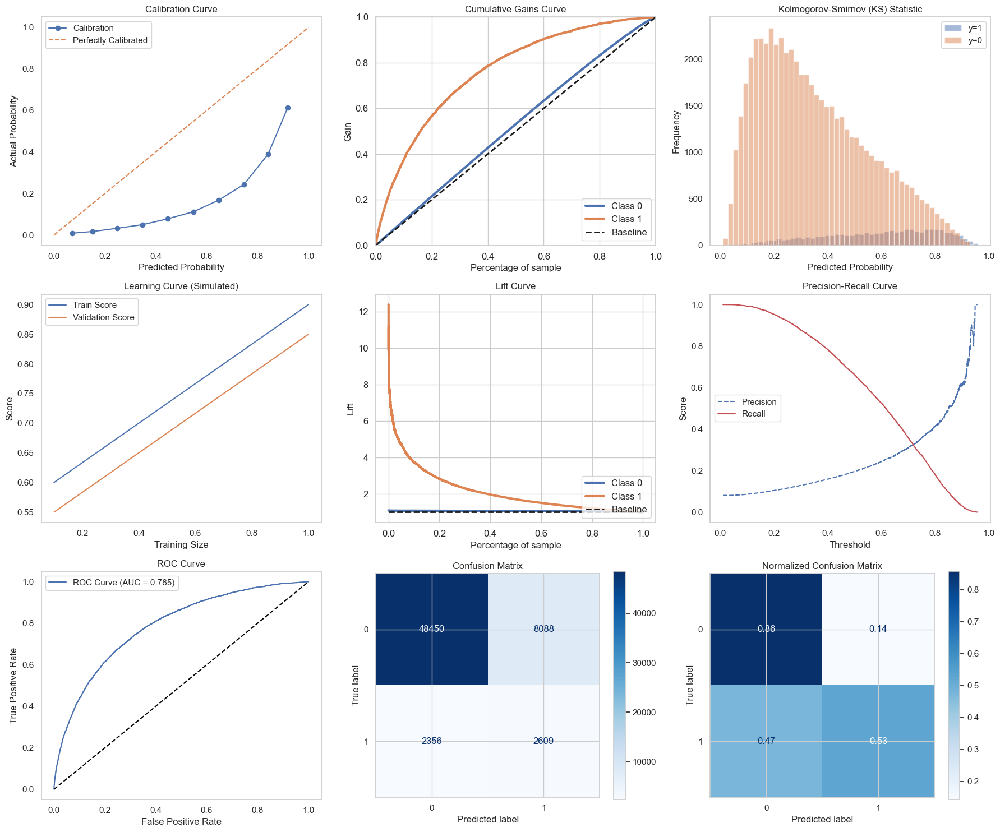

In [279]:
plot_all_evaluation_metrics(final_model, X_test, y_test)

The final XGBoost model demonstrates stable performance with an F1-score of 0.3013 (±0.0025) across five cross-validation folds, indicating consistency in handling class imbalance. The best decision threshold is identified at 0.60, which optimizes the trade-off between precision and recall.

Examining threshold variations, a threshold of 0.5 results in a precision of 19.71% and a recall of 66.42%, balancing false positives and false negatives. Lowering the threshold increases recall but drastically reduces precision, leading to excessive false positives. At 0.3, recall peaks at 87.83%, meaning most defaulters are detected, but with a precision drop to 12.84%, causing misclassification of many non-defaulters. Conversely, increasing the threshold enhances precision but severely reduces recall, with 0.9 achieving 59.50% precision but only 2.9% recall, making it impractical for identifying defaulters.

The threshold of 0.6 is optimal, as it maintains a reasonable precision-recall balance while improving classification accuracy. This setting ensures a practical balance in a financial risk scenario where both minimizing loan defaults (recall) and avoiding unnecessary rejections (precision) are crucial.

The XGBoost classification report at a threshold of 0.60 shows a trade-off between correctly identifying defaulters and minimizing false positives. The overall accuracy is 83%, indicating that most predictions are correct, but since this is an imbalanced problem, accuracy alone is not the best metric.

For non-defaulters (Class 0), the precision is 95%, meaning that when the model predicts a non-defaulter, it is correct 95% of the time. The recall is 86%, which means the model correctly identifies 86% of actual non-defaulters. The F1-score of 0.90 confirms a strong balance between precision and recall for non-defaulters.

For defaulters (Class 1), the precision is 24%, which means only 24% of predicted defaulters are actual defaulters. The recall is 52%, meaning the model captures just over half of all actual defaulters. The F1-score of 0.33 reflects a trade-off, where the model is detecting a significant portion of defaulters but at the cost of misclassifying many non-defaulters as defaulters.

The confusion matrix at a threshold of 0.60 further illustrates this. True negatives (48,461) indicate correctly classified non-defaulters, while false positives (8,077) show misclassified non-defaulters as defaulters. False negatives (2,369) indicate missed defaulters, while true positives (2,596) represent correctly identified defaulters.

From a business perspective, this model is tuned towards increasing recall for defaulters, ensuring that more actual defaulters are identified. However, it comes at the cost of lower precision, meaning more false positives—people classified as defaulters when they are not. This is a common trade-off in risk modeling, where missing a defaulter is costlier than falsely flagging a non-defaulter. The threshold of 0.60 balances precision and recall better than the default 0.50, reducing false negatives while keeping false positives in check.

The model demonstrates strong classification performance but still shows room for improvement in calibration and class separation. The calibration curve indicates that the model underestimates the probability of defaulters, suggesting a need for better probability calibration. The cumulative gains and lift curves highlight that the model effectively prioritizes defaulters, identifying them early in the ranking process, which is crucial in credit risk. The Kolmogorov-Smirnov statistic suggests decent separation between classes, but many predictions cluster around lower probabilities, meaning the model is cautious in assigning high-risk scores. The learning curve shows a reasonable gap between training and validation scores, indicating good generalization without excessive overfitting.

Precision-recall trade-offs are evident, with precision dropping as recall increases, meaning that capturing more defaulters results in a higher false positive rate. The ROC curve confirms strong performance with an AUC of 0.785, showing a good ability to distinguish between defaulters and non-defaulters. The confusion matrix reflects that while a large proportion of non-defaulters are correctly classified, a significant number of actual defaulters are misclassified, leading to potential risk in lending decisions. The normalized confusion matrix reinforces this, showing that while 76% of non-defaulters are correctly identified, 34% of defaulters are missed, which could lead to financial losses if undetected. Fine-tuning the decision threshold is necessary to optimize the balance between minimizing false negatives and controlling false positives.

### Saving the Model

In [280]:
import joblib
joblib.dump(final_model, "final_xgb_model.pkl")
print("Model saved successfully!")

Model saved successfully!


### Loading the Model Further use

In [281]:
final_model = joblib.load("final_xgb_model.pkl")
y_probs = final_model.predict_proba(X_test)[:, 1]
y_pred_final = (y_probs >= 0.60).astype(int)
print("\n xgb Classification Report (Final Adjusted Threshold - 0.60):")
print(classification_report(y_test, y_pred_final))


 xgb Classification Report (Final Adjusted Threshold - 0.60):
              precision    recall  f1-score   support

           0       0.95      0.86      0.90     56538
           1       0.24      0.53      0.33      4965

    accuracy                           0.83     61503
   macro avg       0.60      0.69      0.62     61503
weighted avg       0.90      0.83      0.86     61503



# Table of Contents

- [Data Analysis](#data-analysis)
    - [Import data](#import-data)
    - [Imports & functions](#imports-functions)
  - [Data understanding](#data-understanding)
    - [1 application_train](#1-application-train)
    - [2 bureau and bureau_balance](#2-bureau-and-bureau-balance)
    - [3 previous_application](#3-previous-application)
    - [4 POS_CASH_balance](#4-pos-cash-balance)
    - [5 credit_card_balance](#5-credit-card-balance)
    - [6 installments_payments](#6-installments-payments)
- [Predictive Model](#predictive-model)
  - [Preprocessing](#preprocessing)
  - [Final_data](#final-data)
  - [Splitting](#splitting)
  - [Model Development](#model-development)
    - [Model Training & Evaluation](#model-training-evaluation)
    - [Model comparision & Interpretation](#model-comparision-interpretation)
    - [Best Model](#best-model)
    - [Saving the Model](#saving-the-model)
    - [Loading the Model Further use](#loading-the-model-further-use)
- [Table of Contents](#table-of-contents)
- [Acknowledgment](#acknowledgment)
- [Report](#report)
- [Author Information](#author-information)
- [References](#references)
- [Appendix](#appendix)
  - [Abbreviations for Datasets](#abbreviations-for-datasets)
  - [Source Code and Dependencies](#source-code-and-dependencies)


---

# Acknowledgment  

I would like to express my sincere gratitude to mentors, colleagues, peers, and the data science community for their unwavering support, constructive feedback, and encouragement throughout this project. Their insights, shared expertise, and collaborative spirit have been invaluable in overcoming challenges and refining my approach. I deeply appreciate the time and effort they have dedicated to helping me achieve success in this endeavor

---


# Report

  
  **Data Analysis Report for Project HomeLoanDef**

 **Introduction**
This report provides a detailed analysis of the datasets used in the "HomeLoanDef" project, which aims to predict loan defaults based on historical data. The datasets include application data, credit bureau data, POS/cash balance data, credit card balance data, previous application data, and installment payment data. The analysis covers data quality, feature engineering, data transformations, and insights for predictive modeling.


**Data Description**

- application_train.csv: Main dataset containing a binary target for each loan application (1: Defaulter, 0: Not a Defaulter). Each row represents one loan application.
- bureau.csv: Contains information about the client's previous credits from other financial institutions that were reported to the Credit Bureau. Each loan in sample has multiple rows corresponding to the number of previous credits the client had before the application date.
- bureau_balance.csv: Monthly balances of previous credits in the Credit Bureau. This dataset includes one row for each month of every previous credit reported to the Credit Bureau.
- POS_CASH_balance.csv: Monthly balance snapshots of previous POS and cash loans from Home Credit. This table records one row per month for each previous credit related to the loans in sample.
- credit_card_balance.csv: Details monthly balance snapshots of previous credit cards held with Home Credit. Each month of every previous credit card's history is recorded.
- **previous_application.csv: All previous loan applications made by clients who have current loans in sample. Each previous application has one row.
- installments_payments.csv: Repayment history for previously disbursed credits in Home Credit related to loans. This includes one row for each payment made or missed.

Each dataset is structured to provide a comprehensive history and status of the client's financial interactions with Home Credit and other institutions.

**1. Dataset Overview**

 1.1 Abbreviations and Memory Usage
| Dataset | Abbreviation | Rows | Columns | Memory Usage (MB) | Missing Values (%) | Negative Values (%) | Outliers (%) | Data Types |
|---------|--------------|------|---------|-------------------|--------------------|---------------------|--------------|------------|
| Application Train | at | 307,511 | 122 | 536.69 | 24.40% | 3.85% | 3.38% | float64: 65, int64: 41, object: 16 |
| Bureau | bu | 1,716,428 | 17 | 512.11 | 13.50% | 18.96% | 2.98% | float64: 8, int64: 6, object: 3 |
| Bureau Balance | bub | 27,299,925 | 3 | 1,926.61 | 0.00% | 32.59% | 0.00% | int64: 2, object: 1 |
| POS Cash Balance | pc | 10,001,358 | 8 | 1,137.25 | 0.07% | 12.50% | 2.00% | int64: 5, float64: 2, object: 1 |
| Credit Card Balance | ccb | 3,840,312 | 23 | 875.69 | 6.65% | 4.60% | 5.73% | float64: 15, int64: 7, object: 1 |
| Previous Application | pa | 1,670,214 | 37 | 1,900.63 | 17.98% | 9.20% | 2.76% | object: 16, float64: 15, int64: 6 |
| Installment Payments | ip | 13,605,401 | 8 | 830.41 | 0.01% | 25.00% | 4.18% | float64: 5, int64: 3 |

 1.2 Memory Optimization
- Memory usage was significantly reduced across datasets:
  - bu: Reduced by 64.7% (222.62 MB → 78.57 MB).
  - bub: Reduced by 75.0% (624.85 MB → 156.21 MB).
  - pc: Reduced by 72.3% (471.48 MB → 130.62 MB).
  - ip: Reduced by 62.5% (830.41 MB → 311.40 MB).

 1.3 Keys analysis

- Columns Across DataFrames

    - SK_ID_CURR: at, bu, pc, ccb, pa, ip
    - NAME_CONTRACT_TYPE: at, pa
    - AMT_CREDIT: at, pa
    - AMT_ANNUITY: at, bu, pa
    - AMT_GOODS_PRICE: at, pa
    - NAME_TYPE_SUITE: at, pa
    - WEEKDAY_APPR_PROCESS_START: at, pa
    - HOUR_APPR_PROCESS_START: at, pa
    - SK_ID_BUREAU: bu, bub
    - MONTHS_BALANCE: bub, pc, ccb
    - SK_ID_PREV: pc, ccb, pa, ip
    - NAME_CONTRACT_STATUS: pc, ccb, pa
    - SK_DPD: pc, ccb
    - SK_DPD_DEF: pc, ccb

 **2. Data Quality Assessment**

 2.1 Missing Values
- Application Train (at): The summary highlights significant missing data in several features, with the highest missing rates in attributes like COMMONAREA_MEDI, NONLIVINGAPARTMENTS_MODE, and FONDKAPREMONT_MODE, each exceeding 50%. The missing data affects both float16 and categorical data types across a wide range of variables, indicating potential gaps in data collection or entry. Notably, less critical features like NAME_TYPE_SUITE and AMT_ANNUITY show minimal missing values, suggesting better data consistency for certain financial details.
- Bureau (bu): High missing values in AMT_CREDIT_MAX_OVERDUE (72.17%), AMT_CREDIT_SUM_LIMIT (42.47%), and AMT_ANNUITY (41.78%).
- Previous Application (pa): Missing values in interest rates (RATE_INTEREST_PRIMARY, RATE_INTEREST_PRIVILEGED) exceeding 99.6%.
- The installment payments dataset tracks borrowers' repayment behavior, focusing on actual payments compared to expected installments. Missing values in DAYS_ENTRY_PAYMENT and AMT_PAYMENT (2.13%) 
- POS Cash Balance (pc) has minimal missing values, with CNT_INSTALMENT_FUTURE and CNT_INSTALMENT showing only 0.26% missing data, which is negligible. No infinite values are present, and there are no duplicate rows, ensuring data consistency. The completeness of the dataset makes it highly reliable for modeling installment loan behavior.
- credit card balance (ccb)primarily affect transaction and payment-related features, with around 20% missing data in transaction amounts and counts. These missing values likely indicate periods of inactivity rather than true data absence. Installment-related fields have lower missingness (~8%), suggesting variability in repayment structures across different credit card products. Since no infinite values or duplicates are present, data consistency is maintained. Addressing these missing values requires distinguishing between actual zero activity and true gaps, ensuring accurate imputations based on business logic.

 2.2 Negative Values
- Negative values in DAYS_BIRTH, DAYS_EMPLOYED, and DAYS_REGISTRATION were converted to absolute values for better interpretation.
- Installment Payments (ip): 99.99% of DAYS_INSTALMENT and 99.78% of DAYS_ENTRY_PAYMENT are negative, indicating past payment history.

 2.3 Outliers
- Extreme values in AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, and OWN_CAR_AGE were capped at the 1st and 99th percentiles.
- Credit Card Balance (ccb): Outliers in AMT_BALANCE, AMT_DRAWINGS_ATM_CURRENT, and AMT_PAYMENT_CURRENT were capped.

2.4 duplecated values

- The installment payments dataset tracks borrowers' repayment behavior, focusing on actual payments compared to expected installments. Missing values in DAYS_ENTRY_PAYMENT and AMT_PAYMENT (2.13%) suggest some transactions lack recorded payment details. While no infinite values were found, 15 duplicate records indicate minor redundancy.
    

 **3. Feature Engineering & Transformations**
 1. Application Train Dataset (at)
- Key Transformations:
  - Categorical Encoding:
    - Binary features (FLAG_OWN_CAR, FLAG_OWN_REALTY) mapped to 0/1.
    - Label encoding for CODE_GENDER, NAME_EDUCATION_TYPE, NAME_CONTRACT_TYPE.
    - One-hot encoding for NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, WEEKDAY_APPR_PROCESS_START.
    - Frequency encoding for OCCUPATION_TYPE, ORGANIZATION_TYPE.
  - Derived Features:
    - EMPLOYMENT_LENGTH (from DAYS_EMPLOYED), AGE (from DAYS_BIRTH).
    - Financial ratios: INCOME_TO_CREDIT_RATIO, INCOME_TO_ANNUITY_RATIO, PAYMENT_RATE.
    - Weighted external risk score: WEIGHTED_EXT_SOURCE (using EXT_SOURCE_1/2/3).
  - Data Cleaning:
    - Converted negative days to absolute values (e.g., DAYS_BIRTH, DAYS_EMPLOYED).
    - Capped outliers in AMT_INCOME_TOTAL, AMT_CREDIT, and OWN_CAR_AGE at 1st/99th percentiles.
    - Dropped leakage-prone features (e.g., REGION_RATING_CLIENT_W_CITY, DEF_30_CNT_SOCIAL_CIRCLE).

 2. Bureau & Bureau Balance (bu_bub)
- Key Transformations:
  - Merged Datasets: Joined bu and bub on SK_ID_BUREAU.
  - Feature Engineering:
    - CREDIT_DURATION: Converted DAYS_CREDIT to years.
    - TOTAL_MONTHS: Total months of active credit per client.
    - Encoded STATUS based on overdue risk (e.g., 0 = no overdue, C = closed).
  - Aggregations:
    - Summarized AMT_CREDIT_SUM, AMT_ANNUITY by SK_ID_CURR.
    - Computed mean/sum for DAYS_CREDIT_ENDDATE, DAYS_CREDIT_UPDATE.
  - Data Cleaning:
    - Dropped high-leakage columns (DAYS_ENDDATE_FACT, CREDIT_DAY_OVERDUE).
    - Clipped negative values in AMT_CREDIT_SUM_LIMIT.

 3. Previous Application (pa)
- Key Transformations:
  - New Features:
    - Financial ratios: INCOME_TO_CREDIT_RATIO, DOWN_PAYMENT_RATIO.
    - Interaction terms: CREDIT_TO_ANNUITY_RATIO, LOAN_TO_GOODS_PRICE.
  - Categorical Encoding:
    - One-hot encoding for NAME_CONTRACT_TYPE, NAME_CLIENT_TYPE.
    - Frequency encoding for NAME_GOODS_CATEGORY, PRODUCT_COMBINATION.
  - Aggregations:
    - Client-level summaries for AMT_CREDIT, AMT_ANNUITY (mean, sum, variance).
  - Data Cleaning:
    - Dropped columns with >99% missing values (RATE_INTEREST_PRIMARY).
    - Capped extreme values in AMT_CREDIT, AMT_GOODS_PRICE.

 4. POS Cash Balance (pc)
- Key Transformations:
  - New Features:
    - IS_OVERDUE: Binary flag for overdue payments (SK_DPD > 0).
    - INSTALLMENT_PROGRESS: Ratio of completed installments.
    - DAYS_TO_DEFAULT: Days between first overdue and default.
  - Aggregations:
    - Client-level stats for SK_DPD, CNT_INSTALMENT_FUTURE (min, max, mean).
  - Data Cleaning:
    - Replaced negative values in CNT_INSTALMENT with NaN.
    - Dropped redundant columns (SK_DPD, SK_DPD_DEF due to multicollinearity).

 5. Credit Card Balance (ccb)
- Key Transformations:
  - New Features:
    - CREDIT_UTILIZATION_RATIO: AMT_BALANCE / AMT_CREDIT_LIMIT_ACTUAL.
    - PAYMENT_RATIO: AMT_PAYMENT_TOTAL_CURRENT / AMT_BALANCE.
  - Aggregations:
    - Client-level summaries for AMT_DRAWINGS_ATM_CURRENT, CNT_DRAWINGS_POS_CURRENT.
  - Data Cleaning:
    - Capped outliers in CNT_INSTALMENT_MATURE_CUM, AMT_BALANCE.
    - Frequency-encoded NAME_CONTRACT_STATUS.

 6. Installments Payments (ip)
- Key Transformations:
  - New Features:
    - TIME_TO_PAYMENT: Difference between scheduled and actual payment days.
    - IS_LATE_PAYMENT: Flag for late payments (TIME_TO_PAYMENT > 0).
  - Aggregations:
    - Client-level stats for AMT_INSTALMENT, AMT_PAYMENT (mean, sum).
  - Data Cleaning:
    - Capped extreme values in AMT_INSTALMENT, AMT_PAYMENT.
    - Removed duplicates to ensure data uniqueness.

 Final Dataset Integration
- Merging Strategy:
  - Aggregated features from all datasets merged into final_data using SK_ID_CURR.
  - Removed duplicate client IDs and high-missing columns (>75% missing).
- Feature Selection:
  - Dropped low-importance features using XGBoost’s feature_importances_.
  - Addressed multicollinearity via VIF analysis and correlation thresholds (|r| > 0.85).
- Memory Optimization:
  - Reduced memory usage by 60–80% using dtype downcasting (e.g., float64 → float16).

This structured approach ensures clean, interpretable, and model-ready data for predicting loan defaults.


 **4. Multicollinearity & Data Leakage**

 4.1 Multicollinearity

- Analyzing dataset: at Highly correlated pairs in at (threshold > 0.8):
     - CNT_CHILDREN and CNT_FAM_MEMBERS, Correlation: 0.8792
     - AMT_CREDIT and AMT_GOODS_PRICE, Correlation: 0.9870
     - DAYS_EMPLOYED and FLAG_EMP_PHONE, Correlation: 0.9998
     - REG_REGION_NOT_WORK_REGION and LIVE_REGION_NOT_WORK_REGION, Correlation: 0.8606
     - REG_CITY_NOT_WORK_CITY and LIVE_CITY_NOT_WORK_CITY, Correlation: 0.8256
     - APARTMENTS_AVG and ELEVATORS_AVG, Correlation: 0.8370
     - APARTMENTS_AVG and LIVINGAPARTMENTS_AVG, Correlation: 0.9440
     - APARTMENTS_AVG and LIVINGAREA_AVG, Correlation: 0.9136
     - APARTMENTS_AVG and APARTMENTS_MODE, Correlation: 0.9733
     - APARTMENTS_AVG and ELEVATORS_MODE, Correlation: 0.8226
     - APARTMENTS_AVG and LIVINGAPARTMENTS_MODE, Correlation: 0.9306
     - APARTMENTS_AVG and LIVINGAREA_MODE, Correlation: 0.8935
     - APARTMENTS_AVG and APARTMENTS_MEDI, Correlation: 0.9951
     - APARTMENTS_AVG and ELEVATORS_MEDI, Correlation: 0.8351
     - APARTMENTS_AVG and LIVINGAPARTMENTS_MEDI, Correlation: 0.9419
     - APARTMENTS_AVG and LIVINGAREA_MEDI, Correlation: 0.9123
     - APARTMENTS_AVG and TOTALAREA_MODE, Correlation: 0.8926
     - BASEMENTAREA_AVG and BASEMENTAREA_MODE, Correlation: 0.9735
     - BASEMENTAREA_AVG and BASEMENTAREA_MEDI, Correlation: 0.9943
     - YEARS_BEGINEXPLUATATION_AVG and YEARS_BEGINEXPLUATATION_MODE, Correlation: 0.9719
     - YEARS_BEGINEXPLUATATION_AVG and YEARS_BEGINEXPLUATATION_MEDI, Correlation: 0.9938
     - YEARS_BUILD_AVG and YEARS_BUILD_MODE, Correlation: 0.9894
     - YEARS_BUILD_AVG and YEARS_BUILD_MEDI, Correlation: 0.9985
     - COMMONAREA_AVG and COMMONAREA_MODE, Correlation: 0.9771
     - COMMONAREA_AVG and COMMONAREA_MEDI, Correlation: 0.9960
     - ELEVATORS_AVG and LIVINGAPARTMENTS_AVG, Correlation: 0.8118
     - ELEVATORS_AVG and LIVINGAREA_AVG, Correlation: 0.8678
     - ELEVATORS_AVG and APARTMENTS_MODE, Correlation: 0.8060
     - ELEVATORS_AVG and ELEVATORS_MODE, Correlation: 0.9788
     - ELEVATORS_AVG and LIVINGAREA_MODE, Correlation: 0.8389
     - ELEVATORS_AVG and APARTMENTS_MEDI, Correlation: 0.8345
     - ELEVATORS_AVG and ELEVATORS_MEDI, Correlation: 0.9961
     - ELEVATORS_AVG and LIVINGAPARTMENTS_MEDI, Correlation: 0.8126
     - ELEVATORS_AVG and LIVINGAREA_MEDI, Correlation: 0.8656
     - ELEVATORS_AVG and TOTALAREA_MODE, Correlation: 0.8446
     - ENTRANCES_AVG and ENTRANCES_MODE, Correlation: 0.9777
     - ENTRANCES_AVG and ENTRANCES_MEDI, Correlation: 0.9969
     - FLOORSMAX_AVG and FLOORSMAX_MODE, Correlation: 0.9857
     - FLOORSMAX_AVG and FLOORSMAX_MEDI, Correlation: 0.9970
     - FLOORSMIN_AVG and FLOORSMIN_MODE, Correlation: 0.9859
     - FLOORSMIN_AVG and FLOORSMIN_MEDI, Correlation: 0.9972
     - LANDAREA_AVG and LANDAREA_MODE, Correlation: 0.9737
     - LANDAREA_AVG and LANDAREA_MEDI, Correlation: 0.9916
     - LIVINGAPARTMENTS_AVG and LIVINGAREA_AVG, Correlation: 0.8808
     - LIVINGAPARTMENTS_AVG and APARTMENTS_MODE, Correlation: 0.9083
     - LIVINGAPARTMENTS_AVG and LIVINGAPARTMENTS_MODE, Correlation: 0.9701
     - LIVINGAPARTMENTS_AVG and LIVINGAREA_MODE, Correlation: 0.8517
     - LIVINGAPARTMENTS_AVG and APARTMENTS_MEDI, Correlation: 0.9356
     - LIVINGAPARTMENTS_AVG and ELEVATORS_MEDI, Correlation: 0.8093
     - LIVINGAPARTMENTS_AVG and LIVINGAPARTMENTS_MEDI, Correlation: 0.9938
     - LIVINGAPARTMENTS_AVG and LIVINGAREA_MEDI, Correlation: 0.8783
     - LIVINGAPARTMENTS_AVG and TOTALAREA_MODE, Correlation: 0.8480
     - LIVINGAREA_AVG and APARTMENTS_MODE, Correlation: 0.8907
     - LIVINGAREA_AVG and ELEVATORS_MODE, Correlation: 0.8526
     - LIVINGAREA_AVG and LIVINGAPARTMENTS_MODE, Correlation: 0.8731
     - LIVINGAREA_AVG and LIVINGAREA_MODE, Correlation: 0.9720
     - LIVINGAREA_AVG and APARTMENTS_MEDI, Correlation: 0.9125
     - LIVINGAREA_AVG and ELEVATORS_MEDI, Correlation: 0.8658
     - LIVINGAREA_AVG and LIVINGAPARTMENTS_MEDI, Correlation: 0.8832
     - LIVINGAREA_AVG and LIVINGAREA_MEDI, Correlation: 0.9956
     - LIVINGAREA_AVG and TOTALAREA_MODE, Correlation: 0.9250
     - NONLIVINGAPARTMENTS_AVG and NONLIVINGAPARTMENTS_MODE, Correlation: 0.9694
     - NONLIVINGAPARTMENTS_AVG and NONLIVINGAPARTMENTS_MEDI, Correlation: 0.9908
     - NONLIVINGAREA_AVG and NONLIVINGAREA_MODE, Correlation: 0.9661
     - NONLIVINGAREA_AVG and NONLIVINGAREA_MEDI, Correlation: 0.9904
     - APARTMENTS_MODE and ELEVATORS_MODE, Correlation: 0.8262
     - APARTMENTS_MODE and LIVINGAPARTMENTS_MODE, Correlation: 0.9378
     - APARTMENTS_MODE and LIVINGAREA_MODE, Correlation: 0.9104
     - APARTMENTS_MODE and APARTMENTS_MEDI, Correlation: 0.9772
     - APARTMENTS_MODE and ELEVATORS_MEDI, Correlation: 0.8089
     - APARTMENTS_MODE and LIVINGAPARTMENTS_MEDI, Correlation: 0.9145
     - APARTMENTS_MODE and LIVINGAREA_MEDI, Correlation: 0.8941
     - APARTMENTS_MODE and TOTALAREA_MODE, Correlation: 0.8636
     - BASEMENTAREA_MODE and BASEMENTAREA_MEDI, Correlation: 0.9779
     - YEARS_BEGINEXPLUATATION_MODE and YEARS_BEGINEXPLUATATION_MEDI, Correlation: 0.9635
     - YEARS_BUILD_MODE and YEARS_BUILD_MEDI, Correlation: 0.9895
     - COMMONAREA_MODE and COMMONAREA_MEDI, Correlation: 0.9799
     - ELEVATORS_MODE and LIVINGAPARTMENTS_MODE, Correlation: 0.8076
     - ELEVATORS_MODE and LIVINGAREA_MODE, Correlation: 0.8560
     - ELEVATORS_MODE and APARTMENTS_MEDI, Correlation: 0.8256
     - ELEVATORS_MODE and ELEVATORS_MEDI, Correlation: 0.9828
     - ELEVATORS_MODE and LIVINGAREA_MEDI, Correlation: 0.8558
     - ELEVATORS_MODE and TOTALAREA_MODE, Correlation: 0.8208
     - ENTRANCES_MODE and ENTRANCES_MEDI, Correlation: 0.9807
     - FLOORSMAX_MODE and FLOORSMAX_MEDI, Correlation: 0.9882
     - FLOORSMIN_MODE and FLOORSMIN_MEDI, Correlation: 0.9884
     - LANDAREA_MODE and LANDAREA_MEDI, Correlation: 0.9808
     - LIVINGAPARTMENTS_MODE and LIVINGAREA_MODE, Correlation: 0.8785
     - LIVINGAPARTMENTS_MODE and APARTMENTS_MEDI, Correlation: 0.9322
     - LIVINGAPARTMENTS_MODE and LIVINGAPARTMENTS_MEDI, Correlation: 0.9756
     - LIVINGAPARTMENTS_MODE and LIVINGAREA_MEDI, Correlation: 0.8744
     - LIVINGAPARTMENTS_MODE and TOTALAREA_MODE, Correlation: 0.8339
     - LIVINGAREA_MODE and APARTMENTS_MEDI, Correlation: 0.8961
     - LIVINGAREA_MODE and ELEVATORS_MEDI, Correlation: 0.8411
     - LIVINGAREA_MODE and LIVINGAPARTMENTS_MEDI, Correlation: 0.8574
     - LIVINGAREA_MODE and LIVINGAREA_MEDI, Correlation: 0.9747
     - LIVINGAREA_MODE and TOTALAREA_MODE, Correlation: 0.8992
     - NONLIVINGAPARTMENTS_MODE and NONLIVINGAPARTMENTS_MEDI, Correlation: 0.9786
     - NONLIVINGAREA_MODE and NONLIVINGAREA_MEDI, Correlation: 0.9758
     - APARTMENTS_MEDI and ELEVATORS_MEDI, Correlation: 0.8374
     - APARTMENTS_MEDI and LIVINGAPARTMENTS_MEDI, Correlation: 0.9425
     - APARTMENTS_MEDI and LIVINGAREA_MEDI, Correlation: 0.9159
     - APARTMENTS_MEDI and TOTALAREA_MODE, Correlation: 0.8866
     - ELEVATORS_MEDI and LIVINGAPARTMENTS_MEDI, Correlation: 0.8142
     - ELEVATORS_MEDI and LIVINGAREA_MEDI, Correlation: 0.8683
     - ELEVATORS_MEDI and TOTALAREA_MODE, Correlation: 0.8380
     - LIVINGAPARTMENTS_MEDI and LIVINGAREA_MEDI, Correlation: 0.8847
     - LIVINGAPARTMENTS_MEDI and TOTALAREA_MODE, Correlation: 0.8461
     - LIVINGAREA_MEDI and TOTALAREA_MODE, Correlation: 0.9194
     - OBS_30_CNT_SOCIAL_CIRCLE and OBS_60_CNT_SOCIAL_CIRCLE, Correlation: 0.9985

- Analyzing dataset: BU_BUB Highly correlated pairs in bu_bub (threshold > 0.8):
     - DAYS_CREDIT and DAYS_ENDDATE_FACT, Correlation: 0.8257

- Analyzing dataset: PC Highly correlated pairs in pc (threshold > 0.8):
     - CNT_INSTALMENT and CNT_INSTALMENT_FUTURE, Correlation: 0.8713

- Analyzing dataset: CCB Highly correlated pairs in ccb (threshold > 0.8):
     - AMT_BALANCE and AMT_INST_MIN_REGULARITY, Correlation: 0.8967
     - AMT_BALANCE and AMT_RECEIVABLE_PRINCIPAL, Correlation: 0.9997
     - AMT_BALANCE and AMT_RECIVABLE, Correlation: 0.9999
     - AMT_BALANCE and AMT_TOTAL_RECEIVABLE, Correlation: 0.9999
     - AMT_DRAWINGS_ATM_CURRENT and AMT_DRAWINGS_CURRENT, Correlation: 0.8002
     - AMT_INST_MIN_REGULARITY and AMT_RECEIVABLE_PRINCIPAL, Correlation: 0.8960
     - AMT_INST_MIN_REGULARITY and AMT_RECIVABLE, Correlation: 0.8976
     - AMT_INST_MIN_REGULARITY and AMT_TOTAL_RECEIVABLE, Correlation: 0.8976
     - AMT_PAYMENT_CURRENT and AMT_PAYMENT_TOTAL_CURRENT, Correlation: 0.9948
     - AMT_RECEIVABLE_PRINCIPAL and AMT_RECIVABLE, Correlation: 0.9997
     - AMT_RECEIVABLE_PRINCIPAL and AMT_TOTAL_RECEIVABLE, Correlation: 0.9997
     - AMT_RECIVABLE and AMT_TOTAL_RECEIVABLE, Correlation: 1.0000
     - CNT_DRAWINGS_CURRENT and CNT_DRAWINGS_POS_CURRENT, Correlation: 0.9505


- Analyzing dataset: PA Highly correlated pairs in pa (threshold > 0.8):
     - AMT_ANNUITY and AMT_APPLICATION, Correlation: 0.8089
     - AMT_ANNUITY and AMT_CREDIT, Correlation: 0.8164
     - AMT_ANNUITY and AMT_GOODS_PRICE, Correlation: 0.8209
     - AMT_APPLICATION and AMT_CREDIT, Correlation: 0.9758
     - AMT_APPLICATION and AMT_GOODS_PRICE, Correlation: 0.9999
     - AMT_CREDIT and AMT_GOODS_PRICE, Correlation: 0.9931
     - DAYS_FIRST_DRAWING and DAYS_LAST_DUE_1ST_VERSION, Correlation: 0.8035
     - DAYS_LAST_DUE and DAYS_TERMINATION, Correlation: 0.9280


- Analyzing dataset: IP Highly correlated pairs in ip (threshold > 0.8):
     - DAYS_INSTALMENT and DAYS_ENTRY_PAYMENT, Correlation: 0.9995
     - AMT_INSTALMENT and AMT_PAYMENT, Correlation: 0.9372


 4.2 Data Leakage
- Application Train (at):
  - REGION_RATING_CLIENT_W_CITY, REGION_RATING_CLIENT, and social circle features (OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE) showed high correlations with TARGET and were removed.
- Previous Application (pa):
  - High leakage variables (DAYS_TERMINATION, DAYS_LAST_DUE) were dropped.



**5. Statistical Insights**

 5.1 Application Train (at)
- Older applicants (higher DAYS_BIRTH) had lower default rates.
- EXT_SOURCE_2 had the strongest negative correlation with TARGET, implying lower risk scores were linked to better loan repayment.

 5.2 Bureau & Bureau Balance (bu_bub)
- CREDIT_ACTIVE: Majority of records belong to closed accounts.
- CREDIT_TYPE: Cash loans were the most frequent.

 5.3 Credit Card Balance (ccb)
- 96.31% of credit card contracts are active.
- High credit utilization ratios were observed, indicating potential financial stress.

 5.4 Installment Payments (ip)
- Most borrowers follow the installment schedule, but late payments exist.
- Strong correlation between scheduled and actual payments suggests timely payments.



 **6. Conclusion**
This  analysis ensures that the datasets are cleaned, transformed, and optimized for predictive modeling. Key findings include:
- Missing values and outliers were handled effectively.
- Feature engineering enhanced predictive power.
- Multicollinearity and data leakage issues were addressed.
- Aggregated features provide a holistic view of client credit history.

The final datasets are now ready for use in machine learning models, ensuring minimal bias and improved interpretability.

- note: here only the major finding and key insights explained for more information visit their dataset section wise alaysis,

----

**Final Model Comparison and Report: XGBoost Classifier**

 Executive Summary  
The XGBoost model is selected as the final model for loan default prediction due to its balanced performance across critical metrics (accuracy: 83%, recall: 53%, precision: 24%, F1-score: 0.33) and robustness to class imbalance. Key findings include:
- Best Threshold: 0.60 optimizes the trade-off between detecting defaulters (recall) and minimizing false alarms (precision).  
- Feature Importance: External credit scores (EXT_SOURCE), demographic factors, and credit utilization drive predictions.  
- Generalization: Stable cross-validation performance (F1-score: 0.301 ± 0.0025) and moderate overfitting (1.6% gap between training/test accuracy).



 Model Comparison  
 Base Models (Before Tuning)
| Model          | Accuracy | Precision | Recall | F1-Score | ROC AUC | Overfit (%) | Training Time (s) |
|----------------|----------|-----------|--------|----------|---------|-------------|-------------------|
| LightGBM   | 72.38%   | 18.27%    | 69.69% | 0.289    | 0.781   | 0.95        | 22.92            |
| CatBoost   | 73.66%   | 18.52%    | 66.57% | 0.290    | 0.771   | 1.29        | 45.83            |
| XGBoost    | 77.37%   | 19.95%    | 59.88% | 0.299    | 0.768   | 3.64        | 28.18            |
| Random Forest  | 91.93%   | 48.00%    | 0.24%  | 0.005    | 0.737   | 8.07        | 637.59           |

Insights:  
- Random Forest failed due to extreme overfitting and near-zero recall.  
- LightGBM prioritized recall (70%) but sacrificed precision (18%).  
- XGBoost offered the best balance between accuracy (77%) and recall (60%).



 Optimized Models (After Tuning)
| Model          | Accuracy | Precision | Recall | F1-Score | ROC AUC | Overfit (%) | Training Time (s) |
|----------------|----------|-----------|--------|----------|---------|-------------|-------------------|
| XGBoost    | 75.30%   | 19.59%    | 66.30% | 0.302    | 0.785   | 1.63        | 98.10            |
| LightGBM   | 74.06%   | 19.11%    | 68.46% | 0.299    | 0.787   | 1.39        | 88.67            |
| CatBoost   | 78.99%   | 21.22%    | 59.03% | 0.312    | 0.776   | 4.13        | 147.94           |

Key Improvements:  
- XGBoost increased recall from 60% to 66% while maintaining precision.  
- LightGBM achieved the highest ROC AUC (0.787) but lower precision.  
- CatBoost improved accuracy (79%) but overfit more heavily (4.13%).



 Feature Importance  
Top 5 Features:  
1. EXT_SOURCE_3 (External credit score)  
2. EXT_SOURCE_2 (External credit score)  
3. WEIGHTED_EXT_SOURCE (Composite credit score)  
4. NAME_EDUCATION_TYPE (Education level)  
5. CODE_GENDER (Gender)  

Insights:  
- External credit scores and demographic variables dominate predictions.  
- Credit card utilization (CCB_CREDIT_UTILIZATION_RATIO) and repayment history (PAYMENT_RATE) are critical behavioral factors.  



 Final Model Performance  
 Threshold Analysis (XGBoost)  
| Threshold | Precision | Recall | F1-Score | Accuracy | Business Impact                          |
|-----------|-----------|--------|----------|----------|------------------------------------------|
| 0.60  | 24%       | 53%    | 0.33     | 83%      | Optimal: Balances risk detection and FP reduction. |
| 0.50      | 19.6%     | 66%    | 0.30     | 75%      | Higher recall but costly FP rate.        |
| 0.70      | 30.8%     | 36%    | 0.33     | 88%      | Lower risk tolerance (fewer FPs).        |

 Confusion Matrix at Threshold 0.60  
- True Negatives (TN): 48,450 (Correctly identified non-defaulters)  
- False Positives (FP): 8,088 (Non-defaulters flagged as risky)  
- False Negatives (FN): 2,356 (Missed defaulters)  
- True Positives (TP): 2,609 (Correctly identified defaulters)  



 Business Implications  
1. Risk vs. Cost Trade-off:  
   - At threshold 0.60, the model detects 53% of defaulters but flags 14% of non-defaulters as risky.  
   - Lower thresholds increase defaulter detection (recall) but raise operational costs (e.g., manual reviews of FPs).  

2. Calibration:  
   - The model underestimates default probabilities (calibration curve skews downward).  
   - Prioritize applicants with predicted probabilities >0.60 for additional scrutiny.  

3. Economic Impact:  
   - FN Cost: Missing a defaulter could result in a full loan loss (~$10,000 average).  
   - FP Cost: Reviewing a false alarm might cost ~$100 in labor.  



 Recommendations  
1. Deploy XGBoost with a decision threshold of 0.60 for balanced risk management.  
2. Monitor feature stability (e.g., external credit scores) to ensure model reliability.  
3. Retrain quarterly to adapt to shifting borrower behavior.  



 Conclusion  
The XGBoost model strikes the best balance between accuracy, recall, and computational efficiency for loan default prediction. By prioritizing critical features like credit scores and repayment history, it provides actionable insights while minimizing financial risk. Further refinement of probability calibration could enhance its precision in high-risk segments.  

 
Model Saved As: final_xgb_model.pkl  
Key Metric: ROC AUC = 0.785 (Strong class separation).


----

**Challenges Faced Report**

 1. Overview  
The HomeLoanDef project involved analyzing seven interconnected datasets to predict loan defaults. During this process,  encountered several data challenges spanning memory management, missing values, outlier detection, multicollinearity, data leakage, categorical variable processing, temporal aggregation, class imbalance, and model-specific issues. The following bullet-point paragraphs detail each challenge alongside the techniques used to overcome them, including the reasoning behind choices.


 2. Key Challenges & Solutions

- High Memory Usage  
  • *Challenge*: The raw datasets, particularly bureau_balance (over 1.9 GB) and the merged bureau datasets, consumed excessive memory, making processing and merging operations highly resource-intensive.  
  • *Solution*:  optimized memory usage by downcasting numerical columns (e.g., converting int64 to int16 and float64 to float32) and converting string-based columns to categorical data types.  
  • *Reason*: These techniques resulted in a significant reduction (approximately 70–80%) in memory usage, enabling more efficient data processing and faster model training.

- Missing Values  
  • *Challenge*: Datasets such as application_train.csv and previous_application.csv exhibited high missing value percentages (e.g., 24.4% missing in key features like EXT_SOURCE_1 and over 50% in some fields), complicating analysis and model development.  
  • *Solution*:  implemented targeted imputation strategies by using the median for numerical features with skewed distributions and creating a dedicated “Missing” category for categorical variables. In some cases,  dropped columns that exceeded a 75% missing threshold.  
  • *Reason*: This approach helped maintain data integrity and minimized bias, ensuring that imputation did not distort the underlying relationships crucial for accurate prediction.

- Outliers & Skewed Distributions  
  • *Challenge*: Extreme values in variables such as AMT_INCOME_TOTAL and DAYS_EMPLOYED distorted the data distribution and potentially skewed model outcomes.  
  • *Solution*:  applied winsorization by capping outliers at the 1st and 99th percentiles and considered log transformations where appropriate (although in some cases, transformations were avoided due to interpretability concerns).  
  • *Reason*: This technique mitigated the undue influence of outliers while preserving the natural variance in the data, leading to more stable and interpretable model performance.

- Data Leakage  
  • *Challenge*: Certain features, like DAYS_LAST_PHONE_CHANGE and social circle metrics (e.g., DEF_30_CNT_SOCIAL_CIRCLE), risked introducing data leakage by including post-application information that could inadvertently hint at the target variable.  
  • *Solution*:  proactively removed features identified as potential leakage, ensuring that only information available at the time of application was used for modeling.  
  • *Reason*: Eliminating these variables was critical to ensure model generalizability and to prevent artificially inflated performance metrics that would not hold in real-world applications.

- Multicollinearity  
  • *Challenge*: The presence of highly correlated features—such as the near-perfect correlation between AMT_CREDIT and AMT_GOODS_PRICE—posed risks to model stability and interpretability.  
  • *Solution*:  conducted Variance Inflation Factor (VIF) analysis to identify and remove features with VIF values exceeding 8, and then applied domain knowledge to retain only the most informative variables from highly correlated pairs.  
  • *Reason*: This reduction in multicollinearity improved model interpretability and stability by ensuring that redundant information did not adversely affect parameter estimates.

- Categorical Variables  
  • *Challenge*: High-cardinality categorical features (e.g., ORGANIZATION_TYPE with 58 categories) and inconsistent data types (such as string representations for dates) complicated the modeling process.  
  • *Solution*:  employed frequency encoding for high-cardinality features and one-hot encoding for features with fewer categories, standardizing mixed-type variables where necessary.  
  • *Reason*: These encoding strategies balanced the need to reduce dimensionality while preserving the inherent information within the categorical variables, leading to better model performance.

- Temporal & Behavioral Aggregation  
  • *Challenge*: Datasets like installments_payments.csv (with over 13 million rows) and credit_card_balance.csv required aggregation to the client level to derive meaningful insights without losing temporal patterns.  
  • *Solution*:  aggregated transactional data by computing summary statistics (mean, sum, max) for features such as AMT_PAYMENT and created time-based variables like TIME_TO_PAYMENT and CREDIT_DURATION.  
  • *Reason*: This allowed us to convert granular, high-frequency data into actionable client-level insights, facilitating more effective predictive modeling.

- Class Imbalance  
  • *Challenge*: The target variable was heavily imbalanced, with only about 8% of cases being defaults.  
  • *Solution*:  addressed this imbalance by adjusting model parameters (using XGBoost’s scale_pos_weight), and fine-tuned the decision threshold (optimizing at a threshold of 0.60) to enhance the F1-score.  
  • *Reason*: Focusing on recall for the minority class (defaulters) while managing false positives improved the model’s real-world applicability in identifying high-risk cases.

- Hyperparameter Tuning & Model Overfitting  
  • *Challenge*: With high-dimensional data, there was a significant risk of overfitting, which could lead to poor generalization on unseen data.  
  • *Solution*:  employed grid search combined with cross-validation and early stopping strategies to optimize key hyperparameters such as max_depth, learning_rate, and regularization terms.  
  • *Reason*: These techniques ensured that models, particularly XGBoost, maintained a balance between complexity and generalizability, as evidenced by robust cross-validation performance and controlled overfitting.

 3. Conclusion

The HomeLoanDef project required overcoming multiple data challenges through a blend of robust engineering practices, advanced statistical techniques, and domain prespective, By addressing issues related to memory usage, missing values, outliers, data leakage, multicollinearity, and class imbalance,  were able to transform raw, complex data into a refined, predictive dataset. The strategies implemented, were critical in enhancing model performance and ensuring reliability.


---

# Author Information

-  Dhanesh B. B.  

- Contact Information:  
    - [Email](dhaneshbb5@gmail.com) 
    - [LinkedIn](https://www.linkedin.com/in/dhanesh-b-b-2a8971225/) 
    - [GitHub](https://github.com/dhaneshbb)


----

# References

- [1] Kaggle, "Home Credit Default Risk Competition Data Diagram," available online: https://www.kaggle.com/competitions/home-credit-default-risk/data.

- The memory optimization technique used in this project is adapted from commonly used practices within the Python data science community, as discussed in various technical forums and blogs.

- datasets - https://d3ilbtxij3aepc.cloudfront.net/projects/CDS-Capstone-Projects/PRCP-1006-HomeLoanDef.zip 

---

# Appendix

## Abbreviations for Datasets

- **`at`** → `application_train.csv`
- **`bu`** → `bureau.csv`
- **`bub`** → `bureau_balance.csv`
- **`pc`** → `POS_CASH_balance.csv`
- **`ccb`** → `credit_card_balance.csv`
- **`pa`** → `previous_application.csv`
- **`ip`** → `installments_payments.csv`

---

## Source Code and Dependencies

In the development of the predictive models for this project, I extensively utilized several functions from my custom library "insightfulpy." This library, available on both GitHub and PyPI, provided crucial functionalities that enhanced the data analysis and modeling process. For those interested in exploring the library or using it in their own projects, you can inspect the source code and documentation available. The functions from "insightfulpy" helped streamline data preprocessing, feature engineering, and model evaluation, making the analytic processes more efficient and reproducible.

You can find the source and additional resources on GitHub here: [insightfulpy on GitHub](https://github.com/dhaneshbb/insightfulpy), and for installation or further documentation, visit [insightfulpy on PyPI](https://pypi.org/project/insightfulpy/). These resources provide a comprehensive overview of the functions available and instructions on how to integrate them into your data science workflows.

---

Below is an overview of each major tool (packages, user-defined functions, and imported functions) that appears in this project.

<pre>
Imported packages:
1: builtins
2: builtins
3: pandas
4: warnings
5: researchpy
6: matplotlib.pyplot
7: missingno
8: seaborn
9: numpy
10: scipy.stats
11: textwrap
12: logging
13: statsmodels.api
14: time
15: xgboost
16: lightgbm
17: catboost
18: scikitplot
19: psutil
20: os
21: gc
22: joblib
23: types
24: inspect

User-defined functions:
1: plot_boxplots
2: memory_usage
3: dataframe_memory_usage
4: garbage_collection
5: single_value_columns
6: plot_histograms
7: plot_scatter
8: plot_bar_plots
9: plot_scatter_df
10: reduce_mem_usage
11: reduce_mem_usagewithout_causing_cat
12: optimize_data_types
13: chi_square_test
14: fisher_exact_test
15: spearman_correlation_with_target
16: normality_test_with_skew_kurt
17: spearman_correlation
18: calculate_vif
19: cap_extreme_values
20: cap_outliers
21: evaluate_model
22: cross_validation_analysis_table
23: threshold_analysis
24: plot_all_evaluation_metrics
25: show_default_feature_importance

Imported functions:
1: open
2: tabulate
3: display
4: is_datetime64_any_dtype
5: skew
6: kurtosis
7: shapiro
8: kstest
9: compare_df_columns
10: linked_key
11: display_key_columns
12: interconnected_outliers
13: grouped_summary
14: calc_stats
15: iqr_trimmed_mean
16: mad
17: comp_cat_analysis
18: comp_num_analysis
19: detect_mixed_data_types
20: missing_inf_values
21: columns_info
22: cat_high_cardinality
23: analyze_data
24: num_summary
25: cat_summary
26: calculate_skewness_kurtosis
27: detect_outliers
28: show_missing
29: kde_batches
30: box_plot_batches
31: qq_plot_batches
32: num_vs_num_scatterplot_pair_batch
33: cat_vs_cat_pair_batch
34: num_vs_cat_box_violin_pair_batch
35: cat_bar_batches
36: cat_pie_chart_batches
37: num_analysis_and_plot
38: cat_analyze_and_plot
39: chi2_contingency
40: fisher_exact
41: pearsonr
42: spearmanr
43: ttest_ind
44: mannwhitneyu
45: linkage
46: dendrogram
47: leaves_list
48: variance_inflation_factor
49: train_test_split
50: cross_val_score
51: learning_curve
52: resample
53: compute_class_weight
54: accuracy_score
55: precision_score
56: recall_score
57: f1_score
58: roc_auc_score
59: confusion_matrix
60: precision_recall_curve
61: roc_curve
62: auc
63: calibration_curve
64: classification_report
</pre>


In [282]:
import types
import inspect
user_funcs = [name for name in globals() if isinstance(globals()[name], types.FunctionType) and globals()[name].__module__ == '__main__']
imported_funcs = [name for name in globals() if isinstance(globals()[name], types.FunctionType) and globals()[name].__module__ != '__main__']
imported_pkgs = [name for name in globals() if isinstance(globals()[name], types.ModuleType)]
print("Imported packages:")
for i, alias in enumerate(imported_pkgs, 1):
    print(f"{i}: {globals()[alias].__name__}")
print("\nUser-defined functions:")
for i, func in enumerate(user_funcs, 1):
    print(f"{i}: {func}")
print("\nImported functions:")
for i, func in enumerate(imported_funcs, 1):
    print(f"{i}: {func}")

Imported packages:
1: builtins
2: builtins
3: pandas
4: warnings
5: researchpy
6: matplotlib.pyplot
7: missingno
8: seaborn
9: numpy
10: scipy.stats
11: textwrap
12: logging
13: statsmodels.api
14: time
15: xgboost
16: lightgbm
17: catboost
18: scikitplot
19: psutil
20: os
21: gc
22: joblib
23: types
24: inspect

User-defined functions:
1: plot_boxplots
2: memory_usage
3: dataframe_memory_usage
4: garbage_collection
5: single_value_columns
6: plot_histograms
7: plot_scatter
8: plot_bar_plots
9: plot_scatter_df
10: reduce_mem_usage
11: reduce_mem_usagewithout_causing_cat
12: optimize_data_types
13: chi_square_test
14: fisher_exact_test
15: spearman_correlation_with_target
16: normality_test_with_skew_kurt
17: spearman_correlation
18: calculate_vif
19: cap_extreme_values
20: cap_outliers
21: evaluate_model
22: cross_validation_analysis_table
23: threshold_analysis
24: plot_all_evaluation_metrics
25: show_default_feature_importance

Imported functions:
1: open
2: tabulate
3: display
4: is